# Prüfung CADS Immersion vom 14.4.2024 

--- Ersteller: Kristina Reisenauer ---

# Inhaltsverzeichnis <a class="anchor" id="abschnitt-0"></a>

- [Teil A: Hauspreise analysieren und einfach prognostizieren](#abschnitt-1)
    - [Aufgabe A-0](#unterabschnitt-1-1)
    - [Aufgabe A-1](#unterabschnitt-1-2)
    - [Aufgabe A-2](#unterabschnitt-1-3)
    - [Aufgabe A-3](#unterabschnitt-1-4)
    - [Aufgabe A-4](#unterabschnitt-1-5)
    - [Aufgabe A-5](#unterabschnitt-1-6)
    - [Aufgabe A-6](#unterabschnitt-1-7)
    - [Aufgabe A-7](#unterabschnitt-1-8)
- [Teil B: Prognosemodelle optimieren und Overfitting verhindern](#abschnitt-2)
    - [Aufgabe B-1](#unterabschnitt-2-1)
    - [Aufgabe B-2](#unterabschnitt-2-2)
    - [Aufgabe B-3](#unterabschnitt-2-3)
    - [Aufgabe B-4](#unterabschnitt-2-4)
    - [Aufgabe B-5](#unterabschnitt-2-5)
- [Teil C: Clustering unter Verwendung von Feuergefährdungszonen](#abschnitt-3)
    - [Aufgabe C-1](#unterabschnitt-3-1)
    - [Aufgabe C-2](#unterabschnitt-3-2)
- [Teil D: GPU-Ausführung und Vergleiche](#abschnitt-4)
    - [Aufgabe D-1](#unterabschnitt-4-1)
    - [Aufgabe D-2](#unterabschnitt-4-2)
    - [Aufgabe D-3](#unterabschnitt-4-2)

## Teil A: Hauspreise analysieren und einfach prognostizieren [70 Punkte] <a class="anchor" id="abschnitt-1"></a>
### Aufgabe A-0: Bibliotheken, Funktionen, Datenstrukturen [Lernziele 2.2 & 3.3/3.4; 2 Punkte] <a class="anchor" id="unterabschnitt-1-1"></a>

Alle für die weiteren Aufgaben benötigten Bibliotheken und Funktionen sind zentral an dieser Stelle einzubinden bzw. zu definieren. Ebenso sollen alle globalen Variablen in diesem Teil angegeben werden. Des Weiteren sollen Datenstrukturen für den Vergleich der Laufzeiten der Teile A, B und C sowie Datenstrukturen für den Vergleich der Laufzeiten und Modellgüten (RMSE) bezüglich der Validierungsstichprobe für die Modelle der Aufgaben A-7 und B-1, B-2 b) bis B-4 erstellt werden.

<u>Lösungsansatz</u>

-----------------------------------------------------------------------------------------------------------------------------------------------------------
Erstellen einer Python-Umgebung und Installieren von Dependencies.

Die nachfolgende Beschreibung geht davon aus, dass man bereits Python auf seinem Computer inkl. Anaconda installiert hat. 

Man muss nun folgendermaßen vorgehen, um eine Python-Umgebung (es wurde python 3.11 genutzt) für den nachfolgenden Code einzurichten und Abhängigkeiten über die Kommandozeile zu installieren:

1. Öffne ein Terminal oder eine Eingabeaufforderung und navigiere zu dem Verzeichnis, in dem sich Ihr Python-Projekt befindet.
2. Verwende den folgenden Befehl, um eine virtuelle Umgebung zu erstellen. 
    ```python
    conda create --name cads_immersion
    ```
3. Aktiviere die virtuelle Umgebung mit dem entsprechenden Befehl:
    ```python
    conda activate cads_immersion
    ```
4. Installiere die Abhängigkeiten aus der Datei requirements.txt (diese wurde der Abgabe beifgefügt):
    ```python
    # mithilfe von pip
    pip install -r requirements.txt
    # mithilfe von conda
    conda create --name cads_immersion --file requirements.txt
    ```
5. Man kann überprüfen, ob die Pakete installiert sind, indem man die Ausgabe im Terminal überprüft. Außerdem kann man die installierten Pakete mit dem folgenden Befehl überprüfen:
    ```python
    pip list
    ```
---------------------------------------------------------------------------------------------------------------------------

Bibliotheken importieren:

In [ ]:
!pip install seaborn==0.13.2
!pip install scikit-learn==1.4.1.post1
!pip install scikit-plot==0.3.7
!pip install scipy==1.11.4
!pip install catboost==1.2.3
!pip install geopandas==0.14.3
!pip install graphviz
!pip install ipykernel==6.29.3
!pip install keras==2.15.0
!pip install lightgbm==4.3.0
!pip install matplotlib==3.8.3
!pip install numpy==1.26.4
!pip install pandas==2.2.1
!pip install plotly==5.19.0
!pip install shapely==2.0.3
!pip install statsmodels==0.14.1
!pip install tensorflow==2.15.0
!pip install xgboost==2.0.3

In [2]:
#!pip install -r ../input/requirements/requirements_gpu.txt

In [1]:
import pandas as pd
import numpy as np
import time
import random
import subprocess

# Grafische Pakete
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import matplotlib.patches as mpatches
import plotly.express as px
from matplotlib.colors import ListedColormap

# Pakete für Lineare Modell und Statistiken
import math
import statsmodels.formula.api as smf
from scipy.stats import uniform


from sklearn.metrics import mean_squared_error, silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder, LabelEncoder
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.model_selection import RandomizedSearchCV

# Pakete für neuronale Netze
import tensorflow as tf
from tensorflow.keras.utils import set_random_seed, plot_model
from tensorflow.keras.layers import Dense, Embedding, Flatten, concatenate, InputLayer, Dropout, BatchNormalization, Activation, Input
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import regularizers, metrics
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.layers import LeakyReLU
from keras.models import clone_model

# Pakete zur Erstellung der Gradient Boosting Machines
from catboost import CatBoostRegressor
import lightgbm as lgb
import xgboost as xgb
from xgboost import plot_importance

# um geografische Datensätze einzulesen und zu bearbeiten
import geopandas as gpd

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Warnungen unterdrücken und Systemeinstellungen
import gc
import os
import warnings
warnings.filterwarnings('ignore')

Globale Variablen definieren:

In [2]:
seed = 42 # zur Replizierbarkeit von Zufallsvariablen
np.random.seed(seed)
random.seed(seed)
set_random_seed(seed)

In [3]:
# Prüfe, ob Ordner "models" und "files" vorhanden ist (zum Speichern von Ergebnissen), wenn nicht, kreiere diese
models_path = "models" # in Models werden die zusätzlchen Modelle gespeichert, deren Speicherung nicht in der Prüfung verlangt ist.
files_path = "files" 
input_path = "../input/"
for i in [models_path, files_path]:
	if not os.path.exists(i): os.makedirs(i)

print('done')

done


In [4]:
# Datenstruktur Gesamtlaufzeit
laufzeiten = {}

In [7]:
# Bild der Karte Kaliforniens
filename = "../input/input-cads/california.png"

Die nachfolgenden Strukturen wurden analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

In [6]:
# Lege ein Dictionary zum Speichern des Modellnamen, des RMSE und der Laufzeit an.
model_name = []
model_rmse = []
model_laufzeit = []
dict = {'Model name': model_name,'RMSE': model_rmse, 'Laufzeit': model_laufzeit}

Anlegen von Funktionen:

In [7]:
def plot_feature_importance(catboost_model,spaltennamen,text, figsize=(12, 6)):
    """
    Die Funktion plot_feature_importance erstellt ein Balkendiagramm zur Darstellung der Feature-Importance unter Verwendung des eingelesenen Modells.

    Parameters
    ----------
    - catboost_model: CatBoostModel
        Das trainierte CatBoost-Modell, dessen Feature-Importance dargestellt werden soll.
    - spaltennamen: list
        Eine Liste der Namen der Features, die mit den Feature-Importance-Werten übereinstimmen.
    - text: str
        Ein Text, der dem Diagrammtitel hinzugefügt werden soll.
    """
    feature_importances = catboost_model.get_feature_importance()
    sorted_feature_importances = pd.Series(feature_importances, index=spaltennamen).sort_values(ascending=True)
    sorted_feature_importances.plot(kind='barh', figsize=figsize)
    plt.title("Feature Importance: " + text)
    plt.xlabel('Importance')
    plt.ylabel('Merkmal')
    plt.show()          

In [8]:
def vergleich_modell(y_pred_modell, y_pred_null, y_obs, text, modell = 'lineare Regression'):
    """
    Die Funktion vergleich_modell erzeugt einen Scatter-Plot der die tatsächlichen gegen die beobachteten Werte plottet.
    Das Nullmodell wird als Linie berücksichtigt.
    
    Parameters
    ----------
    - y_pred_modell: np.array
        Vorhersage des Modells
    - y_pred_null: np.array
        Vorhersage des Nullmodells
    - y_obs: np.array
       beobachtete Werte für die Zielvariable
    - text: str
        Ein Text, der dem Diagrammtitel hinzugefügt werden soll.
    - modell: str
        Ein String, der das Label bestimmt. Default='lineare Regression'
    """
    plt.figure(figsize=(7,5))
    plt.scatter(y_obs, y_pred_null, label='Nullmodell', color='blue')
    plt.scatter(y_obs, y_pred_modell, label=modell, color='red')
    plt.plot([y_obs.min(), y_obs.max()], [y_obs.min(), y_obs.max()], linestyle='--', color='gray') # 45-Grad-Linie für perfekte Vorhersagen
    plt.xlabel('Tatsächliche Werte')
    plt.ylabel('Vorhergesagte Werte')
    plt.legend()
    plt.title('Vorhersagenvergleich zwischen Nullmodell und '+text)
    plt.show()

In [9]:
# Funktion zur Berechnung des RMSE
def berechne_rmse(y_wahr, y_vorhersage):
    """
    Berechnet die Wurzel des mittleren quadratischen Fehlers (RMSE) zwischen den wahren und vorhergesagten Werten.
    
    Parameters
    ----------
    y_wahr: np.array
        Die wahren Werte.
    y_vorhersage: np.array
        Die vorhergesagten Werte.

    Returns:
    --------
    RMSE: float
    Die berechnete Wurzel des mittleren quadratischen Fehlers (RMSE).
    """
    return np.sqrt(mean_squared_error(y_wahr, y_vorhersage))

In [10]:
def plot_rmse(df,x_min,x_max,text): 
    """
    Die Funktion plot_rmse erstellt ein Balkendiagramm zur Darstellung der Modellbewertung anhand der RMSE (Root Mean Squared Error) unter Verwendung der angegebenen Daten und Parameter.

    Parameters
    ----------
    - df: dict
        Ein dictionary mit den Evaluierungsergebnissen der Modelle. -> Modellnamen und RMSE sind jeweils als Listen angelegt
    - x_min: int 
        Der minimale Wert auf der x-Achse des Diagramms.
    - x_max: int
        Der maximale Wert auf der x-Achse des Diagramms.
    - text: str
        Ein Text, der dem Diagrammtitel hinzugefügt werden soll.

    Die Funktion erstellt ein Balkendiagramm mit der RMSE auf der x-Achse und dem Modellnamen auf der y-Achse. Der Titel des Diagramms wird um den angegebenen Text erweitert.
    """
    df_eval = pd.DataFrame(df)
    plt.figure(figsize=(10, 5))
    plt.title("Model evaluation (RMSE): " + text)
    sns.barplot(data = df_eval, x = "RMSE", y = "Model name")
    plt.xlim(x_min,x_max)
    plt.xlabel('RMSE')
    plt.ylabel('Modellname')
    plt.show()

In [11]:
def plot_laufzeit(df,x_min,x_max,text): 
    """
    Die Funktion plot_laufzeit erstellt ein Balkendiagramm zur Darstellung der Modelllaufzeit unter Verwendung der angegebenen Daten und Parameter.

    Parameters
    ----------
    - df: dict
        Ein dictionary mit den Laufzeiten des Fittings der Modelle. -> Modellnamen und Laufzeiten sind jeweils als Listen angelegt
    - x_min: int 
        Der minimale Wert auf der x-Achse des Diagramms.
    - x_max: int
        Der maximale Wert auf der x-Achse des Diagramms.
    - text: str
        Ein Text, der dem Diagrammtitel hinzugefügt werden soll.

    Die Funktion erstellt ein Balkendiagramm mit der LAufzeit auf der x-Achse und dem Modellnamen auf der y-Achse. Der Titel des Diagramms wird um den angegebenen Text erweitert.
    """
    df_eval = pd.DataFrame(df)
    plt.figure(figsize=(10, 5))
    plt.title(" Modellaufzeiten: " + text)
    sns.barplot(data = df_eval, x = "Laufzeit", y = "Model name")
    plt.xlim(x_min,x_max)
    plt.xlabel('Laufzeit')
    plt.ylabel('Modellname')
    plt.show()

In [12]:
# Funktionen aus dem Skript/Notebook Data Mining_final.ipynb aus dem Kurs CADS Immersion:
def get_kmeans(data, n_clusters=3):
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", n_init=10, max_iter=300, random_state=seed)
    vals = data.iloc[ :, 0:].values
    predictions = kmeans.fit_predict(StandardScaler().fit_transform(vals))
    data["cluster"] = predictions
    return data, kmeans.inertia_

Zur Berechnung der GAP-Statistik wurde der Code aus dem Skript ADS Immersion genutzt und optimiert. Hierbei wurden unter anderem folgende Änderungen vorgenommen:
* Im Kmeans Algorithmus wurde der *random_state* Parameter gesetzt, um Reproduzierbarkeit sicherzustellen. 
* Der *resultdf* wird nun mittels concat aktualisiert, da append zu einem Fehler führte. 
* Der Return Wert heißt nun *optimalK*

In [13]:
def optimalK(data, nrefs=3, maxClusters=15):
    """
    Berechnet das optimale K für KMeans mithilfe der Gap-Statistik von Tibshirani, Walther, Hastie
    Parameter:
    data: ndarray der Form (n_samples, n_features)
    nrefs: Anzahl der zu erstellenden Beispieldatensätze
    maxClusters: Maximale Anzahl von Clustern, die getestet werden sollen
    Returns: (optimalK, resultsdf)
    """
    gaps = np.zeros((len(range(1, maxClusters)),))
    resultsdf = pd.DataFrame({'clusterCount':[], 'gap':[]})
    for gap_index, k in enumerate(range(1, maxClusters)):
        # Holder for reference dispersion results
        refDisps = np.zeros(nrefs)
        # For n references, generate random sample and perform kmeans getting resulting dispersion of each loop
        for i in range(nrefs):
            # Create new random reference set
            randomReference = np.random.random_sample(size=data.shape)
            # Fit to it
            km = KMeans(n_clusters=k, random_state=seed)
            km.fit(randomReference)
            refDisp = km.inertia_
            refDisps[i] = refDisp
        # Fit cluster to original data and create dispersion
        km = KMeans(n_clusters=k, random_state=seed)
        km.fit(data)
        origDisp = km.inertia_
        # Calculate gap statistic
        gap = np.log(np.mean(refDisps)) - np.log(origDisp)
        # Assign this loop's gap statistic to gaps
        gaps[gap_index] = gap
        #resultsdf = resultsdf.append({'clusterCount':k, 'gap':gap}, ignore_index=True)
        resultsdf = pd.concat([resultsdf, pd.DataFrame({'clusterCount':[k], 'gap':[gap]})], ignore_index=True)
    optimalK = gaps.argmax() + 1 ## Plus 1 because index of 0 means 1 cluster is optimal, index 2 = 3 clusters are optimal
    return (optimalK, resultsdf)


In [16]:
# aus dem Skript/Notebook use-case-claim-frequency-modeling-python.ipynb aus dem Kurs CADS Immersion:
# Set device-parameters cpu/gpu according to the selected accelerator (Kaggle notebook option):
device_LGB = 'cpu'
device_XGB = 'cpu'
device_CatBoost = 'CPU'


# Execute the nvidia-smi command to check for NVIDIA GPUs
try:
    result = subprocess.run(['nvidia-smi'], stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    if result.returncode == 0 and 'NVIDIA' in result.stdout:
        device_LGB = 'gpu'
        device_XGB = 'cuda'
        device_CatBoost = 'GPU'
        print("NVIDIA GPU is available and supports LightGBM, XGBoost, CatBoost and TensorFlow")
    else:
         print("NVIDIA GPU is not available.")
except FileNotFoundError:
    print("nvidia-smi command not found (i.e. NVIDIA GPU is not selected, see notebook options).")

NVIDIA GPU is available and supports LightGBM, XGBoost, CatBoost and TensorFlow


In [17]:
gpus = tf.config.experimental.list_physical_devices('GPU')

if gpus:
    gpu_name ='gpu' # -> suffix für Modellnamen
    try:
        # Stelle für jede GPU eine Speicherwachstumseinstellung ein
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        # Speicherwachstum muss vor der Initialisierung der GPUs eingestellt werden
        print(e)
else: gpu_name='cpu'
# Diese Einstellung ermöglicht es TensorFlow, den benötigten GPU-Speicher dynamisch zu allokieren, anstatt zu Beginn der Programmausführung den gesamten Speicher zu belegen.

### Aufgabe A-1: Datensatz einlesen und prüfen [Lernziele 3.3/3.4; 5 Punkte]<a class="anchor" id="unterabschnitt-1-2"></a>
Der Datensatz california_housing_county_sample-de.csv enthält demografische Informationen zum US-Bundesstaat Kalifornien. Insgesamt enthält der Datensatz die folgenden 12 Merkmale:
* **latitude**: Breitengrad
* **longitude**: Längengrad
* **housing_median_age**: Median Alter der Häuser in einem Bezirk
* **total_rooms**: Anzahl der Räume in einem Bezirk
* **total_bedrooms**: Davon: Anzahl der Schlafzimmer in einem Bezirk
* **population**: Bevölkerungsanzahl in einem Bezirk
* **households**: Anzahl der Haushalte in einem Bezirk
* **median_income**: Median Einkommen in einem Bezirk
* **median_house_value**: Median Wert der Häuser in einem Bezirk
* **ocean_proximity**: Beschreibt die Nähe zum Ozean
* **county_name**: Name der Region
* **sample**: Für jede Zeile des Datensatzes entweder mit A, B oder C belegt

Es ist zu beachten, dass es sich bei den Angaben der Merkmale 3 bis 9 um aggregierte Informationen auf Bezirksebene (Wahlbezirke 1992) handelt. Die nachfolgenden Aufgaben sind der Reihe nach durchzuführen: 

##### a) Der zur Verfügung gestellte Datensatz ist einzulesen. Im Anschluss sind die Anzahl an Zeilen und Spalten sowie sieben zufällige Zeilen auszugeben.

<u>Lösungsansatz:</u>

In [18]:
start_time_A = time.time()

In [19]:
# read data
df_raw = pd.read_csv(os.path.join(input_path, f'input-cads/california_housing_county_sample-de.csv'), delimiter=';', decimal=',')
df_raw.head()

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,county_name,sample
0,32.54,-117.04,7,938,297.0,1187,282,1.2667,67500,NEAR OCEAN,San Diego,C
1,32.55,-117.09,8,6533,1217.0,4797,1177,3.9583,144400,NEAR OCEAN,San Diego,C
2,32.55,-117.06,5,3223,940.0,3284,854,1.4384,108800,NEAR OCEAN,San Diego,A
3,32.55,-117.04,15,2206,648.0,2511,648,1.6348,93200,NEAR OCEAN,San Diego,A
4,32.56,-117.12,20,2524,682.0,1819,560,2.9286,257700,NEAR OCEAN,San Diego,A


In [20]:
# Anzahl der Zeilen und Spalten:
print("Die Anzahl der Zeilen im Datensatz beträgt: ", df_raw.shape[0])
print("Die Anzahl der Spalten im Datensatz beträgt: ", df_raw.shape[1])

Die Anzahl der Zeilen im Datensatz beträgt:  20640
Die Anzahl der Spalten im Datensatz beträgt:  12


In [21]:
# Gebe 7 zufällige Zeilen aus
# df.sample(n=7) gibt 7 zufällige Zeilen aus, der Seed wird gesetzt zur Reproduzierbarkeit der Ergebnisse. Er wird im Inputbereich A0 definiert.
random_rows = df_raw.sample(n=7, random_state = seed)
print(random_rows.to_string())

       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity    county_name sample
20046     39.51    -121.56                  46         1885           385.0         871         347         1.6352               53100          INLAND          Butte      A
3024      33.77    -117.23                   5         2108           496.0        1666         461         2.0000               83000          INLAND      Riverside      A
15663     37.74    -122.50                  45         1771           349.0        1098         342         3.7552              296600      NEAR OCEAN  San Francisco      C
20484     40.78    -124.16                  43         2241           446.0         932         395         2.9038               82000      NEAR OCEAN       Humboldt      A
9814      34.20    -118.87                  26         1924           245.0         775         244         7.0010              286800 

##### b) Die Datentypen des eingelesenen Datensatzes sind auszugeben, zu prüfen und zu kommentieren. Nominale Merkmale sollen den Datentyp für Kategorien (Python: category, R: factor) erhalten. Gegebenenfalls erforderliche Anpassungen sind durchzuführen und die finalen Datentypen sind auszugeben.

<u>Lösungsansatz:</u>

In [22]:
# 1. Möglichkeit: Datentypen mithilfe von .info() anzeigen
print("Datentypen vor der Anpassung:")
print(df_raw.info())

Datentypen vor der Anpassung:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   latitude            20640 non-null  float64
 1   longitude           20640 non-null  float64
 2   housing_median_age  20640 non-null  int64  
 3   total_rooms         20640 non-null  int64  
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  int64  
 6   households          20640 non-null  int64  
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  int64  
 9   ocean_proximity     20640 non-null  object 
 10  county_name         20640 non-null  object 
 11  sample              20640 non-null  object 
dtypes: float64(4), int64(5), object(3)
memory usage: 1.9+ MB
None


In [23]:
# 2. Möglichkeit: Ausgabe der Datentypen des Originaldatensatzes mithilfe von dtypes::
print("Datentypen vor der Anpassung:")
print(df_raw.dtypes)

Datentypen vor der Anpassung:
latitude              float64
longitude             float64
housing_median_age      int64
total_rooms             int64
total_bedrooms        float64
population              int64
households              int64
median_income         float64
median_house_value      int64
ocean_proximity        object
county_name            object
sample                 object
dtype: object


In [24]:
df_raw['ocean_proximity'].unique()

array(['NEAR OCEAN', '<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY'],
      dtype=object)

In [25]:
len(df_raw['county_name'].unique())

58

Kommentierung der Datentypen:

Numerische Variablen:
* **longitude** & **latitude**: Hierbei sollte es sich um numerische Daten handeln, da es Koordinaten sind. Der Datentyp float64 passt zu den Variablen. Es muss nichts geändert werden. Längen- und Breitengrade sind typischerweise als Fließkommazahlen angegeben.
* **housing_median_age** & **total_rooms** & **population** & **households** & **median_house_value**: Diese Variablen bleiben im Datentyp int64, da sie bereits als ganze Zahlen vorliegen. Es handelt sich hierbei um metrische Werte und eine ganzzahlige Speicherung ergibt Sinn.
* **total_bedrooms**: Da diese Variable im Vergleich zu total_rooms nicht als Integer gespeichert ist, lässt sich vermuten, dass sie fehlende Werte enthält. Eine Speicherung als Zahl ergibt Sinn. Die fehlenden Werte sollten vor einer möglichen Typumwandlung behandelt werden. Die Spalte bleibt vorerst unverändert.
* **median_income**: Diese Variable ist als float64 gespeichert. Da es sich um den Median von numerischen Werten handelt, ist sie selbst ebenfalls numerisch. Der Datentyp passt zur Variablen und keine Änderungen sind vorzunehmen. Beim Einkommen handelt es sich typischerweise um eine Fließkommazahl.

Kategorielle Variablen: 

Bei den folgenden drei Variablen handelt es sich um nominale Merkmale. Sie sind qualitativ und lassen sich nicht in einer natürlichen Reihenfolge anordnen. Folglich sind sie in den Datentyp 'category' umzuwandeln.
* **ocean_proximity**: Die Nähe zum Ozean wird nicht in Metern oder Ähnlichem angegeben, sondern in fünf verschiedenen Kategorien: ['NEAR OCEAN', '<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY']. Diese lassen sich nicht ordnen, folglich ist das Merkmal in den Datentyp 'category' umzuwandeln.
* **county_name**: Es gibt 58 verschiedene Bezirke. Diese sind auch nominal und das Merkmal ist in den Datentyp 'category' umzuwandeln.
* **sample**: Diese Variable ist nominal und sollte daher in den Datentyp 'category' umgewandelt werden.

In [26]:
df = df_raw.copy()

In [27]:
# Umwandlung der kategorialen Variablen in 'category'
df['ocean_proximity'] = df['ocean_proximity'].astype('category')
df['county_name'] = df['county_name'].astype('category')
df['sample'] = df['sample'].astype('category')
# Ausgabe finaler Datentypen
print("\nFinale Datentypen:")
print(df.dtypes)


Finale Datentypen:
latitude               float64
longitude              float64
housing_median_age       int64
total_rooms              int64
total_bedrooms         float64
population               int64
households               int64
median_income          float64
median_house_value       int64
ocean_proximity       category
county_name           category
sample                category
dtype: object


In [28]:
# Ausgabe des umgewandelten Datensatzes, um die Ergebnisse optisch zu betrachten.
df.head()

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,county_name,sample
0,32.54,-117.04,7,938,297.0,1187,282,1.2667,67500,NEAR OCEAN,San Diego,C
1,32.55,-117.09,8,6533,1217.0,4797,1177,3.9583,144400,NEAR OCEAN,San Diego,C
2,32.55,-117.06,5,3223,940.0,3284,854,1.4384,108800,NEAR OCEAN,San Diego,A
3,32.55,-117.04,15,2206,648.0,2511,648,1.6348,93200,NEAR OCEAN,San Diego,A
4,32.56,-117.12,20,2524,682.0,1819,560,2.9286,257700,NEAR OCEAN,San Diego,A


##### c) Das Merkmal sample, das fest vorgegebene Stichproben für das spätere Trainieren (A), Validieren (B) und Testen (C) der Modelle definiert, ist auszuzählen und die Stichprobengrößen sind zu kommentieren.

<u>Lösungsansatz:</u>

In [29]:
# Bestimmung der Anzahl der einzelnen Werte im Merkmal sample
df['sample'].value_counts()

sample
A    14421
B     3110
C     3109
Name: count, dtype: int64

Im Merkmal *sample* gibt es 3 Werte: den Wert A, der am häufigsten vorkommt (14.421 Mal, dieser wird für das Bilden der Trainingsdaten herangezogen), den Wert B (3.110 Mal, dieser dient zur Bildung der Validierungsstichprobe) und den Wert C (3.109 Mal, für die Teststichprobe). Die Stichproben basierend auf B und C sind folglich gleich groß. Die Größen in Prozent werden nachfolgend ausgerechnet.

In [30]:
df['sample'].value_counts()/df['sample'].count()*100

sample
A    69.869186
B    15.067829
C    15.062984
Name: count, dtype: float64

Die Stichproben sind also 70% Trainingsdaten, 15% Validierungsdaten und 15% Testdaten. Dass 70% der Daten zum Trainieren der Modelle herangezogen werden, stellt eine solide Grundlage für das Erlernen von Mustern und Zusammenhängen dar. Die verbleibenden 30% der Daten sind gleichmäßig in Validierungs- und Testdaten aufgeteilt. Diese Aufteilung ermöglicht eine effektive Validierung und Anpassung der Modellparameter. Gleichzeitig bleibt eine angemessene Menge an Daten unberührt. Diese Testdaten dienen der abschließenden Bewertung der Modellperformance.

Die Aufteilung entspricht der gängigen Praxis. Ein Großteil der Daten wird zum Training genutzt. Die kleinere Menge wird zur Validierung und zum Testen verwendet, um Überanpassung zu vermeiden und die Modellgüte fair zu beurteilen.

Anhand der absoluten Werte lässt sich auch erkennen, dass in jeder Phase genügend Datenpunkte zur Verfügung stehen. Das Training findet auf circa 14.400 Datenpunkten statt. Demgegenüber stehen circa 3.100 Datenpunkte für das Validieren und die gleiche Menge für das Testen zur Verfügung. Diese Größe scheint ausreichend für Verallgemeinerungen.

Um die Trainingsdaten, Validierungsdaten und Testdaten abschließend zu beurteilen, könnte man noch auswerten, ob die Zielvariable und auch die anderen Features in den Datensätzen jeweils identisch verteilt sind. Dies könnte erreicht werden, indem man das Merkmal sample mithilfe von stratified Bootstrap erzeugt.

### Aufgabe A-2: Numerische Merkmale analysieren, aufbereiten und visualisieren [Lernziele 3.3/3.4 & 5.2; 19 Punkte]<a class="anchor" id="unterabschnitt-1-3"></a>

##### a) Für die numerische Merkmale sind mindestens die Kennzahlen count, mean, std, min/max sowie die das 25%-, 50%- und 75%-Quantil auszugeben. Zudem soll ermittelt werden, bei welchen Merkmalen fehlende Werte (und falls ja, in welcher absoluten und prozentualen Größenordnung) vorliegen.

<u>Lösungsansatz:</u>

In [31]:
# Kennzahlen für numerische Merkmale ausgeben:
print("Kennzahlen für numerische Merkmale:")
print(df.describe().to_string())

Kennzahlen für numerische Merkmale:
           latitude     longitude  housing_median_age   total_rooms  total_bedrooms    population    households  median_income  median_house_value
count  20640.000000  20640.000000        20640.000000  20640.000000    20433.000000  20640.000000  20640.000000   20640.000000        20640.000000
mean      35.631861   -119.569704           28.639486   2635.763081      537.870553   1425.476744    499.539680       3.870671       206855.816909
std        2.135952      2.003532           12.585558   2181.615252      421.385070   1132.462122    382.329753       1.899822       115395.615874
min       32.540000   -124.350000            1.000000      2.000000        1.000000      3.000000      1.000000       0.499900        14999.000000
25%       33.930000   -121.800000           18.000000   1447.750000      296.000000    787.000000    280.000000       2.563400       119600.000000
50%       34.260000   -118.490000           29.000000   2127.000000      435.00000

In [32]:
# Ermitteln fehlender Werte
percentage_missing = (df.isnull().sum() / len(df)) * 100
missing_info = pd.DataFrame({'Anzahl fehlender Werte': df.isnull().sum(), 'Anteil in Prozent': percentage_missing})
print("\nAnzahl fehlender Werte und Anteil in Prozent:")
print(missing_info)


Anzahl fehlender Werte und Anteil in Prozent:
                    Anzahl fehlender Werte  Anteil in Prozent
latitude                                 0           0.000000
longitude                                0           0.000000
housing_median_age                       0           0.000000
total_rooms                              0           0.000000
total_bedrooms                         207           1.002907
population                               0           0.000000
households                               0           0.000000
median_income                            0           0.000000
median_house_value                       0           0.000000
ocean_proximity                          0           0.000000
county_name                              0           0.000000
sample                                   0           0.000000


Das Merkmal total_bedrooms weist als einziges fehlende Werte auf. Es ist in 207 Fällen und somit 1% der Fälle fehlend.

##### b) Anhand des Datensatzes ist zu begründen und geeignet grafisch zu visualisieren, warum eine Ersetzung der fehlenden Werte bei total_bedrooms durch den Median nicht empfehlenswert ist (mindestens zwei konkrete Zeilen des Datensatzes sind als Beispiele auszugeben) und was für einen Bezug auf total_rooms spricht. Im Anschluss sind für das Feature total_bedrooms die fehlenden Werte durch den mittleren Quotienten zwischen total_bedrooms und total_rooms (berechnet auf Basis der Datensätze ohne fehlende Werte) zu ersetzen. Die Ersetzung ist geeignet zu verifizieren.

<u>Lösungsansatz:</u>

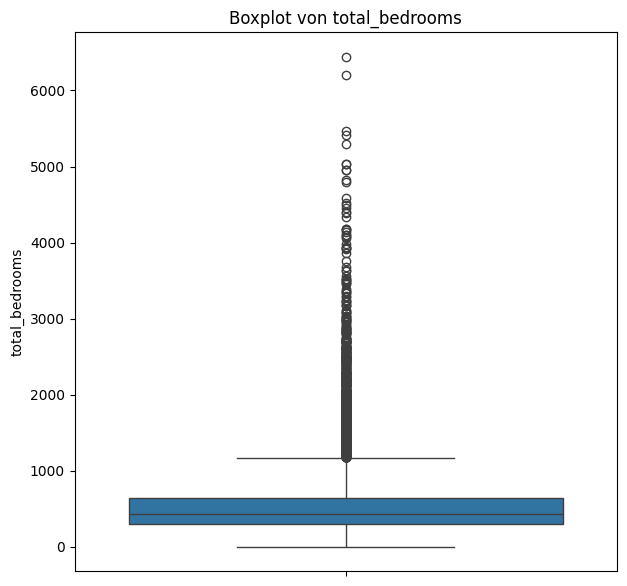

In [33]:
# Visualisierung von Total Bedrooms
# 1. Ansatz über Boxplot
plt.figure(figsize=(7, 7))
sns.boxplot(y=df['total_bedrooms'])
plt.title('Boxplot von total_bedrooms')
plt.show()

<Figure size 700x700 with 0 Axes>

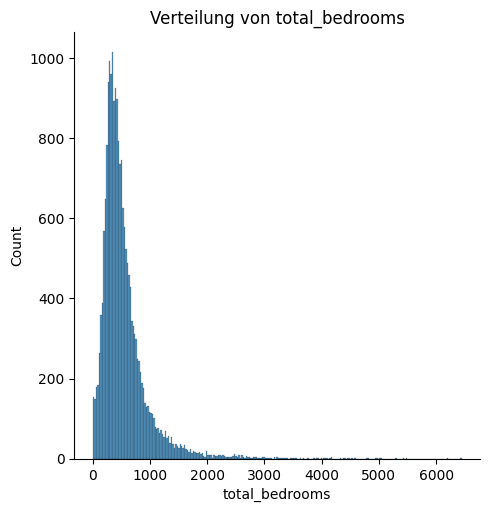

In [34]:
# Visualisierung von Total Bedrooms
# 2. Ansatz über Histogramm
plt.figure(figsize=(7, 7))
sns.displot(x=df['total_bedrooms'])
plt.title('Verteilung von total_bedrooms')
plt.show()

Es liegt keine Normalverteilung vor (sondern eine rechtsschiefe Verteilung) und Ausreißer sind vorhanden, dadurch ist die Median-Imputation nicht empfehlenswert. Der mittlere Wert der Verteilung (mode) ist kleiner als der Mittelwert. Die Ausreißer nach oben (siehe Boxplot) erhöhen den Mittelwert. 

Des Weiteren sind im vorhandenen Beispiel die Variablen *total_bedrooms* und *total_rooms* stark korreliert, das *total_bedrooms* eine Untermenge von *total_rooms* darstellt (siehe unten). Eine Imputation von *total_bedrooms* in Abhängigkeit von *total_rooms* sollte somit in Betracht gezogen werden. 

Zur Verdeutlichung werden im Folgenden zwei Zeilen au den Daten ausgewählt, in welcher *total_bedrooms* missing ist und *total_rooms* kleiner ist als der Median. In diesen Fällen ergibt diese Ersetzung keinen Sinn.

In [35]:
# Prüfe, wo bedrooms missing ist und die Anzahl aller Räume im Bezirk kleiner als der Median der Anzahl der Schlafzimmer im Bezirk ist
df[(df['total_bedrooms'].isnull())&(df['total_rooms']<df['total_bedrooms'].median())]

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,county_name,sample
8242,34.09,-117.28,44,376,NaN,273,107,2.2917,90800,INLAND,San Bernardino,A
11648,35.42,-119.11,52,154,NaN,37,16,10.0263,200000,INLAND,Kern,A
12310,36.61,-121.85,38,238,NaN,191,67,1.3897,125000,<1H OCEAN,Monterey,A
16259,37.78,-120.85,25,421,NaN,303,106,2.2679,71300,INLAND,Stanislaus,A
18004,38.17,-122.23,45,350,NaN,225,72,1.8942,216700,NEAR BAY,Napa,A


In [36]:
# Wähle zwei konkreten Zeilen vor der Imputation
print("Vor der Median Imputation:")
print(df.loc[[8242,11648], :].to_string()) 

Vor der Median Imputation:
       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity     county_name sample
8242      34.09    -117.28                  44          376             NaN         273         107         2.2917               90800          INLAND  San Bernardino      A
11648     35.42    -119.11                  52          154             NaN          37          16        10.0263              200000          INLAND            Kern      A


In [ ]:
# Median-Imputation für total_bedrooms
df['total_bedrooms_imp_med'] = df['total_bedrooms'].fillna(df['total_bedrooms'].median(skipna=True))

# Nach Imputation
print("\n Nach der Median-Imputation:")
print(df.loc[[8242,11648],:].to_string()) 


 Nach der Median-Imputation:
       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity     county_name sample  total_bedrooms_imp_med
8242      34.09    -117.28                  44          376             NaN         273         107         2.2917               90800          INLAND  San Bernardino      A                   435.0
11648     35.42    -119.11                  52          154             NaN          37          16        10.0263              200000          INLAND            Kern      A                   435.0


Durch die Medianimputation wird der Wert auf *total_bedrooms* auf 435 gesetzt. Dieser Wert ist allerdings in den zwei ausgewählten Beispielen signifikant höher als der Wert für total_rooms im Bezirk. Durch diese Imputation setzt man also den Wert für vorhandene Schlafzimmer im Bezirk auf einen höheren Wert als die Gesamtzahl der Räume im Bezirk, was keinen Sinn ergibt, da die Anzahl der Schlafzimmer eine Untermenge der Anzahl der Räume darstellen.

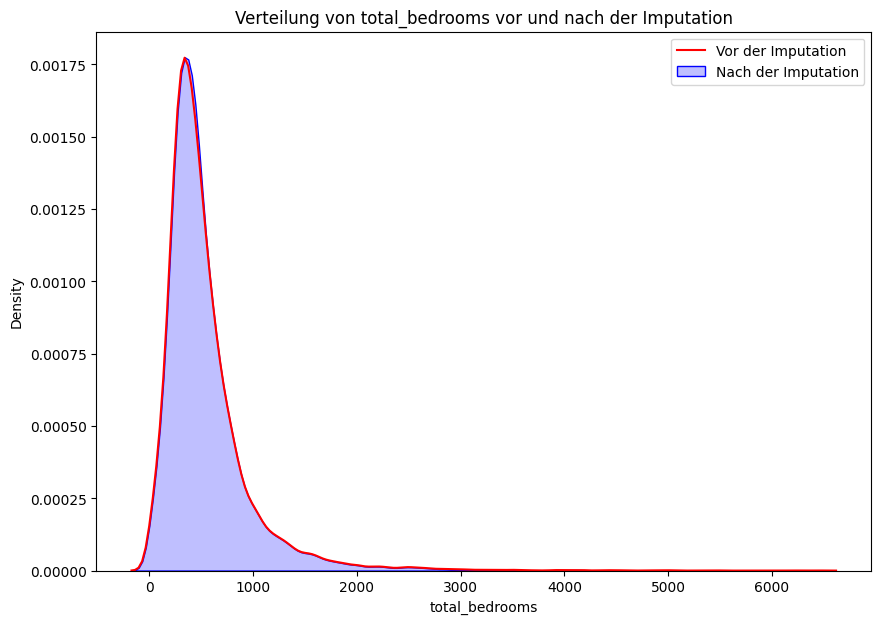

In [38]:
# Grafische Darstellung der Ersetzung auf dem Gesamtdatensatz
plt.figure(figsize=(10, 7))
sns.kdeplot(df['total_bedrooms'], fill=False, color='r', label='Vor der Imputation')
sns.kdeplot(df['total_bedrooms_imp_med'], fill=True, color='b', label='Nach der Imputation')
plt.title('Verteilung von total_bedrooms vor und nach der Imputation')
plt.legend()
plt.show()

Die Verteilung ändert sich an der Spitze minimal (durch die 1% missings). Eine Imputation sollte allerdings zur Folge haben, dass die Verteilung identisch bleibt. 
Des Weiteren wir nachfolgend die Verteilung von *total_bedrooms* gegen *total_rooms* vor und nach Imputation dargestellt. 

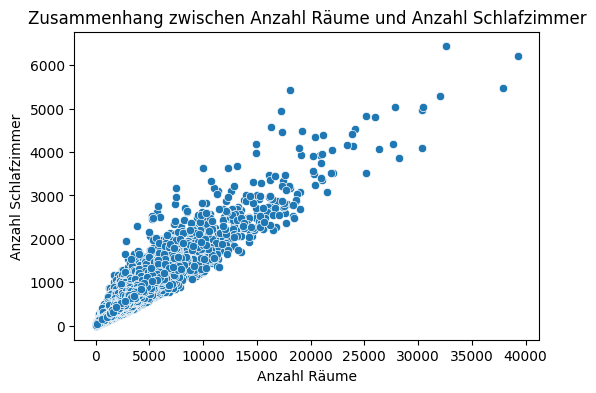

In [39]:
plt.figure(figsize=(6, 4))
sns.scatterplot(x='total_rooms', y='total_bedrooms', data=df)

plt.xlabel('Anzahl Räume')
plt.ylabel('Anzahl Schlafzimmer')
plt.title('Zusammenhang zwischen Anzahl Räume und Anzahl Schlafzimmer')

plt.show()

Man sieht eine positive Korrelation in den Variablen mit einem linearen Trend. Bezirke mit mehr Räumen haben auch mehr Schlafzimmer. 

In [40]:
# Berechnung des mittleren Quotienten zwischen total_rooms und total_bedrooms auf Basis der Datensätze ohne fehlende Werte
df_subset = df[df['total_bedrooms'].isnull() == False][['total_bedrooms','total_rooms']]
quotient = df_subset['total_bedrooms']/ df_subset['total_rooms']
mean_quotient =  quotient.mean()
print('der mittlere Quotient ist:', mean_quotient)

der mittlere Quotient ist: 0.2130388304808513


In [41]:
del df_subset # subset löschen, um Speicherplatz freizumachen

In [42]:
# Ersetzung der fehlenden Werte in total_bedrooms durch den mittleren Quotienten
df['total_bedrooms_imp_quot'] = df['total_bedrooms'].fillna(df['total_rooms'] * mean_quotient)

# Ergebnis für die 2 Beispieldatensätze
print(df.loc[[8242,11648],:].to_string())

       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity     county_name sample  total_bedrooms_imp_med  total_bedrooms_imp_quot
8242      34.09    -117.28                  44          376             NaN         273         107         2.2917               90800          INLAND  San Bernardino      A                   435.0                 80.10260
11648     35.42    -119.11                  52          154             NaN          37          16        10.0263              200000          INLAND            Kern      A                   435.0                 32.80798


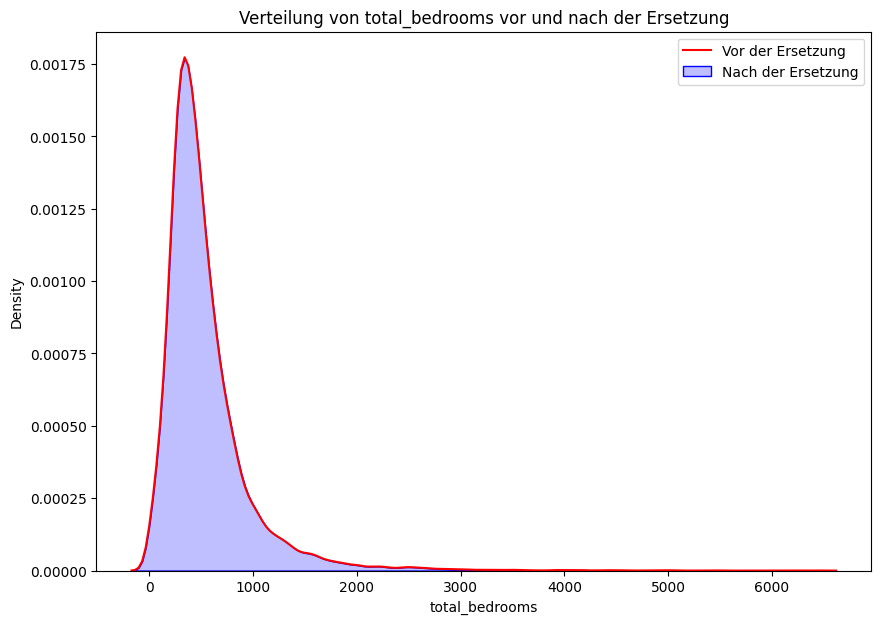

In [43]:
# Grafische Darstellung der Ersetzung auf dem Gesamtdatensatz
plt.figure(figsize=(10, 7))
sns.kdeplot(df['total_bedrooms'], fill=False, color='r', label='Vor der Ersetzung')
sns.kdeplot(df['total_bedrooms_imp_quot'], fill=True, color='b', label='Nach der Ersetzung')
plt.title('Verteilung von total_bedrooms vor und nach der Ersetzung')
plt.legend()
plt.show()

Die Verteilug bleibt vor und nach Imputation gleich.

Eine weitere Verifizierungsmöglichkeit ist die Prüfung, dass es keine negative Anzahl an Schlafzimmern gibt und auch die Anzahl der Schlafzimmer im Bezirk (*total_bedrooms*) stats kleiner ist als die Anzahl an Räumen im Bezirk (*total_rooms*)

In [44]:
df[(df['total_bedrooms_imp_quot']<0)]

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,county_name,sample,total_bedrooms_imp_med,total_bedrooms_imp_quot


In [45]:
df[(df['total_bedrooms_imp_quot']> df['total_rooms'])]

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,county_name,sample,total_bedrooms_imp_med,total_bedrooms_imp_quot


Das ist nicht der Fall, somit haben wir logische Werte für *total_bedrooms*.

Eine andere Möglichkeit, eine Imputation zu verifizieren ist die Berechnung der Korrelation der zwei Variablen vor und nach Imputation. Nachfolgend ist dies am Beispiel des Merkmals *total_rooms* gezeigt. 

In [46]:
# am Beispiel Total rooms
korrelation_vor_imputation = df['total_bedrooms'].corr(df['total_rooms'])
korrelation_nach_imputation = df['total_bedrooms_imp_quot'].corr(df['total_rooms'])

# Vergleiche
if abs(korrelation_vor_imputation-korrelation_nach_imputation)/korrelation_vor_imputation < 0.05: #wähle 5% als Signifikanzlevel
    print("Die Korrelation hat sich nicht statistisch signifikant verändert.")
else:
    print("Die Korrelation hat sich statistisch signifikant verändert.")

Die Korrelation hat sich nicht statistisch signifikant verändert.


In [47]:
#  Nutze nur imputierte Spalte für total bedrooms und lösche die anderen beiden aus dem Datensatz
df['total_bedrooms'] = df['total_bedrooms_imp_quot']
df.drop(['total_bedrooms_imp_quot','total_bedrooms_imp_med'], axis=1, inplace=True)

##### c) Zu den bereits vorhandenen Merkmalen sollen noch die folgenden Merkmale zum Datensatz hinzugefügt werden:
* bedrooms_per_house = total_bedrooms / households
* rooms_per_house = total_rooms / households

Die Berechnung ist an zwei ausgewählten Datensätzen zu demonstrieren.

<u>Lösungsansatz:</u>

In [48]:
# Berechnung der neuen Merkmale:
df['bedrooms_per_house'] = df['total_bedrooms'] / df['households']
df['rooms_per_house'] = df['total_rooms'] / df['households']

# Demonstration anhand der ersten beiden Datensätze
print('\n Berechnung der Schlafzimmer pro Haus:')
print(df[['total_bedrooms','households','bedrooms_per_house']].head(2).to_string())
print('\n Berechnung der Räume pro Haus:')
print(df[['total_rooms','households','rooms_per_house']].head(2).to_string())


 Berechnung der Schlafzimmer pro Haus:
   total_bedrooms  households  bedrooms_per_house
0           297.0         282            1.053191
1          1217.0        1177            1.033985

 Berechnung der Räume pro Haus:
   total_rooms  households  rooms_per_house
0          938         282         3.326241
1         6533        1177         5.550552


Die Schlafzimmer pro Haus werden berechnet, indem die Anzahl der Schlafzimmer im Bezirk durch die Anzahl der Haushalte dividiert wird. Für die ersten beiden Datensätze ergibt das im 1. Fall (Index 0): 297 Schlafzimmer geteilt durch 282 Haushalte = 1,05 Schlafzimmer pro Haus. Im zweiten Fall (Index 1) wird der Wert ebenfalls durch die Anzahl der Schlafzimmer (1217) durch die Anzahl der Haushalte (1177) berechnet. Er ist geringer und beträgt 1,03.

Analog findet die Berechnung der Räume pro Haus statt. Hier wird statt der Anzahl der Schlafzimmer allerdings die Anzahl der Räume im Bezirk genutzt. Es ergibt sich wie folgt: Im Fall 1 werden 938 (Anzahl Räume) durch 282 (Haushalte) geteilt. Es gibt also 3,3 Räume pro Haus. Im zweiten Fall werden die 6533 Räume durch 1177 Haushalte geteilt, woraus 5,6 Räume pro Haus resultieren.

##### d) Die numerischen Merkmale sind zusammen mit einem Kerndichteschätzer zu visualisieren und die Ausgaben zu kommentieren.

<u>Lösungsansatz:</u>

In [49]:
# bestimme alle numerischen Merkmale: Der Parameter include=['number'] stellt sicher, dass alle Spalten mit numerischen Datentyp selektiert werden
num_var = df.select_dtypes(include=['number']).columns 
print(num_var)

Index(['latitude', 'longitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'bedrooms_per_house', 'rooms_per_house'],
      dtype='object')


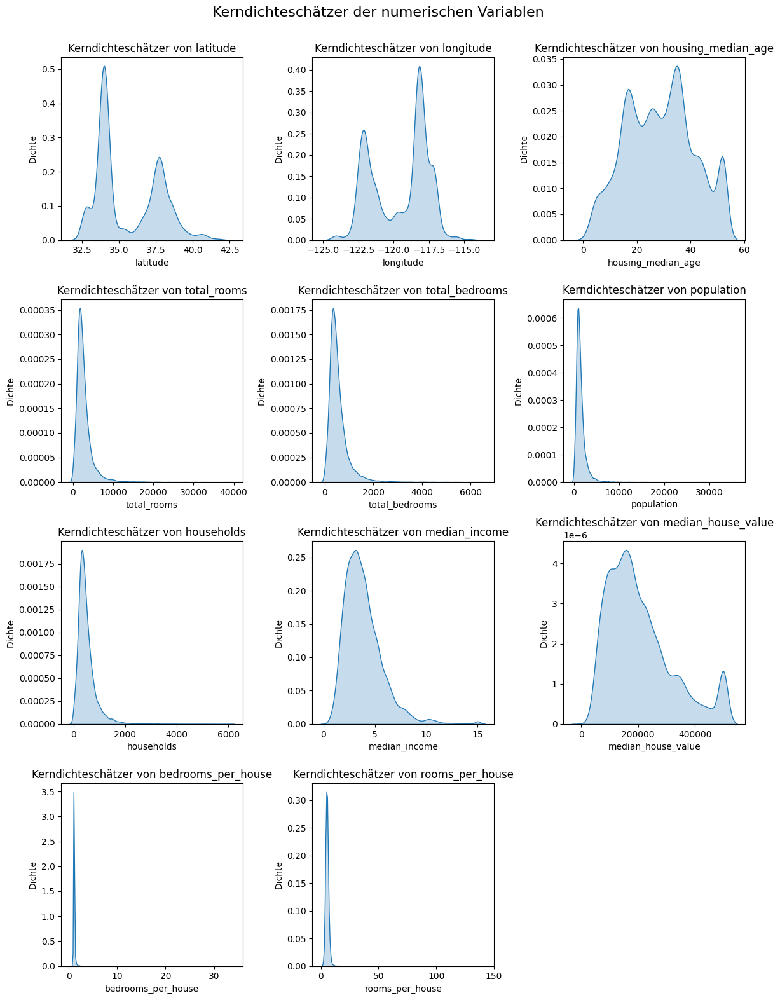

In [50]:
# Erstelle Grid für Graph
# Der finale Graph hat 3 Spalten. Die Anzahl der Reihen wird berechnet indem die Gesamtzahl durch 3 gerechnet wird und aufgerundet wird. 
num_rows = math.ceil(len(num_var) / 3)
# die enzelen graphen sollen 4x4 groß werden
fig, axes = plt.subplots(num_rows, 3, figsize=(12, num_rows * 4))
axes = axes.flatten()

plt.suptitle('Kerndichteschätzer der numerischen Variablen', fontsize=16)

# Kerndichteschätzer für jedes num. Mermal
for i, col in enumerate(num_var):
    sns.kdeplot(df[col], ax=axes[i], fill=True, label=col)
    axes[i].set_title(f'Kerndichteschätzer von {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Dichte')

# Verstecke leere subplots
for j in range(i + 1, num_rows * 3):
    fig.delaxes(axes[j])

plt.tight_layout() # durch tight_layout werden Überlappungen vermieden
plt.subplots_adjust(top=0.93) 
plt.show()

Der Voteil an Kerndichteschätzern ist, dass sich diese flexibel an die Daten anpassen und keine einheitliche Skalierung für alle Merkmale nutzen. Das Resultat ist eine glatte Kurve, die die Dichteverteilung darstellt. Dies ist möglich, ohne eine bestimmte Verteilung im Voraus annehmen zu müssen. 

In obigen Graphen sehen wir für die Merkmale die folgenden Eigenschaften: 

Longitude & Latidude:
 
* Kalifornien liegt an der Westküste der USA, er liegt zwischen dem 30° und 42° Längengrad und zwischen dem 114° und 124° Breitengrad (siehe: https://de.wikipedia.org/wiki/Kalifornien). Die Peaks in den beiden Verteilungen lassen auf bevölkerungsreiche Gebiete schlussfolgern. Um dies zu verifizieren wurden die Längen-und Breitengrade der größten Städte herausgesucht: 
    * Los Angeles: Breitengrad 34.0522° N, Längengrad 118.2437° W
    * San Diego: Breitengrad 32.7157° N, Längengrad 117.1611° W
    * San Jose: Breitengrad 37.3382° N, Längengrad 121.8863° W
    * San Francisco: Breitengrad 37.7749° N, Längengrad 122.4194° W
    * Fresno: Breitengrad 36.7372° N, Längengrad 119.7871° W
* **latitude**: Die Werte auf der x-Achse gehen von ca. 30 bis 42. Da es sich um positive Werte handelt, sind es die nördlichen Längengrade. Die Werte stimmen mit den Werten für den Staat Kalifornien überein. Die Peaks in obiger Verteilung sind bei circa 32,7° (San Diegeo), 34° (L.A.), 37.5° (San Jose, San Francisco)
* **longitude**: Die Werte gehen von circa -114 bis -125. Das Minus suggeriert, dass es sich um einen wesltichen Breitengrad handelt. Dies stimmt ebenfalls mit den Werten von Kalifornien überein. Die Peaks sind bei -122 (San Jose, San Francisco), -119,5 (Fresno), -118 (L.A.), -117 (San Diego).

andere Variablen: 

* **housing_median_age**: Die x-Achse hat Werte von 0 bis 60 Jahre. Die Verteilung zeigt diverse Peaks:  Der erste Anstieg bis zu einem Alter von etwa 20 Jahren deutet auf eine erhöhte Anzahl von Wohnhäusern in diesem Alter hin (Dichte von 0.03). Zudem gibt es einen kleineren Peak bei 25 Jahren (Dichte 0.025) und den höchste Peak bei etwa 35 Jahren (Dichte 0.035). Danach sinkt die Verteilung wieder bis zu einem Alter von etwa 50 Jahren (Dichte 0.01). Es gibt einen weiterer kleineren Peak bei etwa 55 Jahren (Dichte 0.015). Mögliche Ursachen für diese Peaks könnten historische Bauphasen sein, die zu bestimmten Zeitpunkten zu einer Häufung im Bau von Wohnhäusern führten. Darüber hinaus könnten wirtschaftliche oder demografische Faktoren eine Rolle spielen, wie z.B. Bevölkerungswachstum, Stadtentwicklung oder Immobilienspekulation. Die Daten könnten mit historischen Ereignissen oder Bauprojekten in Kalifornien verglichen werden, um die Ursachen für diese Verteilung genauer zu analysieren.

* **total_rooms** & **total_bedrooms** & **population**: Die Verteilungen der Merkmale sind rechtsschief. die x-Achse weist jeweils hohe Werte von 40000 Räumen und 6000 Schlafzimmern bzw. hohe Bevölkerungszahlen auf. Die Verteilungen zeigen schon eine Zusammenhang, in Bezirken mit einer hohen Bevälkerungsdichte gibt es viele Häuser, dadurch mehr Räume und somit auch mehr Schlafzimmer. Die Variablen sind nicht gleichverteilt in den Bezirken. Folglich wird auch für die Variable *households* eine ähnliche Verteilung erwartet.

* **households**: Auch hierliegt eine rechtsschiefe Veteilung vor. Dies lässt darauf schließen, dass die Anzahl der Haushalte in den Bezirken nicht gleichverteilt ist und es Regionen mit eine starken Bevölkerungsdichte gibt. 

* **median_income**: Die Verteilung des *median_income*, die mithilfe eines Kerndichteschätzers dargestellt wird, zeigt einen Peak bei ungefähr 4 (Dichte 0.25), die sich bis zu einem längeren Tail bis 10 erstreckt. Das Medianeinkommen ist in 10Tausend US Dollar angegeben (siehe: https://www.kaggle.com/datasets/camnugent/california-housing-prices/data, Stand 19.4.2024). Insgesamt reichen die Werte bis zu 150.000 US Dollar. Der Peak in der Verteilung deutet auf eine erhöhte Anzahl von Haushalten mit einem Einkommen in diesem Bereich hin. Die Gründe könnten hierfür bestimmte Berufe, Branchen oder demografische Gegebenheiten in den betrachteten Bezirken sein. Die Glockenform um diesen Peak herum (mit linkssteiler Verteilung) zeigt, dass eine Vielzahl von Haushalten in den betrachteten Bezirken Einkommen in diesem Bereich aufweisen, wobei einige Haushalte auch überdurchschnittlich hohe Einkommen erzielen (Tail). Die Tatsache, dass die Verteilung Werte bis zu 150.000 aufweist, deutet darauf hin, dass es auch eine Anzahl von Haushalten mit sehr hohen Einkommen in den betrachteten Bezirken gibt. Die Gründe könnten Ballungsräume, Wirtschaftslage, Bildungsniveau und demografischer Zusammensetzung der Bevölkerung sein. Zur Verifizierung könnte man externe demografische Daten zu Rate ziehen. 

* **median_house_value**: Die Verteilung zeigt eine rechtsschiefe Verteilung mit einem Peak bei ungefähr 150.000, einem längeren Tail bis 450.000 und dann wieder einem Peak bei ca. 500.000. Der Peak bei etwa 150.000 deutet darauf hin, dass eine signifikante Anzahl von Wohnhäusern in den betrachteten Bezirken einen mittleren Wert von etwa 150.000 aufweist. Dies könnte auf eine Konzentration von Wohnhäusern in einem bestimmten Preissegment oder auf eine spezifische Art von Immobilien hindeuten. Der Peak bei etwa 500.000 könnte darauf hindeuten, dass es eine erneute Konzentration von Wohnhäusern in diesem höheren Preissegment gibt, was auf bestimmte Luxusimmobilien oder begehrte Wohngegenden hindeuten könnte.Diese Werte könnte man prüfen, indem man die bestimmten Datenpunkte (falls vorhanden) mit beliebten Gegenenden (u.a. Promi-Hotspots) prüft. Die rechtsschiefe Verteilung insgesamt deutet darauf hin, dass die Mehrheit der betrachteten Wohnhäuser sich im niedrigeren bis mittleren Preissegment befindet, während es jedoch auch eine signifikante Anzahl von Wohnhäusern mit höheren Werten gibt. Die Urachen könntenan Ballungsräumen oder demografischer Stuktur liegen. Hier könnten externe Immobiliendaten zur Verifizierung herangezogen werden. 

* **bedrooms_per_house** & **rooms_per_house**: Diese zwei Variablen wurden oben selbst berechnet. Die Anzahl der Räume/Schlafzimmer wurde durch die Anzahl der Haushalte dividiert. Da bereits die Anzahl de rräume und Schlafzimmer eine ähnliche Verteilung aufweisen, sieht man dies in den zwei Merkmalen ebenso. Der Großteild er Haushalte in den Bezirken hat nur 1-2 Schlafzimmer im Schnitt und auch <10 Räume. Es gibt allerdings auch Bezirke mit über 30 Schlafzimmer und über 150 Räumen. Das dürften entweder Datenfehler sein oder Bezirke, in denen vornehmlich Villen stehen. Dies gilt mittles externer Immobiliendaten zu verifizieren und zu prüfen. 

Das Beispiel zeigt, dass der Kerndichteschätzer eine visuelle Methode zur Einschätzung der Verteilung von Daten liefert, die für explorative Datenanalysen und die Vorverarbeitung von Daten vor dem Einsatz von Methoden wichtig ist. 
Ein Nachteil der Methode liegt an der gewählten Bandbreite. Diese beeinflusst stark die Güte der Schätzung.  Wird diese zu groß gewählt, erkennt manwichtige Strukturen nicht.

##### e) Die Korrelationen der numerischen Merkmale sind zu berechnen und zu visualisieren. Im Anschluss ist auf Basis dieser Ergebnisse zu begründen, warum die Merkmale households, total_rooms, total_bedrooms und bedrooms_per_house aus dem Datensatz entfernt werden können. Das ist im Anschluss durchzuführen. Im Anschluss sind die Korrelationen der verbleibenden Merkmale erneut zu plotten.

<u>Lösungsansatz:</u>

Zunächst wir die Variable *num_var* aus der vorigen Aufgabe genutzt. Sie enthält die Namen der numerischen Variablens aus dem Datensatz.
mit der Funtkion *corr* können wir die Korrelation im Datensatz bestimmen. Das ist nachfolgend getan.

In [51]:
correlations = df[num_var].corr()
# Zur besseren Visualisierung färben wir den Hintergurnd bei den Korrelationen 
correlations.style.background_gradient(cmap='coolwarm').format("{:.2f}")

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,bedrooms_per_house,rooms_per_house
latitude,1.00,-0.92,0.01,-0.04,-0.07,-0.11,-0.07,-0.08,-0.14,0.07,0.11
longitude,-0.92,1.00,-0.11,0.04,0.07,0.10,0.06,-0.02,-0.05,0.01,-0.03
housing_median_age,0.01,-0.11,1.00,-0.36,-0.32,-0.30,-0.30,-0.12,0.11,-0.08,-0.15
total_rooms,-0.04,0.04,-0.36,1.00,0.93,0.86,0.92,0.20,0.13,0.03,0.13
total_bedrooms,-0.07,0.07,-0.32,0.93,1.00,0.88,0.98,-0.01,0.05,0.05,0.00
population,-0.11,0.10,-0.30,0.86,0.88,1.00,0.91,0.00,-0.02,-0.07,-0.07
households,-0.07,0.06,-0.30,0.92,0.98,0.91,1.00,0.01,0.07,-0.06,-0.08
median_income,-0.08,-0.02,-0.12,0.20,-0.01,0.00,0.01,1.00,0.69,-0.06,0.33
median_house_value,-0.14,-0.05,0.11,0.13,0.05,-0.02,0.07,0.69,1.00,-0.04,0.15
bedrooms_per_house,0.07,0.01,-0.08,0.03,0.05,-0.07,-0.06,-0.06,-0.04,1.00,0.85


die Heatmap wurde analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

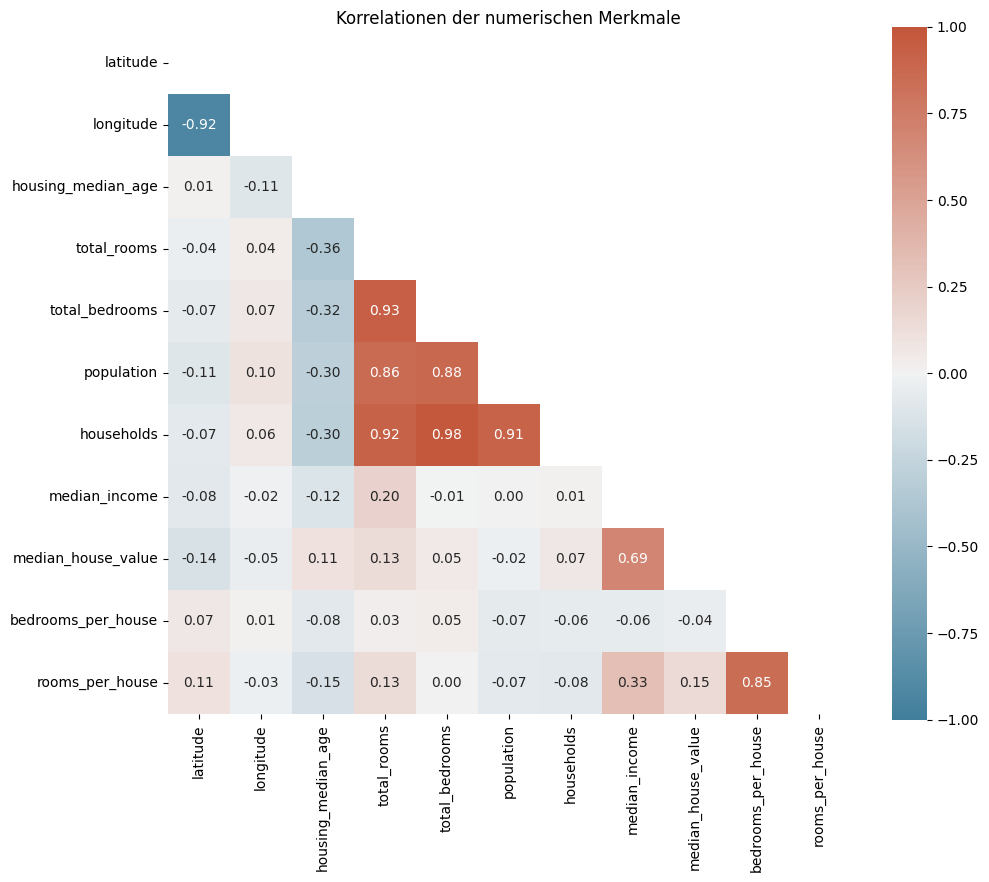

In [52]:
mask = np.triu(np.ones_like(correlations, dtype=bool)) # Maske fürs obere Dreieck

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Visualisierung der Korrelationen als Heatmap
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

sns.heatmap(correlations, mask = mask, annot=True, cmap=cmap, fmt='.2f',center=0, vmax=1, vmin=-1,
            square=True)
plt.title('Korrelationen der numerischen Merkmale')
plt.show()

Die Merkmale *households*, *total_bedrooms* und *total_rooms* sind  untereinander stark positiv korreliert. Ebenso weisen sie eine stark positive Korrelation zum Merkmal *population* auf. Das Merkmal *bedrooms_per_house* ist stark positiv korreliert mit dem Merkmal *rooms per house*. Die Merkmale sollten aufgrund ihrer hohen Korrelationen und möglicher Multikollinearität entfernt werden.

Es zeigt sich auch, dass die Merkmale *longitude* und *latitude* eine stark negative Korrelation aufweisen. Hier gilt abzuwägen, ob im späteren Modell möglichst das gesamte Land gut beschrieben werden soll (dann brauche ich ggf. beide Informationen über Längen- und Breitengrad), oder, ob ich ein möglichst einfaches Modell, welches die KPI optimiert, haben möchte.

In [53]:
# Entfernen der ausgewählten Merkmale
df.drop(['households', 'total_rooms', 'total_bedrooms', 'bedrooms_per_house'], axis=1, inplace=True)

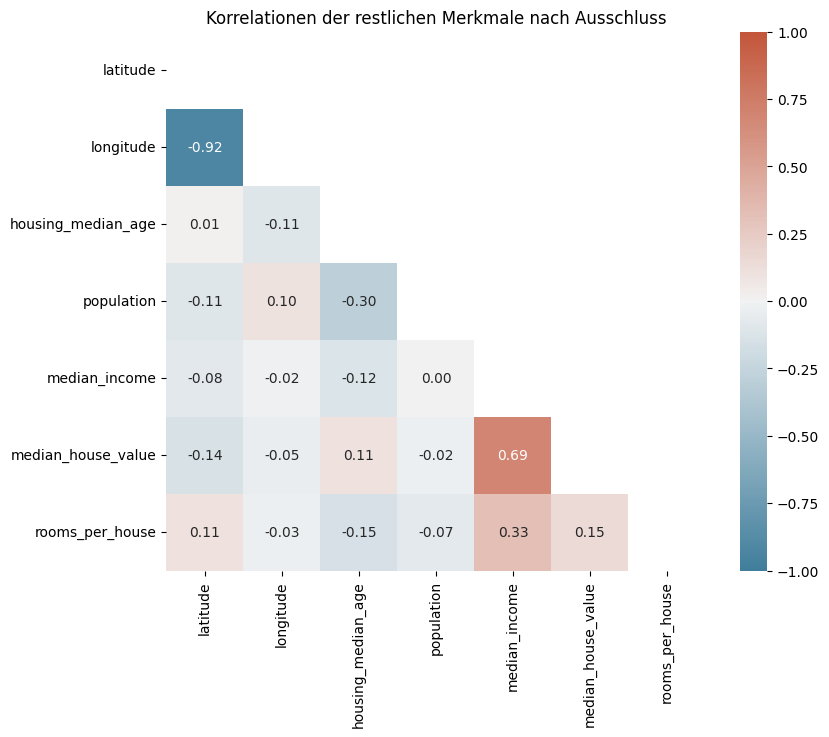

In [54]:
mask = np.triu(np.ones_like(df[[x for x in num_var if x not in ['households', 'total_rooms', 'total_bedrooms', 'bedrooms_per_house']]].corr(), dtype=bool))

# Erneutes Plotten der Korrelationen der restlichen Merkmale
f, ax = plt.subplots(figsize=(9, 7))

sns.heatmap(df[[x for x in num_var if x not in ['households', 'total_rooms', 'total_bedrooms', 'bedrooms_per_house']]].corr(), mask = mask, annot=True, cmap=cmap, fmt='.2f',center=0, 
            vmax=1, vmin=-1, square=True)
plt.title('Korrelationen der restlichen Merkmale nach Ausschluss')
plt.show()

Die Heatmap zeigt keine starken Korrelationen zwischen den numerischen Variablen (außer der hohen negativen Korrelation von *longitude* und *latitude* und der erhöhten Korrelation zwischen *median_income* und *median_house_value*) mehr. Die Gefahr der Multikollinearität liegt nicht mehr vor.
Die Vermeidung von Multikollinearität hat mehrere Gründe:
* Bei Vorliegen ist es schwer, den individuellen Einfluss jedes Merkmals auf die Zielvariable zu isolieren. 
* Die Genauigkeit der Regressionskoeffizienten wird durch Multikollinearität beeinträchtigt und deren Standardfehler größer. 
* Die Interpretation bei Multikollinearität wird schwieriger, da man nicht weiß, welches Merkmal welchen Einfluss hat. 
* Bei ML Methoden kann Multikollinearität zu Overfitting führen. 

### Aufgabe A-3: Hauspreise sowie regionale Strukturen untersuchen und visualisieren [Lernziele 3.3/3.4 & 5.2; 10 Punkte]<a class="anchor" id="unterabschnitt-1-4"></a>

##### a) Visualisieren Sie den Datensatz mit Hilfe der Karte von Kalifornien (siehe: https://github.com/ageron/handson-ml3/blob/main/02_end_to_end_ma-chine_learning_project.ipynb) und den folgenden Merkmalen:
* median_house_value
* housing_median_age
* median_income

Die Ergebnisse sind zu kommentieren und zu interpretieren.

<u>Lösungsansatz</u>

In nachfolgendem Code wird die Größe der Punkte durch die Bevölkerungszahl (*population*) bestimmt und die Farbe der Punkte repräsentiert den *median_house_value*. An der Skala auf der rechten Seite ist zu erkennen, dass dunkelblaue Punkte günstige Häuser indizieren und rote bis dunkelrote Punkte für einen hohen mittleren Häuserwert im Bezirk stehen.

In [55]:
# Download the California image
housing_renamed = df.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Bevölkerungsanzahl",
    "housing_median_age": "Median Alter der Haeuser",
    "median_income": "Median Einkommen (USD)",
    "median_house_value": "Median Wert der Haeuser (USD)"})

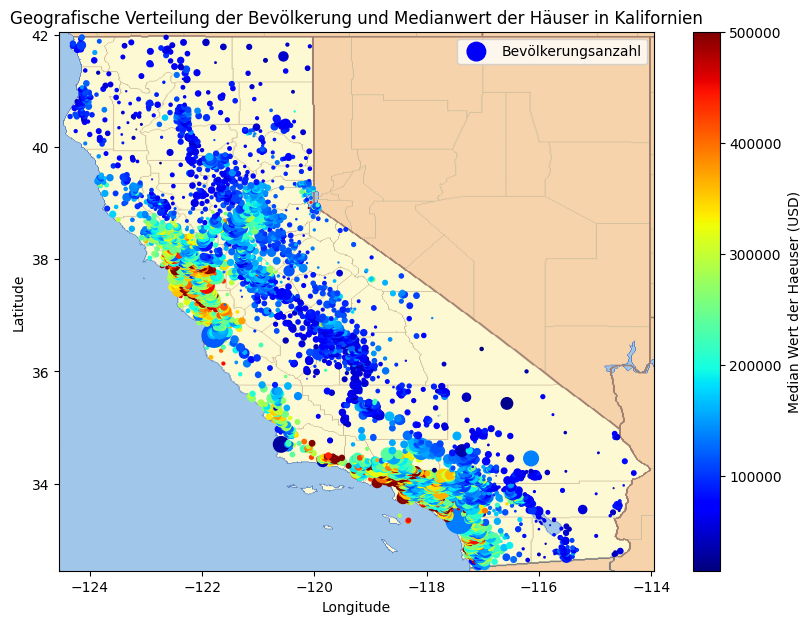

In [56]:
housing_renamed.plot(
             kind="scatter", x="Longitude", y="Latitude",
             s=housing_renamed["Bevölkerungsanzahl"] / 100, label="Bevölkerungsanzahl",
             c="Median Wert der Haeuser (USD)", cmap="jet", colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))

california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)
plt.title('Geografische Verteilung der Bevölkerung und Medianwert der Häuser in Kalifornien')
plt.show()

**Median House Value**: Höhere Werte sind in städtischen oder küstennahen Gebieten konzentriert, während niedrigere Werte im Landesinneren oder in ländlichen Gebieten zu finden sind.
Diese Beobachtung kann gestärkt werden durch den Vergleich von externen Faktoren wie Nähe zu großen Städten, historische Ereignisse oder Umweltbedingungen, die ebenfalls einen Einfluss auf die Verteilung dieser Merkmale haben könnten.

Der Vergleich mit einer Karte Kaliforniens zeigt, dass höhere Hauswerte vor allem in den teuren Städten wie San Francisco, San Jose, Sacramento, Los Angeles oder San Diego vorkommen.
(siehe: https://www.gettyimages.de/detail/illustration/map-of-california-lizenfreie-illustration/165791224?adppopup=true, Stand 19.4.2024). 

Hinsichtlich der Größe der Punkte und deren Farbe ist kein direkter Zusammenhang zu sehen. Es gibt sehr große hell- und dunkelblaue Punkte, aber auch kleine hellblaue, dunkelblaue, rote, orangene und gelbe Punkte. Die größten Punkte gibt es in Riverside, Monterey und Ventura County. Man sieht allerdings auch, dass die Datenpunkte nicht in ganz Kalifornien verteilt sind, es findet vielmehr eine Konzentration in größeren Städten statt. In einigen ländlichen Gegenden gibt es nur einzelnen Punkte (besonders an den inneren Landesgrenzen im Süden, da hier viel Wüste ist) und auf Inseln nahezu keine. Dies ist für den Modellierungszweck und bei der Modellerstellung und -interpretation zu beachten. Zusätzlich lässt sich aber erkennen, dass Daten aus allen Counties vorliegen. 

Im nächsten Code wird die Größe der Punkte durch die Bevölkerungszahl (*population*) bestimmt und die Farbe der Punkte repräsentiert den *housing_median_age*. 

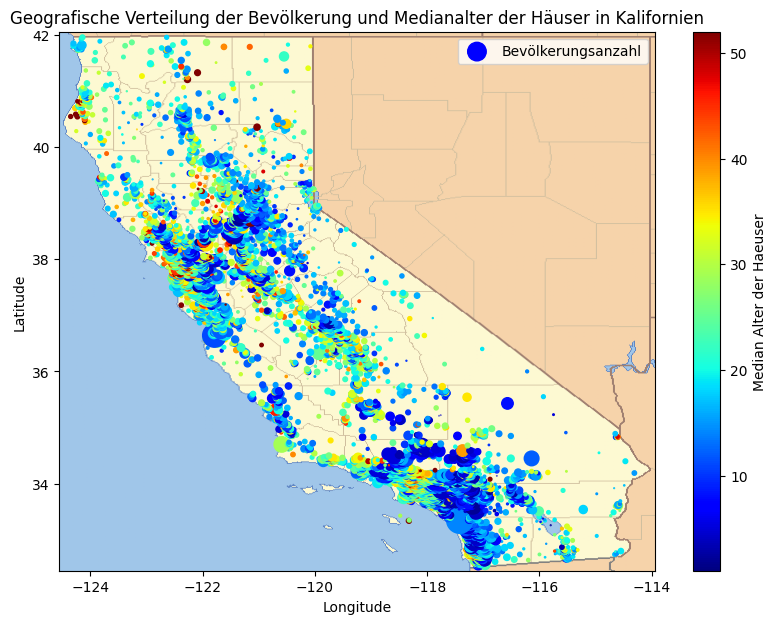

In [57]:
housing_renamed.plot(
             kind="scatter", x="Longitude", y="Latitude",
             s=housing_renamed["Bevölkerungsanzahl"] / 100, label="Bevölkerungsanzahl",
             c="Median Alter der Haeuser", cmap="jet", colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))

california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)
plt.title('Geografische Verteilung der Bevölkerung und Medianalter der Häuser in Kalifornien')
plt.show()

**Housing Median Age**: Bei diesem Merkmal lässt sich keine deutliche Unterschiedung zwischen Städten und ländlichem Raum treffen. Es ibt aber vermehrt ganz alte und ganz junge Häuser in Nachbarschaften zu den großen Städten. Ältere Häuser könnten auf etablierte Nachbarschaften hinweisen, während jüngere Gebiete auf kürzlich entwickelte Regionen hindeuten könnten.
Eine Besonderheit zeigt sich in Humboldt County um die Stadt Eureka, wenn man diesen Graphen mit dem vorigen vergleicht. Hier sind vornehmend Datenpunkte mit einem alten Haus, die aber sehr günstig sind, vorzufinden. Das könnte darauf schließen, dass diese Stadt historisch von Bedeutung war, aber keine oder kaum neue Nachbarschaften dort gebaut werden, da es die Leute nun in die größeren Städte Kaliforniens zieht. 
Dieses Muster sieht man nicht nur in Eureka, auch in anderen Teilen im Norden und in der Mitte Kaliforniens.


Im letzten Graphen wird die Größe der Punkte durch die Bevölkerungszahl (*population*) bestimmt und die Farbe der Punkte repräsentiert den *median_income*. 

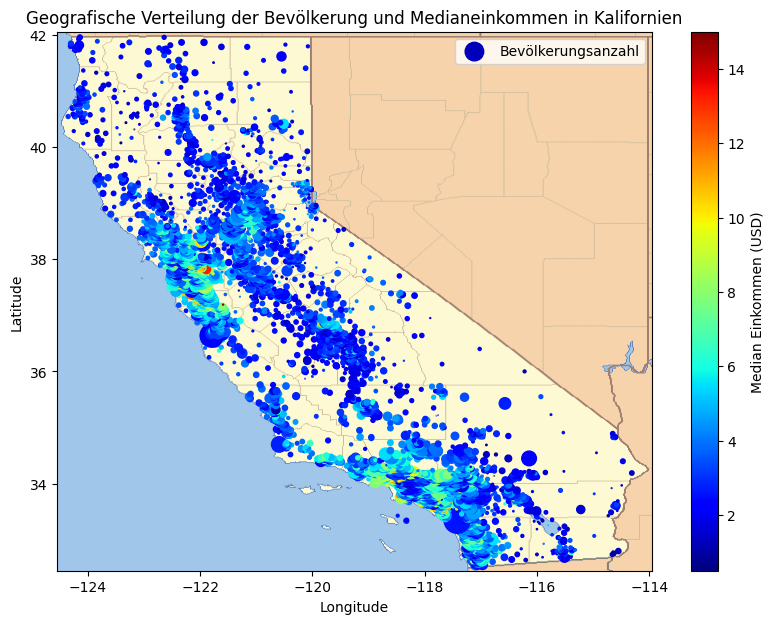

In [58]:
housing_renamed.plot(
             kind="scatter", x="Longitude", y="Latitude",
             s=housing_renamed["Bevölkerungsanzahl"] / 100, label="Bevölkerungsanzahl",
             c="Median Einkommen (USD)", cmap="jet", colorbar=True,
             legend=True, sharex=False, figsize=(10, 7))

california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)
plt.title('Geografische Verteilung der Bevölkerung und Medianeinkommen in Kalifornien')
plt.show()

**Median Income**: Eine Frage, die man sich stellen kann ist, ob Gebiete mit höherem Einkommen mit höheren Immobilienwerten korrelieren und vice versa. 
Der obige Plot zeigt zunächst die Lage von niedrigeren und höheren Medianeinkommen (Farbe) und der Bevölkerungsanzahl (Größe der Punkte). Beim Medianeinkommen sieht man die roten Punkte in Gegenden der größeren Städte, also in strukturstarken Regionen. Allerdings sind diese auch von einigen blauen Punkten überlagert, sodass diese Darstellung nicht ideal ist, unten wird versucht die Darstellung mithilfe des Alpha Parameters zu verbessern. Der alpha Parameter wird dabei so gewählt, dass er für hohe Median-Einkommen möglichst groß und für kleine möglichst klein ist. Ein kleiner Parameter bedeutet eine geringe Sättigung der Punkte und ein hoher Parameter eine hohe Sättigung. Es ist zu sehen, dass es in den großen Städten auch einige niedrige und mittlere Medianeinkommen gibt, was auf ämere Gegenden schließen lässt. Dies gilt es erneut mit anderen Datenquellen zu verifizieren. 

In Bezug auf den mittleren Häuserwert ist hier auch eine Konzentration von höheren Einkommen in Gegenden mit höheren Häuserwerten.
Man sieht aber auch niedrige und mittlere Einkommen in diese Regionen. Die Wohnkosten sind für diese Bevölkerungsschichten somit in Relation zum Einkommen hoch. 

Die nachfolgende Grafik zeigt die Korrektur der Darstellung. Die colormap wurde auf Rot geändert, die Farben gehen also nun von einem hellen rot zu einem dunklen für höhere Medianeinkommen. 
Es ist nun deutlicher sichtbar, dass die hohen mittleren Einkommen in städtischen Küstenregionen zu finden sind.
Dies kann erneut soziodemografische Gründe wie die Möglichkeit nach Arbeit und die Art der Jobs beziehungsweise die ansässigen Firmen haben. 

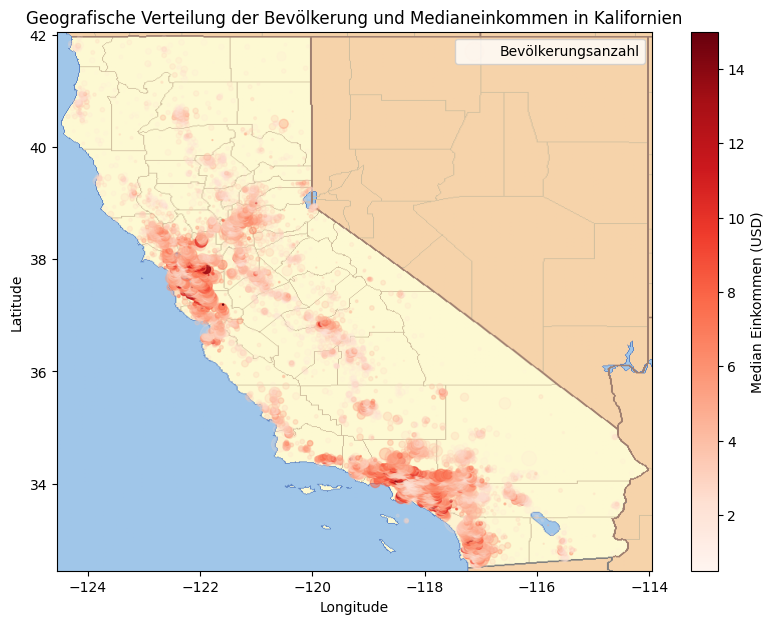

In [59]:
housing_renamed.plot(
             kind="scatter", x="Longitude", y="Latitude",
             s=housing_renamed["Bevölkerungsanzahl"] / 100, label="Bevölkerungsanzahl",
             c="Median Einkommen (USD)", cmap="Reds", colorbar=True, alpha=housing_renamed["Median Einkommen (USD)"]/housing_renamed["Median Einkommen (USD)"].max(),
             legend=True, sharex=False, figsize=(10, 7))

california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)
plt.title('Geografische Verteilung der Bevölkerung und Medianeinkommen in Kalifornien')
plt.show()

##### b) Betrachtet werden soll die Abhängigkeit des Hauspreises von den verfügbaren numerischen Merkmalen. Dazu ist eine geeignete Visualisierungsmöglichkeit zu wählen, auszuführen und zu interpretieren.

<u>Lösungsansatz:</u>

In [60]:
# numerische Werte werden mithilfe des Parameter include='number' angezeigt. Dies beinhaltet float und int Datentypen
df.select_dtypes(include=['number']).columns 

Index(['latitude', 'longitude', 'housing_median_age', 'population',
       'median_income', 'median_house_value', 'rooms_per_house'],
      dtype='object')

Ein Pairplot ermöglicht die Visualisierung der Beziehung zwischen jedem Paar von numerischen Merkmalen in einem Datensatz. Jede Variable wird mit jeder Variablen in einem Scatter Plot geplottet. Auf der Diagonalen wird die Verteilung der einzelnen Variablen dargestellt.

In [61]:
# # Pairplot für die Beziehung aller numerischen Werte:
# numerical_features = df.select_dtypes(include=['number']).columns
# sns.pairplot(df[numerical_features])
# plt.show()

Soll hingegen nur die Beziehung von Hauspreis gegen die anderen numerischen Werte untersucht werden, kann man dies Erreichen, indem nur eine Zeile des Pairplots ohne Diagonale gezeichnet wird:

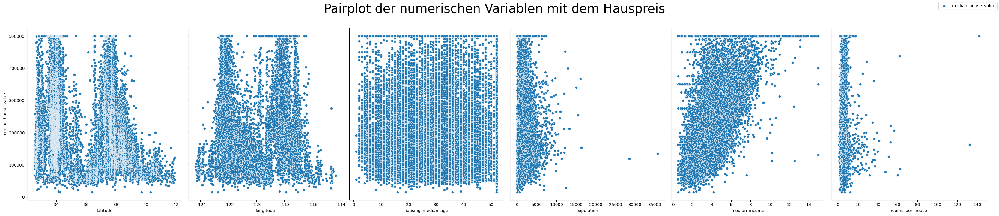

In [62]:
# Pairplot für jede Variable mit dem Hauspreis erstellen
numerical_features = [x for x in df.select_dtypes(include=['number']).columns if x!='median_house_value']
pairplot = sns.pairplot(df, x_vars=numerical_features, y_vars=['median_house_value'], kind='scatter', diag_kind=None, height=7, aspect=0.8)
# Titel hinzufügen
pairplot.fig.suptitle('Pairplot der numerischen Variablen mit dem Hauspreis', y=1.02, fontsize=30)

# Legende hinzufügen
pairplot.fig.subplots_adjust(top=0.9)  # Platz für die Legende schaffen
pairplot.fig.legend(labels=['median_house_value'], loc='upper right')
plt.show()

Die Pairplots liefern eine visuelle Grundlage, um die Beziehungen zwischen verschiedenen Merkmalen und dem Hauspreis zu interpretieren. Betrachten wir die genannten Merkmale im Detail:

Bezüglich *latitude* & *longitude* sieht man eine ähnliche Punkteverteilung wie oben schon bei der Kerndichte. Das heißt, dass der Hauspreis an den Breiten- und Längengraden, in denen die großen Städte liegen tendenziell höher ist. Hierbei handelt es sich um Ballungszentren und Wirtschaftsstandorte. Einerseits sind hier die teuren Wohngebiete, in denen viele Prominente wohnen, andererseits sind auch Gründe wie das Vorhandensein von Arbeitsplätzen und die gute Infrastruktur Ursachen für die höheren Hauspreise. 

Zwischen *median_House_value* und dem Hauspreis scheint es keinen offensichtlichen Zusammenhang zu geben. Die Datenpunkte sind über den gesamten Altersbereich verteilt und zeigen keine klare Richtung oder Trendlinie, was darauf hindeutet, dass das Alter der Wohngebäude allein kein starker Prädiktor für den Hauspreis ist.

Beim Merkmal *population* sieht man, dass für kleine Werte von *population* alle Möglichkeiten für den Hauspreis auftauchen. Hier zeigt sich kein Trend. Für größere Werte von population >20000 Einwohner (große Wahlbezirke) gibt es einige Ausreißer, die beim mittleren Hauspreis von ca 150000 liegen. Die Ausreißer sind näher zu untersuchen, um Datenfehler auszuschließen. 

Das Merkmal *median_income* zeigt folgende Beziehung zum Hauspreis: fast alle Punkte liegen über der Winkelhalbierenden. Während bei niedrigeren Einkommen eine breite Streuung der Hauspreise zu beobachten ist, tendieren Bezirke mit höherem Einkommen dazu, auch höhere Hauspreise aufzuweisen. Dies könnte darauf zurückzuführen sein, dass höhere Einkommen oft in städtischen Gebieten mit besserer Infrastruktur und Arbeitsmöglichkeiten vorkommen, wo eine hohe Nachfrage nach Wohnraum die Preise in die Höhe treibt. Einige Ausreißer könnten auf besondere lokale Gegebenheiten oder Ausnahmen von der allgemeinen Tendenz hinweisen.

Das Merkmal *rooms_per_house* zeigt keinen Trend mit dem Merkmal Hauspreis. Für Räume <20 gibt es nahezu alle Hauspreis-Werte. Bei einer größeren Anzahl an Räumen gibt es einzelne Ausreißer. Die Ausreißer sind näher zu untersuchen, um Datenfehler auszuschließen. 

Basierend auf der oberen Analyse ist zu erwarten, dass in einem Modell, mit welchem der Hauspreis geschätzt wird, die Merkmale *longitude*, *latitude* und *median_income* am signifikantesten sind. Diese Erkenntnisse können für die Modellbildung und für die Priorisierung von Merkmalen bei der Vorhersage von Hauspreisen von Bedeutung sein.

--------------------------------------

Als Alternative Idee wurde die Korrelation getestet, es ist allerdings die Schwierigkeit des Pearson Korrelationskoeffizienten zu erkennen.
der Pearson Korrelationskoeffizient gibt lediglich an, wie stark der lineare Zusammenhang zwischen zwei Variablen ist. 
Er zeigt nicht, ob die Variablen eventuell einen anderen Zusammenhang haben, dies ist aus obigen Scatterplot ersichtlich. Zudem zeigt unten abgebildete Grafik lediglich, dass das Medianeinkommen den höchsten linearen Zusammenhang hat. Die Verteilung der Punkte lässt sich aber erst auf obigen Graphen erkennen. 

In [63]:
# compute the correlation matrix of the numerical Variables
num_var = df.select_dtypes(include=['number'])
corr_num = num_var.corr()['median_house_value'] # extrahiere die Einträge von Korrelationen mit Median House value aus der Korrelationsmatrix
corr_num = corr_num.drop('median_house_value',axis=0) # entferne korrelation mit Median house value (sich selbst)

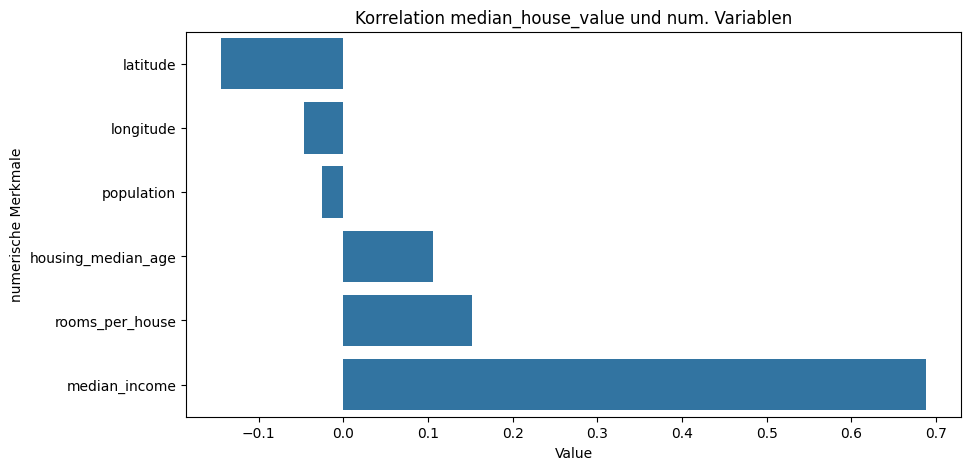

In [64]:
# Eine andere Möglichkeit der Darstellung ist die Korrelation zwischen median_house_value und den numerischen Variablen
plt.figure(figsize=(10,5))
plt.title('Korrelation median_house_value und num. Variablen')
ax = sns.barplot(y=corr_num.sort_values().index,x=corr_num.sort_values().values)
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
plt.xlabel('Value')
plt.ylabel('numerische Merkmale')
plt.show()

--------------------------------------------------------------------------------------------------------
Als dritte Idee wurde Ein Plot erstellt, der die numerische Variable in 50 Bins einteilt. Für jeden Bin wurde der mittlere Median House Value berechnet und die verschiedenen Werte wurden dann über ein Liniendiagramm dargestellt. Zusätzlich wurde für jeden Bin bestimmt, wie viele Datenpunkte um bin vorhanden sind und diese als Balkendiagramm im gleichen Plot gezeeigt. 

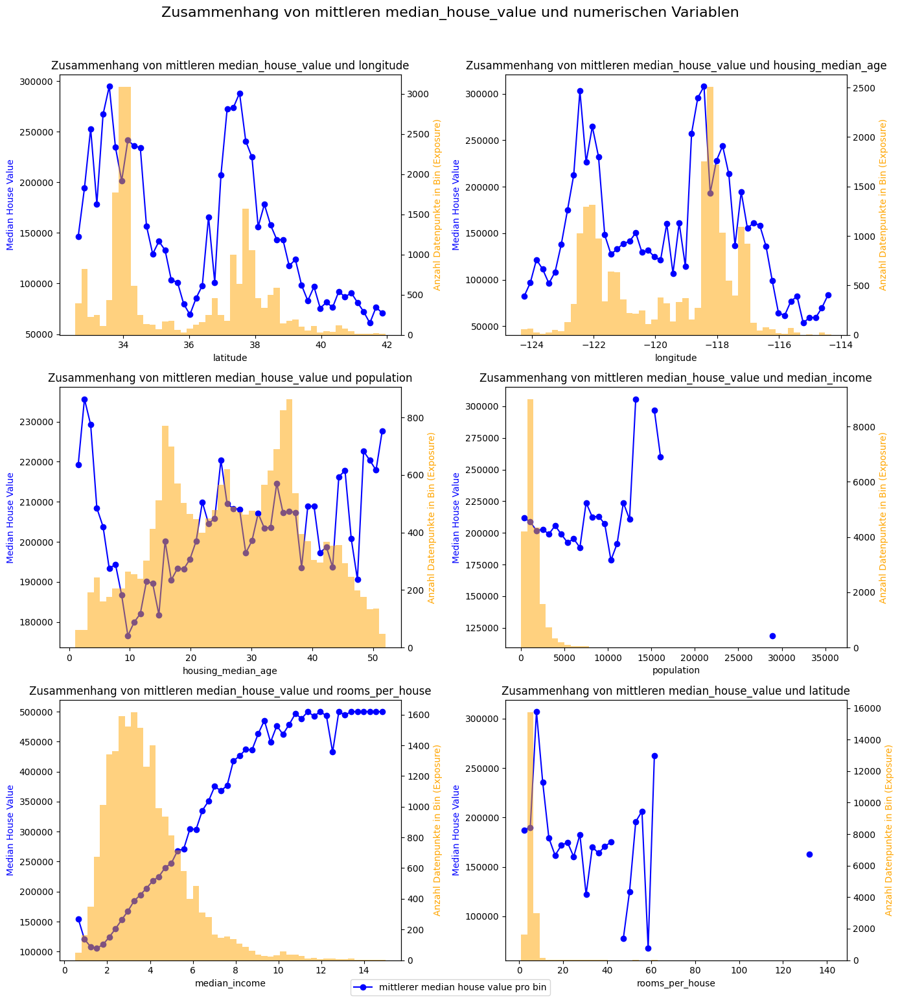

In [65]:
nbins = 50 # lege die Anzahl der Bins fest
y = df['median_house_value']

# Erstelle Grid für Graph
# Der finale Graph hat 3 Spalten. Die Anzahl der Reihen wird berechnet indem die Gesamtzahl durch 2 gerechnet wird und aufgerundet wird.
var = [x for x in num_var if x != 'median_house_value'] 
num_rows = math.ceil(len(var) / 2)
# die einzelen Graphen sollen 5x7 groß werden
fig, axes = plt.subplots(num_rows, 2, figsize=(14, num_rows * 5))
axes = axes.flatten()

# für jedes num. Mermal
for j, col in enumerate(var):
    x = df[col]

    #bin_edges = np.linspace(np.min(x), np.max(x), nbins+1)
    bin_edges = np.histogram_bin_edges(x, bins=nbins)
    centroid = (bin_edges[:-1] + bin_edges[1:])/2

    y_means = [np.mean(y[(x>=bin_edges[i])&(x<bin_edges[i+1])]) for i in range(nbins)]

    # Berechne Anzahl Datenpunkte in jedem bin
    y_counts = [np.sum((x>=bin_edges[i])&(x<bin_edges[i+1])) for i in range(nbins)]

    plt.title(f'Zusammenhang von mittleren median_house_value und {col}')

    #fig, ax1 = plt.subplots()
    # Plotte Mittlewerte als Lineplot auf Primärachse
    axes[j].plot(centroid, y_means, marker='o', linestyle='-', color='blue')
    axes[j].set_xlabel(col)

    # Sekundärachse für Anzahl der Datenpunkte pro Bin (und Bars)
    ax2 = axes[j].twinx()
    ax2.bar(centroid, y_counts, width=bin_edges[1]-bin_edges[0], alpha=0.5, color='orange') # alpha ist die Transparenz	
    ax2.set_ylabel('Anzahl Datenpunkte in Bin (Exposure)', color='orange')

fig.suptitle('Zusammenhang von mittleren median_house_value und numerischen Variablen', fontsize=16, y=1.02)
fig.legend(['mittlerer median house value pro bin'], loc='lower center')
plt.tight_layout() # durch tight_layout werden Überlappungen vermieden
plt.subplots_adjust(top=0.95) 
plt.show()

Die Plots liefern eine visuelle Grundlage, um die Beziehungen zwischen verschiedenen Merkmalen und dem Hauspreis zu interpretieren. Betrachten wir die genannten Merkmale im Detail:

Bezüglich *latitude* & *longitude* sieht man, dass der Hauspreis an den Breiten- und Längengraden, in denen die großen Städte liegen tendenziell höher ist. Der Verlauf des mittleren median Haushaltes ist ähnlich zu den Balken. Gegenden mit vielen Datenpunkten, zeigen auch ein höheres mittleres Einkommen Hierbei handelt es sich um Ballungszentren und Wirtschaftsstandorte. Gründe könnten das Vorhandensein von Arbeitsplätzen und die gute Infrastruktur als Ursachen für die höheren Hauspreise sein.  

Zwischen *median_House_value* und dem Hauspreis scheint es keinen direkten Trend zu geben. 

Beim Merkmal *population* sieht man, dass es keinen sichtbaren Trend zweischen den Variablen gibt. Für größere Werte von population >20000 Einwohner (große Wahlbezirke) gibt es nur noch einen Punkt im Graphen. Dies deutet daraufhin, dass die anderen Bins keine Datenpunkte enthalten. Eine Alternative könnten hier noch gleichverteilte Quantile liefern, damit die ersten Bins nicht nahezu alle Datenpunkte enthalten. Dies wird unten einmal gezeigt. 

Das Merkmal *median_income* zeigt einen gut sichtbaren steigenden Trend mit dem Merkmal Hauspreis. Bei den kleinsten Levels des Medianeinkommens ist der Hauspreis relativ hoch, sinkt dann allerdings. Anschließend steigt er bis zu einem level von ungefähr 500.000. Anschließend ist der mittlere Medianhauspreis bei weiter steigendem Medinaeinkommen relativ stabil bei diesem Level. Die Balken zeigen, dass hier allerdings kaum noch exposure vorhanden ist. Das Verhalten der Kurve könnte darauf zurückzuführen sein, dass höhere Einkommen oft in städtischen Gebieten mit besserer Infrastruktur und Arbeitsmöglichkeiten vorkommen, wo eine hohe Nachfrage nach Wohnraum die Preise in die Höhe treibt. Einige Ausreißer könnten auf besondere lokale Gegebenheiten oder Ausnahmen von der allgemeinen Tendenz hinweisen.

Das Merkmal *rooms_per_house* zeigt keinen Trend mit dem Merkmal Hauspreis. In den ersten bins liegen nehzu alle Datenpunkte. Bei einer größeren Anzahl an Räumen gibt es einzelne Ausreißer. Die Ausreißer sind näher zu untersuchen, um Datenfehler auszuschließen. Unten sind das  95%, 99% Quantil und das Maximum der Spalte berechnet. Es zeigt sich ein Wert von ca. 10 Räumen pro Haus im 99% Quantil. Das Maximum von ca. 142 Räumen pro Haus im Median im Bezirk deutet hier auf einen Datenfehler und Ausreißer hin. die Punkte mit solch hohen Werten sind durch andere Quellen zu verifizieren und ggf. auszuschließen. Auch hier könnte die Betrachtung von gleichverteilten Bins sinnvoll sein. Dies wird unten einmal gezeigt.
 
Basierend auf der oberen Analyse ist zu erwarten, dass in einem Modell, mit welchem der Hauspreis geschätzt wird, die Merkmale *longitude*, *latitude* und *median_income* am signifikantesten sind. Diese Erkenntnisse können für die Modellbildung und für die Priorisierung von Merkmalen bei der Vorhersage von Hauspreisen von Bedeutung sein.

In [66]:
# gebe das 95%, das 99% Quantil und das Maximum von rooms_per-house aus. 
# Berechnen der Quantile
quantile_95 = df['rooms_per_house'].quantile(0.95)
quantile_99 = df['rooms_per_house'].quantile(0.99)

# Finden des Maximums
maximum_value = df['rooms_per_house'].max()

print(f'Das 95. Perzentil von rooms_per_house ist: {quantile_95}')
print(f'Das 99. Perzentil von rooms_per_house ist: {quantile_99}')
print(f'Das Maximum von rooms_per_house ist: {maximum_value}')

Das 95. Perzentil von rooms_per_house ist: 7.640246547450425
Das 99. Perzentil von rooms_per_house ist: 10.357033023735815
Das Maximum von rooms_per_house ist: 141.9090909090909


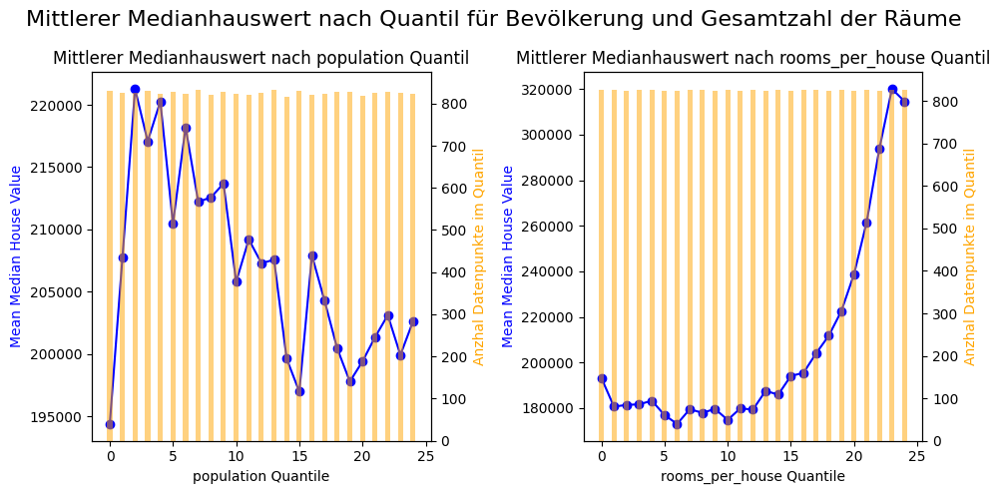

In [67]:
# Anzahl der Bins
nbins = 25

# Zielvariable
y = df['median_house_value']

# Merkmale für die Quantile
features = ['population', 'rooms_per_house']

# Erstelle Grid für Graph
num_rows = math.ceil(len(features) / 2)
fig, axes = plt.subplots(num_rows, 2, figsize=(10, num_rows * 5))

# Iteriere über die Merkmale
for i, feature in enumerate(features):
    # Berechne die Quantile mit gleichem Exposure
    df[f'{feature}_quantile'] = pd.qcut(df[feature], q=nbins, labels=False, duplicates='drop')

    # Gruppierung nach Quantilen und Berechnung der Mittelwerte
    quantile_means = df.groupby(f'{feature}_quantile')['median_house_value'].mean()
    quantile_counts = df[f'{feature}_quantile'].value_counts().sort_index()

    # Plot der Mittelwerte
    axes[i].plot(quantile_means, marker='o', linestyle='-', color='blue')
    axes[i].set_xlabel(f'{feature} Quantile')
    axes[i].set_ylabel('Mean Median House Value', color='blue')
    axes[i].set_title(f'Mittlerer Medianhauswert nach {feature} Quantil')
    
    # Sekundärachse für Anzahl der Datenpunkte pro Quantil (und Bars)
    ax2 = axes[i].twinx()
    ax2.bar(quantile_means.index, quantile_counts, width=0.4, alpha=0.5, color='orange')
    ax2.set_ylabel('Anzhal Datenpunkte im Quantil', color='orange')
    
    df.drop([f'{feature}_quantile'], axis=1, inplace=True)
plt.suptitle('Mittlerer Medianhauswert nach Quantil für Bevölkerung und Gesamtzahl der Räume', fontsize=16)
plt.tight_layout()
plt.show()

Die Graphen für die stark rechtsschiefen Variablen *population* und *rooms_per_house* wurden nochmals mit Quantilen geplottet. Hier wurden die Daten in 25 gleich große Quantile eingeteilt und für jedes Quantil der mittlere *median_house_value* berechnet. Man erkennt nun einen deutlichen Trend in *rooms_per_house*. Je mehr Räume im Haus vorhanden sind, desto höher ist der Median Hauswert. Hier gilt zu beachten, dass die Werte auf der x-Achse der Zahl des Quantils entspricht und nicht die Werte des Merkmals sind. Bei population zeigt sich eher ein fallender Trend wobei zu Beginn in den ersten 3 Quantilen steigend ist. 

### Aufgabe A-4: Erste Hauspreisprognosemodelle auf Basis der numerischen Features [Lernziele 3.3/3.4, 4.1 & 6; 14 Punkte]<a class="anchor" id="unterabschnitt-1-5"></a>
Ziel dieses Abschnitts ist die Erstellung erster Modelle basierend rein auf den numerischen Merkmalen.

##### a) Es ist anzugeben, wie die Fehler- bzw. Gütemaße Root Mean Squared Error (RMSE) bzw. R² eines Prognoseverfahrens bei einem Regressionsproblem berechnet werden. Im Anschluss soll der mathematische Zusammenhang zwischen den beiden Größen aufgezeigt werden. Dabei soll einerseits darauf eingegangen werden, welche Rolle ein naives Nullmodell einnimmt, das stets den Mittelwert des Zielmerkmals ausgibt, und andererseits begründet werden, wieso der RMSE bei steigendem R² sinkt und bei fallendem R² steigt.

<u>Lösungsansatz:</u>

Zur Beantwortung der Frage gehen wir von folgender Notation aus:
*  Sei $n$ die Gesamtzahl der Beobachtungen
* $y_i$ der tatsächlicher Wert der Beobachtung $i$
* $\hat{y}_i$ der prognostizierte Wert der Beobachtung $i$
* $\bar{y}$ Mittelwert der tatsächlichen Werte $y_i$

Das lineare Modell ist gegeben durch: $y = \beta_0 + \beta_1*X_1 + ... + \beta_p*X_p $, wobei $p$ die Anzahl der Kovariablen ist.

<u>Root Mean Squared Error (RMSE):</u>

Der RMSE ist ein Maß für die durchschnittliche Modellfehler und wird berechnet, indem die Quadratwurzel des Durchschnitts der quadrierten Abweichungen der Prognosewerte von den tatsächlichen Werten gezogen wird. Die Formal kann wie folgt dargestellt werden:
$$
RMSE = \sqrt{MSE} = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2}.
$$

Die Formel für RMSE kann auch als
$$
RMSE= \frac{RSS}{n}
$$
geschrieben werden. RSS steht für *Residual Sum of Squares* (Residuenquadratsumme) und misst den Anteil der mit der Regression nicht erklärbaren Anteil der Abweichung (die Summe der quadrierten Abweichungen der Prognosewerte von den tatsächlichen Werten). 

<u>Bestimmtheitsmaß $R^2$ (Pearson Korrelationskoeffizient):</u>

Das Bestimmtheitsmaß $R^2$ gibt den Anteil der Varianz der abhängigen Variablen an, der durch das Modell erklärt wird. Es wird wie folgt berechnet:
$$
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}.
$$
Durch die Berücksichtigung des Quadrats ist der RMSE immer positiv. 

Die Formel für $R^2$ kann im Fall der linearen Regression auch als
$$
R^2 = 1 - \frac{RSS}{TSS}
$$
geschrieben werden, wobei TSS die Totale Summe der Quadrate (Maß für die totale Varianz, es misst, wie viel die Daten um ihren Mittelwert streuen) ist. 
Für den Fall, dass die Messwerte keinerlei Varianz aufweisen (TSS=0) ist das Bestimmtheitsmaß nicht definiert.
Zum Vergleich verschiedener Modelle ist das Bestimmteheitsmaß nur bedingt geeignet. RSS hat die Eigenschaft, mit der Hinzunahme weitere Variablen in das Moddell, kontinuierlich kleiner zu werden. Dadurch wird $R^2$ größer. 

<u>Die Rolle des naiven Nullmodells:</u>

Das Nullmodell, das immer den Mittelwert von $y$ vorhersagt, hat per Definition ein $R^2$ von $0$, da die Vorhersagen $\hat{y}_i$ gleich dem Mittelwert $\bar{y}$ sind und somit der Zähler gleich dem Nenner ist. Der RMSE dieses Modells zeigt die Standardabweichung der tatsächlichen Werte von ihrem Mittelwert.

Das Nullmodell sagt für alle Beobachtungen den gleichen Wert voraus, den Mittelwert der Zielvariablen.
Der RMSE des Nullmodells wird wie folgt berechnet:
$$ \text{RMSE}_{\text{null}} = \sqrt{\frac{1}{n}\sum_{i=1}^{n}(y_i - \bar{y})^2} $$
Der RMSE gibt somit die Standardabweichung der tatsächlichen werte von ihrem Mittelwert an. 
Ein Prognosemodell ist im Vergleich zum Nullmodell nützlich, wenn sein RMSE niedriger ist als der RMSE des Nullmodells. Das bedeutet, dass das Modell im Durchschnitt genauere Vorhersagen liefert als die naive Annahme, dass jeder Wert gleich dem Mittelwert ist. Das Verhältnis des RMSE eines Modells zum RMSE des Nullmodells kann als eine Art Effizienzmaß betrachtet werden. Ein RMSE, der nahe am RMSE des Nullmodells liegt, deutet darauf hin, dass das Modell nicht viel besser als das naive Nullmodell ist. Ein deutlich niedrigerer RMSE zeigt hingegen an, dass das Modell eine wesentlich bessere Vorhersagekraft besitzt.

In der Praxis ist es oft hilfreich, den RMSE des eigenen Modells mit dem RMSE des Nullmodells zu vergleichen, um eine Baseline für die Modellleistung zu haben. Dadurch kann man einschätzen, wie viel besser das eigene Modell im Vergleich zu einer sehr einfachen Vorhersage ist.

<u>Mathematischer Zusammenhang zwischen RMSE und $R^2$:</u>

Der RMSE ist ein absolutes Maß für "Goodness of Fit" des Modells: je kleiner der RMSE, desto besser die Passgenauigkeit. RMSE ist in den Einheiten der abhängigen Variablen und wird von der Skala der Daten beeinflusst. $R^2$ hingegen ist ein relatives Maß, das angibt, wie viel besser das Modell im Vergleich zum naiven Nullmodell ist. Es sind auch negative Werte für $R^2$ möglich, wenn die Voraussetzungen für das lineare Modell verlett sind oder das Modell schlechter als das Nullmodell ist. In der Regel liegt das Bestimtheitsmaß aber zwischen $0$ und $1$.  

Wenn $R^2$ steigt, bedeutet das, dass der Anteil der unerklärten Varianz (RSS) im Verhältnis zur gesamten Varianz (TSS) sinkt. Da der RMSE auf der RSS basiert (RSS lässt sich berechnen als $RSS = n * MSE$), führt eine Verringerung der RSS zu einem niedrigeren RMSE. Umgekehrt, wenn $R^2$ fällt, steigt der Anteil der unerklärten Varianz, was zu einem höheren RMSE führt.
In anderen Worten: Wenn $R^2$ steigt, bedeutet dies, dass der Zähler im Vergleich zum Nenner abnimmt, was darauf hinweist, dass das Modell die Daten besser erklärt. Daher sinkt der RMSE, da weniger Abweichung zwischen den prognostizierten und den tatsächlichen Werten besteht. Umgekehrt, wenn $R^2$ fällt, erklärt das Modell weniger von der Varianz der Daten, was zu einem höheren RMSE führt, da die Vorhersagen schlechter werden.

Es ist jedoch zu beachten, dass RMSE und $R^2$ nicht direkt proportional zueinander sind, da sie unterschiedliche Aspekte der "Goodness of Fit" messen. $R^2$ kann auch irreführend sein, wenn es in Modellen mit einer geringen Anzahl von Beobachtungen oder wenn das Modell überangepasst ist, verwendet wird. Deshalb sollten RMSE und $R^2$ zusammen betrachtet werden, um eine umfassendere Bewertung der Modellgüte zu erhalten.

##### b) Der Datensatz ist in einen Trainingsteil (konkret: x_train & y_train) und einen Validierungsteil (konkret: x_val & y_val) zu splitten. Dabei ist die Spalte sample zu berücksichtigen: Zeilen mit dem Eintrag „A“ sollten für das Training und Zeilen mit dem Eintrag „B“ für die Validierung verwendet werden. Die entsprechend benötigten Datenstrukturen sind anzulegen.

<u>Lösungsansatz:</u>

In [68]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
# Hier wird auf numerische Variablen gemäß Aufgabenstellung eingeschränkt.
train_data = df[df['sample'] == 'A'].select_dtypes(include=['number'])
val_data = df[df['sample'] == 'B'].select_dtypes(include=['number'])

# Entfernen der Spalte 'sample' und Aufteilung in Features und Target -> sample ist nicht numerisch und somit nicht mehr Teil des Datensatzes
x_train = train_data.drop(['median_house_value'], axis=1)
y_train = train_data['median_house_value'] #Der Hauspreis ist die Zielvariablen

x_val = val_data.drop(['median_house_value'], axis=1)
y_val = val_data['median_house_value']

<u>Zusatz:</u>

In [69]:
# Mittelwert der Zielvariablen auf Trainings- und Testdaten ermitteln
train_target_mean = y_train.mean()
val_target_mean = y_val.mean()

print("Mittelwert des 'median_house_value' Auf den Trainingsdaten:", train_target_mean)
print("Mittelwert des 'median_house_value' Auf den Validierungsdaten:", val_target_mean)

Mittelwert des 'median_house_value' Auf den Trainingsdaten: 206956.33263990015
Mittelwert des 'median_house_value' Auf den Validierungsdaten: 206853.4852090032


Der mittlere Hauswert auf Trainings- und Validierungsdaten ist sehr ähnlich. Es ist wichtig, eine ähnliche Aufteilung der KPIs in den unterschiedlichen Datensätzen zu haben. Wäre die Zielvariable unterschiedlich verteilt (hier wurde nur der Mittelwert geprüft), so wäre eine Evaluation auf den Validierungsdaten schwierig, da observed und predicted schon rein vom Mittelwert stark unterschiedlich wären. Ähnliche Mittelwerte helfen, die Generalisierungseigenschaft der Modelle zu bewerten.  

##### c) Für die Ergebnisse dieser und der nachfolgenden Modelle in Teil A ist eine geeignete Datenstruktur anzulegen. Diese soll für jedes Modell den Wert für den Root Mean Squared Error (RMSE) enthalten.

In [70]:
# Anlegen eines leeren dictionary. Der key ist der Modellname und der value ist der entsprechende RMSE Wert
model_results = {}

##### d) Zu verwenden ist ein einfaches lineares Modell ohne besondere Anpassungen. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern und zu kommentieren.

<u>Lösungsansatz:</u>

In [71]:
# Initialisieren und Trainieren des linearen Regressionsmodells
LR1 = smf.ols(formula='median_house_value ~ latitude+longitude+housing_median_age+population+median_income\
    +rooms_per_house', data=pd.concat([x_train, y_train], axis=1)).fit()

# Vorhersagen auf den Validierungsdaten
y_pred = LR1.predict(x_val)

# Berechnen des RMSE für die Validierungsdaten
rmse = berechne_rmse(y_pred,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_results['linear_regression_num'] = rmse

print("Modell: Lineare Regression")
print(f"RMSE auf Validierungsdaten: {rmse:.2f}")

Modell: Lineare Regression
RMSE auf Validierungsdaten: 74508.94


Da es sich beim RMSE um eine absolute Kennzahl handelt, ist diese für sich schwer zu beurteilen. Zur Bewertung des RMSE dient wie in a) schon erwähnt auch der RMSE Wert des Nullmodells. Dieser wird nachfolgend berechnet:

In [72]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)
# RMSE berechnen
rmse_null = berechne_rmse(y_pred_null,y_val)
print("\n RMSE des naiven Nullmodells auf Validierungsdaten:", rmse_null)
print("\n Die RMSE Differenz der beiden Modelle beträgt (RMSE_{null} - RMSE_{LR}):", rmse_null-rmse)


 RMSE des naiven Nullmodells auf Validierungsdaten: 114008.14636911073

 Die RMSE Differenz der beiden Modelle beträgt (RMSE_{null} - RMSE_{LR}): 39499.20658422829


Der RMSE auf den Validierungsdaten wurde um ca. 40.000 verringert. Dies deutet darauf hin, dass das lineare Modell besser in der Lage ist, die Varianz in den Daten zu erklären und genauere Vorhersagen zu liefern als das naive Nullmodell. Die Hinzunahme der numerischen Variablen zu dem Modell hat dazu beigetragen, die Vorhersagegenauigkeit zu verbessern. Dies könnte darauf hindeuten, dass diese numerischen Variablen relevante Informationen enthalten, die das Modell zuvor nicht berücksichtigt hat (zuvor hat es lediglich auf Mittelwerten basiert und quasi keine Variablen berücksichtigt).

Um das Ergebnis grafisch darzustellen, wurde ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen der linearen Regression. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei der linearen Regression basierend auf den numerischen Variablen sieht man schon einen Unterschied und einen linearen Trend, auch wenn dieser noch sehr stark streut. Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

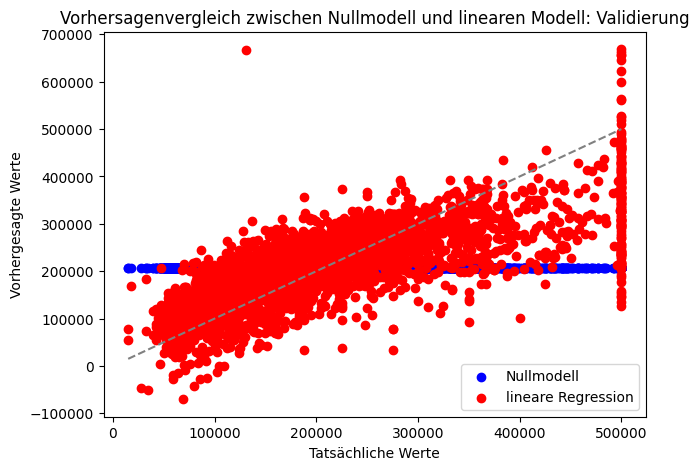

In [73]:
vergleich_modell(y_pred, y_pred_null, y_val, 'linearen Modell: Validierung')

Die genutzten Koeffizienten und deren Stärke können auch mithilfe von Python ausgelesen werden:

In [74]:
display(LR1.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     3641.
Date:                Thu, 09 May 2024   Prob (F-statistic):               0.00
Time:                        19:17:25   Log-Likelihood:            -1.8192e+05
No. Observations:               14421   AIC:                         3.638e+05
Df Residuals:                   14414   BIC:                         3.639e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -3.885e+06   7.89e+04    -49.234      0.000   -4.04e+06   -3.73e+06
latitude           -4.574e+04    850.659    -53.768      0.000   -4.74e+04   -4.41e+04
longitude          -4.639e+04    897.203    -51.704      0.000   -4.81e+04   -4.46e+04
housing_median_age   916.6476     54.085     16.948      0.000     810.634    1022.661
population            -1.0335      0.596     -1.735      0.083      -2.201       0.134
median_income       3.687e+04    360.940    102.141      0.000    3.62e+04    3.76e+04
rooms_per_house     1322.6462    280.327      4.718      0.000     773.170    1872.123
==============================================================================
Omnibus:                     3082.131   Durbin-Watson:                   1.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7497.359
Skew:                           1.186   Prob(JB):                         0.00
Kurtosis:                       5.617   Cond. No.                     2.31e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.31e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Der Intercept des Modells ist -3885263,92. Dieser Wert repräsentiert den erwarteten Wert der abhängigen Variablen, wenn alle unabhängigen Variablen den Wert Null haben. In diesem Fall bedeutet es, dass wenn alle unabhängigen Variablen (Latitude, Longitude, Housing Median Age, Population, Median Income, Rooms per House) den Wert Null haben, der erwartete Wert der abhängigen Variablen -3885263,92 ist.

Den stärksten Einfluss im Modell haben *longitude*, *latitude* und *median_income*. Die Koeffizienten geben an, wie stark sich die abhängige Variable verändert, wenn sich die entsprechende unabhängige Variable um eine Einheit verändert. Negative Vorzeichen bedeuten, dass es eine negative Korrelation zwischen dem jeweiligen unabhängigen Merkmal (*latitude*, *longitude*, *population*) und der abhängigen Variablen (*median_house_value*) gibt. Dies wurde schon oben bei Berechnung des Korrelationskoeffizienten deutlich. Das heißt, wenn der Wert des unabhängigen Merkmals steigt, wird erwartet, dass der Wert der abhängigen Variablen sinkt, und umgekehrt.

Eine Zunahme des entsprechenden Merkmals geht mit einer Abnahme des Zielwerts einher. Zum Beispiel, wenn das Merkmal *latitude* einen negativen Koeffizienten hat, würde dies bedeuten, dass mit zunehmendem Wert für *latitude*, d.h. man bewegt sich weiter gen Norden. Die hohen Hauswerte waren aber eher in der Mitte bis zum Süden des Landes analog obigen Karten zu sehen. Analog gilt dies für den Längengrad, bei einer Zunahme bewegt sich ins Landesinnere die abhängige Variable (Hauswert) voraussichtlich abnimmt. Dies wurde auch auf den Grafiken deutlich, da hohe Häuserwerte vornehmlich an Küstenregionen vorzufinden sind.

De Faktor für *population* ist bedeutend geringe als für die anderen beiden Variablen, die negative Korrelation ist zwar gegeben, aber der Faktor beeinflusst den Zielwert viel geringer. Der p-Wert dieses Merkmals ist größer als 5%. Dieses Merkmal ist bei einer Weiterverarbeitung des Modells ggf. auszuschließen, da es nicht signifikant ist. 
den stärksten positiven Effekt hat *median_income*. Ein hohen Einkommen in einer Gegend deutet tendenziell auf teurere Häuser hin. Die positive Korrelation wird auch in obiger Korrelationsmatrix deutlich. Analog haben eine positive Korrelation auch *housing_median_age* und *rooms_per_house*, wobei letztere schwach ausgeprägt ist. 

Auf mögliche Probleme mit dem Modell weisen die beiden Notes am Ende der summary Ausgabe hin. Zum einen müsste man die  Fehlerterme auf Verteilung prüfen. Zum anderen sind die Merkmale im Modell noch hochkorreliert. Dies hat man in obiger Korrelationsmatrix (z.B. für *longitute* und *latitude*) gesehen. 

Das Modell weist einen $R^2$ Wert von 0,602 auf, was bedeutet, dass im Modell 60,2% der Varianz der abhängigen Variablen wird durch die unabhängigen Variablen erklärt.

##### e) Analog zu Teilaufgabe d) ist CatBoost mit Standardparametern zu verwenden, wobei die Ausgabe der einzelnen Iterationen sowohl hier als auch in nachfolgenden Aufgaben zu unterdrücken ist. Ein Ergebnisbericht samt allen verwendeten Parametern ist auszugeben und die Ergebniswerte sind zu speichern. Zusätzlich ist die Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren.

<u>Lösungsansatz:</u>

In [75]:
# Initialisierung des CatBoost-Modells mit Standardparametern. Unterdrücke Ausgabe mithilfe von 'logging_level' Parameter
catboost_model = CatBoostRegressor(loss_function='RMSE',eval_metric='RMSE', logging_level='Silent', random_seed = seed, task_type = device_CatBoost)

# Trainieren des Modells 
catboost_model.fit(x_train, y_train)

y_pred_catboost = catboost_model.predict(x_val)

# RMSE
rmse_catboost = berechne_rmse(y_pred_catboost,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_results['CatBoost_num'] = rmse_catboost

print(f"CatBoost RMSE: {rmse_catboost:.2f}")
print("Die RMSE Differenz zum Nullmodell beträgt:", rmse_null-rmse_catboost)
print(f"CatBoost Parameters: {catboost_model.get_params()}")

# Feature Importance
feature_importance = {feature: importance for feature, importance in zip(x_train.columns, catboost_model.get_feature_importance())}
print(f"\n CatBoost Feature Importances:")
for feature, importance in feature_importance.items():
    print(feature, ": ", importance)

CatBoost RMSE: 50470.99
Die RMSE Differenz zum Nullmodell beträgt: 63537.15269984164
CatBoost Parameters: {'loss_function': 'RMSE', 'random_seed': 42, 'logging_level': 'Silent', 'eval_metric': 'RMSE', 'task_type': 'GPU'}

 CatBoost Feature Importances:
latitude :  29.13459193337654
longitude :  27.46097133950597
housing_median_age :  5.819610300537853
population :  1.0579562418245614
median_income :  32.30829878981097
rooms_per_house :  4.218571394944094


Der absolute RMSE Wert ist nochmals deutlich geringer als bei der linearen Regression. Im Vergleich zum Nullmodell ist sie um circa 65000 Punkte gesunken. 
Dies deutet darauf hin, dass CatBoost nochmals besser in der Lage ist, die Varianz in den Daten zu erklären und genauere Vorhersagen zu liefern als das naive Nullmodell und die lineare Regression. Die Hinzunahme von nichtlinearen Effekten und tieferen Interaktionen, wie es in CatBoost möglich ist, zeigt eine Verbesserung des RMSE. Das deutet daraufhin, dass das lineare Modell basierend auf numerischen Variablen den Hauspreis nicht optimal erklären kann. 

Die nachfolgende Hyperparameter-Liste wurden analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

In [76]:
# Display all model hyperparameters in a DataFrame
hyperparams_list = [(k, v) for k, v in catboost_model.get_all_params().items()]
hyperparams_df = pd.DataFrame(hyperparams_list, columns=['Hyperparameter', 'Value'])
display(hyperparams_df.style.hide(axis='index'))

Hyperparameter,Value
nan_mode,Min
gpu_ram_part,0.950000
eval_metric,RMSE
iterations,1000
fold_permutation_block,64
leaf_estimation_method,Newton
observations_to_bootstrap,TestOnly
random_score_type,NormalWithModelSizeDecrease
grow_policy,SymmetricTree
penalties_coefficient,1


Um das Ergebnis grafisch darzustellen, wurde erneut ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen von CatBoost. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei CatBoost, basierend auf den numerischen Variablen, sieht man schon einen Unterschied und einen linearen Trend, auch wenn dieser noch sehr stark streut. Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

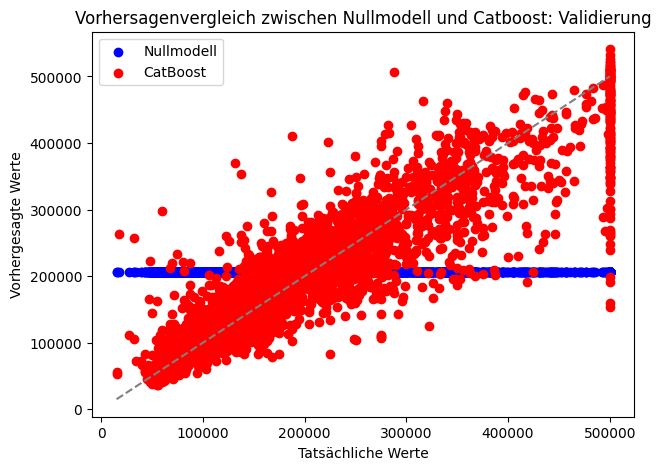

In [77]:
vergleich_modell(y_pred_catboost, y_pred_null, y_val, 'Catboost: Validierung', 'CatBoost')

Im Vergleich zum Graphen mit dem linearen Modell sieht man hier einen deutlicheren linearen Trend.

Abschließend ist noch die Feature Importance grafisch dargestellt.

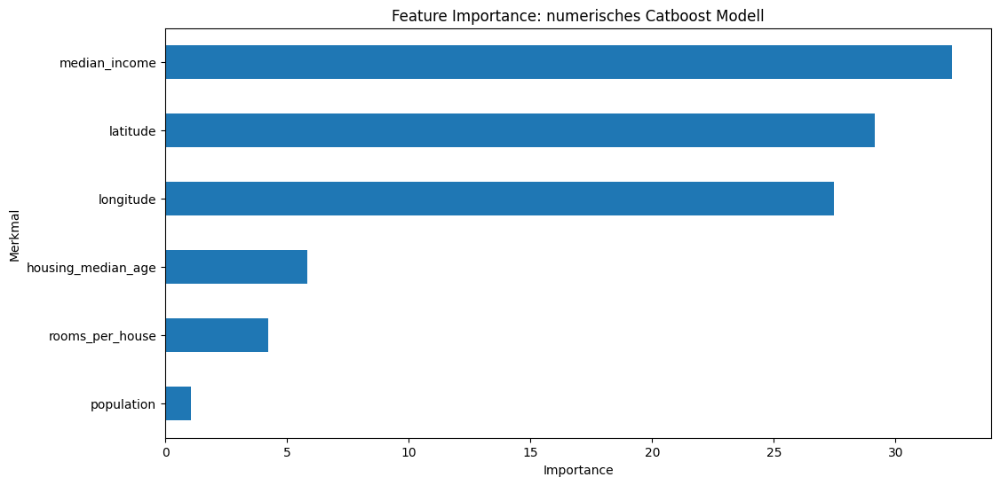

In [78]:
plot_feature_importance(catboost_model,x_train.columns,"numerisches Catboost Modell")

Der Output der Feature-Importance eines CatBoost-Modells basierend auf numerischen Variablen zeigt die relative Bedeutung jeder numerischen Variable für die Vorhersage des Modells.
Die Variablen *meadian_income*, *Latitude* und *Longitude* haben die höchste Bedeutung für das Modell. Dies könnte darauf hindeuten, dass geografische Lageinformationen eine starke Vorhersagekraft für das Modell haben. Die geografische Lage wird somit als sehr wichtig für den Wert des Hauses betrachtet.
Die Variable Median Income hat ebenfalls einen signifikanten Einfluss auf die Vorhersagen des Modells. Dies deutet darauf hin, dass das Einkommen der Bevölkerung in einem bestimmten Gebiet eine wichtige Rolle bei der Vorhersage des Hauswertes spielt. Auch hier haben obige Karten schon gezeigt, dass in der Nähe zu größeren Städten die mittleren Einkommen tendenziell höher sind und ebenso die Hauswerte.  

Die Anzahl der Räume pro Haus und die Variablen *Housing_median_age* und *population* haben ebenso Einfluss auf die Vorhersagen des Modells, wenn auch geringer im Vergleich zu *Latitude*, *Longitude* und *Median_income*.

Gerade *population* hat nur einen vergleichsweise geringeren Einfluss auf die Vorhersagen des Modells, was darauf hindeutet, dass sie weniger stark mit der abhängigen Variablen korrelieren. beziehungsweise die Informationen auch durch die anderne Variablen schon erklärt wurden. 

Die Feature Importance gibt an, welche Merkmale das Modell als am wichtigsten für die Vorhersagen betrachtet. Hohe Werte bedeuten, dass ein Merkmal einen großen Einfluss auf die Vorhersage hat. Dies kann nützlich sein, um zu verstehen, welche Merkmale am meisten zur Vorhersage beitragen und möglicherweise auch um das Modell weiter zu verfeinern, indem weniger wichtige Merkmale entfernt werden (Priorisierung der Feature). 

### Aufgabe A-5: Kategorielle Merkmale analysieren und aufbereiten [Lernziele 3.3/3.4 & 5.2; 7 Punkte]<a class="anchor" id="unterabschnitt-1-6"></a>
Hinweis: Der Datensatz ist für diesen Abschnitt (hinsichtlich der Features) auf die kategoriellen Merkmale zu beschränken.

##### a) Zu erstellen ist eine grafische prozentuale Häufigkeitsverteilung für die nominalen Merkmale ocean_proximity und county_name. Die Ergebnisse sind zu erläutern.

<u>Lösungsansatz:</u>

Die prozentuale Häufigkeit wurde auf 2 Weisen nachfolgend dargestellt, einmal als Barplot mit den prozentualen Häufigkeiten auf der y-Achse und einmal als Kuchendiagramm. 
Die Darstellung als Kuchendiagramm ist vorteilhaft, wenn man nur wenige Level hat, wie beisoielsweise bei ocean_proximity. Die Darstellung als Balkendiagramm ist zu bevorzugen bei vielen Leveln. Ein Kuchendiagramm ist hier sinnvoller, wenn man alle Kategorien <1% in eine Restkategorie packt. Dies ist nachfolgend auch veranschaulicht.

In [79]:
# Prozentuale Häufigkeitsverteilung für 'ocean_proximity'
ocean_proximity_counts = df['ocean_proximity'].value_counts(normalize=True) * 100

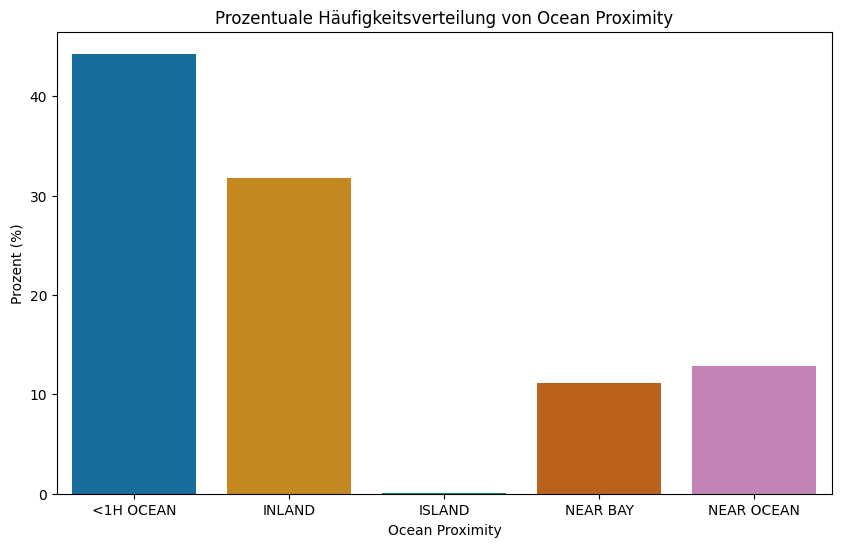

In [80]:
plt.figure(figsize=(10, 6))
sns.barplot(x=ocean_proximity_counts.index, y=ocean_proximity_counts.values, palette ='colorblind', hue=ocean_proximity_counts.index, legend=False)
plt.title('Prozentuale Häufigkeitsverteilung von Ocean Proximity')
plt.ylabel('Prozent (%)')
plt.xlabel('Ocean Proximity')
plt.show()

In [81]:
# Prozentuale Häufigkeitsverteilung für 'county_name'
county_name_counts = df['county_name'].value_counts(normalize=True) * 100

In [82]:
# Erstellen einer Liste von Farben, eine für jeden County
unique_counties = df['county_name'].nunique()
palette_county = sns.color_palette("husl", unique_counties)

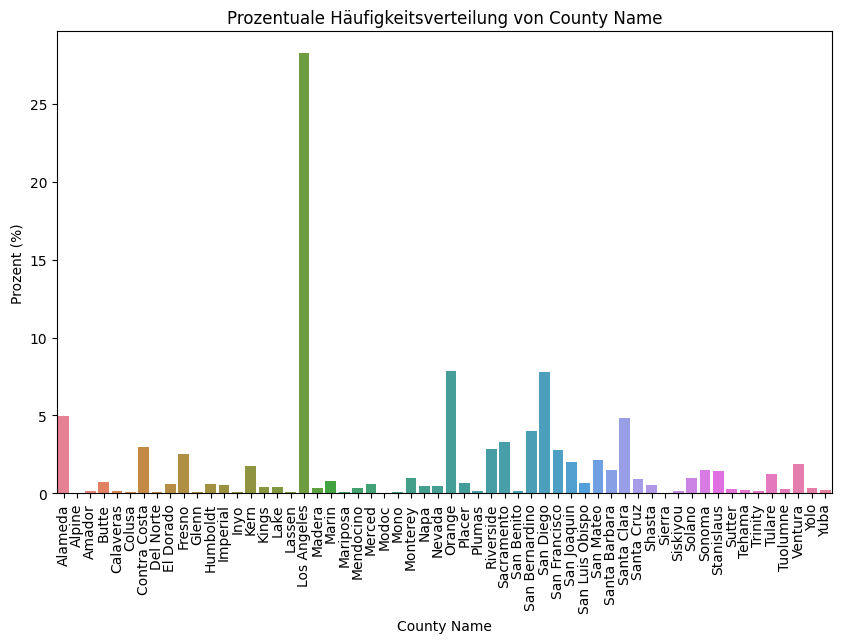

In [83]:
plt.figure(figsize=(10, 6))
sns.barplot(x=county_name_counts.index, y=county_name_counts.values, palette=palette_county, hue = county_name_counts.index, legend = False)
plt.title('Prozentuale Häufigkeitsverteilung von County Name')
plt.ylabel('Prozent (%)')
plt.xlabel('County Name')
plt.xticks(rotation=90) 
plt.show()

-----------

Eine alternative und sogar bessere Darstellung der Häufigkeiten betet das Kuchendiagramm. Es wurde für beide Merkmale unten stehen dargestellt. Die Idee stammt aus (siehe: https://www.kaggle.com/code/nayanack/california-house-price-prediction-using-pytorch, Stand 17.4.2024).

Der Code wurde um Achsenbeschriftungen erweitert und die Schattierung wurde entfernt, da sie eher als störend von mir wahrgenommen wurde.

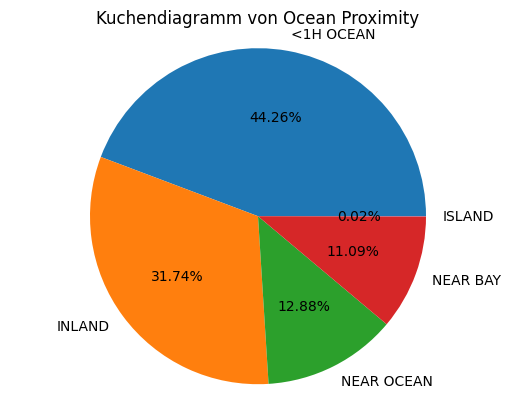

In [84]:
df.ocean_proximity.value_counts().plot(kind='pie',shadow=False,autopct='%.2f%%')
plt.title('Kuchendiagramm von Ocean Proximity')
plt.ylabel('')  
plt.axis('equal')  
plt.show()

Da wie oben bereits erwähnt die Variable *county_name* 58 verschiedene Level hat, sind diese schwierig in einem einzelnen Kuchendiagramm darzustellen. Anhand des Balkendiagramms ist jedoch ersichtlich, dass es einige Level mit unter 1% Häufigkeit gibt. Diese werden in eine Restkategorie, genannt *other* zusammengefasst. 

In [85]:
threshold = 0.01  # 1% threshold
# Berechne die Prozentzahl von jedem county_name Level
level_counts = df['county_name'].value_counts(normalize=True)
# Welche Level haben %-Satz < Threshold -> speichere in other_countries
other_counties = level_counts[level_counts < threshold].index
# Ersetze diese Level durch "other"
county_names_summarized = df['county_name'].apply(lambda x: 'other' if x in other_counties else x)

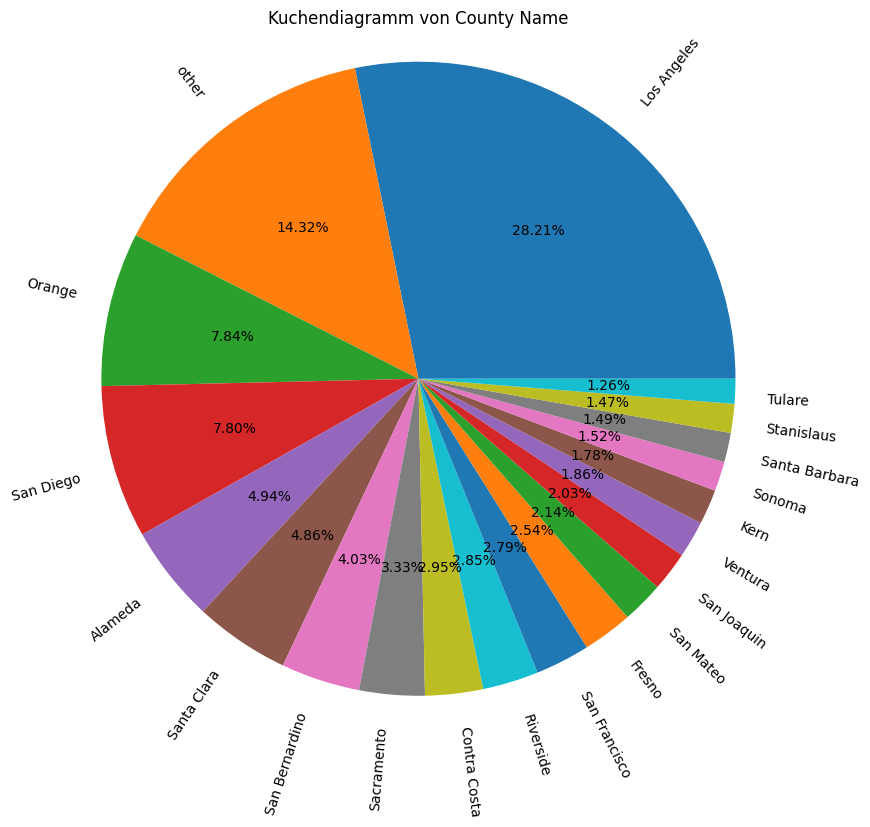

In [86]:
county_names_summarized.value_counts().plot(kind='pie',shadow=False,autopct='%.2f%%',figsize=(9,9), rotatelabels = True, color=palette_county)
plt.title('Kuchendiagramm von County Name')
plt.ylabel('')  
plt.axis('equal') 
#plt.xticks(rotation=90)  
plt.show()

Die Balkendiagramme und ebenso die Kuchendiagramme zeigen, welchen Prozentsatz die einzelnen Level der nominalen Merkmale des Datensatzes ausmacht. Das Diagramm für *ocean_proximity* zeigt, dass ein Großteil der Datensätze im Bereich "<1H OCEAN" (ca. 44%) oder "INLAND" (ca. 32%) liegen. Inseln sind der kleinste Teil (0.02%). Hier müsste man mit externen Quellen nachprüfen, ob die Verteilungen den Verteilungen in Kalifornien entsprechen, oder ob die Inseln gegebenfalls unterrepräsentiert sind. Es ist auch eine Frage des Analyseziels. Möchte ich ein Modell zur internen Verwendung, so ist meine Verteilung mit den Verteilungen aus den vergangenen Jahren zu analysieren. Bei einem Modell, dass ich extern anwenden kann, muss die Verteilung der Marktverteilung entsprechen. Bei den Daten handelt es sich um Zensusdaten aus verschiedenen Bezirken. Es ist zu prüfen, ob die Vertielungen repräsentativ sind, also den erwarteten Vertielungen von Bezirken entspricht.

Genaueren Einblick über die Lage der Datenpunkte liefert die Variable *county_name*, die den Namen des counties beinhaltet. Hier wird deutlich, dass die meisten Datenpunkte aus dem county L.A. stammen (ca. 28%). Die zweitmeisten Datenpunkte liegen im County Orange (7.8%) und am drittmeisten im county San Diego (7.8%). Die Diagramme verdeutlichen, wie die Datenpunkte auf verschiedene Wahlbezirke verteilt sind. Der große Anteil an Datenpunkten in beispielsweise L.A. kann auf die Größe des Countys, die Bevölkerungsdichte oder auf andere sozioökonomische Faktoren zurückzuführen sein. 

Die prozentualen Verteilungen helfen auch zu verstehen, ob bestimmte Kategorien über- oder unterrepräsentiert sind. Beispielsweise liegt nur ein geringer Teil der Punkte in San Francisco (2.8%) und Fresno (2.5%). Diese beiden Städte könnten trotz ihrer Größe und Einwohnerzahl folglich in der Analyse unterrepräsentiert sein.

##### b) Der Einfluss der nominalen Merkmale auf die Hauspreise ist mit geeigneten Mitteln zu visualisieren. Auffälligkeiten sind zu kommentieren.

<u>Lösungsansatz:</u>

Nachfolgend wird für beide Merkmale *ocean_proximity* und *county_name* sowohl ein Boscplot als auch ein Violinplot für den mittleren Hauspreis pro Level erzeugt. 
Die Boxplots zeigen, wie der mittlere Hauspreis in den einzelnen Leveln streut, die Quartile und ob dieser Ausreißer hat. Violinplots zeigen zusätzlich die Dichteverteilung.

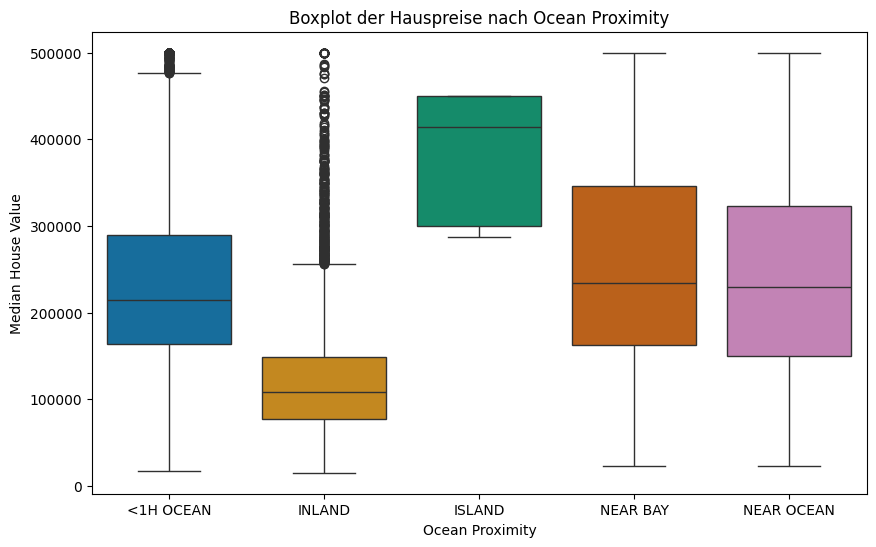

In [87]:
# Boxplot für 'ocean_proximity' und Hauspreise
plt.figure(figsize=(10, 6))
sns.boxplot(x='ocean_proximity', y='median_house_value', data=df, palette='colorblind', hue='ocean_proximity')
plt.title('Boxplot der Hauspreise nach Ocean Proximity')
plt.ylabel('Median House Value')
plt.xlabel('Ocean Proximity')
plt.show()

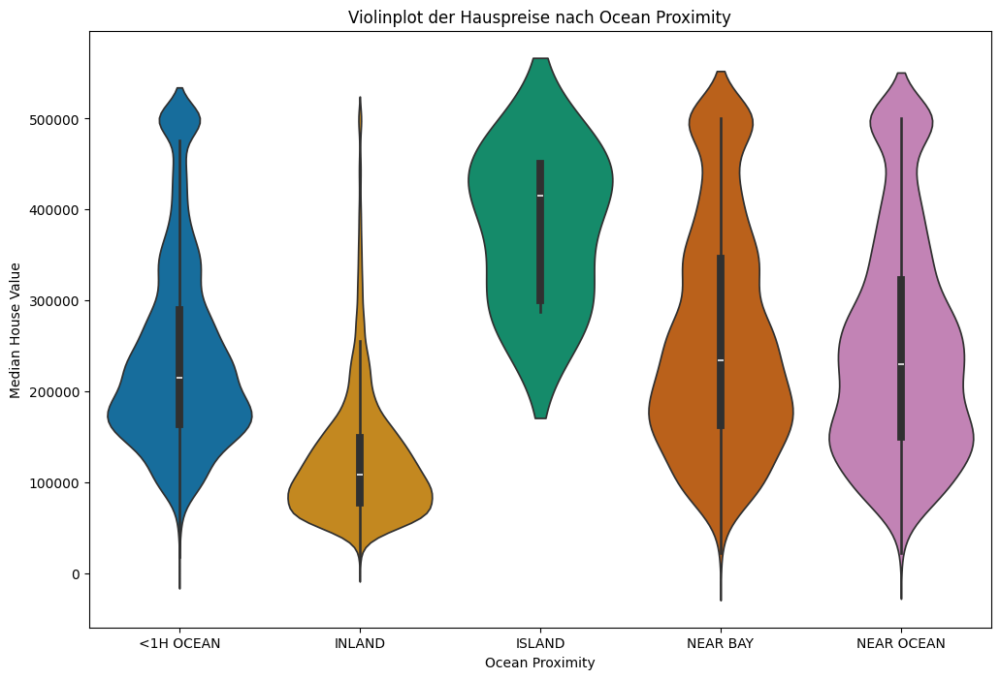

In [88]:
plt.figure(figsize=(12, 8))
sns.violinplot(x='ocean_proximity', y='median_house_value', data=df, palette='colorblind', hue='ocean_proximity')
plt.title('Violinplot der Hauspreise nach Ocean Proximity')
plt.ylabel('Median House Value')
plt.xlabel('Ocean Proximity')
plt.show()

Betrachtet man das Merkmal *ocean_proximity* stellt man fest, dass der höchste mittlere Hauspreis das Level 'ISLAND' ausweist. Er liegt bei über 400'000. Die Länge der Boxen zeigt den Interquartilbereich (IQR), der die mittleren 50% der Daten umfasst. Ein breiter IQR kann auf eine größere Variabilität der Hauspreise innerhalb dieser Kategorie hinweisen. Der Boxplot zeigt keine Ausreißer. Von der vorigen Aufgabe wissen wir jedoch, dass nur 0,2% der Datenpunkte das Label Inseln haben. Die Level 'NEAR BAY', 'NEAR OCEAN' und '<1H OCEAN' haben alle einen ähnlichen mittleren Medianhauswert. Auch ihre Verteilungen, gerade die der erstegenannteren 'NEAR BAY' und 'NEAR OCEAN', sehen ähnlich aus mit der Mehrzahl an Werten zwischen 50'0000 und 400'000 und einer erneuten Ausbeulung um 500'000. '<1H OCEAN' zeigt eine größere Ausbuchtung im Bereich der Werte um 180'000 und ist flacher in den anderen Bereichen. 'INLAND' zeigt den geringsten Medianhauswert. Auch die Verteilung ist sehr gestaucht. Die meisten Werte sind von 50'000 bis 200'000. Der Boxplot zeigt, dass die Plots von 'NEAR BAY' und 'NEAR OCEAN' zwar auch ähnlich sind, allerdings 'NEAR OCEAN' eine Box bei geringeren Werte (kleinere Werte für die Quartile) aufweist. Für beide Levels sind keine Ausreißer abgetragen. '<1H OCEAN' zeigt einige Ausreißer nach oben für die hohen wErte, das ist durch die Zentrierung der Verteilung um die mittleren Werte von 180'000 zu erkklären. Die meisten Ausreißer weist das Level 'INLAND' auf. Der obere Whisker endet bei bereits 200'000. Ein besseres Bild liefert hier auch der Violinplot, der die Verteilung zeigt. Die meisten Datenpunkte befinden sich zwischn 50'000 und 200'000. Der Mittelwert leigt bei ca. 100'000 und somit zeigt dieses Level den geringsten Mittlewert des Hauspreises von allen Leveln. Punkte, die außerhalb der "Whisker" (die Linien, die aus der Box herausragen) liegen, gelten als Ausreißer. Viele Ausreißer in einer Kategorie könnten auf eine heterogene Gruppe von Immobilien hinweisen oder auf spezielle Fälle, die gesondert untersucht werden sollten.

Gründe für das Verhalten hier könnten erneut soziodemografische Faktoren, Bevölkerungsdichte und das Vorhandensein von Arbeitsplätze in den großen und küstennahen Städten sein. 

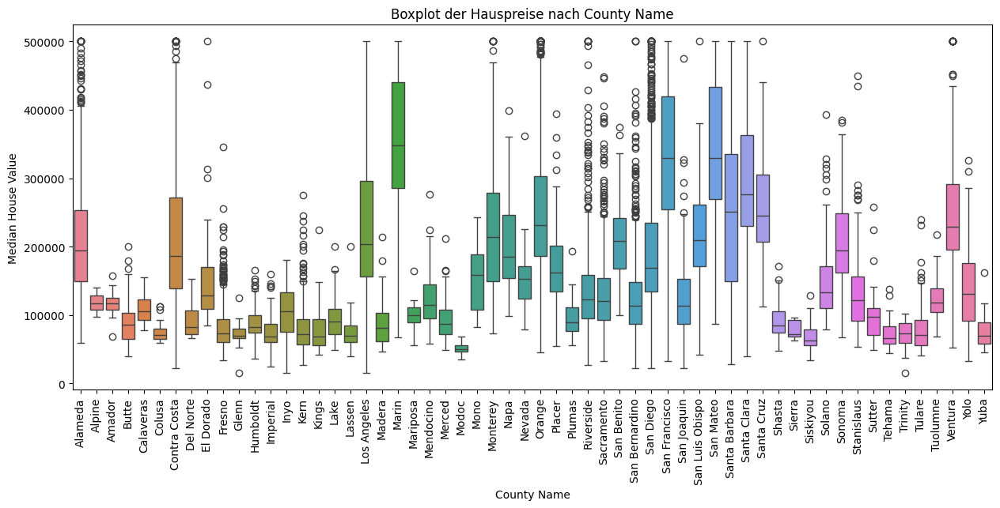

In [89]:
# Boxplot für 'county_name' und Hauspreise
plt.figure(figsize=(15, 6))
sns.boxplot(x='county_name', y='median_house_value', data=df, palette=palette_county, hue='county_name')
plt.title('Boxplot der Hauspreise nach County Name')
plt.ylabel('Median House Value')
plt.xlabel('County Name')
plt.xticks(rotation=90)  
plt.show()

Da county_name so viele Ausprägungen hat, wird der Violinplot mithilfe von plotly erzeugt. Der interaktive Plot lässt ein zoomen zu und auch das An- und Abwählen von Leveln auf der Legende.

In [90]:
# Erstellen eines Violinplots für die Spalte 'median_house_value' gruppiert nach 'county_name'
fig = px.violin(df, y='median_house_value', x='county_name',color='county_name')

# Anpassen der x-Achsenbeschriftungen, um sie zu rotieren
fig.update_layout(
    xaxis_tickangle=-45  # Rotieren der x-Achsenbeschriftungen um -45 Grad
)

# Anzeigen des Plots
fig.show(renderer='notebook')

Betrachtet man das Merkmal *county_name* stellt man fest, dass die höheren mittleren Einkommen in küstennahen Counties wie San Francisco, Marin (Teil des San Francisco Bay Areal) und Santa Barbara vorkommen. Die Länge der Boxen zeigt den Interquartilbereich (IQR), der die mittleren 50% der Daten umfasst. Ein breiter IQR kann auf eine größere Variabilität der Hauspreise innerhalb dieser Kategorie hinweisen.  Punkte, die außerhalb der "Whisker" (die Linien, die aus der Box herausragen) liegen, gelten als Ausreißer. Viele Ausreißer in einer Kategorie könnten auf eine heterogene Gruppe von Immobilien hinweisen oder auf spezielle Fälle, die gesondert untersucht werden sollten. Es gibt einige Counties, die Ausreißer aufweisen. Bekannte Beispiele sind Sacramento und San Diego. Diese großen Counties haben Bezirke mit höheren mittleren Hauswerten. Der Großteil liegt aber in den niedrigerne Bereichen. 

Gründe für das Verhalten hier könnten erneut soziodemografische Faktoren, Bevölkerungsdichte und das Vorhandensein von Arbeitsplätze in den großen und küstennahen Städten sein. 

Da die obigen Plots schweirig zu analysieren sind, wird analog zur Aufgabe A-3 b) ein Plot erstellt, der den mittlere Median House Value für jedes Level der nominalen Variablen berechnet. Die verschiedenen Werte wurden dann über ein Liniendiagramm dargestellt. Zusätzlich wurde für jedes Level bestimmt, wie viele Datenpunkte im Level vorhanden sind und diese als Balkendiagramm im gleichen Plot gezeigt. 

Zur einfacheren Interpretation wurden die Level so umsortiert, dass der *median_house_value* aufsteigend gezeigt wird.

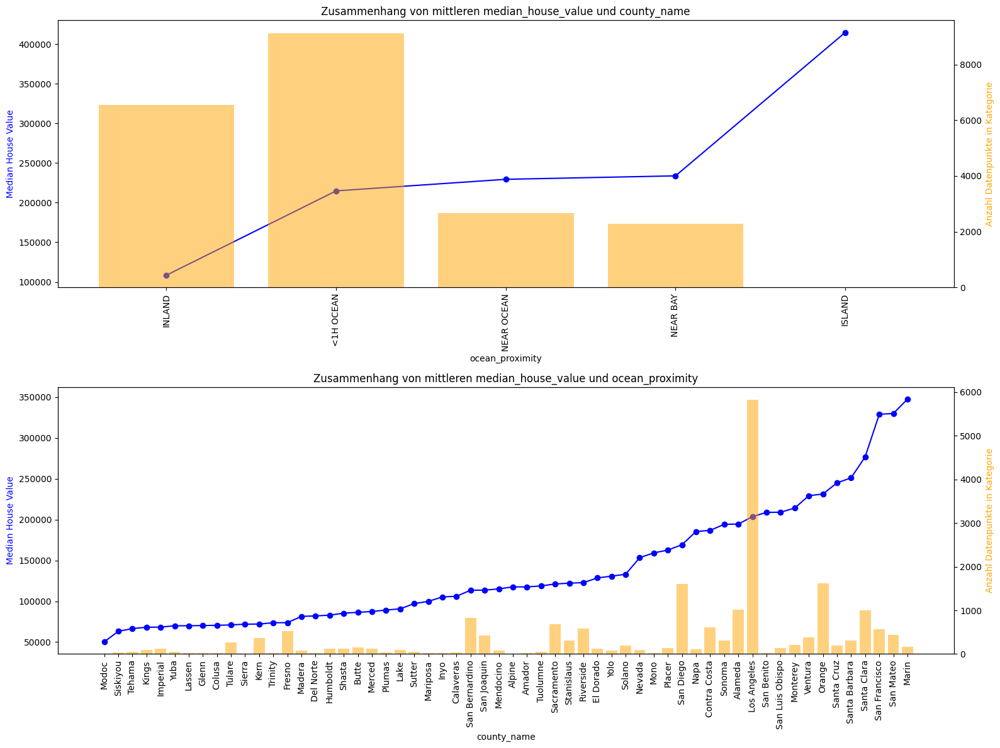

In [91]:
nominal_vars = ['ocean_proximity', 'county_name']  # Liste der nominalen Variablen
fig, axes = plt.subplots(2, 1, figsize=(16, 12))  # Eine Reihe pro nominale Variable

for j, col in enumerate(nominal_vars):
    # Gruppiere nach der nominalen Variable und berechne den Median von 'median_house_value'
    group_means = df.groupby(col, observed=True)['median_house_value'].median().sort_values()
    # Zähle die Anzahl der Beobachtungen in jeder Kategorie
    group_counts = df[col].value_counts().loc[group_means.index]
    
    plt.title(f'Zusammenhang von mittleren median_house_value und {col}')

    # Erstelle Bar-Chart für den Median
    axes[j].plot(group_means.index, group_means, marker='o', linestyle='-', color='blue')
    axes[j].set_xlabel(col)
    axes[j].set_ylabel('Median House Value', color='blue')
    axes[j].tick_params(axis='x', rotation=90)  # Drehe die x-Achsen-Beschriftungen, falls nötig

    # Sekundärachse für Anzahl der Datenpunkte pro Kategorie
    ax2 = axes[j].twinx()
    ax2.bar(group_counts.index, group_counts, alpha=0.5, color='orange')
    ax2.set_ylabel('Anzahl Datenpunkte in Kategorie', color='orange')

plt.tight_layout()  # Vermeide Überlappungen
plt.show()

Für *county_name* ist die Interpretation durch diesen Plot nun erleichtert, da er nur noch den mittleren Hauswert pro Level und die Anzahl der Datenpunkte pro Level zeigt. 
Die Counties mit dem höchsten mittleren Medianhauswert Marin (San Francisco Bay Area), San Mateo (San Francisco Bay Area), San Francisco, Santa Clara, Santa Barbara, Santa Cruz liegen alle sehr nach am Ozean. L.A. als County mit den meisten Datenpunkten zeigt einen geringeren mittleren Medianwert aus. Gründe könnten hier sein, dass es ärmere und reichere Gegenden sind, die im sample erfasst wurden. Die Counties mit dem geringsten mittleren Medianhauswert wie Modoc, Siskiyou und Tehama liegen nicht in der Nähe der Küste und im Norden des Landes.

Dies zeigt auch nachfolgende Grafik, die analog obiger Sortierung zeigt, welcher *ocean_proximity* Wert die Datenpunkten, die den einzelnen Counties zugeordnet sind, haben.  

In [92]:
order = df.groupby('county_name', observed=True)['median_house_value'].median().sort_values().index # Bringe Variablen in gleiche Sortierung

Die Funktion wurde analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

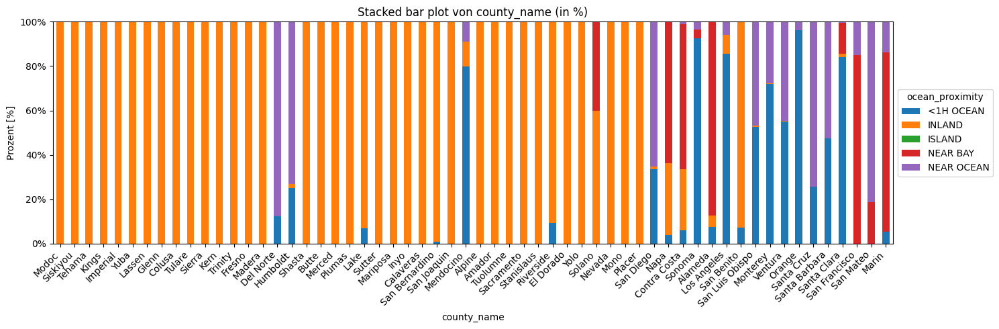

In [93]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 5))  # Set the figure size according to your preference
# Create a crosstab for stacked bar plot structure
ctab = pd.crosstab(df['county_name'], df['ocean_proximity'])
ctab = ctab.reindex(order)

ax2 = plt.subplot(1, 1, 1)  # Create a subplot for percentage values

# Normalize the crosstab by row and multiply by 100 to convert to percentages
ctab_normalized = ctab.div(ctab.sum(axis=1), axis=0) * 100

# Create a stacked bar plot for percentage values
ctab_normalized.plot(kind="bar", stacked=True, edgecolor="none", ax=ax2)

# Additional plot settings for percentage subplot
ax2.set_title('Stacked bar plot von county_name (in %)')
ax2.set_xlabel('county_name')
ax2.set_ylabel('Prozent [%]')
plt.xticks(rotation=90, ha='right')

# Make yticks be in percentages for the percentage subplot
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:.0f}%".format(int(x))))
ax2.set_ylim(0, 100)

# Display the final plot
plt.legend(title='ocean_proximity', loc='center left', bbox_to_anchor=(1, 0.5))
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Hier bestätigt sich obige Vermutung, dass Counties mit eher geringerem *median_house_value* im Inland liegen (weiter links) und die CCounties mit höherem *median_house_value* (weiter rechts) nahe am Ozean sind.

### Aufgabe A-6: Hauspreisprognosemodelle auf Basis der kategoriellen Features erstellen [Lernziel 3.3/3.4, 4.1 & 6; 6 Punkte]<a class="anchor" id="unterabschnitt-1-7"></a>
Ziel dieser Aufgabe ist die Erstellung weiterer Modelle basierend rein auf den kategoriellen Merkmalen.

##### a) Die Datenstrukturen für Training und Validierung sind analog zu Aufgabe A-4 b) anzulegen und zu verwenden.

<u>Lösungsansatz:</u>

Nun wird der Datensatz auf kategoriale Merkmale eingeschränkt

In [94]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
train_data = df[df['sample'] == 'A']
val_data = df[df['sample'] == 'B']

# Entfernen der Spalte 'sample' und Aufteilung in Features und Target
x_train = train_data.select_dtypes(include=['category']).drop(['sample'], axis=1)
y_train = train_data['median_house_value'] #Der Hauspreis ist die Zielvariablen

x_val = val_data.select_dtypes(include=['category']).drop(['sample'], axis=1)
y_val = val_data['median_house_value']

##### b) Zu verwenden ist ein einfaches lineares Modell ohne besondere Anpassungen. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern und zu kommentieren. Was ergibt sich im Vergleich mit den Modellen aus Aufgabe A-4?

<u>Lösungsansatz:</u>

Bei der Arbeit mit kategorialen Daten in einem linearen Regressionsmodell ist es manchmal notwendig, die kategorialen Faktoren in ein numerisches Format zu kodieren. Der Grund dafür ist, dass lineare Regressionsmodelle numerische Eingabemerkmale erfordern. Bei Nutzung von statsmodels kann diese Umkodierung aber weggelassen werden. Das passiert automatisch mit dem Datatype 'category'. 

In [95]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)
# RMSE berechnen
rmse_null = berechne_rmse(y_pred_null,y_val)

In [96]:
# Initialisieren und Trainieren des linearen Regressionsmodells
LR2 = smf.ols(formula='median_house_value ~ ocean_proximity + county_name', data=pd.concat([x_train, y_train], axis=1)).fit()

# Vorhersagen auf den Validierungsdaten
y_pred = LR2.predict(x_val)

# Berechnen des RMSE für die Validierungsdaten
rmse = berechne_rmse(y_pred,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_results['linear_regression_kat'] = rmse

print("Modell: Lineare Regression")
print(f"RMSE auf Validierungsdaten: {rmse:.2f}")
print("\nDie RMSE Differenz von Nullmodell und Linearem Modell (RMSE_{null} - RMSE_{LR}):", rmse_null-rmse)

Modell: Lineare Regression
RMSE auf Validierungsdaten: 91193.30

Die RMSE Differenz von Nullmodell und Linearem Modell (RMSE_{null} - RMSE_{LR}): 22814.85097834967


Zum Vergleich der RMSE_Werte wird der RMSE des Modells basiereds auf numerischen Werten aus dem vorher angelegten Dictionary *model_results* ausgelesen.:

In [97]:
print("\n Die RMSE Differenz von linearem Modell (num) und linearem Modell (kat):", model_results['linear_regression_num']-model_results['linear_regression_kat'])


 Die RMSE Differenz von linearem Modell (num) und linearem Modell (kat): -16684.35560587862


Da diese Zahl negativ ist, bedeutet es, dass die RMSE-Reduktion auf den Validierungsdaten im numerischen Modell höher war als im Modell basierend auf kategorialen Variablen. Allerdings beträgt die RMSE-Reduktion des linearen Modells basierend auf kategorialen Variablen im Vergleich zum naiven Nullmodell 22.814. Es findet also immer noch eine deutliche Reduktion statt.

Um das Ergebnis grafisch darzustellen, wurde erneut ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen der linearen Regression. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei der linearen Regression basierend auf den kategorialen Variablen sieht man eine breitere Streuung. Allerdings sind auch klare horizontale Linien erkennbar, diese werden durch die beiden kategorialen Merkmale verursacht. Einzelne Level haben vermutlich eine stärkere Wirkung auf die Regression. Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

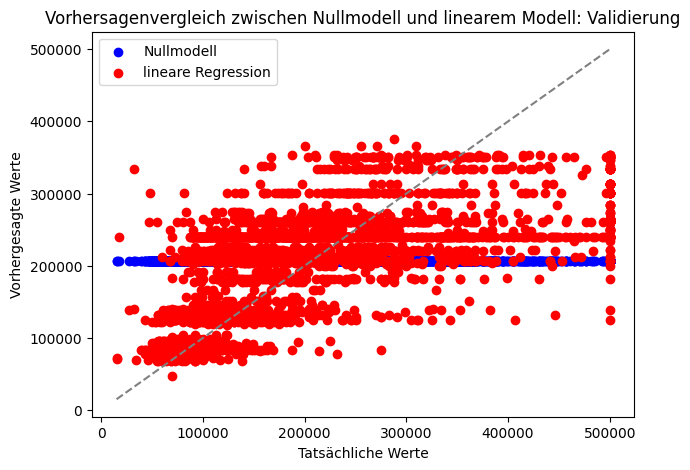

In [98]:
vergleich_modell(y_pred, y_pred_null, y_val, 'linearem Modell: Validierung')

In [99]:
display(LR2.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.376
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     141.8
Date:                Thu, 09 May 2024   Prob (F-statistic):               0.00
Time:                        19:18:22   Log-Likelihood:            -1.8517e+05
No. Observations:               14421   AIC:                         3.705e+05
Df Residuals:                   14359   BIC:                         3.709e+05
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                       2.002e+05   5590.776     35.811      0.000    1.89e+05    2.11e+05
ocean_proximity[T.INLAND]      -1.851e+04   4155.971     -4.454      0.000   -2.67e+04   -1.04e+04
ocean_proximity[T.ISLAND]       1.356e+05   6.47e+04      2.096      0.036    8777.706    2.62e+05
ocean_proximity[T.NEAR BAY]     1.233e+04   4878.505      2.528      0.011    2768.264    2.19e+04
ocean_proximity[T.NEAR OCEAN]   2.477e+04   3190.494      7.763      0.000    1.85e+04     3.1e+04
county_name[T.Alpine]            -6.3e+04   5.31e+04     -1.186      0.236   -1.67e+05    4.11e+04
county_name[T.Amador]          -6.341e+04   2.08e+04     -3.048      0.002   -1.04e+05   -2.26e+04
county_name[T.Butte]           -8.848e+04   1.06e+04     -8.360      0.000   -1.09e+05   -6.77e+04
county_name[T.Calaveras]        -7.79e+04      2e+04     -3.904      0.000   -1.17e+05   -3.88e+04
county_name[T.Colusa]          -1.035e+05    2.6e+04     -3.976      0.000   -1.55e+05   -5.25e+04
county_name[T.Contra Costa]     9171.6898   5753.060      1.594      0.111   -2105.050    2.04e+04
county_name[T.Del Norte]        -1.31e+05   2.51e+04     -5.209      0.000    -1.8e+05   -8.17e+04
county_name[T.El Dorado]       -3.568e+04   1.14e+04     -3.120      0.002   -5.81e+04   -1.33e+04
county_name[T.Fresno]          -9.842e+04   7657.598    -12.853      0.000   -1.13e+05   -8.34e+04
county_name[T.Glenn]            -1.11e+05   2.36e+04     -4.704      0.000   -1.57e+05   -6.48e+04
county_name[T.Humboldt]        -1.272e+05   1.14e+04    -11.173      0.000    -1.5e+05   -1.05e+05
county_name[T.Imperial]        -1.092e+05   1.12e+04     -9.748      0.000   -1.31e+05   -8.72e+04
county_name[T.Inyo]            -8.181e+04   2.29e+04     -3.565      0.000   -1.27e+05   -3.68e+04
county_name[T.Kern]            -9.881e+04   8091.138    -12.212      0.000   -1.15e+05   -8.29e+04
county_name[T.Kings]           -1.058e+05   1.29e+04     -8.233      0.000   -1.31e+05   -8.06e+04
county_name[T.Lake]            -9.351e+04    1.3e+04     -7.210      0.000   -1.19e+05   -6.81e+04
county_name[T.Lassen]          -1.104e+05   2.23e+04     -4.943      0.000   -1.54e+05   -6.67e+04
county_name[T.Los Angeles]      3.923e+04   5654.254      6.938      0.000    2.81e+04    5.03e+04
county_name[T.Madera]          -1.001e+05   1.39e+04     -7.218      0.000   -1.27e+05   -7.29e+04
county_name[T.Marin]            1.408e+05   9218.954     15.278      0.000    1.23e+05    1.59e+05
county_name[T.Mariposa]        -8.348e+04   2.51e+04     -3.321      0.001   -1.33e+05   -3.42e+04
county_name[T.Mendocino]       -8.074e+04   1.42e+04     -5.704      0.000   -1.08e+05    -5.3e+04
county_name[T.Merced]          -8.654e+04   1.12e+04     -7.695      0.000   -1.09e+05   -6.45e+04
county_name[T.

Der Intercept des Modells ist 2,002e+05. Die Levels von *ocean_proximity* sind alle signifikant (p-value <5%). Bei *county_name* sind einige Ausprägungen nicht signifikant. Hier ist mit obiger Häufigkeitsverteilung zu vergleichen, ob es sich bei den Leveln um Level mit vielen Datenpunkten handelt. 
Die nicht signifikanten Counties sind: Alpine, Contra Costa, Mono, Napa, Placer, San Benito, San Luis Obispo, Sonoma. Es zeigt sich, dass eine moderate bis geringe Anzahl an Datenpunkten in den Counties liegt.

Beide kategoriellen Merkmale sind allerdings auch Merkmale, die die "Location" spezifizieren. Wir haben einmal eine grobe Gruppierung, ob sich der Datenpunkt in der Nähe des Ozeans befindet und einmal eine Aussage, in welchem County sich der Datenpunkt befindet. *longitude* und *latitude* liefern diese Informationen durch ihre Koordinaten ebenfalls. 

Das Modell weist einen $R^2$ Wert von 0.376 auf, was nach obiger Diskussion in A-4a) zeigt, dass das Modell die Daten noch nicht gut erklärt. Lediglich 37,6% der Varianz der abhängigen Variablen wird durch die unabhängigen Variablen *ocean_proximity* und *county_name* erklärt. Der Wert ist schlechter als beim Modell basierend auf numerischen Variablen, was durch den Zusammenhang von RMSE und $R^2$ und dem schlechteren RMSE zu erwarten ist. 

##### c) Analog zu Aufgabe A-4 ist CatBoost ohne weitere Anpassungen zu verwenden. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern. Zusätzlich ist die (CatBoost-interne) Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren. Was ergibt sich im Vergleich zu dem Modell aus Aufgabe A-4?

<u>Lösungsansatz:</u>

In [100]:
cat_features = ['ocean_proximity', 'county_name']

# Initialisierung des CatBoost-Modells mit Standardparametern. Unterdrücke Ausgabe mithilfe von 'logging_level' Parameter
catboost_model = CatBoostRegressor(loss_function='RMSE', eval_metric='RMSE', random_seed = seed, task_type = device_CatBoost)

# Trainieren des Modells 
catboost_model.fit(x_train, y_train, cat_features=cat_features, logging_level='Silent')
y_pred_catboost = catboost_model.predict(x_val)

# RMSE
rmse_catboost = berechne_rmse(y_pred_catboost,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_results['CatBoost_kat'] = rmse_catboost

print(f"CatBoost RMSE: {rmse_catboost:.2f}")
print("Die RMSE Differenz zum Nullmodell beträgt:", rmse_null-rmse_catboost)
print(f"CatBoost Parameters: {catboost_model.get_params()}")

# Feature Importance
feature_importance = {feature: importance for feature, importance in zip(x_train.columns, catboost_model.get_feature_importance())}
print(f"\n CatBoost Feature Importances:")
for feature, importance in feature_importance.items():
    print(feature, ": ", importance)

CatBoost RMSE: 90116.85
Die RMSE Differenz zum Nullmodell beträgt: 23891.291477296734
CatBoost Parameters: {'loss_function': 'RMSE', 'random_seed': 42, 'eval_metric': 'RMSE', 'task_type': 'GPU'}

 CatBoost Feature Importances:
ocean_proximity :  24.06236623549136
county_name :  75.93763376450863


Der absolute RMSE Wert auf den Validierungsdaten ist geringer als bei der linearen Regression basierend auf kategoriellen Variablen. Im Vergleich zum Nullmodell ist der RMSE um 24.375 Punkte gesunken. 
Dies deutet darauf hin, dass CatBoost besser in der Lage ist, die Varianz in den Daten zu erklären und genauere Vorhersagen zu liefern als das naive Nullmodell und die lineare Regression basierend auf kategoriellen Variablen. Allerdings ist der Wert für RMSE höher als beim linearen Modell mit numerischen Variablen und beim CatBoost Modell mit numerischen Variablen. Die entsprechende Auswertung findet sich in folgendem Code:

In [101]:
print("\n Die RMSE Differenz von CatBoost (num) und Catboost (kat):", model_results['CatBoost_num']-model_results['CatBoost_kat'])


 Die RMSE Differenz von CatBoost (num) und Catboost (kat): -39645.8612225449


Bei der RMSE Differenz auf Validierungsdaten zeigt sich, dass das CatBoost Modell basierend auf kategoriellen daten deutlich schlechtere Ergebnisse liefert als das Modell basierend auf numerischen Variablen.

Die nachfolgende Hyperparameter-Liste wurden analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

In [102]:
# Display all model hyperparameters in a DataFrame
hyperparams_list = [(k, v) for k, v in catboost_model.get_all_params().items()]
hyperparams_df = pd.DataFrame(hyperparams_list, columns=['Hyperparameter', 'Value'])
display(hyperparams_df.style.hide(axis='index'))

Hyperparameter,Value
nan_mode,Min
gpu_ram_part,0.950000
eval_metric,RMSE
combinations_ctr,"['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1', 'FeatureFreq:CtrBorderCount=15:CtrBorderType=Median:Prior=0/1']"
iterations,1000
fold_permutation_block,64
leaf_estimation_method,Newton
observations_to_bootstrap,TestOnly
random_score_type,NormalWithModelSizeDecrease
counter_calc_method,SkipTest


Um das Ergebnis grafisch darzustellen, wurde erneut ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen von CatBoost. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei CatBoost, basierend auf den kategorialen Variablen, sieht man eine breitere Streuung. Allerdings sind auch klare horizontale Linien erkennbar, diese werden durch die kategorialen Merkmale verursacht. Einzelne Level haben vermutlich eine stärkere Wirkung auf die Zielvariablen. Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

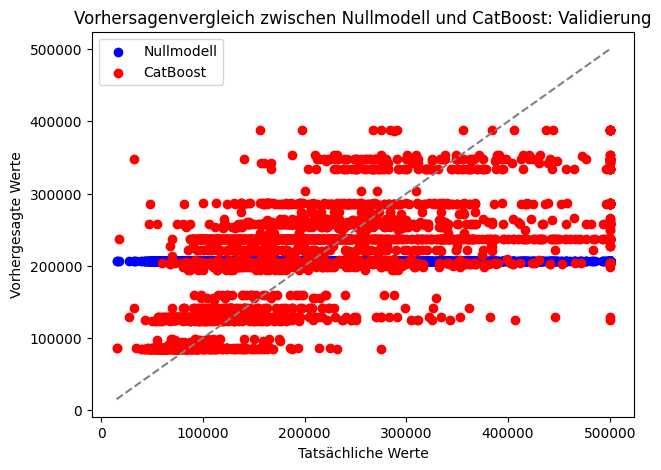

In [103]:
vergleich_modell(y_pred_catboost, y_pred_null, y_val, 'CatBoost: Validierung', 'CatBoost')

Abschließend ist noch die Feature Importance grafisch dargestellt.

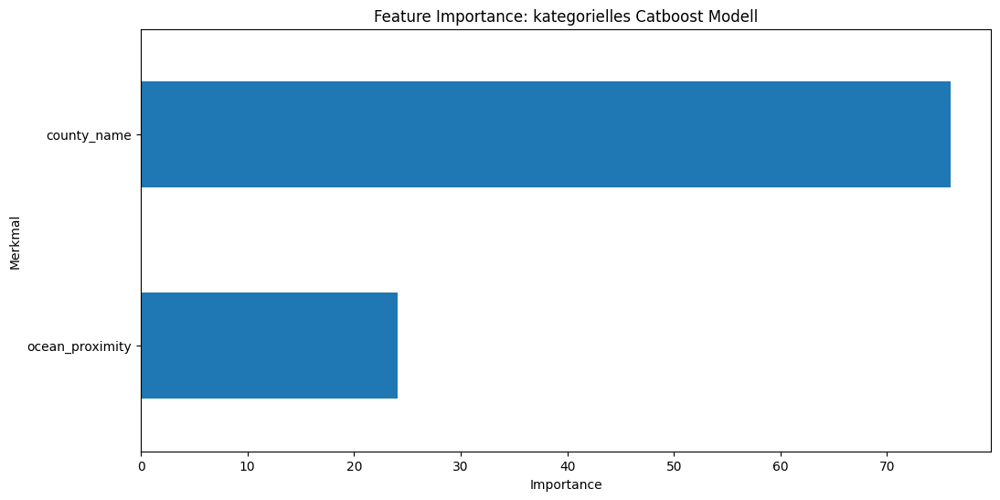

In [104]:
plot_feature_importance(catboost_model,x_train.columns,"kategorielles Catboost Modell")

Der Output der Feature-Importance eines CatBoost-Modells basierend auf kategoriellen Variablen zeigt die relative Bedeutung jeder kategoriellen Variable für die Vorhersage des Modells.
Die Variablen *ocean_proximity* und *county_name* haben beide eine hohe Bedeutung für das Modell, wobei *ocean_proximity* einen etwas höheren Einfluss hat als *county_name*. Dies könnte darauf hindeuten, dass geografische Lageinformationen (nahe am Ozean, Landesinnere) eine starke Vorhersagekraft für das Modell haben. Die geografische Lage wird somit als sehr wichtig für den Wert des Hauses betrachtet. 

### Aufgabe A-7: Benchmark-Modelle mit numerischen und kategoriellen Features erstellen [Lernziele 3.3/3.4, 4.1 & 6; 7 Punkte]<a class="anchor" id="unterabschnitt-1-8"></a>
Nach den bisher betrachteten Modellen, die entweder rein auf den numerischen bzw. kategoriellen Merkmalen bestanden, sollen in diesem Abschnitt kombinierte Modelle betrachtet werden.

##### a) Analog zu den Aufgaben A-4 und A-6 ist ein lineares Modell mit Berücksichtigung sowohl der numerischen Merkmale als auch der kategoriellen Merkmale ocean_proximity und county_name zu erstellen. Die Ergebnisse der Modellierung sind auszugeben und zu kommentieren sowie die Ergebniswerte samt Laufzeit zu speichern. Wie ist dieses Modell im Vergleich zu den beiden anderen (linearen) zu bewerten?

<u>Lösungsansatz:</u>

Zunächst werden hier die kombinierten sample für die Trainings- und Validierungsdaten betrachtet:

In [105]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
train_data = df[df['sample'] == 'A']
val_data = df[df['sample'] == 'B']

# Entfernen der Spalte 'sample' und Aufteilung in Features und Target 
x_train = train_data.drop(['sample', 'median_house_value'], axis=1)
y_train = train_data['median_house_value'] #Der Hauspreis ist die Zielvariablen

x_val = val_data.drop(['sample','median_house_value'], axis=1)
y_val = val_data['median_house_value']

In [106]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)
# RMSE berechnen
rmse_null = berechne_rmse(y_pred_null,y_val)

In [107]:
# Modell erstellen und trainieren
#Berechnung der Laufzeit zum fitten des Modells
start_time = time.time() # Startzeit
LR3 = smf.ols(formula='median_house_value ~ latitude+longitude+housing_median_age+population+median_income\
    +rooms_per_house+ocean_proximity + county_name', data=pd.concat([x_train, y_train], axis=1)).fit()
end_time = time.time() # Endzeit
runtime = end_time - start_time # Laufzeit

y_pred = LR3.predict(x_val)

# RMSE
rmse = berechne_rmse(y_pred,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_name.append('Linear_Regression')
model_rmse.append(rmse)
model_laufzeit.append(runtime)

# Ergebnisse
print(f"RMSE: {rmse:.2f}")
print(f"Laufzeit: {runtime:.4f} Sekunden")
print("\nDie RMSE Differenz zum Nullmodell auf Validierungsdaten beträgt:", rmse_null-rmse)

RMSE: 69098.04
Laufzeit: 0.1006 Sekunden

Die RMSE Differenz zum Nullmodell auf Validierungsdaten beträgt: 44910.10163422499


Zum Vergleich der RMSE_Werte wird der RMSE des Modells basiereds auf numerischen Variablen und der basierend auf dem Modell mit kategoriellen Variablen aus dem vorher angelegten Dictionary *model_results* ausgelesen.:

In [108]:
print("\n Die RMSE Differenz von linearem Modell (ges) und Linearem Modell (num):", rmse-model_results['linear_regression_kat'])
print("\n Die RMSE Differenz von linearem Modell (ges) und Linearem Modell (kat):", rmse-model_results['linear_regression_num'])


 Die RMSE Differenz von linearem Modell (ges) und Linearem Modell (num): -22095.250655875323

 Die RMSE Differenz von linearem Modell (ges) und Linearem Modell (kat): -5410.895049996703


Da diese Zahlen beide negativ sind, bedeutet es, dass die RMSE-Reduktion auf den Validierungsdaten im Modell basierend auf beiden Datentypen (numerisch und kategorial) höher ist als im Modell basierend auf rein numerischen oder rein kategorialen Variablen. Die RMSE-Reduktion des linearen Modells beträgt im Vergleich zum naiven Nullmodell 44.923. Es findet also eine deutliche Reduktion statt.

Um das Ergebnis grafisch darzustellen, wurde erneut ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen der linearen Regression. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei der linearen Regression sieht man eine breitere Streuung. Allerdings sind auch klare horizontale Linien erkennbar, diese werden durch die kategorialen Merkmale verursacht. Einzelne Level haben vermutlich eine stärkere Wirkung auf die Regression. Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

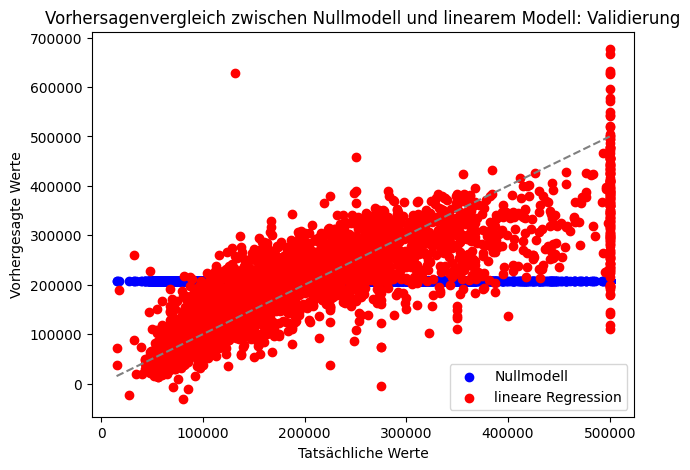

In [109]:
vergleich_modell(y_pred, y_pred_null, y_val, 'linearem Modell: Validierung')

In [110]:
display(LR3.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     median_house_value   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.669
Method:                 Least Squares   F-statistic:                     436.3
Date:                Thu, 09 May 2024   Prob (F-statistic):               0.00
Time:                        19:19:00   Log-Likelihood:            -1.8056e+05
No. Observations:               14421   AIC:                         3.613e+05
Df Residuals:                   14353   BIC:                         3.618e+05
Df Model:                          67                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept                       -3.97e+06   3.38e+05    -11.733      0.000   -4.63e+06   -3.31e+06
ocean_proximity[T.INLAND]      -4367.1640   3213.434     -1.359      0.174   -1.07e+04    1931.582
ocean_proximity[T.ISLAND]       1.496e+05   4.71e+04      3.177      0.001    5.73e+04    2.42e+05
ocean_proximity[T.NEAR BAY]     2.321e+04   3571.630      6.499      0.000    1.62e+04    3.02e+04
ocean_proximity[T.NEAR OCEAN]   2.366e+04   2416.191      9.793      0.000    1.89e+04    2.84e+04
county_name[T.Alpine]           7.307e+04   3.92e+04      1.864      0.062   -3766.292     1.5e+05
county_name[T.Amador]           3.556e+04   1.57e+04      2.268      0.023    4832.059    6.63e+04
county_name[T.Butte]            2.822e+04   1.04e+04      2.715      0.007    7843.878    4.86e+04
county_name[T.Calaveras]        2.448e+04   1.51e+04      1.623      0.105   -5086.310     5.4e+04
county_name[T.Colusa]          -2.499e+04   1.96e+04     -1.278      0.201   -6.33e+04    1.33e+04
county_name[T.Contra Costa]    -6733.4119   4276.527     -1.575      0.115   -1.51e+04    1649.133
county_name[T.Del Norte]       -4.542e+04   2.42e+04     -1.875      0.061   -9.29e+04    2070.075
county_name[T.El Dorado]        6.666e+04      1e+04      6.636      0.000     4.7e+04    8.63e+04
county_name[T.Fresno]           4128.2198   8474.862      0.487      0.626   -1.25e+04    2.07e+04
county_name[T.Glenn]           -1.587e+04   1.84e+04     -0.862      0.388   -5.19e+04    2.02e+04
county_name[T.Humboldt]        -7.386e+04   1.47e+04     -5.024      0.000   -1.03e+05    -4.5e+04
county_name[T.Imperial]         8.423e+04   2.42e+04      3.484      0.000    3.68e+04    1.32e+05
county_name[T.Inyo]             1.076e+05   1.96e+04      5.505      0.000    6.93e+04    1.46e+05
county_name[T.Kern]             4970.7157   1.27e+04      0.393      0.694   -1.98e+04    2.98e+04
county_name[T.Kings]           -9153.3791    1.2e+04     -0.762      0.446   -3.27e+04    1.44e+04
county_name[T.Lake]            -3.312e+04   1.05e+04     -3.154      0.002   -5.37e+04   -1.25e+04
county_name[T.Lassen]            5.96e+04   1.97e+04      3.027      0.002     2.1e+04    9.82e+04
county_name[T.Los Angeles]      1.157e+05   1.62e+04      7.126      0.000    8.39e+04    1.48e+05
county_name[T.Madera]           7684.4907   1.14e+04      0.673      0.501   -1.47e+04    3.01e+04
county_name[T.Marin]             7.73e+04   6842.059     11.298      0.000    6.39e+04    9.07e+04
county_name[T.Mariposa]         3.946e+04    1.9e+04      2.077      0.038    2221.539    7.67e+04
county_name[T.Mendocino]       -3.831e+04   1.21e+04     -3.163      0.002    -6.2e+04   -1.46e+04
county_name[T.Merced]            104.3183   8948.795      0.012      0.991   -1.74e+04    1.76e+04
county_name[T.

Der Intercept des Modells ist -3,97e+06. 
Den stärksten Einfluss im Modell haben *longitude*, *latitude* und *median_income*. Die Koeffizienten geben an, wie stark sich die abhängige Variable verändert, wenn sich die entsprechende unabhängige Variable um eine Einheit verändert. Negative Vorzeichen bedeuten, dass es eine negative Korrelation zwischen dem jeweiligen unabhängigen Merkmal (*latitude*, *longitude*, *population*) und der abhängigen Variablen (*median_house_value*) gibt. Dies wurde schon oben bei Berechnung des Korrelationskoeffizienten deutlich. Das heißt, wenn der Wert des unabhängigen Merkmals steigt, wird erwartet, dass der Wert der abhängigen Variablen sinkt, und umgekehrt.

Von den kategoriellen Variablen ist beim Merkmal *ocean_proximity* das Level INLAND nun nicht mehr signifikant. 
Einige Level des Merkmals *county_name* sind nicht signifikant. 

Das Modell weist einen $R^2$ Wert von 0.671 auf, was zeigt, dass im Modell 67,1% der Varianz der abhängigen Variablen durch die unabhängigen Variablen erklärt wird. Der Wert ist höher als bei den Modellen basierend auf numerischen und kategoriellen Variablen, was durch den Zusammenhang von RMSE und $R^2$ und dem besseren RMSE zu erwarten ist. 

##### b) Analog zu den Aufgaben A-4 und A-6 ist CatBoost (ohne weitere Anpassungen) mit Berücksichtigung sowohl der numerischen Merkmale als auch der kategoriellen Merkmale ocean_proximity und county_name anzuwenden. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte samt Laufzeit zu speichern. Zusätzlich ist eine grafische Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren. Wie ist dieses Modell im Vergleich zu den beiden anderen (CatBoost) zu bewerten?

<u>Lösungsansatz:</u>

In [111]:
# Liste der kategorialen Features für CatBoost
cat_features = ['ocean_proximity', 'county_name']

# Initialisieren des CatBoost Regressors
start_time = time.time()
catboost_model = CatBoostRegressor(loss_function='RMSE', eval_metric='RMSE', random_seed = seed, task_type = device_CatBoost)
catboost_model.fit(x_train, y_train, cat_features=cat_features, logging_level='Silent')
end_time = time.time()
runtime = end_time - start_time

# Vorhersagen treffen
y_pred_catboost = catboost_model.predict(x_val)

# RMSE
rmse_catboost = berechne_rmse(y_pred_catboost,y_val)

# Speichern des RMSE in oben angelegtem dictionary
model_name.append(f'CatBoost_{gpu_name}')
model_rmse.append(rmse_catboost)
model_laufzeit.append(runtime)

# Ergebnisse
print(f"RMSE: {rmse_catboost:.2f}")
print(f"Laufzeit: {runtime:.4f} Sekunden")

print("Die RMSE Differenz zum Nullmodell beträgt:", rmse_null-rmse_catboost)
print(f"CatBoost Parameters: {catboost_model.get_params()}")

# Feature Importance
feature_importance = {feature: importance for feature, importance in zip(x_train.columns, catboost_model.get_feature_importance())}
print(f"\n CatBoost Feature Importances:")
for feature, importance in feature_importance.items():
    print(feature, ": ", importance)

RMSE: 50030.34
Laufzeit: 19.4891 Sekunden
Die RMSE Differenz zum Nullmodell beträgt: 63977.80855766901
CatBoost Parameters: {'loss_function': 'RMSE', 'random_seed': 42, 'eval_metric': 'RMSE', 'task_type': 'GPU'}

 CatBoost Feature Importances:
latitude :  18.237090278876853
longitude :  19.498333024619544
housing_median_age :  5.167238334661283
population :  1.3893154049337866
median_income :  29.38725675598928
ocean_proximity :  14.695713947524771
county_name :  8.917759647986038
rooms_per_house :  2.7072926054085578


Zum Vergleich der RMSE_Werte wird der RMSE des Modells basiereds auf numerischen Variablen und der basierend auf dem Modell mit kategoriellen Variablen aus dem vorher angelegten Dictionary *model_results* ausgelesen:

In [112]:
print("\n Die RMSE Differenz von Catboost Modell (ges) und Catboost Modell (num):", rmse_catboost-model_results['CatBoost_kat'])
print("\n Die RMSE Differenz von Catboost Modell (ges) und Catboost Modell (kat):", rmse_catboost-model_results['CatBoost_num'])


 Die RMSE Differenz von Catboost Modell (ges) und Catboost Modell (num): -40086.51708037227

 Die RMSE Differenz von Catboost Modell (ges) und Catboost Modell (kat): -440.6558578273689


Der absolute RMSE Wert ist geringer als bei den Modellen basierend auf kategoriellen Variablen (Differenz -41161) und und numerischen Variablen (Differenz -441). Im Vergleich zum Nullmodell ist sie um circa 65000 Punkte gesunken. 
Dies deutet darauf hin, dass CatBoost nochmals besser in der Lage ist, die Varianz in den Daten zu erklären und genauere Vorhersagen zu liefern als das naive Nullmodell und die CatBoost Modelle basierend auf jeweils nur einem Datentyp. Die Hinzunahme von nichtlinearen Effekten und tieferen Interaktionen, wie es in CatBoost möglich ist, zeigt eine Verbesserung des RMSE. 


Die nachfolgende Hyperparameter-Liste wurden analog zum Notebook [binary-classification-credit-scoring](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/binary-classification-credit-scoring.ipynb) angelegt, Stand: 24.4.2023

In [113]:
# Display all model hyperparameters in a DataFrame
hyperparams_list = [(k, v) for k, v in catboost_model.get_all_params().items()]
hyperparams_df = pd.DataFrame(hyperparams_list, columns=['Hyperparameter', 'Value'])
display(hyperparams_df.style.hide(axis='index'))

Hyperparameter,Value
nan_mode,Min
gpu_ram_part,0.950000
eval_metric,RMSE
combinations_ctr,"['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1', 'FeatureFreq:CtrBorderCount=15:CtrBorderType=Median:Prior=0/1']"
iterations,1000
fold_permutation_block,64
leaf_estimation_method,Newton
observations_to_bootstrap,TestOnly
random_score_type,NormalWithModelSizeDecrease
counter_calc_method,SkipTest


Um das Ergebnis grafisch darzustellen, wurde erneut ein Diagramm erstellt, das die tatsächlichen Werte und die Vorhersagen beider Modelle vergleicht (es handelt sich um ein Streudiagramm mit den tatsächlichen Werten auf der x-Achse und den Vorhersagen auf der y-Achse). Die blauen Punkte sind die Werte des Nullmodells, die roten Punkte die Schätzungen von CatBoost. Beim Nullmodell wird für jeden tatsächlichen Wert der Mittelwert angenommen. Dadurch ergibt sich eine horizontale Linie. Bei Catboost  basierend auf den allen Variablen sieht man einen linearen Trend.
Die graue gestrichelte Linie indiziert die perfekte Vorhersage.

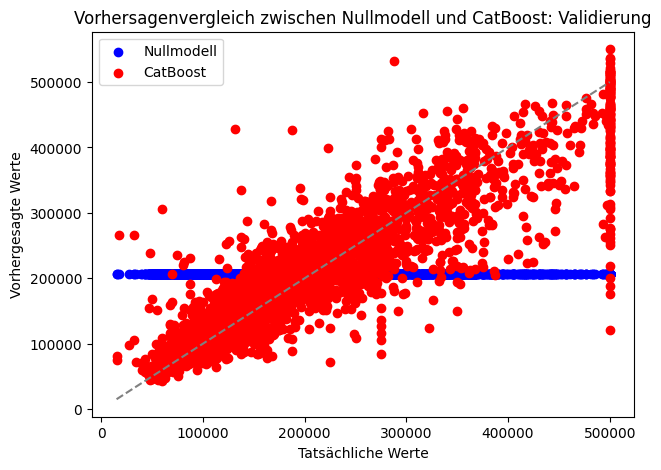

In [114]:
vergleich_modell(y_pred_catboost, y_pred_null, y_val, 'CatBoost: Validierung', 'CatBoost')

Im Vergleich zum Graphen mit dem linearen Modell sieht man hier einen deutlicheren linearen Trend.

Abschließend ist noch die Feature Importance grafisch dargestellt.

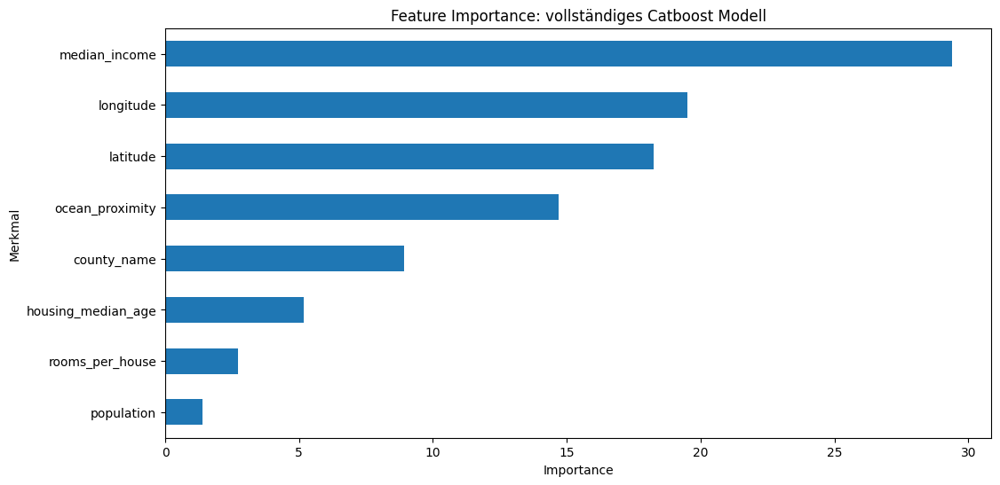

In [115]:
plot_feature_importance(catboost_model,x_train.columns,"vollständiges Catboost Modell")

Die Feature Importance zeigt, dass alle Variablen genutzt werden und mindestens einmal im Modell vorkommen. 

Der Output der Feature-Importance eines CatBoost-Modells basierend auf allen Variablen zeigt die relative Bedeutung jeder numerischen Variable für die Vorhersage des Modells.
Die Variablen *meadian_income*, *Latitude* und *Longitude* haben die höchste Bedeutung für das Modell. Dies könnte darauf hindeuten, dass geografische Lageinformationen eine starke Vorhersagekraft für das Modell haben. Die geografische Lage wird somit als sehr wichtig für den Wert des Hauses betrachtet.
Die Variable Median Income hat ebenfalls einen signifikanten Einfluss auf die Vorhersagen des Modells. Dies deutet darauf hin, dass das Einkommen der Bevölkerung in einem bestimmten Gebiet eine wichtige Rolle bei der Vorhersage des Hauswertes spielt. Auch hier haben obige Karten schon gezeigt, dass in der Nähe zu größeren Städten die mittleren Einkommen tendenziell höher sind und ebenso die Hauswerte.

Longitude hat eine höhere Feature Importance als Latitude, was daurf hindeuted, dass der Breitengrad nochmal stärker differenziert. Interessant ist, dass *ocean_proximity* eine ähnliche Importance aufweist. Die Variable *county_name*, die im linearen Modell keine berücksichtigung findet, wird hier nun verwendet. 

Die Anzahl der Räume pro Haus und die Variablen *Housing_median_age* und *population* haben ebenso Einfluss auf die Vorhersagen des Modells, wenn auch etwas geringer im Vergleich zu den vorher genannten.

Gerade *population* hat die geringste Feature Importance und demzufolge nur einen vergleichsweise geringeren Einfluss auf die Vorhersagen des Modells, was darauf hindeutet, dass sie weniger stark mit der abhängigen Variablen korrelieren. beziehungsweise die Informationen auch durch die anderne Variablen schon erklärt wurden. 

Die Feature Importance gibt an, welche Merkmale das Modell als am wichtigsten für die Vorhersagen betrachtet. Hohe Werte bedeuten, dass ein Merkmal einen großen Einfluss auf die Vorhersage hat. Dies kann nützlich sein, um zu verstehen, welche Merkmale am meisten zur Vorhersage beitragen und möglicherweise auch um das Modell weiter zu verfeinern, indem weniger wichtige Merkmale entfernt werden (Priorisierung der Feature). 

In [116]:
catboost_model.save_model(os.path.join(models_path, f'catboost_model_{gpu_name}.cbm'), format='cbm') #Speichern des Modells

##### c) Wie sind die Laufzeiten und Prognosefehler der in dieser Aufgabe erstellten Modelle im Vergleich und wie sind die Werte und Unterschiede zu bewerten? Basierend auf den Ergebnissen dieses Abschnitts soll ein abschließendes Fazit gezogen werden.

<u>Lösungsansatz:</u>

In nachfolgenden Graphen werden nun die Laufzeiten und RMSE Werte des linearen Modells und von CatBoost basierend auf allen Variablen gegenüber gestellt.

In [117]:
pd.DataFrame(dict)

,Model name,RMSE,Laufzeit
0,Linear_Regression,69098.044735,0.100598
1,CatBoost_gpu,50030.337811,19.489086


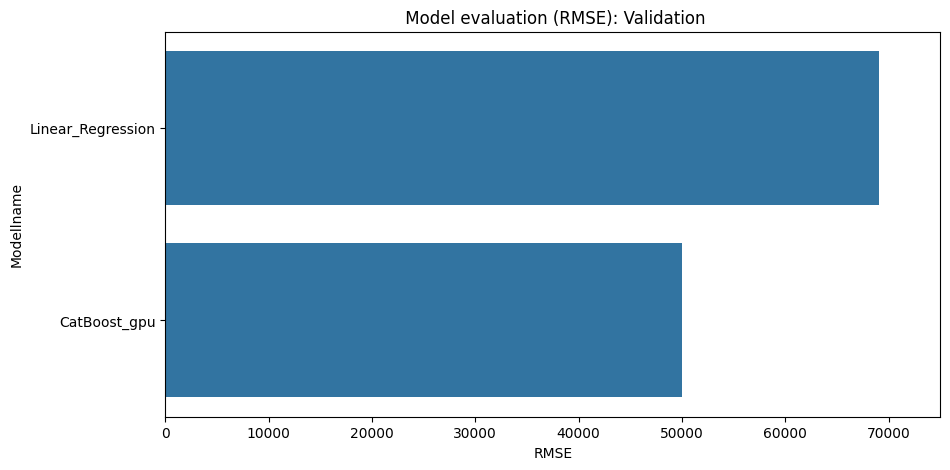

In [118]:
plot_rmse(dict,0,75000, "Validation")

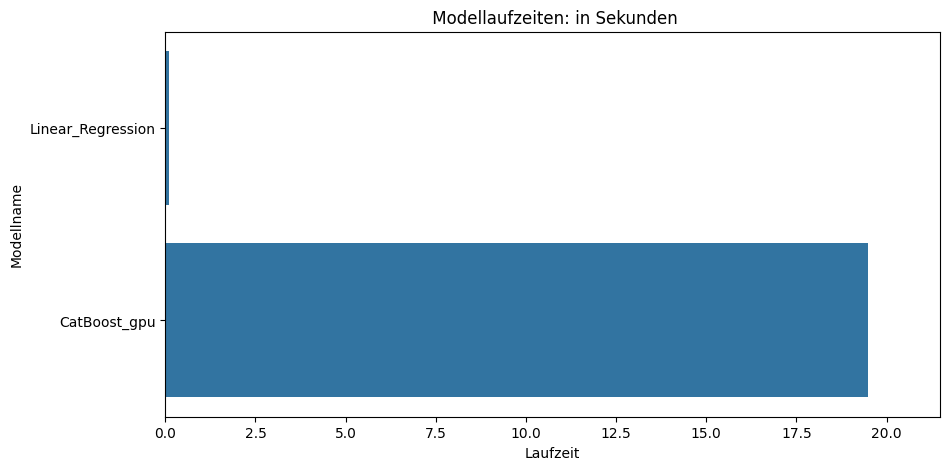

In [119]:
plot_laufzeit(dict,0,max(model_laufzeit)+2, "in Sekunden")

Der Vergleich der RMSE-Werte zeigt, dass CatBoost einen geringeren RMSE-Wert auf den Validierungsdaten (Daten, die nicht zum Trainieren des Modells genutzt wurden) liefert. Ein niedrigerer RMSE-Wert deutet auf eine höhere Genauigkeit des Modells bei der Vorhersage der Zielvariablen hin.

Bei der Laufzeit hingegen zeigt CatBoost eine relativ lange Laufzeit von circa 19 Sekunden. Den Balken für die Laufzeit der linearen Regression sieht man im Vergleich kaum, da diese nur wenige Millisekunden zum Fitten benötigt. Die Laufzeit gibt an, wie lange es dauert, ein Modell zu trainieren. In der Praxis ist die Effizienz des Modelltrainings wichtig, besonders wenn man mit großen Datensätzen arbeitet oder Modelle häufig neu trainieren muss.

Kleine Unterschiede im RMSE könnten in der Praxis vernachlässigbar sein, insbesondere wenn dafür die Laufzeit deutlich kürzer ist. Andererseits könnten auch längere Laufzeiten akzeptabel sein, wenn das Modell deutlich genauere Vorhersagen liefert. Das obige Beispiel zeigt deutlich den Trade-off zwischen Laufzeit und RMSE, den man bei der finalen Modellwahl beachten muss.

Die Bewertung hängt von den spezifischen Anforderungen des Projekts/der Analyse ab. Wenn Vorhersagegenauigkeit von größter Bedeutung ist, könnte ein Modell mit dem niedrigsten RMSE bevorzugt werden, selbst wenn die Laufzeit länger ist. Wenn jedoch schnelle Modellaktualisierungen oder Echtzeitvorhersagen erforderlich sind, könnte ein Modell mit kürzerer Laufzeit bevorzugt werden, selbst wenn es zu Lasten der Genauigkeit geht.

Eine andere Möglichkeit wäre, dass es sich beim Datensatz nur um ein kleines Sample aus den Originaldaten handelt, um eine generelle Möglichkeit der Modellierung zu testen. Der wahre Datensatz ist in diesem Fall viel größer. Dann wären die Laufzeitunterschiede wieder wichtiger, da es sich nicht nur um einige Sekunden, sondern ggf. Stunden handeln könnte.

Da aus der Aufgabenstellung nicht hervorgeht, dass eine Echtzeitanalyse des Hauspreises erfolgen soll oder es sich nur um einen Teildatensatz handelt und die Vorhersage von CatBoost auch hinsichtlich der grafischen Darstellung näher an den beobachteten Werten und somit einer perfekten Vorhersage war, wird eine Modellierung mit CatBoost empfohlen. Die Zeit des Modellfits von 19 Sekunden wird in Kauf genommen. CatBoost kann besser mit kategorialen Variablen umgehen. Hierbei ist aber auch die schlechtere Modellinterpretierbarkeit von CatBoost-Modellen im Allgemeinen zu werten. Soll die Analyse auf größeren Datenmengen durchgeführt werden oder ist die Modellinterpretation ein Analyseziel, ist die Entscheidung bezüglich CatBoost zu hinterfragen und gegebenenfalls das lineare Modell zu bevorzugen.

Ein weiterer wichtiger Entscheidungsgrund kann auch sein, wie einfach das Modell zu implementieren und zu warten ist. Hier konnten beide Modelle recht einfach mit den entsprechenden Python-Paketen umgesetzt werden. Es kommt aber auf das Fachwissen im Team an und darauf, ob die entsprechende Software zur Umsetzung vorhanden ist. Ist beispielsweise nur ein Programm zur Erstellung linearer Modelle zur Verfügung gestellt und das Fachwissen zur Umsetzung von CatBoost noch nicht vorhanden, könnte dies auch ein Entscheidungsgrund darstellen. Dies ist im hier vorliegenden Fall nicht final geklärt, folglich wird vom Vorhandensein von Python ausgegangen. Ebenso stellt die Fähigkeit zur Verallgemeinerung auf ungesehene Daten ein wichtiges Merkmal dar. In den obigen Grafiken sieht man, dass hier CatBoost die Nase vorn hat und näher an den beobachteten Werten auf dem Validierungssatz liegt.

In [120]:
laufzeiten['Teil A'] = time.time() - start_time_A

[Zurück zum Inhaltsverzeichnis](#abschnitt-0)

## Teil B: Prognosemodelle optimieren und Overfitting verhindern [60 Punkte] <a class="anchor" id="abschnitt-2"></a>
### Aufgabe B-1: Encoding, Skalierung und Vergleich [Lernziele 3.3/3.4, 4.1 & 6; 11 Punkte] <a class="anchor" id="unterabschnitt-2-1"></a>

##### a) Die numerischen Daten sind geeignet zu skalieren. Das ausgewählte Skalierungsverfahren ist kurz zu beschreiben und die Auswahl kurz zu begründen. Es sind vor und nach Skalierung die gleichen sieben zufälligen Zeilen der Daten anzuzeigen (die gleichen Datensätze) und das Ergebnis ist zu bewerten.

<u>Lösungsansatz:</u>

In [121]:
start_time_B = time.time()

Es gibt eine Reihe von unterschiedlichen Skalierungs- und Normalisierungsverfahren in Python. Bei der Normalisierung jedoch ändert sich das Verhältnis der Datenpunkte untereinander. Dieses Verhältnis behält die Standard-Skalierung bei. Die Standardisierung zentriert um den Mittelwert mit Standardabweichung 1. Die Gleichung der neuen skalierten Werte ist:
$$
x_{scale} = \frac{x_{orig} - x_{mean}}{standarddeviation}
$$
Es gibt aber noch zahlreiche weitere Skalierungsverfahren wie beispielsweise 
* MinMaxScaler(): Skaliert jedes Feature auf einen Wertebereich zwischen 0 und 1. Die Formel ist wie folgt:
$$
x_{scale} = \frac{x_{orig} - x_{min}}{x_{max} - x_{min}}
$$
* LogScaler(): Sie wird hauptsächlich verwendet, um eine schiefe Verteilung in eine Normalverteilung/weniger schiefe Verteilung umzuwandeln. Bei dieser Transformation wird der Logarithmus der Werte in einer Spalte genommen und stattdessen diese Werte als Spalte verwendet. Die Skalierungsart ist nur für Werte größer 1 geeignet. 
* RobustScaler(): Alle obigen Scaler sind durch die Nutzung von Min, Max oder Mean anfällig für Ausreißer. Der RobustScaler ist nicht anfällig für Ausreißer. Die Formel ist:
$$
x_{scale} = \frac{x_{orig} - quartile_1}{IQR}
$$
* PowerTransformer(): Dieser Scaler ist nützlich bei Heteroskedastizität. Er verändert die Verteilung der Variablen, d. h. er macht sie gaußförmiger (normaler). Man muss nicht die ursprüngliche Verteilung kennen, dafür dient der Parameter Lambda, der geschätzt wird, mittels 
   1. Box-Cox-Transformation -> nur für positive Werte
   2. Die Yeo-Johnson-Transformation -> positive und negative Werte

Quellen: (Stand:20.4.24)
* https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/
* https://www.analyticsvidhya.com/blog/2020/07/types-of-feature-transformation-and-scaling/

Nachfolgend werden mithilfe der Python-Bibliothek "sklearn.preprocessing" implementierte Skalierungsverfahren getestet. Die verschiedenen Transformationen werden geplottet und sich am Ende final für eine Methode entschieden.

In [122]:
# Bestimmung der numerischen variablen
num_var = df.select_dtypes(include=['number']).columns.drop('median_house_value')

In [123]:
# Gebe 7 zufällige Zeilen aus vor Skalierung
random_rows = df[num_var].sample(n=7, random_state = seed) 
print("Vor der Skalierung:")
display(random_rows)

# Initialisierung des Transformers.
scaler_stand = StandardScaler()
# Schätzung von Mittelwert und Standardabweichung der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled_stand = pd.DataFrame(scaler_stand.fit_transform(df[num_var]), columns=num_var, index=df.index)

# Initialisierung des Transformers.
scaler_min = MinMaxScaler()
# Schätzung von Min und Max der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled_min = pd.DataFrame(scaler_min.fit_transform(df[num_var]), columns=num_var, index=df.index)

# Initialisierung des Transformers.
scaler_rob = RobustScaler()
# Schätzung von Quartile und IQR der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled_robust = pd.DataFrame(scaler_rob.fit_transform(df[num_var]), columns=num_var, index=df.index)

# Initialisierung des Transformers.
power_transformer = PowerTransformer(method='yeo-johnson')
# Schätzung der Parameter und Anwendung der Transformation
df_scaled_power = pd.DataFrame(power_transformer.fit_transform(df[num_var]), columns=num_var, index=df.index)

# Anwendung der Transformation
pos_var = (df[num_var] >= 0).all()
df_log = df[pos_var[pos_var==True].index]
df_scaled_log = df_log.apply(lambda x: np.log(x+1))

Vor der Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,39.51,-121.56,46,871,1.6352,5.432277
3024,33.77,-117.23,5,1666,2.0000,4.572668
15663,37.74,-122.50,45,1098,3.7552,5.178363
20484,40.78,-124.16,43,932,2.9038,5.673418
9814,34.20,-118.87,26,775,7.0010,7.885246
13311,37.25,-121.92,34,1035,4.7917,6.112329
7113,34.05,-118.43,52,727,6.7115,5.550820


In der obigen Tabelle ist deutlich zu erkennen, dass die Einheiten in den numerischen Variablen für die zufällig ausgewählten Zeilen vor der Skalierung sehr unterschiedlich sind. Es gibt Werte in den Tausendern (z.B. population) und Werte im niedrigen einstelligen Bereich, z.B. median_income oder rooms_per_house. Bei der Skalierung von Merkmalen werden numerische Merkmalswerte in einen vergleichbaren Bereich umgewandelt, um Verzerrungen in überwachten Lernmodellen abzuschwächen. Eine Vernachlässigung der Skalierung kann sich ungleichmäßig auf die Modellierung auswirken, indem einige Variablen ungerechtfertigt begünstigt und bestimmte Klassen während des Trainings benachteiligt werden. Skalierungsalgorithmen sind wichtig, um Merkmalswerte zu standardisieren und eine gleichmäßige Leistung zu gewährleisten.

Ausgabe der 7 Zeilen jeweils nach Skalierung:

In [124]:
random_rows_scaled = df_scaled_stand.sample(n=7, random_state = seed)
print("\nNach der Standard-Skalierung:")
display(random_rows_scaled) #.to_string()

random_rows_min = df_scaled_min.sample(n=7, random_state = seed)
print("\nNach der Min-Max-Skalierung:")
display(random_rows_min)

random_rows_robust = df_scaled_robust.sample(n=7, random_state = seed)
print("\nNach der Robust-Skalierung:")
display(random_rows_robust)

random_rows_after = df_scaled_power.sample(n=7, random_state = seed)
print("\nNach der Power-Skalierung:")
display(random_rows_after)

random_rows_after = df_scaled_log.sample(n=7, random_state = seed)
print("\nNach der Log-Skalierung: (longitude ist negativ, deswegen fehlt Spalte hier)")
display(random_rows_after)


Nach der Standard-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.815692,-0.993418,1.379433,-0.489632,-1.176703,0.001324
3024,-0.871699,1.167818,-1.878348,0.212395,-0.984680,-0.346117
15663,0.987002,-1.462601,1.299975,-0.289179,-0.060781,-0.101304
20484,2.410289,-2.291158,1.141059,-0.435766,-0.508940,0.098790
9814,-0.670378,0.349244,-0.209729,-0.574406,1.647736,0.992778
13311,0.757591,-1.173105,0.425936,-0.344812,0.484809,0.276191
7113,-0.740606,0.568862,1.856182,-0.616792,1.495350,0.049238



Nach der Min-Max-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,0.740701,0.277888,0.882353,0.024328,0.078295,0.032511
3024,0.130712,0.709163,0.078431,0.046610,0.103454,0.026417
15663,0.552604,0.184263,0.862745,0.030690,0.224500,0.030711
20484,0.875664,0.018924,0.823529,0.026038,0.165784,0.034221
9814,0.176408,0.545817,0.490196,0.021637,0.448346,0.049900
13311,0.500531,0.242032,0.647059,0.028925,0.295982,0.037332
7113,0.160468,0.589641,1.000000,0.020292,0.428380,0.033352



Nach der Robust-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.388889,-0.810026,0.894737,-0.314499,-0.871436,0.126048
3024,-0.129630,0.332454,-1.263158,0.533049,-0.704085,-0.407318
15663,0.920635,-1.058047,0.842105,-0.072495,0.101108,-0.031499
20484,1.724868,-1.496042,0.736842,-0.249467,-0.289469,0.275671
9814,-0.015873,-0.100264,-0.157895,-0.416844,1.590109,1.648058
13311,0.791005,-0.905013,0.263158,-0.139659,0.576599,0.548005
7113,-0.055556,0.015831,1.210526,-0.468017,1.457302,0.199602



Nach der Power-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.563469,-2.498002e-16,1.337158,-0.436278,-1.585060,0.208964
3024,-0.882874,3.053113e-16,-2.032072,0.497962,-1.185577,-0.448834
15663,1.042141,-3.608225e-16,1.265535,-0.118809,0.153356,0.029530
20484,1.857087,-5.273559e-16,1.121383,-0.345267,-0.405161,0.369470
9814,-0.603606,5.551115e-17,-0.163774,-0.589935,1.525640,1.512259
13311,0.869193,-2.775558e-16,0.455954,-0.201449,0.690152,0.639651
7113,-0.698550,1.387779e-16,1.761010,-0.672296,1.433039,0.289015



Nach der Log-Skalierung: (longitude ist negativ, deswegen fehlt Spalte hier)


,latitude,housing_median_age,population,median_income,rooms_per_house
20046,3.701549,3.850148,6.770789,0.968959,1.861329
3024,3.548755,1.791759,7.418781,1.098612,1.717874
15663,3.656873,3.828641,7.002156,1.559239,1.821053
20484,3.732418,3.784190,6.838405,1.361950,1.898132
9814,3.561046,3.295837,6.654153,2.079567,2.184392
13311,3.644144,3.555348,6.943122,1.756426,1.961830
7113,3.556776,3.970292,6.590301,2.042713,1.879590


Man erkennt direkt, dass alle Skalierungsmethoden zu unterschiedlichen Ergebnissen führen. Die Log-Skalierung ist nicht weiter zu berücksichtigen, da sie nicht auf alle Spalten angewandt werden kann. Ebenso ist die Power-Skalierung auszuschließen, da sie beispielsweise für longitude zu sehr kleinen Zahlen führt und das Problem der unterschiedlichen Einheiten nicht behoben wird.

Der RobustScaler liefert ähnliche Ergebnisse wie der StandardScaler. Die Min-Max-Skalierung bringt den Wertebereich auf Werte zwischen 0 und 1. Dies wird deutlich, wenn man die grafische Darstellung auf dem Gesamtdatensatz für alle Merkmale betrachtet. Nachfolgend ist in Blau die Verteilung auf den Originaldaten dargestellt. Die grünen Graphen zeigen jeweils die Skalierungen. In jeder Zeile steht ein Merkmal. In jeder Spalte eine Skalierungsmethode. Die einzelnen Methoden können für jedes Merkmal grafisch miteinander verglichen werden, indem die Kurven in einer Zeile miteinander verglichen werden.

Grafische Darstellung:

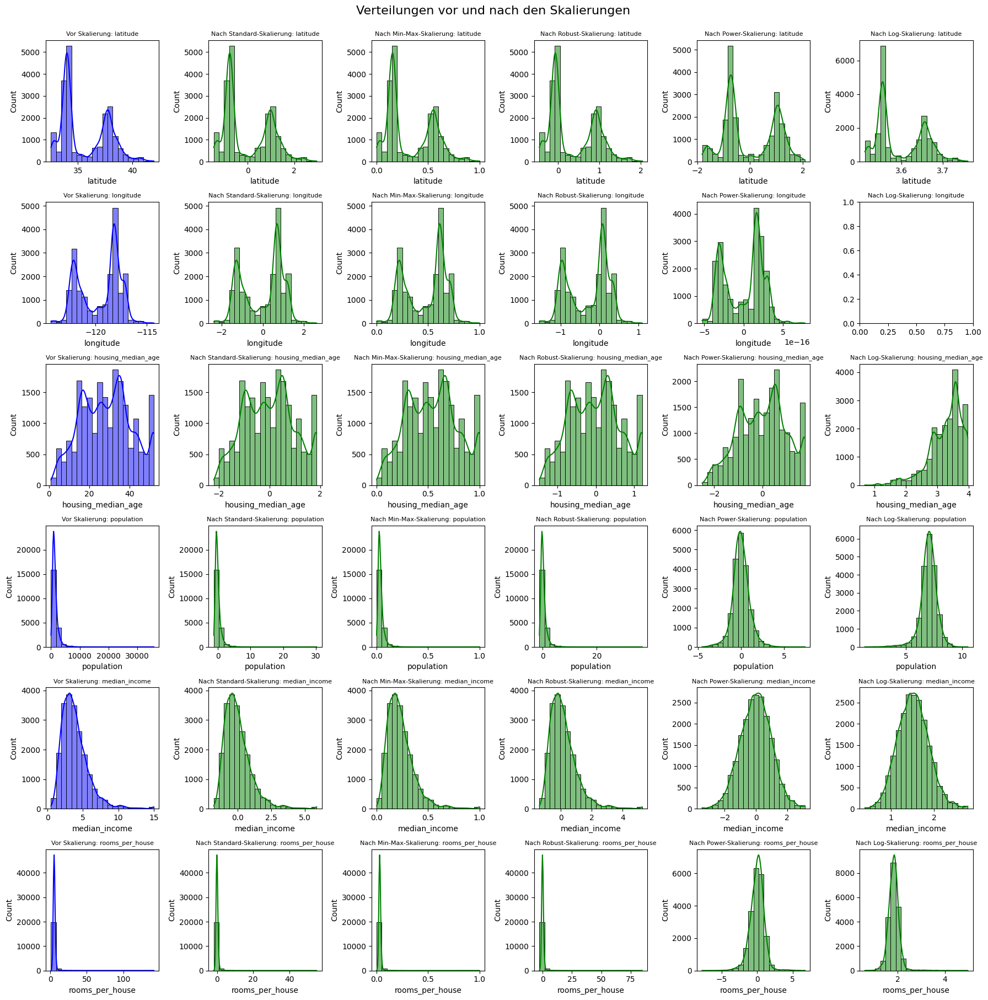

In [125]:
plt.figure(figsize=(18, 21))
plt.suptitle('Verteilungen vor und nach den Skalierungen', fontsize=16)
for i, feature in enumerate(num_var):
    plt.subplot(7, 6, i*6+1)
    sns.histplot(df[feature], kde=True, color='blue', bins=20)
    plt.title(f'Vor Skalierung: {feature}', fontsize=8)
    plt.subplot(7, 6, i*6+2)
    sns.histplot(df_scaled_stand[feature], kde=True, color='green', bins=20)
    plt.title(f'Nach Standard-Skalierung: {feature}', fontsize=8)
    plt.subplot(7, 6, i*6+3)
    sns.histplot(df_scaled_min[feature], kde=True, color='green', bins=20)
    plt.title(f'Nach Min-Max-Skalierung: {feature}', fontsize=8)
    plt.subplot(7, 6, i*6+4)
    sns.histplot(df_scaled_robust[feature], kde=True, color='green', bins=20)
    plt.title(f'Nach Robust-Skalierung: {feature}', fontsize=8)
    plt.subplot(7, 6, i*6+5)
    sns.histplot(df_scaled_power[feature], kde=True, color='green', bins=20)
    plt.title(f'Nach Power-Skalierung: {feature}', fontsize=8)
    plt.subplot(7, 6, i*6+6)
    if feature != 'longitude': sns.histplot(df_scaled_log[feature], kde=True, color='green', bins=20)
    plt.title(f'Nach Log-Skalierung: {feature}', fontsize=8)
plt.tight_layout()
plt.subplots_adjust(top=0.95) 
plt.show()

Dei Grafik zeigt, dass die PowerSkalierung die Verteilungen hin zu einer Normalverteilung ändert. Da aber die Verteilungen als repräsentative Verteilungen beibehalten werden sollen, wird dieser Scaler nicht gewählt. Der LogScaler ist ebenfalls auszuschließen, da er nicht für alle numerischen Variablen berechnet werden kann. 

Der Nachteil des StandardScalers ist, dass er sensitiv auf Ausreißer reagiert. Nachfolgend werden die Resultate gezeigt, wenn dieser nur auf dem 99% Quantil der Daten angewandt wird. Die Zeile mit index 20484 fehlt, da sie außerhalb des 99% Quantils für die Variable *latitude* liegt. 

In [126]:
# Berechnung des 99% Quantils für jede Spalte
quantile_99 = df[num_var].quantile(0.99)
# Filtern der Trainingsdaten basierend auf dem 99% Quantil
filtered_data = df[df[num_var] <= quantile_99].loc[:, num_var].dropna().copy()

# Schätzung von Mittelwert und Standardabweichung der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled = pd.DataFrame(scaler_stand.fit_transform(filtered_data), columns=num_var, index=filtered_data.index)

filtered_rows = random_rows[random_rows <= quantile_99].dropna()
filtered_rows_scaled = pd.DataFrame(scaler_stand.transform(filtered_rows), columns=num_var, index=filtered_rows.index)
print("\nNach der Standard-Skalierung:")
display(random_rows_scaled) #.to_string()
print("\nNach der Standard-Skalierung (99% Quantil):")
display(filtered_rows_scaled)


Nach der Standard-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.815692,-0.993418,1.379433,-0.489632,-1.176703,0.001324
3024,-0.871699,1.167818,-1.878348,0.212395,-0.984680,-0.346117
15663,0.987002,-1.462601,1.299975,-0.289179,-0.060781,-0.101304
20484,2.410289,-2.291158,1.141059,-0.435766,-0.508940,0.098790
9814,-0.670378,0.349244,-0.209729,-0.574406,1.647736,0.992778
13311,0.757591,-1.173105,0.425936,-0.344812,0.484809,0.276191
7113,-0.740606,0.568862,1.856182,-0.616792,1.495350,0.049238



Nach der Standard-Skalierung (99% Quantil):


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.894056,-1.017343,1.362663,-0.580717,-1.287443,0.157852
3024,-0.882043,1.208387,-1.919235,0.332474,-1.070884,-0.556105
15663,1.038011,-1.500526,1.282617,-0.319969,-0.028935,-0.053039
9814,-0.674077,0.365385,-0.238263,-0.690989,1.897889,2.195193
13311,0.801027,-1.202392,0.402107,-0.392335,0.586369,0.722677
7113,-0.746624,0.591556,1.842941,-0.746125,1.726031,0.256309


Die Min-Max Skalierung ist ebenfalls ausreißerempfindlich:

In [127]:
# Schätzung von Mittelwert und Standardabweichung der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled = pd.DataFrame(scaler_min.fit_transform(filtered_data), columns=num_var, index=filtered_data.index)

filtered_rows = random_rows[random_rows <= quantile_99].dropna()
filtered_rows_min = pd.DataFrame(scaler_min.transform(filtered_rows), columns=num_var, index=filtered_rows.index)
print("\nNach der Min-Max-Skalierung:")
display(random_rows_min)
print("\nNach der Min-Max-Skalierung (99% Quantil):")
display(filtered_rows_min)


Nach der Min-Max-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,0.740701,0.277888,0.882353,0.024328,0.078295,0.032511
3024,0.130712,0.709163,0.078431,0.046610,0.103454,0.026417
15663,0.552604,0.184263,0.862745,0.030690,0.224500,0.030711
20484,0.875664,0.018924,0.823529,0.026038,0.165784,0.034221
9814,0.176408,0.545817,0.490196,0.021637,0.448346,0.049900
13311,0.500531,0.242032,0.647059,0.028925,0.295982,0.037332
7113,0.160468,0.589641,1.000000,0.020292,0.428380,0.033352



Nach der Min-Max-Skalierung (99% Quantil):


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,0.862624,0.346154,0.882353,0.149629,0.112471,0.482405
3024,0.152228,0.883375,0.078431,0.286675,0.148610,0.391985
15663,0.643564,0.229529,0.862745,0.188761,0.322492,0.455696
9814,0.205446,0.679901,0.490196,0.133081,0.644043,0.740428
13311,0.582921,0.301489,0.647059,0.177900,0.425175,0.553938
7113,0.186881,0.734491,1.000000,0.124806,0.615363,0.494874


Bei stark rechtsschiefen Daten mit großen Ausreißern kann der RobustScaler gegenüber dem MinMaxScaler und dem StandardScaler bevorzugt werden. Der RobustScaler ist eine Skalierungsmethode, die robust gegenüber Ausreißern ist und daher besonders geeignet ist, wenn die Daten stark rechtsschief und von Ausreißern betroffen sind. Die Merkmale *rooms_per_house* und *population* sind stark rechtsschief. 

Durch den Einsatz des RobustScalers können die Einflüsse von Ausreißern auf die Skalierung der Daten reduziert werden. Dies ist besonders vorteilhaft für Modelle wie neuronale Netze, da die Stabilität und Leistung des Modells verbessert werden können.

Der MinMaxScaler und der StandardScaler sind sensitiv für Ausreißer, was man oben anhand der Ergebnisse auf dem 99% Quantil für die Merkmale *population*, *median_income* und *rooms_per_house* feststellt. Dies ist der RobustScaler nicht, wie nachfolgendes Beispiel am 99% Quantil zeigt.

In [128]:
# Schätzung von Mittelwert und Standardabweichung der Trainingsdaten. & Anwendung der Skalierung auf die Trainingsdaten
df_scaled = pd.DataFrame(scaler_rob.fit_transform(filtered_data), columns=num_var, index=filtered_data.index)

filtered_rows = random_rows[random_rows <= quantile_99].dropna()
filtered_rows_rob = pd.DataFrame(scaler_rob.transform(filtered_rows), columns=num_var, index=filtered_rows.index)
print("\nNach der Robust-Skalierung:")
display(random_rows_robust)
print("\nNach der Robust-Skalierung (99% Quantil):")
display(filtered_rows_rob)


Nach der Robust-Skalierung:


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.388889,-0.810026,0.894737,-0.314499,-0.871436,0.126048
3024,-0.129630,0.332454,-1.263158,0.533049,-0.704085,-0.407318
15663,0.920635,-1.058047,0.842105,-0.072495,0.101108,-0.031499
20484,1.724868,-1.496042,0.736842,-0.249467,-0.289469,0.275671
9814,-0.015873,-0.100264,-0.157895,-0.416844,1.590109,1.648058
13311,0.791005,-0.905013,0.263158,-0.139659,0.576599,0.548005
7113,-0.055556,0.015831,1.210526,-0.468017,1.457302,0.199602



Nach der Robust-Skalierung (99% Quantil):


,latitude,longitude,housing_median_age,population,median_income,rooms_per_house
20046,1.398936,-0.818667,0.944444,-0.327194,-0.888189,0.156927
3024,-0.127660,0.336000,-1.333333,0.534128,-0.717952,-0.391404
15663,0.928191,-1.069333,0.888889,-0.081257,0.101125,-0.005040
9814,-0.013298,-0.101333,-0.166667,-0.431203,1.615801,1.721639
13311,0.797872,-0.914667,0.277778,-0.149512,0.584815,0.590722
7113,-0.053191,0.016000,1.277778,-0.483207,1.480704,0.232544


Die Skalierung der numerischen Merkmale ist bei neuronalen Netzen wichtig, weil die Merkmale mit den Modellgewichten multipliziert werden. Die Skala der Outputs und die Skala der Gradienten werden also von der Skala der Inputs beeinflusst. (Quelle: https://www.tensorflow.org/tutorials/keras/regression, Stand: 25.4.2024)

Für neuronale Netze kann die Auswahl des Scalers von der Art der Aktivierungsfunktionen in den Schichten abhängen. Zum Beispiel können Aktivierungsfunktionen wie die tanh-Funktion von Eingabewerten profitieren, die auf den Bereich [-1, 1] skaliert sind, was für den StandardScaler oder den RobustScaler spricht. Andererseits können Aktivierungsfunktionen wie die ReLU-Funktion von Eingabewerten profitieren, die auf den Bereich [0, 1] skaliert sind, da sie negative Werte 'töten', was für den MinMaxScaler spricht. 

Aufgrund der Daten wird sich nach obiger Argumentation und der Robustheit für den RobustScaler entschieden. 

##### b) Die kategoriellen Daten sind geeignet in numerische Werte zu überführen. Das ausgewählte Encoding ist kurz zu beschreiben und die Auswahl kurz zu begründen. Für die sieben Zeilen aus Teilaufgabe a) sind die bearbeiteten Datensätze anzuzeigen und das Ergebnis ist zu bewerten. Es ist darauf einzugehen, wie viele Merkmale ggf. neu hinzugekommen sind und ob die Daten zu einem überbestimmten linearen Modell führen würden.

<u>Lösungsansatz:</u>

Um kategoriale Daten in numerische Werte zu überführen, gibt es verschiedene Encoding-Techniken. Zwei der gängigsten sind das One-Hot-Encoding und das Label-Encoding:

* **One-Hot-Encoding**: Jede Kategorie wird in eine eigene binäre Spalte umgewandelt, wobei 1 für das Vorhandensein der Kategorie in der Zeile und 0 für das Nichtvorhandensein steht. 

* **Label-Encoding**: Jeder Kategorie wird eine eindeutige Zahl zugeordnet. Dies ist nützlich, wenn es eine natürliche ordinale Beziehung zwischen den Kategorien gibt, kann jedoch irreführend sein, wenn es sich um nominale Daten handelt, da das Modell eine Ordnung in den Daten annehmen könnte, die nicht existiert.


Die Vorliegenden zwei kategoriellen Features lassen sich nicht ordnen. Somit sind sie nominal und nicht ordinal. Das Enkodieren durch *LabelEncoding*/*factorize* wie unten dargestellt könnte somit zu Fehlern führen, wenn das Modell von einer Ordnung ausgeht. Sind die Merkmale hingegen nominal, so bietet sich die *One Hot Kodierung* an. Bei der One Hot Kodierung wird für jedes Level eines kategorialen Merkmals eine neue Variable erstellt. Jede Kategorie wird mit einer binären Variable abgebildet, die entweder 0 oder 1 enthält. Dabei steht 0 für das Nichtvorhandensein und 1 für das Vorhandensein der betreffenden Kategorie. Diese neu erstellten binären Merkmale werden als Dummy-Variablen bezeichnet. Die Anzahl der Dummy-Variablen hängt von den in der kategorialen Variable vorhandenen Leveln ab. Bei $N$ verschiedenen Leveln resultieren $N$ verschiedene Dummy Variablen.

Einen Sonderfall stellt die sogenannte *Dummy-Kodierung* dar. Hierbei werden aus den $N$ Features lediglich $N-1$ Variablen gebildet. 

Beide Verfahren führen zu einem massiven Anstieg an Spalten in den Daten.

Es gibt noch eine Reihe weiterer Encoding Verfahren.

Quelle: 
* https://www.analyticsvidhya.com/blog/2020/08/types-of-categorical-data-encoding/

Nachfolgend wird einmal die Dummy Kodierung (Erstellung von N-1 Leveln zur Vermeidung von perfekter Multikollinearität) und due Label Kodierung durchgeführt. Es gibt 2 Möglichkeiten, die Kodierungen zu machen, einmal mit dem paket **sklearn.preprocessing** und den Funktionen OneHotEncoder / LabelEncoder und einmal direkt mit dem **pandas** package und den Funktionen get_dummies()/factorize().
Die Resultate bei beiden Paketen sind allerdings identisch. 

In [129]:
nominal_vars = ['ocean_proximity', 'county_name']

In [130]:
# Output the dimensions of the dataset prior to dummy encoding
print("Shape es Datensatzes vor Kodierung: ", df[nominal_vars].shape) 

# Gebe 7 zufällige Zeilen aus vor Skalierung
random_rows = df[nominal_vars].sample(n=7, random_state = seed)
print("\nVor der Skalierung:")
display(random_rows)

# Anzahl der Beobachtungen vor One-Hot-Encoding
n_observations = df[nominal_vars].shape[0]

# Initialisierung des Transformers.
# One-Hot-Encoding anwenden
encoder = OneHotEncoder(handle_unknown='ignore', drop='first', sparse_output=False)  # handle_unknown='ignore' verhindert Fehler bei unbekannten Kategorien, drop='first' vermeidet perfekte Multikollinearität
encoded_columns = encoder.fit_transform(df[nominal_vars])
encoded_df = pd.DataFrame(encoded_columns, columns=encoder.get_feature_names_out(nominal_vars), index=df.index)
# # Alternative: 

# Output the dimensions of the dataset after dummy encoding to show the change
print("\nShape of the dataset nach dummy Kodierung: ", encoded_df.shape)

random_rows_after = encoded_df.sample(n=7, random_state = seed)
print("\nNach der OneHot-Skalierung:")
display(random_rows_after)

# Bewertung des Ergebnisses
new_features_count = encoded_df.shape[1]
print(f"\nAnzahl der neuen Merkmale nach One-Hot-Encoding: {new_features_count}")

# Überprüfen, ob das Modell überbestimmt ist
if new_features_count+6 > n_observations: #zähle die 6 numerischen Variablen zu dne features hinzu
    print("\nDas Modell ist nicht überbestimmt.")
else:
    print("\nDas Modell ist überbestimmt.")

Shape es Datensatzes vor Kodierung:  (20640, 2)

Vor der Skalierung:


,ocean_proximity,county_name
20046,INLAND,Butte
3024,INLAND,Riverside
15663,NEAR OCEAN,San Francisco
20484,NEAR OCEAN,Humboldt
9814,<1H OCEAN,Ventura
13311,<1H OCEAN,Santa Clara
7113,<1H OCEAN,Los Angeles



Shape of the dataset nach dummy Kodierung:  (20640, 61)

Nach der OneHot-Skalierung:


,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN,county_name_Alpine,county_name_Amador,county_name_Butte,county_name_Calaveras,county_name_Colusa,county_name_Contra Costa,...,county_name_Sonoma,county_name_Stanislaus,county_name_Sutter,county_name_Tehama,county_name_Trinity,county_name_Tulare,county_name_Tuolumne,county_name_Ventura,county_name_Yolo,county_name_Yuba
20046,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3024,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15663,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20484,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9814,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
13311,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7113,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Anzahl der neuen Merkmale nach One-Hot-Encoding: 61

Das Modell ist überbestimmt.


Die 2 kategoriellen Variablen werden und insgesamt 61 binäre Variablen überführt. Dies liegt daran, dass das Merkmal *ocean_proximity* 5 Level aufweist und das Merkmal *county_state* 58 Level beinhaltet. Bei Berücksichtigung von $N-1$ Leveln fürt das zu 4+57=61 Variablen. 

In [131]:
# Initialisierung des Transformers.
# One-Hot-Encoding anwenden
label_encoder = LabelEncoder()
labelled_df = df[nominal_vars].apply(label_encoder.fit_transform)
# # Factorize anwenden
# encoded_df_fac = df[nominal_vars].apply(lambda x: pd.factorize(x)[0])

# Output the dimensions of the dataset after dummy encoding to show the change
print("\nShape of the dataset nach dummy Kodierung: ", labelled_df.shape)

random_rows_after = labelled_df.sample(n=7, random_state = seed)
print("\nNach der Label-Skalierung:")
display(random_rows_after)

# Bewertung des Ergebnisses
new_features_count = labelled_df.shape[1]
print(f"\nAnzahl der neuen Merkmale nach Label-Encoding: {new_features_count}")

# Überprüfen, ob das Modell überbestimmt ist
if new_features_count+6 > n_observations: #zähle die 6 numerischen Variablen zu dne features hinzu
    print("\nDas Modell ist nicht überbestimmt.")
else:
    print("\nDas Modell ist überbestimmt.")


Shape of the dataset nach dummy Kodierung:  (20640, 2)

Nach der Label-Skalierung:


,ocean_proximity,county_name
20046,1,3
3024,1,32
15663,4,37
20484,4,11
9814,0,55
13311,0,42
7113,0,18



Anzahl der neuen Merkmale nach Label-Encoding: 2

Das Modell ist überbestimmt.


LabelEncoding weist jedem eindeutigen Wert in der Spalte einen ganzzahligen Wert zu, wobei die Zuordnung basierend auf der Reihenfolge des Erscheinens der eindeutigen Werte erfolgt. Die Werte in nominalen Variablen werden in ganzzahlige Indizes umgewandelt. Das kann für Lernalgorithmen, die numerischen Input erwarten, von Vorteil sein. LabelEncoding/Faktorisierung berücksichtigt zwar die Reihenfolge der Werte, gibt aber keine implizite Bedeutung der Rangfolge zwischen den Werten an. Dieser Umstand kann jedoch zu Fehlinterpretationen führen, wenn die Ordnung als solche interpretiert wird.

Ein überbestimmtes lineares Modell liegt vor, wenn es mehr Gleichungen (Beobachtungen) als Unbekannte (Features) gibt. Dies ist in den meisten realen Datensätzen der Fall und ist normalerweise wünschenswert, da es bedeutet, dass genügend Daten vorhanden sind, um die Parameter des Modells zu schätzen.

Allerdings kann es nach der Anwendung von One-Hot-Encoding zu einem anderen Problem kommen: Multikollinearität oder sogar perfekte Multikollinearität. One-Hot-Encoding wandelt kategoriale Variablen in eine Reihe von binären Indikatorvariablen um, wobei jede Kategorie zu einer eigenen Spalte wird. Wenn für jede Kategorie einer kategorialen Variablen eine eigene Dummy-Variable erstellt wird, entsteht eine perfekte Multikollinearität, da die Summe der Dummy-Variablen für jede Beobachtung eins ergibt. Um dies zu vermeiden, muss eine der Dummy-Variablen fallengelassen werden, was als "Referenzkategorie" bezeichnet wird.

Um zu überprüfen, ob das Modell nach dem One-Hot-Encoding überbestimmt ist, sollten die Anzahl der Features (einschließlich der One-Hot-kodierten Dummy-Variablen) mit der Anzahl der Beobachtungen verglichen werden.

In obigem Modell liegt ein überbestimmtes Modell vor.

Die One-Hot-Kodierung kann auch auf unbekannte Daten angewandt werden; dies gilt für LabelEncoding/factorize nicht. Unbekannte Level erhalten bei der One-Hot-Kodierung einfach einen Vektor mit ausschließlich Nullen. Da alle Werte von sowohl ocean_proximity als auch county_name im Datensatz vorhanden sind (es gibt nur 58 Counties), ist dieser Vorteil zu vernachlässigen. Demzufolge kann ein Level zur Reduktion der Gefahr der Multikollinearität ausgelassen werden. One-Hot-Kodierung hat den Nachteil, dass sie die Dimensionalität erhöht. Dies führt zu erhöhtem Rechenaufwand.

Es wird sich für die One-Hot-Kodierung mit Spezialfall Dummy-Kodierung, d.h. $N-1$ Levels (drop_first=True) entschieden. 

##### c) Im Anschluss ist der nun skalierte und encodierte Datensatz in Trainingsdaten (sample = A) und Validierungsdaten (sample = B) aufzusplitten und die Zielvariable von den beschreibenden Variablen zu trennen.

<u>Lösungsansatz:</u>

Nach obiger Auswahl wird der Datensatz zur weiteren Bearbeitung aus den robust skalierten numerischen Variablen, den OneHot kodierten Variablen und dem Faktoren 'sample' und der Zielvariablen zusammengesetzt. Es wurde sich dafür entschieden, die Zielvariable nicht zu skalieren. 

In [132]:
# Zunächst wird der neue enkodierte Datensatz zusammengeklebt:
df_trans = pd.concat([df_scaled_robust, encoded_df, df[['sample','median_house_value']]], axis=1)

Analog zu obigen Aufgaben wird der Datensatz mithilfe von *sample* aufgeteilt. 

In [133]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
train_data = df_trans[df_trans['sample'] == 'A']
val_data = df_trans[df_trans['sample'] == 'B']

# Entfernen der Spalte 'sample' und Aufteilung in Features und Target 
x_train = train_data.drop(['sample', 'median_house_value'], axis=1)
y_train = train_data['median_house_value'] #Der Hauspreis ist die Zielvariablen

x_val = val_data.drop(['sample','median_house_value'], axis=1)
y_val = val_data['median_house_value']

##### d) An die so aufbereiteten Daten ist erneut ein CatBoost-Modell anzupassen. Dabei ist eine Zeitmessung durchzuführen und die Feature Importance auszugeben. Die Güte des Modells (RMSE) ist zunächst für den Trainingsdatensatz, im Anschluss für den Validierungsdatensatz zu ermitteln und die Ergebnisse sind zu vergleichen und zu interpretieren. Abschließend ist ein Vergleich mit dem CatBoost-Modell aus Aufgabe A-7 vorzunehmen und auf Laufzeit, Modellgüte (Validierung) und ggf. Auffälligkeiten im Vergleich der Feature Importances einzugehen, mögliche Ursachen zu ergründen und eine Bewertung vorzunehmen.

In [134]:
# # Liste der kategorialen Features für CatBoost
# cat_features = df.select_dtypes(include=['category']).columns

# Initialisieren des CatBoost Regressors
start_time = time.time()
catboost_model_B1 = CatBoostRegressor(loss_function='RMSE', eval_metric='RMSE', random_seed = seed, task_type = device_CatBoost)
catboost_model_B1.fit(x_train, y_train, eval_set=(x_val, y_val), verbose=False)
end_time = time.time()
runtime = end_time - start_time

# Güte des Modells (RMSE) für Trainingsdatensatz ermitteln
train_predictions = catboost_model_B1.predict(x_train)
train_rmse = berechne_rmse(train_predictions,y_train)
print("RMSE für Trainingsdatensatz:", train_rmse)

# Güte des Modells (RMSE) für Validierungsdatensatz ermitteln
val_predictions = catboost_model_B1.predict(x_val)
val_rmse = berechne_rmse(val_predictions,y_val)
print("RMSE für Validierungsdatensatz:", val_rmse)

# Speichern des RMSE in oben angelegtem dictionary
model_name.append(f'CatBoost_B1_{gpu_name}')
model_rmse.append(val_rmse)
model_laufzeit.append(runtime)

# Ergebnisse
print(f"Laufzeit: {runtime:.4f} Sekunden")

print(f"CatBoost Parameters: {catboost_model_B1.get_params()}")

# Vergleich der Ergebnisse und Interpretation
if val_rmse < train_rmse:
    print("Das Modell passt besser zu den Validierungsdaten als zu den Trainingsdaten.")
else:
    print("Das Modell passt besser zu den Trainingsdaten als zu den Validierungsdaten.")
print("der Unterschied zwischen Trainings-RMSE und Validierungs-RMSE ist: ", train_rmse - val_rmse)
# Feature Importance
feature_importance = {feature: importance for feature, importance in zip(x_train.columns, catboost_model_B1.get_feature_importance())}
print(f"\n CatBoost Feature Importances:")
for feature, importance in feature_importance.items():
    print(feature, ": ", importance)

RMSE für Trainingsdatensatz: 41707.38929040877
RMSE für Validierungsdatensatz: 49218.896419344164
Laufzeit: 10.9386 Sekunden
CatBoost Parameters: {'loss_function': 'RMSE', 'random_seed': 42, 'eval_metric': 'RMSE', 'task_type': 'GPU'}
Das Modell passt besser zu den Trainingsdaten als zu den Validierungsdaten.
der Unterschied zwischen Trainings-RMSE und Validierungs-RMSE ist:  -7511.507128935395

 CatBoost Feature Importances:
latitude :  16.924900950817534
longitude :  18.11884434988074
housing_median_age :  4.2266128296286425
population :  1.3173216270820414
median_income :  30.39715258691288
rooms_per_house :  2.323375459755962
ocean_proximity_INLAND :  14.808664921010516
ocean_proximity_ISLAND :  0.0016823963252721465
ocean_proximity_NEAR BAY :  0.6851734922834779
ocean_proximity_NEAR OCEAN :  1.8830623295588327
county_name_Alpine :  0.00013689106913280583
county_name_Amador :  0.0021198475978710797
county_name_Butte :  0.0005916635993316298
county_name_Calaveras :  0.006405627000272

Der RMSE Unterschied auf den Trainings- und Validierungsdaten ist sehr groß (ca. 12000). Das Modell passt sich bedeutend besser an die Trainingsdaten an. Es könnte sich hier um ein Overfitting des Modells handeln. Um bessere Ergebnisse erzielen zu können, sollte man ein Hyperparameter-Tuning durchführen und das CatBoost Modell nicht mit Standardparameter trainieren. Typische Strategien für ein Hyperparameter-Tuning sind eine Gittersuche, eine Zufallssuche oder eine Bayes-Optimierung mit einigen Hyperparametern. Hierbei gilt auch zu beachten, dass manche Hyperparameter zusammenhängen. Folglich genügt es einen dieser zu optimieren. 

Dies ist jedoch nicht Teil der Aufgabe und deswegen wird hier nicht weiter darauf eingegangen. 

In [135]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)

In [136]:
rmse_null = berechne_rmse(y_pred_null,y_val)
print("\n Die RMSE Differenz zwischen Nullmodell und CatBoost (RMSE_{null} - RMSE_{CatBoost}):", rmse_null-val_rmse)


 Die RMSE Differenz zwischen Nullmodell und CatBoost (RMSE_{null} - RMSE_{CatBoost}): 64789.24994976657


In [137]:
# Display all model hyperparameters in a DataFrame
hyperparams_list = [(k, v) for k, v in catboost_model_B1.get_all_params().items()]
hyperparams_df = pd.DataFrame(hyperparams_list, columns=['Hyperparameter', 'Value'])
display(hyperparams_df.style.hide(axis='index'))

Hyperparameter,Value
nan_mode,Min
gpu_ram_part,0.950000
eval_metric,RMSE
iterations,1000
fold_permutation_block,64
leaf_estimation_method,Newton
observations_to_bootstrap,TestOnly
random_score_type,NormalWithModelSizeDecrease
grow_policy,SymmetricTree
penalties_coefficient,1


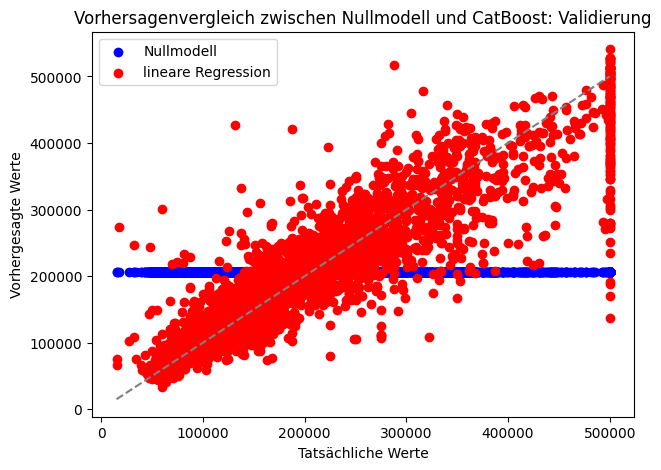

In [138]:
vergleich_modell(val_predictions, y_pred_null, y_val, 'CatBoost: Validierung')

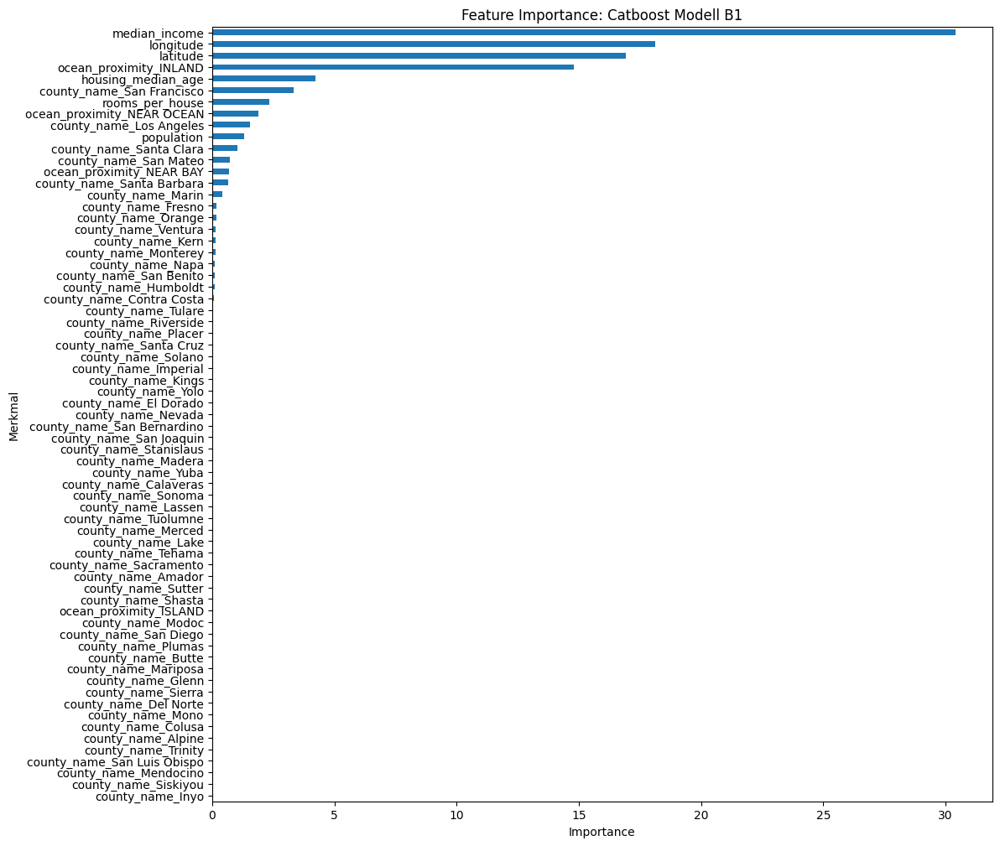

In [139]:
plot_feature_importance(catboost_model_B1,x_train.columns,"Catboost Modell B1", figsize=(12, 12))

Einschränkung der Feature Importance auf Top10 (zur besseren Übersichtlichkeit):

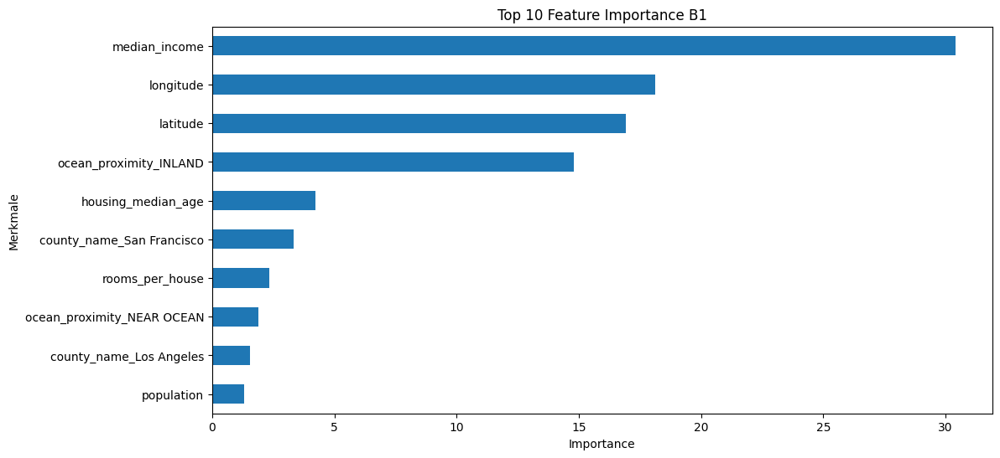

In [140]:
feature_importances = catboost_model_B1.get_feature_importance()
sorted_feature_importances = pd.Series(feature_importances, index=x_train.columns)
top_10_features = sorted_feature_importances.nlargest(10)
top_10_features = top_10_features.sort_values(ascending=True)

top_10_features.plot(kind='barh', figsize=(12, 6))
#plt.bar(top_10_features.index, top_10_features.values)
plt.xlabel('Importance')
plt.ylabel('Merkmale')
plt.title('Top 10 Feature Importance B1')
plt.show()

<u>Vergleich zu Feature importance aus A7</u>

Die Feature-Importance-Werte eines CatBoost-Modells geben an, wie stark einzelne Features (Variablen) zur Vorhersagekraft des Modells beitragen. Ein höherer Feature-Importance-Wert deutet darauf hin, dass das entsprechende Feature einen größeren Einfluss auf die Vorhersage des Modells hat.

Wenn Sie beispielsweise einen Feature-Importance-Wert von z.B. 15 haben, bedeutet dies, dass das entsprechende Feature im Modell als signifikant für die Vorhersage angesehen wird. Ein höherer Wert würde darauf hinweisen, dass dieses Feature einen noch stärkeren Einfluss auf die Vorhersagen hat, während ein niedrigerer Wert eine geringere Bedeutung für die Vorhersagen des Modells signalisieren würde.

Das Merkmal *median_income* weist immer noch die höchste Feature importance auf. Ebenso ist der Importance immer noch über 25 und somit vergleichbar groß. Auf Platz 2 und 3 der Features mit der höchsten Importance folgen wie auch beim Modell aus A7 die Merkmale *longitude* und *latitude*. *longitude* hat ebenfalls einen ähnlichen Wert wie beim Modell aus A7, *latitude* allerdings hat eingebüst. Die Importance ist leicht gesunken. Beim Modell aus A7 war *rooms_per_house* noch das Merkmal mit der vierhthöchsten Importance. Beim CatBoost Modell aus B1 ist nun die Dummy-Variable von *ocean_proximity*, die das Inland beschreibt an dieser Stelle.

Das neue Modell hat mehr Variablen (durch die Dummy-Kodierung) und noch mehr Möglichkeiten in den Merkmalen *ocean_proximity* und *county_name* granularer zu differenzieren. In der Feature Importance ohne Dummy-Kodierung war *ocean_proximity* mit allen 5 Leveln auf Platz 5. Nun kann aber in einem Baum da sMerkmal nicht nur einmal herangezogen werden, sondern jede Dummy-Variable, was eine granularere Entscheidung möglich macht. Offensichtlich ist die Ausprägungn Inland die Wichtigste, wenn es um den hauspreis geht. Das erklärt auch, warum die Variable *latitude* seltener zum splitten genutzt wird und eine geringere Importance aufweist. *rooms_per_house* hatte im Modell aus A7 noch eien Feature Importance von über 15, im Modell aus B1 ist diese auf unter 5 gesunken. Dies deutet auf eine Korrelation mit den Variablen *ocean_proximity* und *county_name* hin. Die Dummy-Variablen fangen die Wichtigkeit hier auf. 

Der Feature Importance Wert von *population* ist nahezu identisch geblieben. 

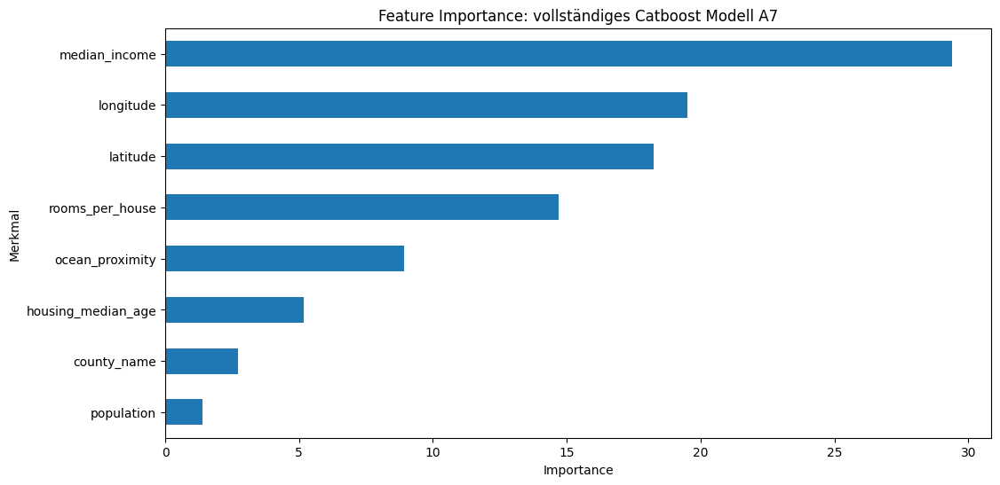

In [141]:
plot_feature_importance(catboost_model,df[list(num_var)+list(cat_features)].columns,"vollständiges Catboost Modell A7")

In [142]:
pd.DataFrame(dict).loc[1:2,]

,Model name,RMSE,Laufzeit
1,CatBoost_gpu,50030.337811,19.489086
2,CatBoost_B1_gpu,49218.896419,10.938563


In [143]:
# Vergleich mit Modell aus A7
print("\n Die RMSE Differenz von CatBoost (A7) und CatBoost (B1):", pd.DataFrame(dict).loc[1,'RMSE']-val_rmse)


 Die RMSE Differenz von CatBoost (A7) und CatBoost (B1): 811.441392097564


In [144]:
desired_models = [f'CatBoost_{gpu_name}', f'CatBoost_B1_{gpu_name}']
filtered_data = {key: [value for idx, value in enumerate(dict[key]) if dict['Model name'][idx] in desired_models] for key in dict}

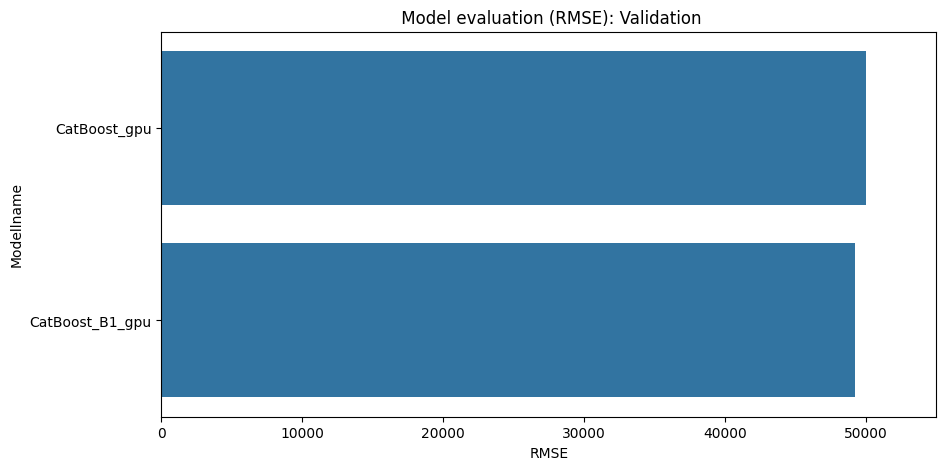

In [145]:
plot_rmse(filtered_data,0,55000, "Validation")

In [146]:
# Vergleich mit Modell aus A7
print("\n Die Laufzeit Differenz von CatBoost (A7) und CatBoost (B1):", pd.DataFrame(dict).loc[1,'Laufzeit']-pd.DataFrame(dict).loc[2,'Laufzeit'])


 Die Laufzeit Differenz von CatBoost (A7) und CatBoost (B1): 8.550522565841675


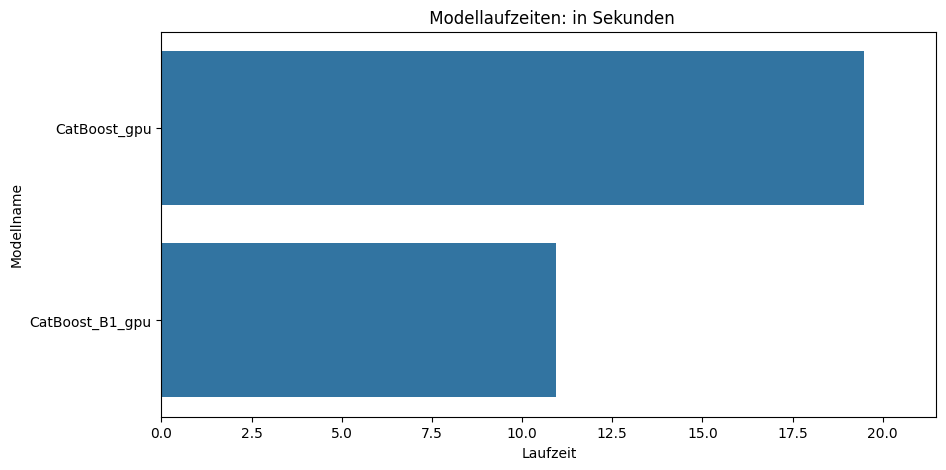

In [147]:
plot_laufzeit(filtered_data,0,max(filtered_data['Laufzeit'])+2,"in Sekunden")

Das neue CatBoost-Modell ist fast 10 Sekunden schneller und weist einen leicht besseren RMSE-Wert auf den Validierungsdaten auf, obwohl sich durch die Kodierung der kategorialen Daten die Anzahl der Merkmale signifikant erhöht hat. Offenbar führt die direkte Verwendung der kategorialen Merkmale innerhalb von CatBoost zu einem stark erhöhten Rechenaufwand.

Der Grund ist, dass das Training mit kategorialen Merkmalen Zeit in Anspruch nimmt. Zwar hat das neue CatBoost-Modell mehr Variablen, diese sind aber alle 0/1 kodiert und dadurch ist das Training schneller. Durch die höhere Granularität (es kann nun jedes Level von den kategorialen Merkmalen im Baum genutzt werden) sinkt auch der RMSE leicht.

Das Modell zeigt allerdings einen großen Unterschied des RMSE zwischen Trainings- und Validierungsdaten, wie oben gezeigt. Das könnte auf Overfitting hindeuten. Hier ist eine Hyperparameter-Optimierung zu empfehlen und ggf. durch Early Stopping das Training frühzeitig zu beenden.

In [148]:
catboost_model_B1.save_model(os.path.join(models_path, f'catboost_model_B1_{gpu_name}.cbm'), format='cbm') #Speichern des Modells

### Aufgabe B-2: Under-/Overfitting am Beispiel von Neuronalen Netzen [Lernziele 3.2, 3.3/3.4, 4.1, 4.3 & 6; 18 Punkte] <a class="anchor" id="unterabschnitt-2-2"></a>
##### a) Es ist ein Teildatensatz aus dem oben erstellten encodierten und skalierten Datensatz zu erstellen, der nur die ersten 100 Zeilen des Datensatzes enthält. Damit sind 3 einfache Neuronale Netze unterschiedlicher Größe mit Keras/Tensorflow sequenziell zu definieren, zu kompilieren, anzuzeigen (via summary) und jeweils über eine hohe Anzahl von Epochen (> 2000) zu trainieren:
* klein: 1.000 bis 10.000 Gewichten 
* mittel: 50.000 bis 100.000 Gewichten 
* groß: mindestens 1.000.000 Gewichten 

Die history der einzelnen Modelle ist in einem (einzigen) Diagramm zu plotten. Dabei soll der Verlauf des RMSE auf den Trainingsdaten sowie der Verlauf des RMSE auf der internen Modellvalidierung (Split 0.2) dargestellt werden. Die Ergebnisse sind zu beschreiben und zu bewerten.

<u>Lösungsansatz:</u>

<u>Analog Skript S. 628:</u>

1. Erstellung eines Teildatensatzes der ersten 100 Zeilen des Datensatze. Die Aufteilung in Trainings- und Testdaten findet direkt im model fit durch setzen validation_split parameters statt. 
2. Setze Startgewichte zufällig, z.B. gleichverteilt -> mittles kernel_initializer: Die Wahl der geeigneten Anfangsgewichte für ein neuronales Netz kann sich auf die Konvergenz und Leistung des Modells während des Trainings auswirken. Typische wahlen sind: (siehe: https://keras.io/api/layers/initializers/)
   * RandomNormal oder RandomUniform: Diese Initialisierer werden üblicherweise für Gewichtsmatrizen verwendet. RandomNormal initialisiert die Gewichte anhand einer Gaußschen Verteilung, während RandomUniform die Gewichte anhand einer Gleichverteilung initialisiert.
   * Nullen oder Einsen: Diese Initialisierer können für Bias-Terme im Netzwerk verwendet werden.
   * Glorot-Initialisierung: Dieser Initialisierer wird häufig für tanh- oder sigmoid-Aktivierungsfunktionen verwendet. Er hilft bei der Konvergenz des Netzes, indem er die Varianz der Aktivierungen und Gradienten über die Schichten hinweg ungefähr gleich hält.
   * He-Initialisierung: Dieser Initialisierer wird üblicherweise für ReLU-Aktivierungsfunktionen verwendet. Er trägt zur Konvergenz des Netzes bei, indem er die Varianz der Aktivierungen und Gradienten über die Schichten hinweg in etwa gleich hält.
   * es gibt noch einige weitere Initialisierer, wie beispielsweise: VarianceScaling, Lecun, Orthogonal

    Ebenso können benutzerdefinierte Initialisierer erzeugt werden. 
    Die Wahl der Anfangsgewichte hängt von der spezifischen Architektur Ihres neuronalen Netzes, den verwendeten Aktivierungsfunktionen und der Art des Problems ab. Oft muss experimentiert und abgestimmt werden, um den optimalen Initialisierer für ein bestimmtes Szenario zu finden.

    Es ist wichtig anzumerken, dass die Standardinitialisierer, die von Deep-Learning-Frameworks wie TensorFlow Keras bereitgestellt werden, in vielen Fällen für eine breite Palette von Aufgaben geeignet sind. Gibt es jedoch Probleme mit der Konvergenz kann man die Startgewichte anders wählen.
3. Definition und Training der neuronalen Netze mit Keras/Tensorflow: mithilfe von Backpropagation und Gradientenabstiegsverfahren.

    Wahl der Aktivierungsfunktion: Gemäß ADSI Skript S. 609 bieten sich für  Regressionsprobleme die lineare Funktion und die ReLu-Funktion aufgrund der Konvergenz (Cybenko-Theorem) an. Es findet eine unverzerrte Weitergabe von Werten statt. 
4. Prüfe anhand der Testdaten, ob gutes Ergebnis geliefert wird.
5. Plotten der Ergebnisse

Als Optimierungsalgorithmen, die im Zusammenhang mit dem Training neuronaler Netze genutzt werden können sind Adagrad, RMSProp und Adam zu nennen. Sie sind in tensorflow.keras als Optimierer für gradientenbasierter Optimierung vorhanden. (Skript S. 629)
* Adagrad (Adaptive Gradient Algorithm): Die Lernrate wird für jeden Parameter separat festgelegt, in Abhängigkeit davon, wie stark die Daten bezüglich jedes Parameter streuen.
* RMSProp (Root Mean Square Propragation): Ähnlich zu Adagrad, aber anderer Anpassungsalgorithmus für die Lernrate. Er verwendet einen gleitenden Durchschnitt der quadratischen Gradienten, um die Lernrate für jeden Parameter zu normalisieren. Dadurch wird verhindert, dass die Lernrate zu schnell abnimmt.
* ADAM (Adaptive Movement Estimation): Baut auf RMSProp auf und benutzt simultan den Gradienten sowie dessen Quadrat. Er verwendet sowohl das erste als auch das zweite Moment der Gradienten, um die Lernrate für jeden Parameter anzupassen. Dies ermöglicht eine adaptive Skalierung der Lernraten für verschiedene Parameter.

### Erstellung des Neuronalen Netzwerks inkl. Beschreibung
In Python kann ein neuronales Netz mithiilfe von tensorflow.keras auf verschiedene Weisen definiert werden. Man kann einerseits mit Sequential() einen Container erstellen, in den sequentiell die Ebenen des Modells mit add() angefügt werden. Dabei wird der Name des Layers mit 'name' spezifiziert. 'unit' beschreibt die Anzahl de Neuronen und mit 'activation' wird die Aktivierungsfunktion festgelegt.

Eine Alternative stellt die Definition über eine eigene Funktion dar mittels ModelClass() oder Nutzung der FunctionalAPI.
Mit compile() werden der Optimizer, die Loss Funktion und zusätzliche deskriptive Metriken konfiguriert. Mit fit() werden dem Modell die Input- und Zieldaten für das Training übergeben und mit 'epochs' die Anzahl der Iterationen festgelegt. 'batch_size' definiert die Anzahl an samples pro Gradientenupdate. Werden die Daten nicht vorab in Validierungs- und Trainingsdaten geteilt (dann in 'validation_data' bestimmt), kann der Parameter 'validation_split' gesetzt werden, um die Menge an Daten, die zum Validieren des Modells herangezogen werden soll, festzulegen.  
Quelle: https://keras.io/2.16/api/models/

In dieser Aufgabe werden die Netze mittel Sequential() definiert. 

In [149]:
x_subset = df_trans.drop(['median_house_value','sample'], axis=1)[:100]
y_subset = df_trans['median_house_value'][:100]

In [150]:
x_subset.info() #  alle Datentypen sind vom Typ float, folglich können sie gemeinsam in einer Eingabenschicht eingelesen werden. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 67 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   latitude                     100 non-null    float64
 1   longitude                    100 non-null    float64
 2   housing_median_age           100 non-null    float64
 3   population                   100 non-null    float64
 4   median_income                100 non-null    float64
 5   rooms_per_house              100 non-null    float64
 6   ocean_proximity_INLAND       100 non-null    float64
 7   ocean_proximity_ISLAND       100 non-null    float64
 8   ocean_proximity_NEAR BAY     100 non-null    float64
 9   ocean_proximity_NEAR OCEAN   100 non-null    float64
 10  county_name_Alpine           100 non-null    float64
 11  county_name_Amador           100 non-null    float64
 12  county_name_Butte            100 non-null    float64
 13  county_name_Calaveras

Aufgrund der Wahl der robusten Skalierung, eignet sich die ReLu Aktivierungsfunktion für die HiddenLayer nur bedingt, da diese negative Gewichte "tötet". Folglich wurde nach einer Alternativen gesucht, die ebenso gute Konvergenz-Eigenschaften hat. Im Fall von *leaky-relu* werden die negativen Werte teilweise berücksichtigt, indem sie mit einem Parameter $\alpha$ gewichtet einfließen. Dieser Alpha Parameter ist standardmäßig auf 0.2 im tensorflow.keras Paket berücksichtigt. Es kann auch als Optimierung ein anderer Wert gewählt werden. Aufgrund der anderen vielfältigen Einstellungsmöglichkeiten wird dieser Parameter hier auf dem default Wert belassen.

(Quelle: https://artemoppermann.com/de/aktivierungsfunktionen/, Stand 26.4.24)

In [151]:
models_dict = {}
neurons_dict = {f'NN_klein_{gpu_name}':[10,10,100],f'NN_mittel_{gpu_name}':[100,500,50],f'NN_gross_{gpu_name}':[1000,1000,1000]}

In [152]:
for i, (modelname, neurons) in enumerate(neurons_dict.items()):
    print(modelname)
    model = Sequential(name=modelname)
    model.add(InputLayer(input_shape=x_subset.shape[1]))
    for j, neuron in enumerate(neurons):
        model.add(Dense(neuron, activation='leaky_relu', name=f'HiddenLayer{j+1}'))
    model.add(Dense(1, activation='linear', name='OutputLayer'))
    model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
    models_dict[modelname] = model

NN_klein_gpu
NN_mittel_gpu
NN_gross_gpu


In [153]:
# Trainiere jedes Modell und speichern Sie die History
history_dict = {}
for name, model in models_dict.items():
    display(model.summary())
    history = model.fit(x_subset, y_subset, epochs=2001, validation_split=0.2, verbose=0)
    model.save(os.path.join(models_path, f'{name}.h5'))
    history_dict[name] = history

Model: "NN_klein_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 10)                680       
                                                                 
 HiddenLayer2 (Dense)        (None, 10)                110       
                                                                 
 HiddenLayer3 (Dense)        (None, 100)               1100      
                                                                 
 OutputLayer (Dense)         (None, 1)                 101       
                                                                 
Total params: 1991 (7.78 KB)
Trainable params: 1991 (7.78 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

I0000 00:00:1715282437.394796     243 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Model: "NN_mittel_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 OutputLayer (Dense)         (None, 1)                 51        
                                                                 
Total params: 82401 (321.88 KB)
Trainable params: 82401 (321.88 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Model: "NN_gross_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 1000)              68000     
                                                                 
 HiddenLayer2 (Dense)        (None, 1000)              1001000   
                                                                 
 HiddenLayer3 (Dense)        (None, 1000)              1001000   
                                                                 
 OutputLayer (Dense)         (None, 1)                 1001      
                                                                 
Total params: 2071001 (7.90 MB)
Trainable params: 2071001 (7.90 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

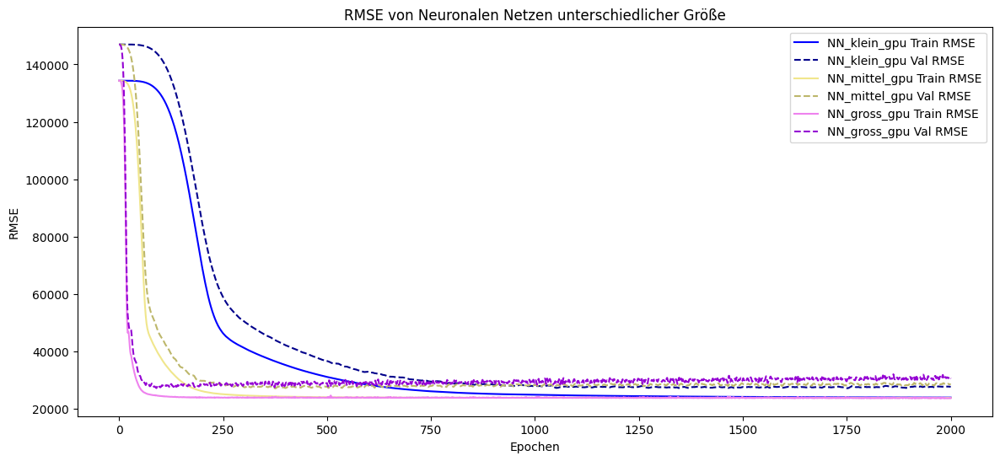

In [154]:
# Plotten Sie die RMSE für Trainings- und Validierungsdaten
plt.figure(figsize=(14, 6))
colors = colors = ['blue', 'khaki', 'violet'] # Liste von Farben für die Linien
linestyles = ['-', '--']  # Liste von Linienstilen
for i, (name, history) in enumerate(history_dict.items()):
    rmse_train = history.history['root_mean_squared_error']#np.sqrt(history.history['loss'])
    rmse_val = history.history['val_root_mean_squared_error']#np.sqrt(history.history['val_loss'])
    plt.plot(rmse_train, label=f'{name} Train RMSE',color=colors[i], linestyle=linestyles[0])
    plt.plot(rmse_val, label=f'{name} Val RMSE',color='dark'+colors[i], linestyle=linestyles[1])

plt.title('RMSE von Neuronalen Netzen unterschiedlicher Größe')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [155]:
pd.DataFrame(history.history).tail()

,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
1996,563358528.0,23735.173828,934362816.0,30567.347656
1997,564054400.0,23749.828125,931912192.0,30527.236328
1998,560686976.0,23678.830078,955785728.0,30915.785156
1999,566439296.0,23799.984375,949627520.0,30816.027344
2000,564728128.0,23764.007812,932165248.0,30531.380859


Der obige Graph zeigt die RMSE-Ergebnisse für die Trainings- und Validierungsdaten der drei Modelle.

Auf der x-Achse sieht man die Anzahl der Epochen. Man erkennt bei allen drei Modellen, dass der RMSE sowohl auf den Trainings- als auch auf den Validierungsdaten sehr schnell abfällt.

Das kleine Modell hat 1.991 Gewichte. In der Grafik gehören die blauen Linien zu diesem Modell. Der Trainings-RMSE liegt über alle Epochen hinweg unterhalb des Validierungs-RMSE. Beide Kurven zeigen ab ca. 100 Epochen einen stark fallenden Trend. Ab ca. 1.000 Epochen bleibt der RMSE-Wert stabil. Hier konvergiert das Modell. Der RMSE sinkt auf den Trainingsdaten auf ca. 30.000 und auf den Validierungsdaten auf einen leicht höheren Wert.

Das mittlere Modell umfasst 82.401 Gewichte. Zu diesem Modell gehören die zwei khakifarbenen Linien. Diese sinken früher und steiler. Auch hier ist der Trainings-RMSE stets unter dem Validierungs-RMSE. Die Werte bleiben schon ab ca. 250 Epochen stabil. Das Modell konvergiert und die Kennzahlen können berechnet werden. Beim Validierungs-RMSE erkennt man allerdings, dass dieser ab ca. 500 Epochen wieder zu steigen beginnt. Dies ist ein deutliches Zeichen für Overfitting. Diesem Trend müsste man durch Regularisierung und Early Stopping entgegenwirken.

Das große Modell hat 2.071.001 Gewichte. Hierzu gehören die magentafarbenen Kurven. Die RMSE-Werte fallen gleich zu Beginn und bleiben bereits ab unter 100 Epochen stabil (Konvergenz). Auch hier sieht man ab 250 Epochen einen steigenden Validierungs-RMSE, der für Overfitting spricht.

Da die einzigen geänderten Parameter die Anzahl der Neuronen in den Layern sind, zeigt die obige Grafik gut, wie die Neuronenanzahl in den Layern die Konvergenz beeinflusst. Je mehr Neuronen ein Netz beinhaltet, desto früher konvergiert das Modell. Die Grafiken zeigen allerdings auch das Problem von Overfitting, wenn die Anzahl der Epochen zu groß gewählt wird. Hier könnte Early Stopping behilflich sein.

Es gilt zu beachten, dass die obigen Modelle nur auf 100 Beobachtungen trainiert wurden, die auch noch intern in Trainings- und Validierungsdaten eingeteilt wurden. Dadurch sind die Modelle relativ schnell zu trainieren.

Ein weiterer Parameter, der Einfluss auf die Modellkonvergenz hat, ist der Parameter batch_size. Dieser ist standardmäßig auf den Wert 32 gesetzt. Erhöht man diesen Wert beispielsweise auf batch_size=100, so weist Keras an, 100 Trainingsbeispiele durch das Netzwerk zu leiten, bevor ein Backpropagation-Durchgang zur Anpassung der Gewichte und Verzerrungen durchgeführt wird. Das Training nimmt weniger Zeit in Anspruch, wenn die Stapelgröße groß ist, aber die Genauigkeit könnte darunter leiden. Ein geringerer Wert erhöht aber die Genauigkeit nicht zwangsläufig. Nachfolgend ist einmal der Modelldurchlauf mit batch_size=100 dargestellt.

In [156]:
for i, (modelname, neurons) in enumerate(neurons_dict.items()):
    print(modelname)
    model = Sequential(name=modelname)
    model.add(InputLayer(input_shape=x_subset.shape[1]))
    for j, neuron in enumerate(neurons):
        model.add(Dense(neuron, activation='leaky_relu', name=f'HiddenLayer{j+1}'))
    model.add(Dense(1, activation='linear', name='OutputLayer'))
    model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
    models_dict[modelname] = model

NN_klein_gpu
NN_mittel_gpu
NN_gross_gpu


In [157]:
# Trainiere jedes Modell und speichern Sie die History
history_dict_batch = {}
for name, model in models_dict.items():
    display(model.summary())
    history = model.fit(x_subset, y_subset, epochs=2001, validation_split=0.2, verbose=0, batch_size=100)
    history_dict_batch[name] = history

Model: "NN_klein_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 10)                680       
                                                                 
 HiddenLayer2 (Dense)        (None, 10)                110       
                                                                 
 HiddenLayer3 (Dense)        (None, 100)               1100      
                                                                 
 OutputLayer (Dense)         (None, 1)                 101       
                                                                 
Total params: 1991 (7.78 KB)
Trainable params: 1991 (7.78 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Model: "NN_mittel_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 OutputLayer (Dense)         (None, 1)                 51        
                                                                 
Total params: 82401 (321.88 KB)
Trainable params: 82401 (321.88 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

Model: "NN_gross_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 1000)              68000     
                                                                 
 HiddenLayer2 (Dense)        (None, 1000)              1001000   
                                                                 
 HiddenLayer3 (Dense)        (None, 1000)              1001000   
                                                                 
 OutputLayer (Dense)         (None, 1)                 1001      
                                                                 
Total params: 2071001 (7.90 MB)
Trainable params: 2071001 (7.90 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


None

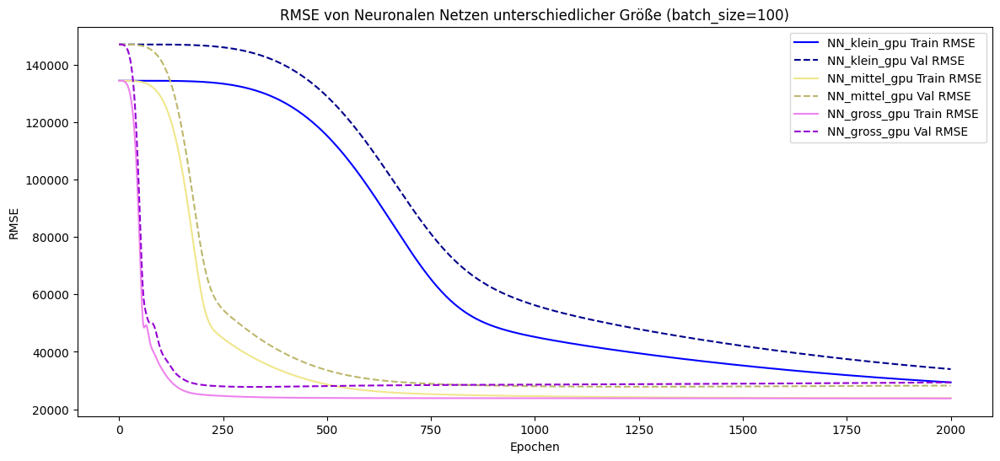

In [158]:
# Plotten Sie die RMSE für Trainings- und Validierungsdaten
plt.figure(figsize=(14, 6))
colors = colors = ['blue', 'khaki', 'violet'] # Liste von Farben für die Linien
linestyles = ['-', '--']  # Liste von Linienstilen
for i, (name, history) in enumerate(history_dict_batch.items()):
    rmse_train = history.history['root_mean_squared_error']#np.sqrt(history.history['loss'])
    rmse_val = history.history['val_root_mean_squared_error']#np.sqrt(history.history['val_loss'])
    plt.plot(rmse_train, label=f'{name} Train RMSE',color=colors[i], linestyle=linestyles[0])
    plt.plot(rmse_val, label=f'{name} Val RMSE',color='dark'+colors[i], linestyle=linestyles[1])

plt.title('RMSE von Neuronalen Netzen unterschiedlicher Größe (batch_size=100)')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

Es ist zu erkennen, dass die Modelle nun viel später zu einem niedrigen RMSE Wert konvergieren. Das kleine Modell hat augenscheinlich sein Minimum nach 2001 Epochen noch nicht erreicht.  
Da in der Aufgabenstellung nicht erwähnt ist, dass man mit diesem Parameter experimentieren soll, wird er auf dem Standardwert 32 belassen und obige Auswertung wird gewählt. 

##### b) Es soll ein Neuronales Netz für den kompletten Trainingsdatensatz (sample = A) erstellt werden. Hierbei sind bei der Architektur des Netzes ggf. Erkenntnisse aus Teilaufgabe a) miteinzubeziehen und die vorgenommenen Änderungen an der Architektur des Netzes zu beschreiben. Die Größe und Architektur des Neuronalen Netzes muss ausreichend groß sein, um die Komplexität des Datensatzes abbilden zu können. Overfitting soll durch geeignete Regularisierung verhindert werden. Die Daten sind zu fitten und die Lernkurve aus (interner) Trainings- und Modellvalidierung ist zu plotten. Im Anschluss ist das Modell mit den „externen“ Validierungsdaten (sample = B) zu validieren. Falls die Prognosegüte dieses hochparametrigen Modells schlechter als die des einfachen linearen Modells aus Aufgabe A-7 a) ist, sind die Ursachen zu suchen und zu beheben. Dieses Ergebnis (RMSE) ist samt Laufzeit anzuzeigen, dem Gesamtvergleich hinzuzufügen und zu bewerten.

<u>Lösungsansatz:</u>

Für nachfolgende Aufgabe wird nun der Code aus a) genutzt und so angepasst, dass es die Komplexität des Datensatzes widerspiegelt. 
Zunächst einmal wird der Datensatz wie beschrieben ind Trainings- und Validierungsdaten eingeteilt. Diese Validierungsdaten werden aber nicht mittels des Parameters validation_data beim Fit des Modells berücksichtigt, sondern erst später bei der Bewertung. Dabei wird das Modell auf diesen erneut angewandt. 
Beim Fit selbst wird weiterhin der validation_split=0.2 gewählt und die Traingsdaten intern gesplittet. 

Die Größe des Neuronalen Netzes gilt es so zu wählen, dass es die Komplexität des Datensatzes widerspiegelt. Das kleinste Modell aus a) wird nicht getestet, da es bereits auf 100 Datenpunkten lange zum Trainieren benötigt. 
Es wird zunächst das mittlere Modell gewählt. 
Anpassungen, die gemacht werden können sind zum einen die Anzahl der Neuronen zu verändern und zum anderen mehr HiddenLayer hinzuzufügen. 

Overfitting wie oben gesehen soll durch Regularisierung vermieden werden. Hier wird L2-Regularisierung zunächst ausprobiert. Als Lernrate wird der Defaultwert von 0.01 verwendet. 

In dieser Teilaufgabe wird zunächst das Modell aus Aufgabe a) trainiert und dann iterativ optimiert. Hierbei werden folgende Strategien getestet: 
* Versuch 1: Training des Modells aus Aufgabe a) mit L2 Regularisierung
* Versuch 2: Hinzufügen von Dropout
* Versuch 3: Dropout mit Parameter 0,5
* Versuch 4: Early Stopping
* Versuch 5: Aufnahme eines weiteren HidedenLayer im Modell
* Versuch 6: Ändern der Anzahl der Neuronen
* Versuch 7: Ändern dedes Batch-sizes
* Versuch 8: Ändern der Startgewichte der Hidden Layer
* Versuch 9: Batch Normalisierung
* Versuch 10: Batch Normalisierung und Dropout

**Anmerkung**: Die ersten 3 neuronalen Netze ohne early stopping werden nachfolgend auskommentiert, da sie eine sehr lange Laufzeit haben und ohnehin nicht das finale Modell repräsentieren. Sie wurden lediglich im CPU Notebook ausgeführt. Sie sind im Modell-Ordner gespeichert und können im Bedarfsfall geladen werden. 

Zunächst wird der Datensatz wie angegeben ind Trainings- und Validierungsdaten unterteilt. Dann wird das mittlere Neuronale Netz aus der vorigen Aufgabe als Startnetz getestet. Hier wird das Netz um die L2-Regularisierung mit Standardparameter ergänzt.

In [159]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
train_data = df_trans[df_trans['sample'] == 'A']
val_data = df_trans[df_trans['sample'] == 'B']

# Entfernen der Spalte 'sample' und Aufteilung in Features und Target 
x_train = train_data.drop(['sample', 'median_house_value'], axis=1)
y_train = train_data['median_house_value'] #Der Hauspreis ist die Zielvariablen

x_val = val_data.drop(['sample','median_house_value'], axis=1)
y_val = val_data['median_house_value']

Es wird in Erinnerung der Ziel-RMSE, den es zu unterbieten gilt, gerufen. Der RMSE des neuronalen Netzes soll auf den Validierungsdatne besser als der des linearen Modells aus A7 sein. Der RMSE aus A7 der linearen Regression betrug ca. 69098. Das Ergebnis kann aus dem dictionary, in welchem die Modellergebnisse zwischengespeichert sind, abgerufen werden. 

In [160]:
pd.DataFrame(dict)[pd.DataFrame(dict)['Model name']=='Linear_Regression']

,Model name,RMSE,Laufzeit
0,Linear_Regression,69098.044735,0.100598


<u>Versuch 1:</u> Trainieren des mittleren Modells aus Aufgabe a)

In [161]:
# model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
# model.add(InputLayer(input_shape=x_train.shape[1]))
# for j, neuron in enumerate([100,500,50]):
#     model.add(Dense(neuron, activation='leaky_relu',
#                     kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
#                     name=f'HiddenLayer{j+1}'))

# model.add(Dense(1, activation='linear', name='OutputLayer'))
# model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [162]:
# # Modell trainieren und Zeit messen
# model.summary()
# start_time = time.time()
# history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0)
# training_time = time.time() - start_time

In [163]:
# # Lernkurve plotten
# plt.figure(figsize=(14, 6))
# plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
# plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
# plt.title('Trainings- und Validierungs RMSE')
# plt.xlabel('Epochen')
# plt.ylabel('RMSE')
# plt.legend()
# plt.show()

Das Modell wird folglich abgespeichert, um es später wieder aufrufen zu können. 

In [164]:
# model.save(f'./models/NN_Gesamtdaten_mittel_{gpu_name}.h5')

In [165]:
# # Modellvalidierung mit externen Validierungsdaten
# rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# # Ergebnisse anzeigen
# print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
# print(f"Trainingslaufzeit: {training_time} Sekunden")

In obigem Graphen sieht man zunächst, dass der Validierungs-RMSE zunächst unterhalb des Trainings-RMSE startet und nach kurzer Zeit auf sein Mimnimum sinkt. Danach steigt er wiedrer und zeigt einen zackigen Verlauf. Der Trainings-RMSE sinkt bis zum Endeweiter und ist augenscheinlich noch nicht am Minimum. Folglich ist das Modell nicht geeignet, die Tiefe der Daten abzubilden. 
Zunächst wird die zweite Methode zur Regularisierung getestet: Dropout. 

<u>Versuch 2: Hinzufügen von Dropout</u> 

Dropout ist eine Regularisierungstechnik, die dazu dient, eine Überanpassung in neuronalen Netzen zu verhindern. Dabei wird ein Teil der Eingabeeinheiten bei jeder Aktualisierung während der Trainingszeit zufällig auf 0 gesetzt (wenn Zufallszahl die Inklusionswahrscheinlichkeit überschreitet), was dazu beiträgt, komplexe Anpassungen an den Trainingsdaten zu verhindern und das Netzwerk zu ermutigen, robustere Merkmale zu lernen. 

Analog Skript S. 667 ff. trainiert Dropout gewissermaßen ein Ensemble aus Teil-Netzen, die durch das zufällige Weglassen von Neuronen aus dem Basis-Netz erzeugt werden.

Der Vorteil liegt darin, dass nur ein Netz trainiert werden muss. 

Als Hyperparameter beim Dropout wurde zunächst 0.2 gewählt.

In [166]:
# model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
# model.add(InputLayer(input_shape=x_train.shape[1]))
# for j, neuron in enumerate([100,500,50]):
#     model.add(Dense(neuron, activation='leaky_relu',
#                     kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
#                     name=f'HiddenLayer{j+1}'))
#     model.add(Dropout(0.2))  # Dropout zur Regularisierung
# model.add(Dense(1, activation='linear', name='OutputLayer'))
# model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [167]:
# # Modell trainieren und Zeit messen
# model.summary()
# start_time = time.time()
# history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0)
# training_time = time.time() - start_time

In [168]:
# # Lernkurve plotten
# plt.figure(figsize=(14, 6))
# plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
# plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
# plt.title('Trainings- und Validierungs RMSE')
# plt.xlabel('Epochen')
# plt.ylabel('RMSE')
# plt.legend()
# plt.show()

In [169]:
# # Modellvalidierung mit externen Validierungsdaten
# rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# # Ergebnisse anzeigen
# print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
# print(f"Trainingslaufzeit: {training_time} Sekunden")

In [170]:
# model.save(f'./models/NN_Gesamtdaten_dropout_{gpu_name}.h5')

Der Validierungs-RMSE wurde nun deutlich verbessert auch die Grafik zeigt, dass das Problem des Overfittings nicht mehr so stark ist, aber immer noch ersichtlich. 

Der ursprünglichen Modellarchitektur ist somit auch Dropout hinzuzufügen. Dennoch ist der RMSE immer noch schlechter als beim Linearen Modell aus Aufgabe A7. 

<u>Versuch 3: Änderung des Dropout Hyperparameters</u> 

Im nächsten Schritt wurde Dropout mit Hyperparameter 0.5 erneut getestet. 

In [171]:
# model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
# model.add(InputLayer(input_shape=x_train.shape[1]))
# for j, neuron in enumerate([100,500,50]):
#     model.add(Dense(neuron, activation='leaky_relu',
#                     kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
#                     name=f'HiddenLayer{j+1}'))
#     model.add(Dropout(0.5))  # Dropout zur Regularisierung
# model.add(Dense(1, activation='linear', name='OutputLayer'))
# model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [172]:
# # Modell trainieren und Zeit messen
# model.summary()
# start_time = time.time()
# history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0)
# training_time = time.time() - start_time

In [173]:
# # Lernkurve plotten
# plt.figure(figsize=(14, 6))
# plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
# plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
# plt.title('Trainings- und Validierungs RMSE')
# plt.xlabel('Epochen')
# plt.ylabel('RMSE')
# plt.legend()
# plt.show()

In [174]:
# # Modellvalidierung mit externen Validierungsdaten
# rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# # Ergebnisse anzeigen
# print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
# print(f"Trainingslaufzeit: {training_time} Sekunden")

In [175]:
# model.save(f'./models/NN_Gesamtdaten_dropout05_{gpu_name}.h5')

Auch eine Änderung des Parameters liefert keine signifikante Verbesserung des Validierungs-RMSE. Overfitting ist auch nach wie vor noch ein Problem. 
Deswegen wird im nächsten Schritt early_stopping dem Netz hinzugefügt. 

<u>Versuch 4: Early stopping</u> 

In [176]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,50]):
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

Der Parameter "patience" in der "EarlyStopping"-Rückruffunktion in Keras gibt an, wie viele Epochen das Training fortgesetzt werden soll, nachdem die Verbesserung des Validierungsverlusts aufgehört hat, bevor das Training tatsächlich gestoppt wird.

Wenn der Validierungsverlust für eine bestimmte Anzahl von Epochen (angegeben durch "patience") nicht mehr verbessert wird, stoppt das Training automatisch. Dies ist nützlich, um Overfitting zu vermeiden und das Training zu stoppen, wenn das Modell keine weiteren Verbesserungen auf den Validierungsdaten zeigt.

In [177]:
# Definieren des Early Stopping Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# callbacks=[early_stopping] in fit

In [178]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 dropout_1 (Dropout)         (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 dropout_2 (Dropout)         (None, 50)                0         
                                                                 
 OutputLayer (Dense)         (None, 1)          

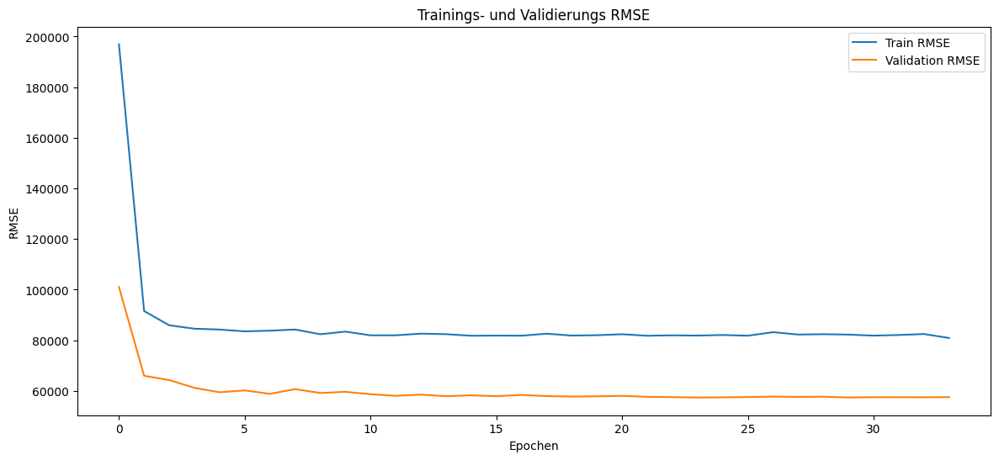

In [179]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [180]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 71008.453125
Trainingslaufzeit: 46.62663674354553 Sekunden


In [181]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_es_{gpu_name}.h5'))

In [182]:
#modell_es = load_model(f'./models/NN_Gesamtdaten_es_{gpu_name}.h5')

<u>Versuch 5: Weiterer Layer im Modell</u>

Um zu testen, ob die Modelltiefe die richtige ist, wird ein weiterer Layer dem modell hinzugefügt und der Validierungs-RMSE überprüft.

In [183]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,100,50]):
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [184]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 dropout_3 (Dropout)         (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 dropout_4 (Dropout)         (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 100)               50100     
                                                                 
 dropout_5 (Dropout)         (None, 100)               0         
                                                                 
 HiddenLayer4 (Dense)        (None, 50)         

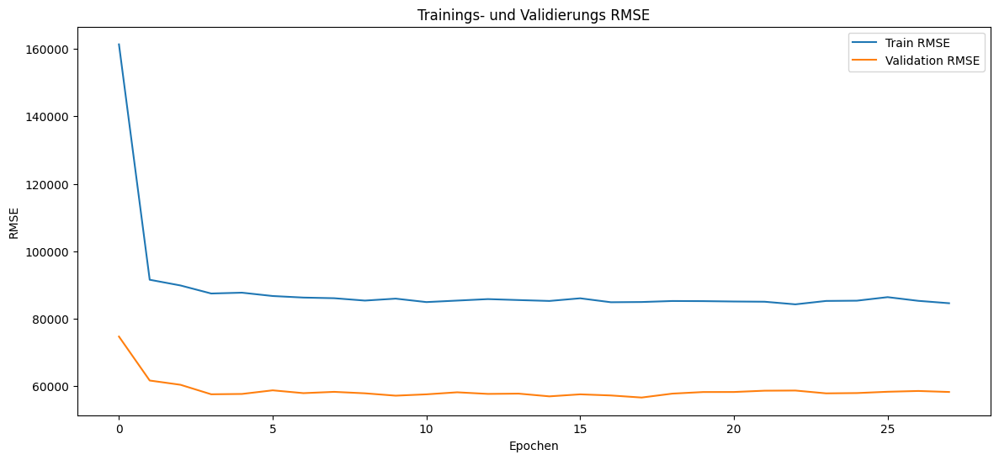

In [185]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [186]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 70189.5234375
Trainingslaufzeit: 42.34937596321106 Sekunden


In [187]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_layer4_{gpu_name}.h5'))

Durch das Hinzufügen eines weiteren Layers sieht man keine signifikante Verbesserung. Allerdings wurde die Laufzeit länger. Dies wird also nicht im finalen Modell umgesetzt. 

Weitere Parameter, die bislang nicht geändert oder nur auf der Standardeinstellung vertestet wurden, sind die  Lernrate in der L2-Regularisierung und die Anzahl der Neuronen. Die Lernrate steuert die Schrittgröße, mit der die Gewichte des neuronalen Netzes während des Trainings aktualisiert werden. Die L2-Regularisierung, auch bekannt als Gewichtsabnahme, fügt der Verlustfunktion eine Strafe hinzu, die auf dem quadrierten Betrag der Gewichte basiert. Die Lernrate hingegen bestimmt, wie stark die Gewichte in der Richtung aktualisiert werden, die den Verlust minimiert.

Da unser Modell allerdings schnell konvergiert und kleinere Wahlen nicht getestet werden, werden im nächsten versuch die Anzahl der Neuronen erhöht. 


<u>Versuch 6: Ändern der Anzahl der Neuronen</u>

In [188]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([500,500,50]):
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [189]:
# Definieren des Early Stopping Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# callbacks=[early_stopping] in fit

In [190]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 500)               34000     
                                                                 
 dropout_7 (Dropout)         (None, 500)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               250500    
                                                                 
 dropout_8 (Dropout)         (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 dropout_9 (Dropout)         (None, 50)                0         
                                                                 
 OutputLayer (Dense)         (None, 1)          

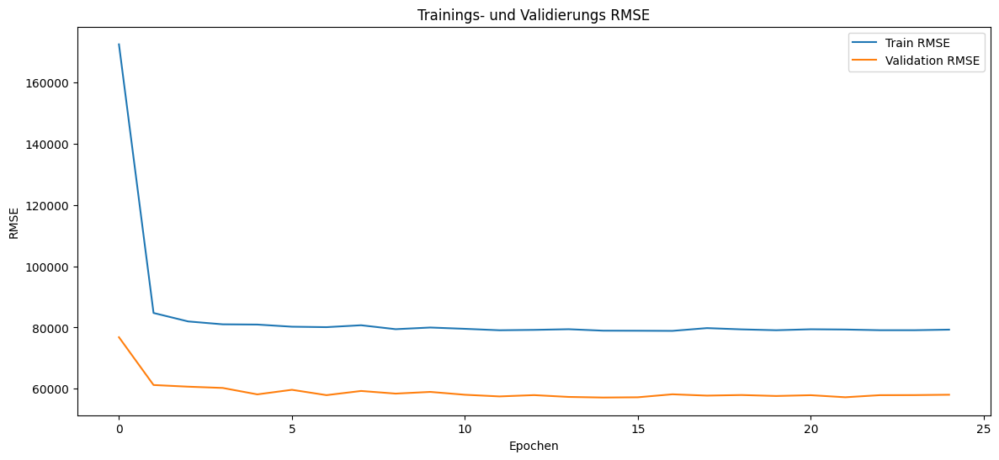

In [191]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [192]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 70293.53125
Trainingslaufzeit: 34.18032240867615 Sekunden


In [193]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_neur_{gpu_name}.h5'))

Das Modell zeicht keine signifikante Verbesserung im Validierungs-RMSE, aber eine höhere Laufzeit. Die Anzahl der Neuronen bleibt somit auch unverändert.
Wie bereits in a) wird im Folgenden noch der Parameter Batch_size geprüft. In der vorigen Aufgabe wurde bereits deutlich, dass eine kleinere Wahl als der Standardparameter zwar zu längeren Laufzeiten führt, allerdings auch zu besseren Ergebnissen führen kann. Dies wird nachfolgend für batch_size=20 getestet. 

<u>Versuch 7: Ändern des Batch-sizes</u>

In [194]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,50]):
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [195]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping], batch_size=20)
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 dropout_10 (Dropout)        (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 dropout_11 (Dropout)        (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 dropout_12 (Dropout)        (None, 50)                0         
                                                                 
 OutputLayer (Dense)         (None, 1)          

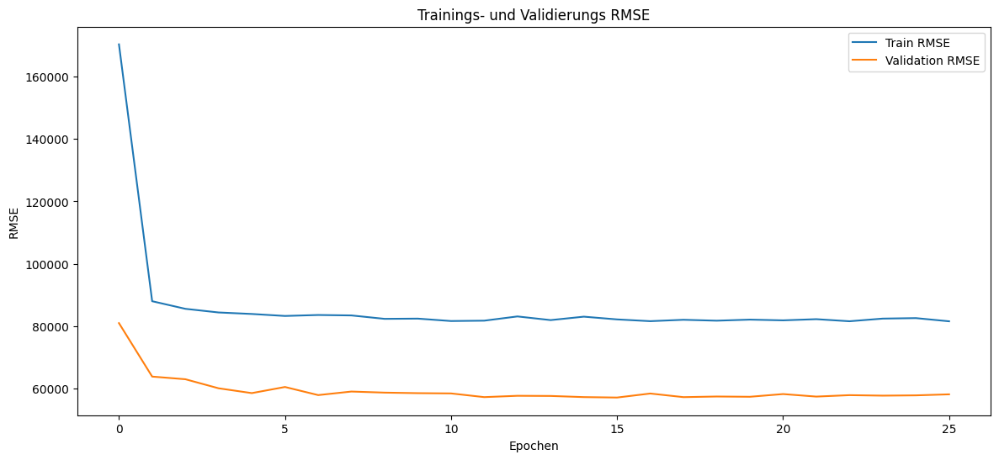

In [196]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [197]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 71541.546875
Trainingslaufzeit: 54.76368761062622 Sekunden


In [198]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_batch20_{gpu_name}.h5'))

Der RMSE auf den Validierungsdaten wurde sogar schlechter. Folglich bleibt der bacth_size auf dem Default Wert.

Im nächsten Versuch werden die Startgewichte der Hidden Layer bestimmt. 
Bei Verwendung der Aktivierungsfunktion 'linear' in einem neuronalen Netzwerk erfolgt in der Regel eine zufällige Initialisierung der Gewichte. Da die 'linear'-Aktivierungsfunktion zu einer linearen Transformation der Eingaben führt, hängen die Ausgaben des Layers unmittelbar von den gewichteten Eingaben ab. Daher ist die Auswahl der Startgewichte für das Output-Layer mit 'linear'-Aktivierungsfunktion im Vergleich zu anderen Aktivierungsfunktionen weniger kritisch.
Für die Leaky ReLU-Aktivierungsfunktion eignet sich besonders gut die He-Initialisierungsmethode. Die He-Initialisierung ist eine Technik, die speziell für die Verwendung mit der ReLU-Aktivierungsfunktion entwickelt wurde und hilft, das Problem des "Verschwindens der Gradienten" zu mildern, das bei der Verwendung von ReLU auftreten kann.

Quellen: 
* [Weight Initialization Techniques in Neural Networks | by Saurabh Yadav | Towards Data Science](https://towardsdatascience.com/weight-initialization-techniques-in-neural-networks-26c649eb3b78), Stand 28.4.24
* [Weight Initialization and Activation Functions - Deep Learning Wizard](https://www.deeplearningwizard.com/deep_learning/boosting_models_pytorch/weight_initialization_activation_functions/#case-3-leaky-relu), Stand 28.4.24

<u>Versuch 8: Ändern der Startgewichte der Hidden Layer</u>

In [199]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,50]):
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_initializer=HeNormal(),
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [200]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 dropout_13 (Dropout)        (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 dropout_14 (Dropout)        (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 50)                25050     
                                                                 
 dropout_15 (Dropout)        (None, 50)                0         
                                                                 
 OutputLayer (Dense)         (None, 1)          

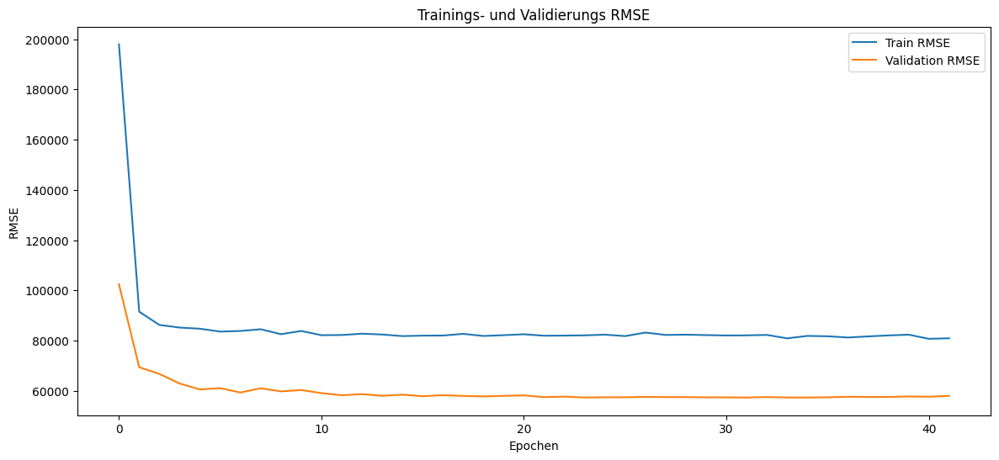

In [201]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [202]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 71031.078125
Trainingslaufzeit: 55.85863661766052 Sekunden


In [203]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_weight_{gpu_name}.h5'))

Auch hier zeigt sich keine wesentliche Verbesserung. 
Als letzte Optimierungsmöglichkeit in der Architektur wird noch die Batch Normalisierung geprüft. 

Beim Training eines tiefen neuronalen Netzwerks findet nach jedem Durchlauf die Backpropagation statt, wobei der Fehler von hinten durch das Netzwerk Schicht für Schicht durchläuft und die Gewichtungen der Neuronen entsprechend angepasst werden, um den Fehler zu minimieren. Dies geschieht unter der Annahme, dass alle anderen Schichten gleichbleiben, obwohl in der Praxis alle Schichten relativ schnell hintereinander geändert werden. Das führt zu einer Veränderung der statistischen Kennzahlen der Werteverteilung in jeder Schicht nach jedem Durchlauf, was das Training verlangsamt und niedrigere Lernraten erfordert, um gute Ergebnisse zu erzielen.

Die Inputdaten sind nach obigem pre-processing bereits normalisiert. Werden allerdings durch die Aktivierungsfunktion in der ersten Schicht wieder de-normalsiert. 
Die Batch Normalization wird angewendet, um die Werte vor jeder Aktivierungsfunktion zu normalisieren, indem der Mittelwert und die Standardabweichung für jedes Batch berechnet und die Werte entsprechend normalisiert werden. Dies trägt dazu bei, die interne covariate shift zu reduzieren und das Training zu beschleunigen, wie im Paper ["Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift"](arxiv.org/pdf/1502.03167) beschrieben.

<u>Versuch 9: Batch Normalisierung</u>

Beim Aufbau eines Modells mit einer Batch Normalization-Schicht gibt es wichtige Überlegungen zu berücksichtigen. Einerseits sollte die Lernrate mit der Einführung der Normalisierungsschicht erhöht werden, da das Modell durch die Normalisierung stabiler wird und somit schneller Gewichtsanpassungen durchführen kann, während es dennoch konvergiert.
Gleichzeitig ist es ratsam, auf die Verwendung einer Dropout-Schicht zu verzichten. Einerseits bietet die Normalisierung bereits ein zusätzliches Maß an Generalisierung, wodurch die Dropout-Schicht möglicherweise überflüssig wird. Andererseits kann die Kombination von Normalisierung und Dropout sogar zu einer Verschlechterung der Ergebnisse führen, da durch die Normalisierung und das gleichzeitige Auslassen von Neuronen Rauschen erzeugt wird.

Quelle: https://databasecamp.de/ki/batch-normalization, Stand 24.4.24

In [204]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,50]):
    model.add(Dense(neuron, 
                    kernel_initializer=HeNormal(), 
                    kernel_regularizer=regularizers.l2(0.1), 
                    name=f'HiddenLayer{j+1}'))
    model.add(BatchNormalization())  # Batch-Normalisierung nach jeder Dense-Schicht (außer ersten)
    model.add(Activation('leaky_relu'))  # Anwendung der leaky ReLU-Aktivierungsfunktion nach der Batch-Normalisierung
    #model.add(Dropout(0.5))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [205]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 batch_normalization (Batch  (None, 100)               400       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 batch_normalization_1 (Bat  (None, 500)               2000      
 chNormalization)                                                
                                                                 
 activation_1 (Activation)   (None, 500)        

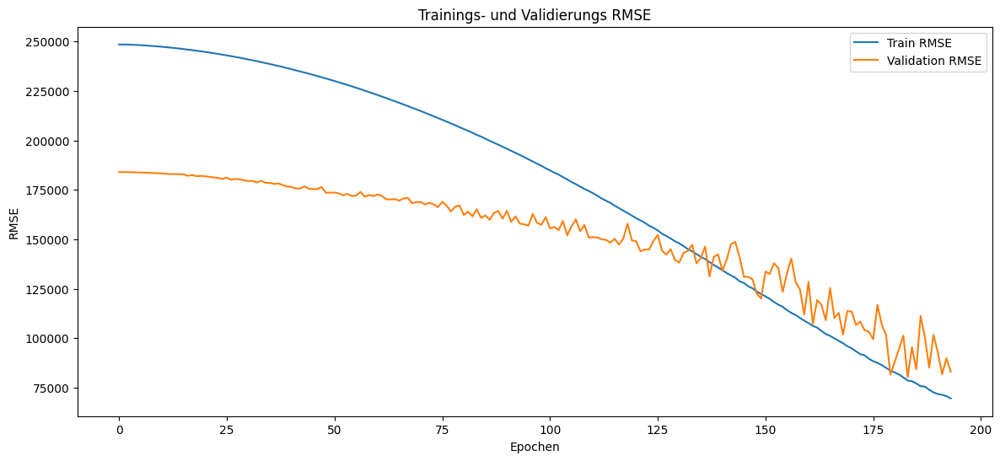

In [206]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [207]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 81832.53125
Trainingslaufzeit: 376.2716910839081 Sekunden


In [208]:
# model.save(os.path.join(models_path, f'NN_Gesamtdaten_batchnorm_{gpu_name}.h5'))

In der summary sieht man nun eine Menge an nicht trainierbaren Parametern, die durch die Batch Normalisierung ausgeschlossen werden. Sie benötigen dennoch Speicherplatz. 

Der RMSE auf den Validierungsdaten ist mit 66900 besser als beim linearen Modell aus A7. Die reine Anwendung der Batch-Normalisierung zeigt auch grafisch, dass das Modell auf den Traingsdaten gegen Ende konvergiert ist, allerdings wegen Overfitting auf den internen Validierungsdaten und early_stopping das Training nach ca. 200 Runden abbricht. Man kann auch Dropout und Batch-Normalization gemeinsam anwenden. Quelle: https://www.kaggle.com/code/ryanholbrook/dropout-and-batch-normalization

<u>Versuch 10: Batch Normalisierung und Dropout</u>

In [209]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([100,500,50]):
    model.add(Dense(neuron, 
                    kernel_initializer=HeNormal(), 
                    kernel_regularizer=regularizers.l2(0.1), 
                    name=f'HiddenLayer{j+1}'))
    model.add(BatchNormalization())  # Batch-Normalisierung nach jeder Dense-Schicht (außer ersten)
    model.add(Activation('leaky_relu'))  # Anwendung der leaky ReLU-Aktivierungsfunktion nach der Batch-Normalisierung
    model.add(Dropout(0.2))  # Dropout zur Regularisierung -> wähle Parameter wegen BatchNormalisierung 
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [210]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 100)               6800      
                                                                 
 batch_normalization_3 (Bat  (None, 100)               400       
 chNormalization)                                                
                                                                 
 activation_3 (Activation)   (None, 100)               0         
                                                                 
 dropout_16 (Dropout)        (None, 100)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               50500     
                                                                 
 batch_normalization_4 (Bat  (None, 500)               2000      
 chNormalization)                               

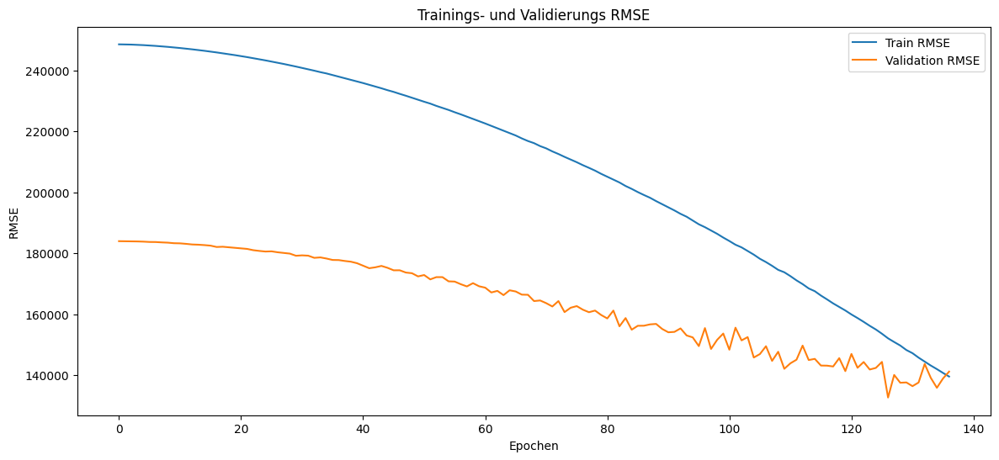

In [211]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In [212]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 147287.0
Trainingslaufzeit: 275.2572138309479 Sekunden


Hier zeigt sich keine Konvergenz zu einem minimalen Wert nach 200 Epochen. 

Aus obigen Erkenntnissen wird das finale Modell nun wie folgt bestimmt. Als Basis dient das mittlere Modell aus der vorigen Aufgabe. Die Architektur wird folgendermaßen geändert:
* Einführung der L2-Regularisierung
* Änderung der Gewichte in den HiddenLayer auf HeNormal. 
* Erhöhung der Anazhal der Neuronen auf 500 pro Schicht.
* Einführung einer weiteren Schicht Hidden Layer
* Nutzung von Dropout mit einer Rate von 0,2
Nutzen von early stopping um zum vorzeitigen Abbruch zu kommen.

In [213]:
model = Sequential(name=f'NN_Gesamtdaten_{gpu_name}')
model.add(InputLayer(input_shape=x_train.shape[1]))
for j, neuron in enumerate([500,500,500,500]): 
    model.add(Dense(neuron, activation='leaky_relu',
                    kernel_initializer=HeNormal(),
                    kernel_regularizer=regularizers.l2(0.01),  # L2-Regularisierung
                    name=f'HiddenLayer{j+1}'))
    model.add(Dropout(0.2))  # Dropout zur Regularisierung
model.add(Dense(1, activation='linear', name='OutputLayer'))
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [214]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [215]:
# Modell trainieren und Zeit messen
model.summary()
start_time = time.time()
history = model.fit(x_train, y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_Gesamtdaten_gpu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 HiddenLayer1 (Dense)        (None, 500)               34000     
                                                                 
 dropout_19 (Dropout)        (None, 500)               0         
                                                                 
 HiddenLayer2 (Dense)        (None, 500)               250500    
                                                                 
 dropout_20 (Dropout)        (None, 500)               0         
                                                                 
 HiddenLayer3 (Dense)        (None, 500)               250500    
                                                                 
 dropout_21 (Dropout)        (None, 500)               0         
                                                                 
 HiddenLayer4 (Dense)        (None, 500)        

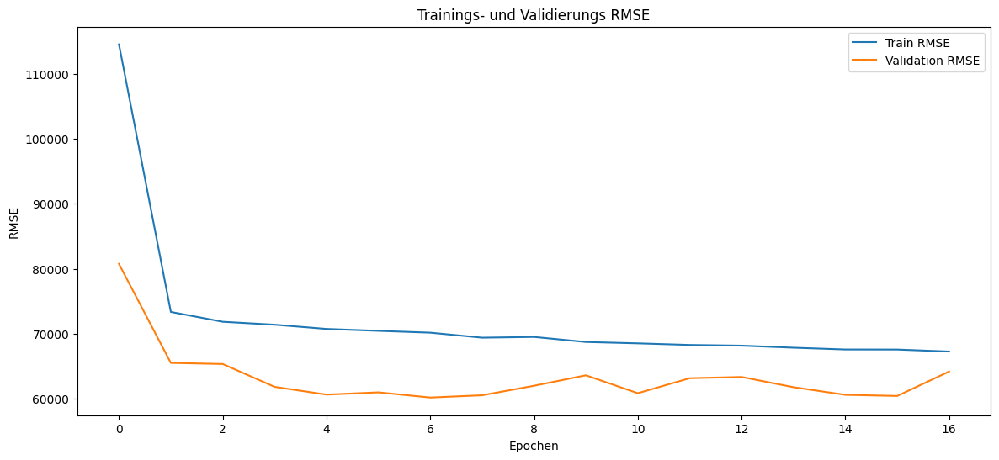

In [216]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

Es ist bemerkenswert, dass der RMSE auf den internen Validierungsdaten stets unter dem der Trainingsdaten liegt. Das nun gefundene Modell endet durch early_stopping nach ungefähr 25 Runden. 
Es besteht auf 4 Hidden Layern mit jeweils 500 Neuronen. 

Gegen das Overfitting wurden sowohl die L2 Regularisierung als auch Dropout angewandt. Die Dropout Rate kann im Zusammenhang mit der Anzahl der Neuronen sicherlich noch weiter optimiert werden. 

In [217]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = model.evaluate(x_val, y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 69129.6796875
Trainingslaufzeit: 26.872942447662354 Sekunden


In [218]:
model.save(os.path.join(models_path, f'NN_Gesamtdaten_summe_{gpu_name}.h5'))

In [219]:
# Hinzufügen der Modelllaufzeit und des RMSE zum dictionary
model_name.append(f'NN_B2_{gpu_name}')
model_rmse.append(rmse_external_validation)
model_laufzeit.append(training_time)

Es wurden nun zwei Modelle gefunden, die den RMSE des linearen Modells unterbieten. 
Im Normalfall würde man nicht diesen schrittweisen Ansatz wählen, sondern die Hyperparameter nicht mittel trial&error sondern mittels einer Optimierung bestimmen, z.B. mittels Gittersuche. 

Da die Methode der Batch-Normalisierung nicht Teil der Unterlagen aus dem Kurs ADSI war, wurde sich für das letztere Mdoell als Kombination der Erkenntnisse entschieden. 
Es wurden alle Modelle zwischengespeichert. Sie können mittels load_model wieder aufgerufen werden. Das erspart die Trainingszeit. 
Im folgenden wird nun dieses letzte Modell mit dem aus A7 verglichen. 

In [220]:
# das ausgewählte Modell kann mittels load_model geladen werden
loaded_model = load_model(f'./models/NN_Gesamtdaten_summe_{gpu_name}.h5')

In [221]:
pd.DataFrame(dict)

,Model name,RMSE,Laufzeit
0,Linear_Regression,69098.044735,0.100598
1,CatBoost_gpu,50030.337811,19.489086
2,CatBoost_B1_gpu,49218.896419,10.938563
3,NN_B2_gpu,69129.679688,26.872942


In [222]:
desired_models = ['Linear_Regression', f'NN_B2_{gpu_name}']
filtered_data = {key: [value for idx, value in enumerate(dict[key]) if dict['Model name'][idx] in desired_models] for key in dict}

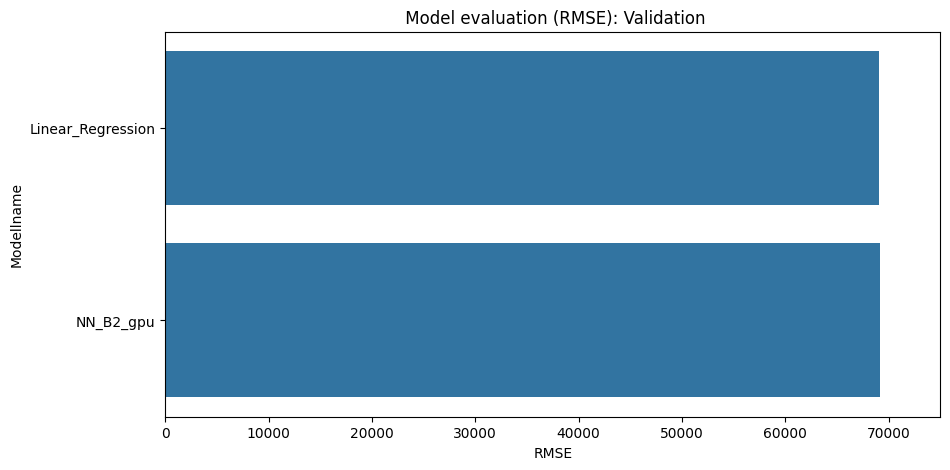

In [223]:
plot_rmse(filtered_data,0,75000, "Validation")

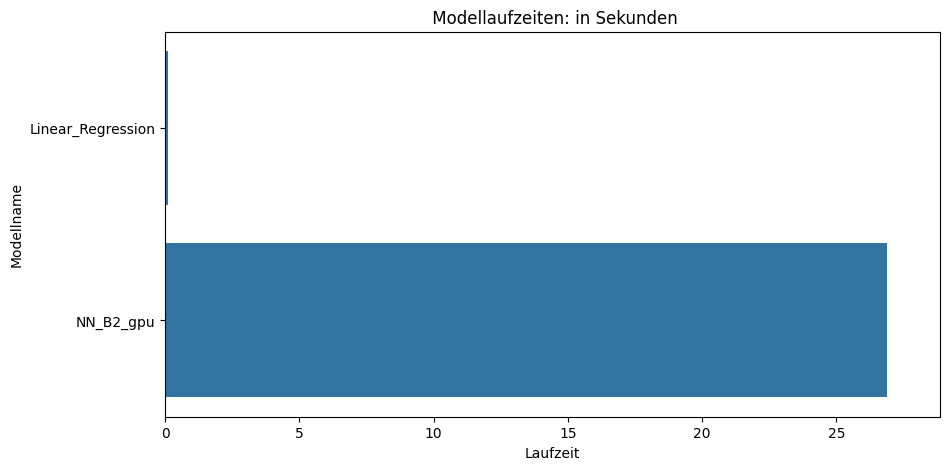

In [224]:
plot_laufzeit(filtered_data,0,max(filtered_data['Laufzeit'])+2,"in Sekunden")

Der Plot des RMSE auf Validierungsdaten zeigt, dass das Neuronale Netz einen leicht besseren RMSE-Wert als die lineare Regression hat. Dennoch ist der Wert deutlich höher als der der beiden CatBoost-Modelle. Bezüglich der Laufzeit zeigt das Neuronale Netz die höchste Laufzeit. Sie ist deutlich höher als beim linearen Modell.

Der Aufwand, der oben gezeigt wurde, macht deutlich, dass es schwer ist, ein gutes neuronales Netz zu erstellen.

Das erstellte Netz performt bezüglich beider KPIs schlechter als ein CatBoost-Modell basierend auf Standardparametern. Bezüglich RMSE ist es ungefähr vergleichbar mit der linearen Regression, weist aber eine um ein Vielfaches höhere Laufzeit auf.

Die Architektur kann sich mithilfe des Plot-Befehls angeschaut werden:

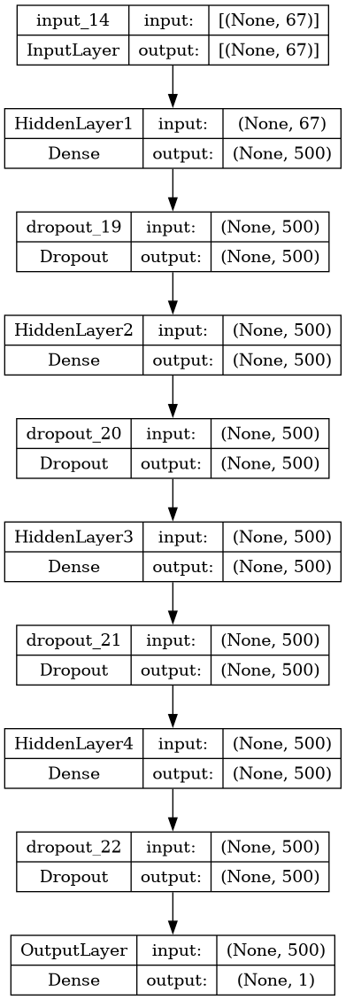

In [225]:
# Visualisierung des Modells
plot_model(model, to_file=f'model_{gpu_name}.png', show_shapes=True, show_layer_names=True)

In [226]:
del model

### Aufgabe B-3: Neuronales Netz mit Embeddings [Lernziele 3.2, 4.1, 4.3, 5.2 & 6; 17 Punkte] <a class="anchor" id="unterabschnitt-2-3"></a>
##### a) Die kategoriellen Merkmale ocean_proximity und county_name sind über zweidimensionale Embeddings in ein Neuronales Netz einzufügen. Die verborgenen Schichten des Netzes sollen dabei aus dem Neuronalen Netz aus Aufgabe B-2 b) übernommen werden. Die nötigen Anpassungen der Modellumsetzung sind detailliert vorab zu beschreiben und dann durchzuführen. Die Trainingsdaten sind zu fitten und die Konvergenz ist zu bewerten. Falls Letztere nicht gegeben ist, so sind die notwendigen Veränderungen durchzuführen.

<u>Lösungsansatz:</u>

Zunächst einmal wird der zugrundeliegende Datensatz neu zusammengeklebt. Anstelle der One-Hot kodierten Variablen werden nun die labelkodierten Variablen für die 2 kategoriellen Merkmale genutzt. Dann wird der Datensatz erneut in Trainings- und Validierungsdaten überführt. 

In [227]:
# Zunächst wird der neue enkodierte Datensatz zusammengeklebt:
df_trans2 = pd.concat([df_scaled_robust, df[['sample','ocean_proximity','county_name', 'median_house_value']]], axis=1)

In [228]:
df_trans2["ocean_proximityX"] = df_trans2.ocean_proximity.factorize()[0]
df_trans2["county_nameX"] = df_trans2.county_name.factorize()[0]

In [229]:
df_trans2.tail()

,latitude,longitude,housing_median_age,population,median_income,rooms_per_house,sample,ocean_proximity,county_name,median_house_value,ocean_proximityX,county_nameX
20635,2.010582,-0.907652,-0.052632,0.791045,-0.823359,0.576896,A,INLAND,Siskiyou,44000,2,55
20636,2.015873,-1.408971,-0.578947,-0.539446,-0.185701,0.372490,B,<1H OCEAN,Del Norte,116700,1,57
20637,2.026455,-1.496042,-0.526316,-0.346482,-0.642797,0.412533,A,NEAR OCEAN,Del Norte,75000,0,57
20638,2.034392,-1.490765,-0.421053,0.044776,-0.577930,0.141693,A,NEAR OCEAN,Del Norte,122400,0,57
20639,2.034392,-1.094987,-0.578947,-0.388060,-0.784733,0.444715,A,INLAND,Siskiyou,53500,2,55


In [230]:
x_train = df_trans2[df_trans2['sample']=='A'].drop(['median_house_value','sample'], axis=1)
y_train = df_trans2[df_trans2['sample']=='A']['median_house_value']
x_val = df_trans2[df_trans2['sample']=='B'].drop(['median_house_value','sample'], axis=1)
y_val = df_trans2[df_trans2['sample']=='B']['median_house_value']

Die HiddenLayers werden aus Aufgabe B-2b) übernommen. Um zweidimensionale Embeddings für die kategorialen Merkmale *ocean_proximity* und *county_name* in ein neuronales Netz zu integrieren und dabei die verborgenen Schichten des Netzes aus der vorigen Aufgabe zu übernehmen, weden folgende Schritte durchgeführt.
1. Anpassung des Inputs: Für die kategoriellen Merkmale werden separate InputLayer angelegt.
2. Embedding-Schicht hinzufügen: Für jedes der beiden kategoriellen Merkmale wird eine Embedding-Schicht hinzugefügt (d=2). Diese Schicht lernt die Darstellung der kategoriellen Werte in einem kontinuierlichen Raum. 
3. Die Ausgaben der Embedding-Schichten wird mit den anderen Inputs kombiniert 
4. Verbindung zu HiddenLayers: Die Ausgabe der Embedding-Schichten wird mit den HiddenLayern aus der vorigen Aufgabe verbunden, um die kombinierten Merkmale zu berücksichtigen.


Die Schritte werden mithilfe der FunctionalAPI analog des [ADS_Use_Cases/use-case-claim-frequency-modeling-v1-python.ipynb at main · DeutscheAktuarvereinigung/ADS_Use_Cases · GitHub](https://github.com/DeutscheAktuarvereinigung/ADS_Use_Cases/blob/main/use-case-claim-frequency-modeling-v1-python.ipynb) durchgeführt, Stand 28.4.24.

In [231]:
d = 2 # dimensions embedding layers for categorical features
features = ['latitude', 'longitude', 'housing_median_age', 'population','median_income', 'rooms_per_house']

In [232]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14421 entries, 2 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   latitude            14421 non-null  float64 
 1   longitude           14421 non-null  float64 
 2   housing_median_age  14421 non-null  float64 
 3   population          14421 non-null  float64 
 4   median_income       14421 non-null  float64 
 5   rooms_per_house     14421 non-null  float64 
 6   ocean_proximity     14421 non-null  category
 7   county_name         14421 non-null  category
 8   ocean_proximityX    14421 non-null  int64   
 9   county_nameX        14421 non-null  int64   
dtypes: category(2), float64(6), int64(2)
memory usage: 1.0 MB


Das Modell wurde auch einmal mit Dropout getestet. Dropout wurde jedoch "unscharf" gestellt und weggelassen, denn Dropout ist keine Hidden Layer im herkömmlichen Sinne, sondern eine spezielle Regularisierungstechnik, die während des Trainings in neuronalen Netzwerken angewendet wird. Die Dropout-Schicht wird normalerweise zwischen den Hidden-Layern platziert. Während des Trainings werden zufällig ausgewählte Neuronen in der Dropout-Schicht deaktiviert, indem ihre Ausgänge auf Null gesetzt werden. Dieser Vorgang simuliert das Trainieren vieler verschiedener neuronaler Netzwerke, da verschiedene Neuronen während des Trainings ausgeschlossen werden.

Durch die Anwendung von Dropout wird das Netzwerk robuster und weniger anfällig für Overfitting, da es gezwungen ist, Redundanzen in den Neuronen zu entwickeln. Dies hilft, die Generalisierungsfähigkeit des Netzes zu verbessern und die Abhängigkeit von bestimmten Neuronen zu verringern.

In [233]:
def define_model(q0, q1, q2, q3, q4, model_name=f'NN_model_{gpu_name}'):
    input_ = Input(shape=(q0,),dtype='float64')
    ocean_proximity = Input(shape=(1,), dtype='int64', name='ocean_proximity')
    county_name = Input(shape=(1,), dtype='int64', name='county_name')
    OceanEmb = Embedding(input_dim=len(x_train.ocean_proximityX.unique()) , output_dim=d, input_length=1, name='OceanEmb')(ocean_proximity)
    OceanEmb = Flatten(name="ocean_flat")(OceanEmb)

    CountyEmb = Embedding(input_dim=len(x_train.county_nameX.unique()) , output_dim=d, input_length=1, name='CountyEmb')(county_name)
    CountyEmb = Flatten(name='county_flat')(CountyEmb)
    
    Network = concatenate([input_, OceanEmb, CountyEmb], name='concate')
    
    Network = Dense(units=q1, activation=LeakyReLU(), kernel_initializer=HeNormal(), kernel_regularizer=regularizers.l2(0.01))(Network)
    # Network = Dropout(0.2)(Network)
    Network = Dense(units=q2, activation=LeakyReLU(), kernel_initializer=HeNormal(), kernel_regularizer=regularizers.l2(0.01))(Network)
    # Network = Dropout(0.2)(Network)
    Network = Dense(units=q3, activation=LeakyReLU(), kernel_initializer=HeNormal(), kernel_regularizer=regularizers.l2(0.01))(Network)
    # Network = Dropout(0.2)(Network)
    Network = Dense(units=q4, activation=LeakyReLU(), kernel_initializer=HeNormal(), kernel_regularizer=regularizers.l2(0.01))(Network)
    # Network = Dropout(0.2)(Network)
    # concat = Concatenate()([input_, hidden4])
    output = Dense(units=1, activation='linear', kernel_regularizer=regularizers.l2(0.01))(Network)
    combined_model = Model(inputs=[input_, ocean_proximity,county_name], outputs=[output], name=model_name)
    return combined_model

In [234]:
combined_model_B3 = define_model(len(features),500,500,500,500, f'NN_B3_Embedding_{gpu_name}')
combined_model_B3.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

In [235]:
# Definieren des Early Stopping Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [236]:
# Modell trainieren und Zeit messen
combined_model_B3.summary()
start_time = time.time()
history = combined_model_B3.fit([x_train[features], x_train.ocean_proximityX, x_train.county_nameX], y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "NN_B3_Embedding_gpu"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 ocean_proximity (InputLaye  [(None, 1)]                  0         []                            
 r)                                                                                               
                                                                                                  
 county_name (InputLayer)    [(None, 1)]                  0         []                            
                                                                                                  
 OceanEmb (Embedding)        (None, 1, 2)                 10        ['ocean_proximity[0][0]']     
                                                                                                  
 CountyEmb (Embedding)       (None, 1, 2)                 116       ['county_nam

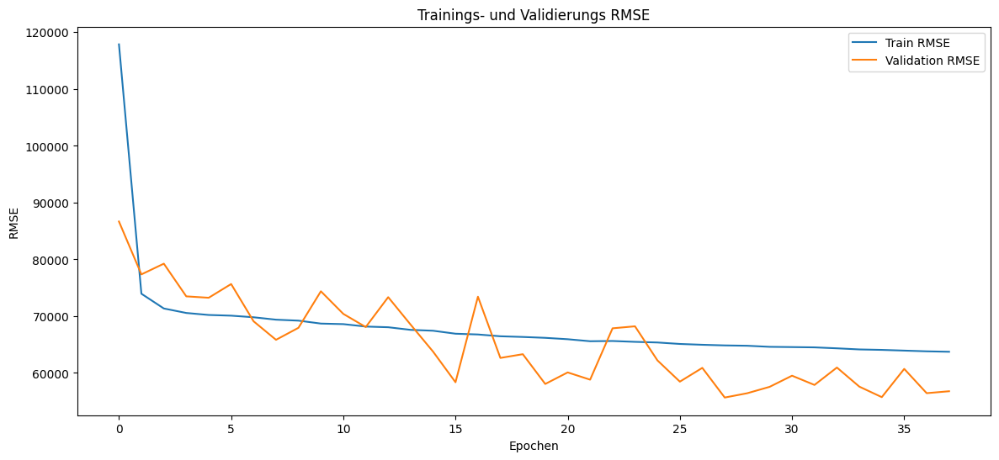

In [237]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

In diesem Netz zeigt sich nun, dass der RMSE auf den internen Validierungsdaten nicht mehr immer unter dem RMSE auf den Trainingsdaten liegt. In den ersten 10-15 Epochen oszilliert er um den Trainings-RMSE. Dieser sinkt. Zunächst sehr stielt und dann langsam. 

Durch early_stopping endet das Modell-Fitting nach ca. 45 Epochen. 

Die Hidden Layer mit dem L2-Regularisierungsparameter und der Anzahl der Neuronen sind analog zum Modell aus B2-b). 

In [238]:
combined_model_B3.save(os.path.join(models_path, f'NN_B3_Embedding_{gpu_name}.h5'))

Durch die Embeddings und die 3 Input Layer hat sich die Modellarchitektur verändert. Dies veranschaulicht auch der nachfolgende Plot. 

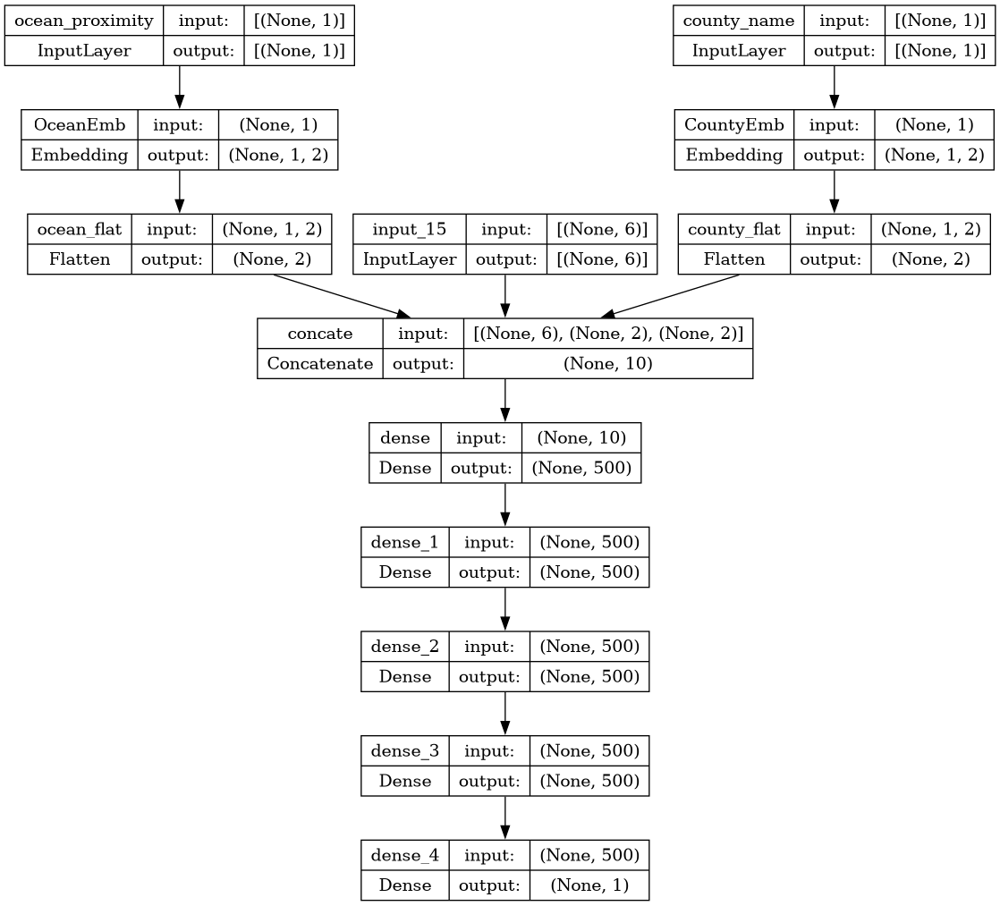

In [239]:
# Visualisierung des Modells
plot_model(combined_model_B3, to_file=f'model_Embedding_{gpu_name}.png', show_shapes=True, show_layer_names=True)

##### b) Der RMSE der Validierungsdaten des Netzes mit Embeddings ist samt Fitting-Laufzeit zu ermitteln und dem Modellvergleich hinzuzufügen. Das Neuronale Netz mit Embeddings ist mit dem Neuronalen Netz aus Aufgabe B-2 b) zu vergleichen und zu bewerten.

In [240]:
# das ausgewählte Modell kann mittels load_model geladen werden
combined_model = load_model(f'./models/NN_B3_Embedding_{gpu_name}.h5')
features = ['latitude', 'longitude', 'housing_median_age', 'population','median_income', 'rooms_per_house']

In [241]:
# Modell trainieren und Zeit messen
combined_model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
start_time = time.time()
history = combined_model.fit([x_train[features], x_train.ocean_proximityX, x_train.county_nameX], y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

In [242]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = combined_model.evaluate([x_val[features], x_val.ocean_proximityX, x_val.county_nameX], y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 64889.91796875
Trainingslaufzeit: 27.819402933120728 Sekunden


In [243]:
# Hinzufügen der Modelllaufzeit und des RMSE zum dictionary
model_name.append(f'NN_B3_Embedding_{gpu_name}')
model_rmse.append(rmse_external_validation)
model_laufzeit.append(training_time)

In [244]:
desired_models = [f'NN_B2_{gpu_name}', f'NN_B3_Embedding_{gpu_name}']
filtered_data = {key: [value for idx, value in enumerate(dict[key]) if dict['Model name'][idx] in desired_models] for key in dict}

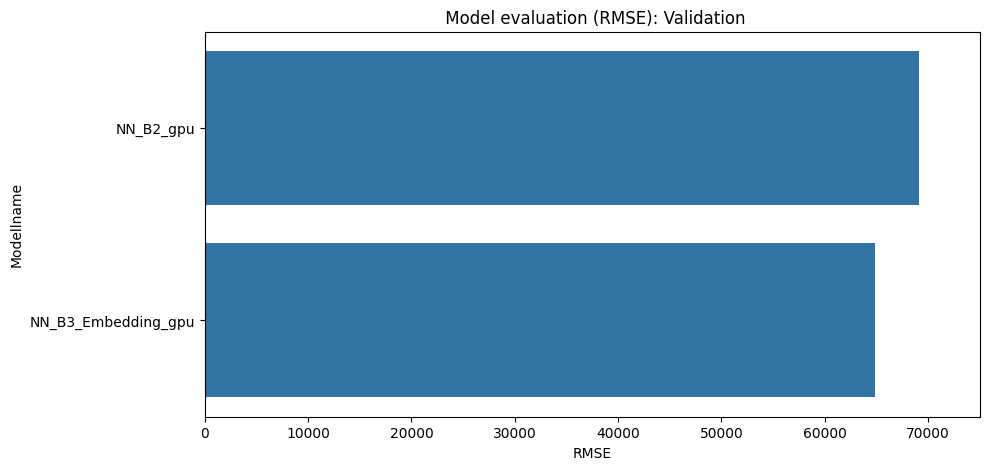

In [245]:
plot_rmse(filtered_data,0,75000, "Validation")

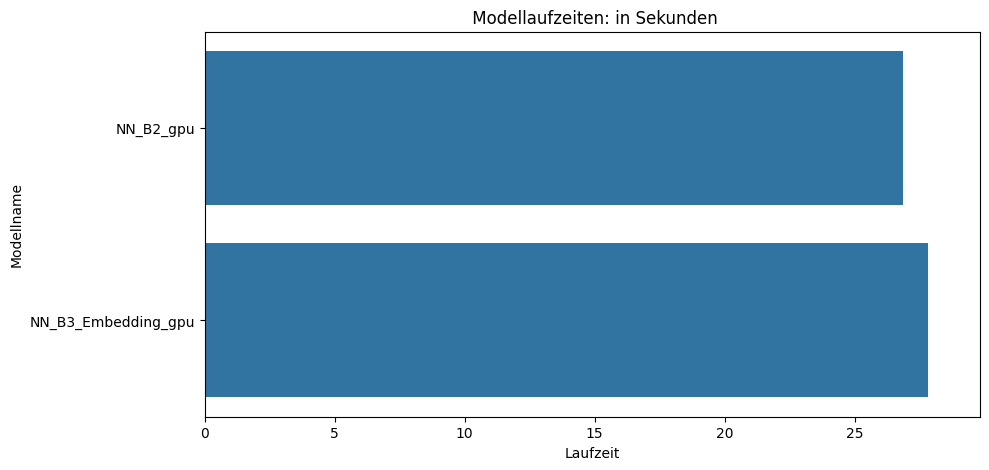

In [246]:
plot_laufzeit(filtered_data,0,max(filtered_data['Laufzeit'])+2,"in Sekunden")

Die model_summary zeigt für das neue Modell mit Embeddings nur eine Anzahl an Gesamtparametern von 757.627 im Vergleich zu den 786.001 Parametern beim sequentiellen Modell basierend auf One-Hot-kodierten Merkmalen aus 2b). Der Unterschied liegt in der veränderten Anzahl der Input-Parameter. Es sind nun statt der One-Hot-kodierten Variablen nur 2 kategoriale Variablen im Modell, somit ist die Anzahl der Gewichte im Input Layer, die mit der nächsten Schicht multipliziert wird, um 57 geringer ($57 \times 500 = 28.500$).

Es kommen 10 + 116 neue Parameter durch die Embeddings hinzu. Deswegen ist die Gesamtzahl an Parametern um 28.374 geringer.

Das resultiert in einer schnelleren Laufzeit (siehe zweite Grafik) und weniger Speicherbedarf.

Die Grafiken zeigen, dass das Modell mit Embeddings zudem einen geringeren RMSE auf den Validierungsdaten aufweist. Das Modell ist aus dieser Hinsicht und aufgrund der schnelleren Laufzeit dem Modell aus 2b) vorzuziehen.

##### c) Die Embeddings der kategoriellen Merkmale sind aus dem Modell zu extrahieren und grafisch darzustellen.

<u>Lösungsansatz:</u>

In [247]:
model = load_model(os.path.join(models_path, f'NN_B3_Embedding_{gpu_name}.h5'))

In [248]:
# Modell kompilieren 
model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])

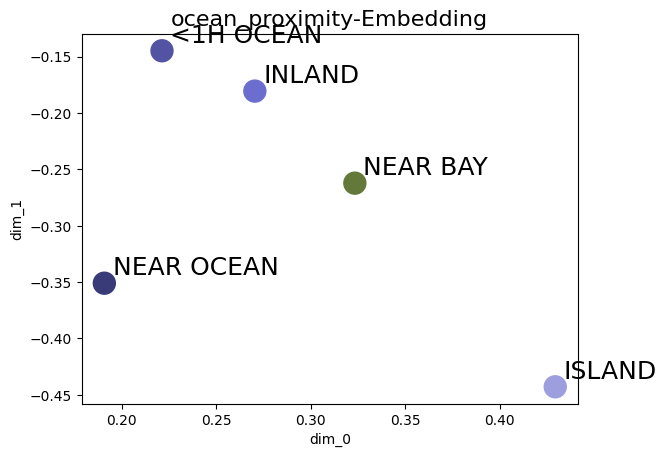

In [249]:
# get weights for ocean_proximity:
emb_B = model.layers[2] 
emb_B = pd.DataFrame(emb_B.get_weights()[0], columns=["dim_0", "dim_1"])
emb_B["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_B = emb_B.set_index("ocean_proximity")

# plot embedding
ax = emb_B.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_B)], s=250)

def annotate(row, ax=ax):
    ax.annotate(row.name, row.values[:2],
                xytext=(6,6),
                textcoords="offset points",
                size=18,
               )
emb_B.apply(annotate, axis="columns")
plt.title("ocean_proximity-Embedding", fontdict={"fontsize": 16})
plt.show()
ax.figure.savefig(f"./models/Embbedding_ocean_proximity_{gpu_name}.svg")

Die Embedding-Grafik zeigt die Verteilung der Embedding-Werte für jedes kategoriale Merkmal in einem zweidimensionalen Raum. Man erhält einen Einblick in die Verteilung und Struktur der Embedding-Werte für Ihre kategorialen Merkmale. Die Grafik zeigt die Punkte nach abgeschlossenem Training. 

Nach dem Training sieht man, dass ISLAND in der rechten unteren Ecke ist während aller anderen Punkte noch relativ nah beieinander bleiben. Embeddings bilden die Zusammenhänge der Level im trainierten Netz ab. 
Ebenso ist ersichtlich, dass INLAND und NEAR_BAY dicht beieinander leigen und NEAR_OCEAN im Vergleich weiter entfernt liegt. 

In [250]:
county_info = x_train.groupby("county_nameX").county_name.last().to_dict()

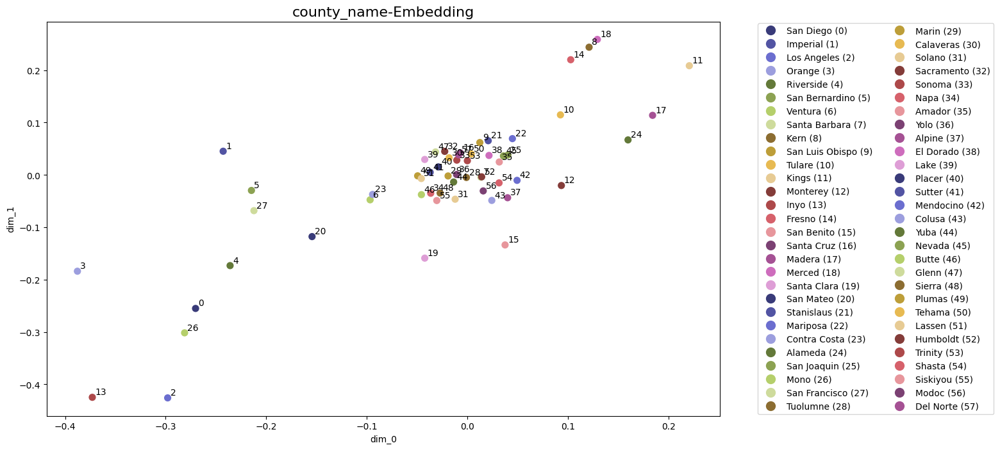

In [251]:
# get weights for county_name:
emb_C = model.layers[3] 
emb_C = pd.DataFrame(emb_C.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C = emb_C.set_index("county_name")
emb_C = emb_C.sort_index()


fig, ax = plt.subplots(figsize=(20, 8))
emb_C.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C)], s=50, ax=ax)

def annotate(row, ax=ax):
    ax.annotate(row.name, row.values[:2],
                xytext=(3,3),
                textcoords="offset points",
                size=10,
               )
emb_C.apply(annotate, axis="columns")

patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=(3*plt.get_cmap("tab20b").colors)[i])[0] for i, key in enumerate(emb_C.index)]
ax.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_C.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
plt.subplots_adjust(right=0.65)
plt.title("county_name-Embedding", fontdict={"fontsize": 16})
plt.show()
ax.figure.savefig(f"./models/Embbedding_county_name_{gpu_name}.svg")

Für das county name Embedding sehen wir einen großen Pulk an counties in der Mitte (im Zentrum) und unterscheiden sich folglich kaum. Alle counties zusammen bilden ein "Band" vom linken oberen hin zum rechten unteren Rand und sind dort verteilt. Die counties 2 (L.A.) und 13 (Inyo) in der rechten oberen Ecke sind etwas vom Rest distanziert. 
Schaut man die Orte auf der Karte nach so liegen die Punkte links unten eher im Landesinneren und ie links oben eher an der Küste. 

Die Aufteilung zeigt auch, wie das neuronale Netz in diesem Merkmal clustert. 

##### d) Das in Teilaufgabe a) aufgebaute Netz mit Embeddings soll als „clone“ nochmals, nun aber mit einem anderen Modellnamen und anderen (random) Startgewichten erzeugt, neu gefitted und die Konvergenz überprüft und ggf. hergestellt werden. Die entsprechenden Embedding-Gewichte sind zu extrahieren und in einer verbundenen Grafik den Embeddings aus Teilaufgabe c) gegenüberzustellen (z. B. 2x2 Grafiken über-/nebeneinander) und zu interpretieren.

<u>Lösungsansatz:</u>

Das Klonen eines Modells mittels *clone_model* ist vergleichbar mit dem Aufruf eines Modells mit neuen Eingaben, mit dem Unterschied, dass neue Schichten (und damit neue Gewichte) erstellt werden, anstatt die Gewichte der vorhandenen Schichten zu teilen. Quelle: https://www.tensorflow.org/api_docs/python/tf/keras/models/clone_model, Stand 28.4.24

Folglich wird diese Funktion genutzt. Die Gewichte können mittels get_weight und set_weight und der Standard-Normalverteilung mittels Zufallsgenerator gesetzt werden. 

In [252]:
# Originalmodell
original_model = load_model(f'./models/NN_B3_Embedding_{gpu_name}.h5')
original_model.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
original_model.build(input_shape=(None, 8))  # Anzahl der Eingabemerkmale
original_weights = original_model.get_weights()

# Klone Modell
cloned_model_b3 = clone_model(original_model)
cloned_model_b3.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
cloned_model_b3._name = f'cloned_NN_B3_Embedding_{gpu_name}' 
cloned_model_b3.build(input_shape=(None, 8))
cloned_model_b3.set_weights([np.random.standard_normal(w.shape) for w in cloned_model_b3.get_weights()])
cloned_weights = cloned_model_b3.get_weights()

# Vergleiche Gewichte -> für jeden Layer
for original, cloned in zip(original_weights, cloned_weights):
    if not tf.reduce_all(tf.equal(original, cloned)).numpy():
        print("Die Gewichte sind nicht identisch.")
    else:
        print("Die Gewichte sind identisch.")

Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.
Die Gewichte sind nicht identisch.


In [253]:
features = ['latitude', 'longitude', 'housing_median_age', 'population','median_income', 'rooms_per_house']

In [254]:
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

In [255]:
# Modell trainieren und Zeit messen
cloned_model_b3.summary()
start_time = time.time()
# Fitte das geklonte Modell und überprüfe die Konvergenz
cloned_history = cloned_model_b3.fit([x_train[features], x_train.ocean_proximityX, x_train.county_nameX], y_train, epochs=2001, validation_split=0.2, verbose=0, callbacks=[early_stopping])
training_time = time.time() - start_time

Model: "cloned_NN_B3_Embedding_gpu"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 ocean_proximity (InputLaye  [(None, 1)]                  0         []                            
 r)                                                                                               
                                                                                                  
 county_name (InputLayer)    [(None, 1)]                  0         []                            
                                                                                                  
 OceanEmb (Embedding)        (None, 1, 2)                 10        ['ocean_proximity[0][0]']     
                                                                                                  
 CountyEmb (Embedding)       (None, 1, 2)                 116       ['cou

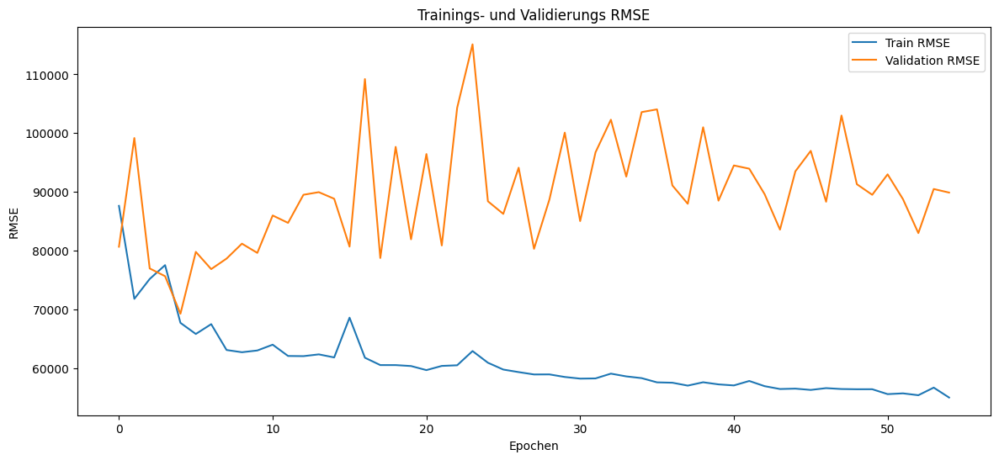

In [256]:
# Lernkurve plotten
plt.figure(figsize=(14, 6))
plt.plot(cloned_history.history['root_mean_squared_error'], label='Train RMSE')
plt.plot(cloned_history.history['val_root_mean_squared_error'], label='Validation RMSE')
plt.title('Trainings- und Validierungs RMSE')
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.legend()
plt.show()

Die summary zeigt, dass der Modellname erfolgreich geändert wurde. Zudem wurden die Gewichte auf andere random Werte gesetzt durch die Nutzung von clone_model. Die Grafik zeigt, dass das Modell konvergiert, wobei es zunächstz noch sehr zackelt und auf den Validierungsdaten allgemein sehr zackelt. Die Startgewichte haben folglich einen großen Einfluss auf die Konvergenz des Modells. Zudem ist die Laufzeit bedeutend höher. 

In [257]:
# Speichern des geklonte Modells
cloned_model_b3.save(os.path.join(models_path, f'cloned_NN_B3_Embedding_{gpu_name}.h5'))

Grafische Darstellung der Embeddings: 

In [258]:
# get weights for ocean_proximity:
emb_B = original_model.layers[2] 
emb_B = pd.DataFrame(emb_B.get_weights()[0], columns=["dim_0", "dim_1"])
emb_B["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_B = emb_B.set_index("ocean_proximity")

# get weights for ocean_proximity:
emb_O = cloned_model_b3.layers[2] 
emb_O = pd.DataFrame(emb_O.get_weights()[0], columns=["dim_0", "dim_1"])
emb_O["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_O = emb_O.set_index("ocean_proximity")

# get weights for county_name:
emb_C = original_model.layers[3] 
emb_C = pd.DataFrame(emb_C.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C = emb_C.set_index("county_name")
emb_C = emb_C.sort_index()

# get weights for county_name:
emb_N = cloned_model_b3.layers[3] 
emb_N = pd.DataFrame(emb_N.get_weights()[0], columns=["dim_0", "dim_1"])
emb_N["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_N = emb_N.set_index("county_name")
emb_N = emb_N.sort_index()

In [259]:
county_info = x_train.groupby("county_nameX").county_name.last().to_dict()

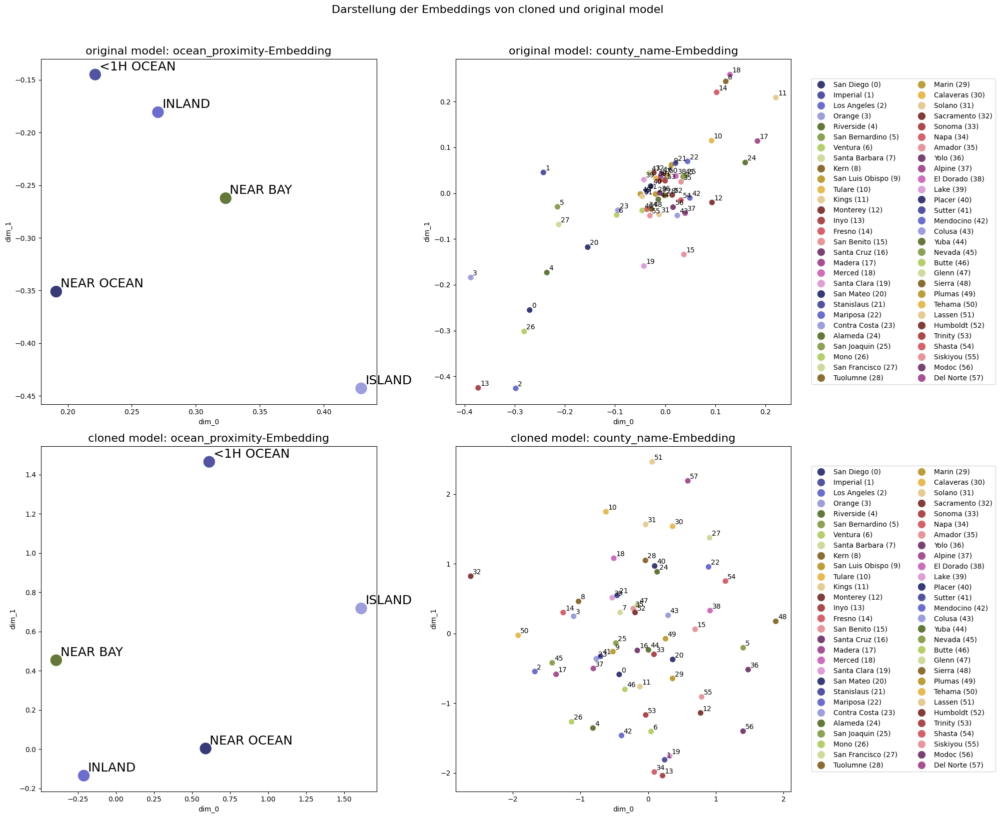

In [260]:
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
ax1 = axs[0, 0]
ax2 = axs[0, 1]
ax3 = axs[1, 0]
ax4 = axs[1, 1]
emb_B.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_B)], s=250, ax=ax1)
emb_C.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C)], s=50, ax=ax2)
emb_O.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_O)], s=250, ax=ax3)
emb_N.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_N)], s=50, ax=ax4)

def annotate(row, ax=ax, xytext = (6,6), size= 18):
    ax.annotate(row.name, row.values[:2],
                xytext=xytext,
                textcoords="offset points",
                size=size,
               )
    
emb_B.apply(lambda row: annotate(row,ax=ax1), axis="columns")
emb_C.apply(lambda row: annotate(row, ax=ax2, xytext = (3,3), size= 10), axis="columns")
emb_O.apply(lambda row: annotate(row,ax=ax3), axis="columns")
emb_N.apply(lambda row: annotate(row, ax=ax4, xytext = (3,3), size= 10), axis="columns")


patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=(3*plt.get_cmap("tab20b").colors)[i])[0] for i, key in enumerate(emb_C.index)]
ax2.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_C.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
ax4.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_N.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
plt.subplots_adjust(right=0.65)
ax1.set_title("original model: ocean_proximity-Embedding", fontdict={"fontsize": 16})
ax2.set_title("original model: county_name-Embedding", fontdict={"fontsize": 16})
ax3.set_title("cloned model: ocean_proximity-Embedding", fontdict={"fontsize": 16})
ax4.set_title("cloned model: county_name-Embedding", fontdict={"fontsize": 16})

fig.suptitle('Darstellung der Embeddings von cloned und original model', fontsize=16, y=1.02)
plt.tight_layout() 
plt.show()

Obwohl das Modell bis auf die Startgewichte gleich gelassen wurde, zeigt sich ein stark verändertes Ergebnis in den Embeddings. 
Im geklonten Modell ist nun nicht nur "ISLAND" weit von den anderen Leveln entfernt, auch "<1H OCEAN". "NEAR BAY" und "NEAR OCEAN" weisen weiterhin einen ähnlichen Abstand zueinander auf. "INLAND" ist nun näher an das Level "NEAR OCEAN" gerutscht. 

Beim Merkmal *county_name* ist in der Embedding Darstellung nun keine so deutliche Linie mehr erkennbar. Die Punkte sind vielmehr im Raum verteilt. 
Die Punkt 2 und 13, die im ursprünglichen Modell noch oben links zu sehen, sind nun bei der Darstellung nach links unten/ in die Mitte gerutscht. Die Punkte liegen nun alle auseinander und nur noch wenige im Zentrum. Folglich differenziert das geklonte neuronale Netz stärker zwischen den counties.  

Zusammenfasend sieht man also, dass nur durch die Veränderung der Startgewichte und early_stopping das Modell ein gänzlich anderes mit anderen Relationen in den 2 kategorialen Merkmalen ist. 

In [261]:
del original_model, cloned_model_b3

##### e) Der RMSE der Validierungsdaten des Netzes aus Teilaufgabe d) ist samt Fitting-Laufzeit zu ermitteln und dem Modellvergleich hinzuzufügen. Die entsprechen-den Ergebnisse der beiden Neuronalen Netz mit Embeddings sind miteinander und mit dem Neuronalen Netz aus Aufgabe B-2 b) sowie dem einfachen linearen Modell aus Aufgabe A-7 a) zu vergleichen und zu bewerten.

<u>Lösungsansatz:</u>

In [262]:
# das ausgewählte Modell kann mittels load_model geladen werden
cloned_model_b3 = load_model(os.path.join(models_path, f'cloned_NN_B3_Embedding_{gpu_name}.h5'))
features = ['latitude', 'longitude', 'housing_median_age', 'population','median_income', 'rooms_per_house']

In [263]:
# Modell trainieren und Zeit messen
cloned_model_b3.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
start_time = time.time()
history = cloned_model_b3.fit([x_train[features], x_train.ocean_proximityX, x_train.county_nameX], y_train, epochs=2001, validation_split=0.2, verbose=0,callbacks=[early_stopping])
training_time = time.time() - start_time

In [264]:
# Modellvalidierung mit externen Validierungsdaten
rmse_external_validation = cloned_model_b3.evaluate([x_val[features], x_val.ocean_proximityX, x_val.county_nameX], y_val, verbose=0)[1]

# Ergebnisse anzeigen
print(f"Externes Validierungs-RMSE: {rmse_external_validation}")
print(f"Trainingslaufzeit: {training_time} Sekunden")

Externes Validierungs-RMSE: 65734.6328125
Trainingslaufzeit: 199.5970721244812 Sekunden


In [265]:
# Hinzufügen der Modelllaufzeit und des RMSE zum dictionary
model_name.append(f'NN_B3_Embedding_cloned_{gpu_name}')
model_rmse.append(rmse_external_validation)
model_laufzeit.append(training_time)

Die untenstehenden Grafiken, zeigen, dass die Ergebnisse der neuronalen Netze im Vergleich zum Modell aus 7a) hinsichtlich Laufzeit und RMSE verschieden sind. 

In [266]:
desired_models = ['Linear_Regression', f'NN_B2_{gpu_name}', f'NN_B3_Embedding_{gpu_name}', f'NN_B3_Embedding_cloned_{gpu_name}']
filtered_data = {key: [value for idx, value in enumerate(dict[key]) if dict['Model name'][idx] in desired_models] for key in dict}

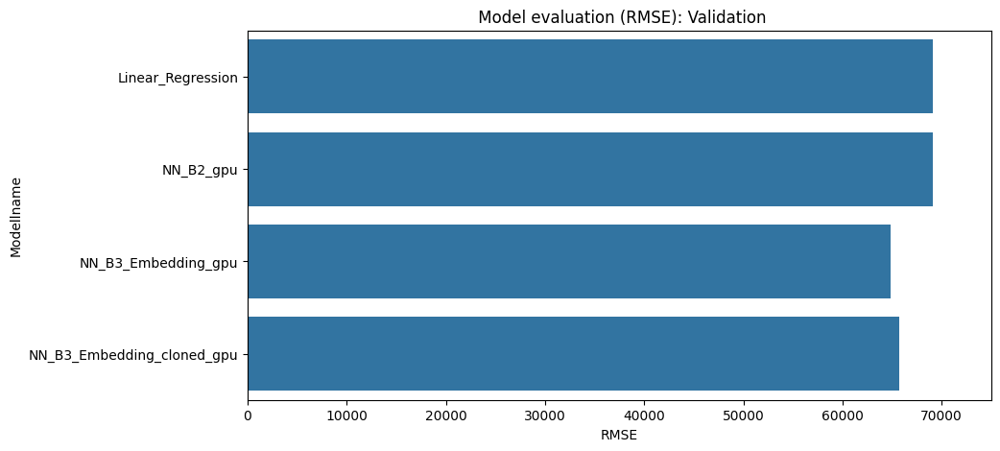

In [267]:
plot_rmse(filtered_data,0,75000, "Validation")

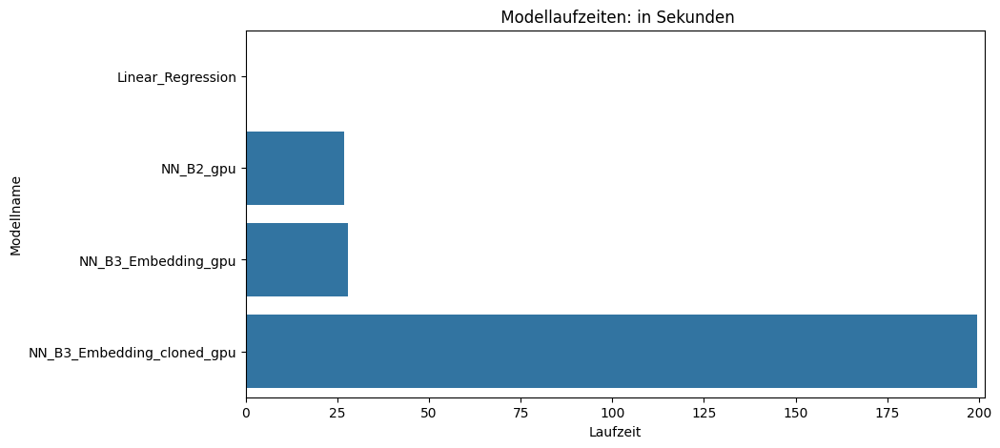

In [268]:
plot_laufzeit(filtered_data,0,max(filtered_data['Laufzeit'])+2,"in Sekunden")

Die neuronalen Netze und das lineare Modell zeigen alle einen sehr ähnlichen RMSE Wert. Dies liegt auch an der Konstruktion der Netze. Hier fand keine Hyperparameter Optimierung statt sondern es wurde solange optimiert, bis der RMSE Wert besser als der des linearen Modell ist. Im Fall des trial&error entstand ein Modell, dass nur einen leicht besseren RMSE Wert auf den Validierungsdaten hat als das lineare Modell. Durch weiteres Optimieren der Neuronenanzahl oder Anzahl der Schichten kann dieser Wert bestimmt noch verbessert werden. 

Die Modelle aus B3 entstanden aus dem Modell aus B2 und die Hidden Layer wurden nicht verändert. Deswegen haben auch diese einen ähnlichen RMSE Wert. 

Bezüglich der Laufzeit zeigt sich, dass die neuronalen Netze bedeutend mehr Zeit zum Fitting brauchen als die Lineare Regression. Ebenso muss ein bedeutend höherer Aufwand erbracht werden, um ein Netz mit ähnlichem RMSE zu finden als bei der linearen Regression. 

### Aufgabe B-4: Hyperparameter-Tuning von lightGBM und XGBoost [Lernziele 3.2, 3.3/3.4, 4.1 & 6; 10 Punkte] <a class="anchor" id="unterabschnitt-2-4"></a>
In den folgenden Modellen ist jeweils die Laufzeit der Durchführung des Codes zu messen. 

##### a) Es ist ein lightGBM-Modell inkl. Hypertuning mit mehrdimensionalem Grid Search und vierfacher Kreuzvalidierung zu erstellen. Dabei sind die Parameter learning_rate und num_leaves zu optimieren, für den Parameter n_estimators ist der entsprechende Standardparameter des CatBoost Modells zu verwenden. Die mit dem Grid Search ermittelten besten fünf Parametersätze sind anzuzeigen und zu diskutieren. Im Anschluss ist ein Modell mit den besten Parametern auf allen Folds zu fitten, der Fehler auf den Validierungsdaten zu berechnen und die Ergebnisse dem Modellvergleich hinzuzufügen.

<u>Lösungsansatz:</u>

Der Parameter n_estimators beschreibt die Anzahl der Boosting Runden, also die Anzahl an Iterationen. Das entspricht im CatBoost Modell dem Parameter iterations. Dieser kann mittels *get_params* ausgelesen werden. 

Quelle: [Parameters — LightGBM 4.3.0.99 documentation](https://lightgbm.readthedocs.io/en/latest/Parameters.html), Stand 29.4.24

LightGBM basiert auf dem Gradient-Boosting-Verfahren, einer leistungsstarken Technik des Ensemble-Lernens. Es erstellt ein starkes Vorhersagemodell, indem es die Vorhersagen mehrerer schwacher Modelle kombiniert.
LightGBM verfügt über eine integrierte Unterstützung für die Verarbeitung kategorischer Merkmale. Es kann kategoriale Daten mit hoher Kardinalität effizient verarbeiten, ohne dass eine umfangreiche Vorverarbeitung erforderlich ist. Sie müssen mit dem type "category" gespeichert sein. 

Quelle: [Handling Categorical Features using LightGBM - GeeksforGeeks](https://www.geeksforgeeks.org/handling-categorical-features-using-lightgbm/), Stand 29.4.24

Zunächst teilen wir hier den nicht skalierten Datensatz wieder in Trainings- und Validierungsdaten ein. Wir nutzen diesen Datensatz, da nichts weiteres in der Aufgabenstellung spezifiziert wurde. Unten wurden die Modelle allerdings auch auf den skalierten Daten trainiert.

In [269]:
x_train = df[df['sample']=='A'].drop(['median_house_value','sample'], axis=1)
y_train = df[df['sample']=='A']['median_house_value']
x_val = df[df['sample']=='B'].drop(['median_house_value','sample'], axis=1)
y_val = df[df['sample']=='B']['median_house_value']

In [270]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   latitude            20640 non-null  float64 
 1   longitude           20640 non-null  float64 
 2   housing_median_age  20640 non-null  int64   
 3   population          20640 non-null  int64   
 4   median_income       20640 non-null  float64 
 5   median_house_value  20640 non-null  int64   
 6   ocean_proximity     20640 non-null  category
 7   county_name         20640 non-null  category
 8   sample              20640 non-null  category
 9   rooms_per_house     20640 non-null  float64 
dtypes: category(3), float64(4), int64(3)
memory usage: 1.2 MB


In [271]:
# Instanz des CatBoostRegressor & Abfrage des Standardwerts
print(CatBoostRegressor(task_type = device_CatBoost)._init_params.get('iterations', 'Nicht festgelegt')) # Prüfe, ob es einen Defualt Parameter bei Modelldefinition gibt

Nicht festgelegt


Im CatBoostRegressor ist kein default Wert für die Anzahl an Iterationen festgelegt.
Somit wird aus obigen Modellen der Wert ausgelesen (da er hier nicht spezifiziert wurde).
Aus der Ausgabe der Hyperparameter wissen wir bereits, dass der Wert 1000 ist. 

In [272]:
n_est = catboost_model_B1.get_all_params()['iterations'] # Anzahl der Iterationen   
print("Der CatBoost Standardparameter für n_estimators ist: ",n_est)

Der CatBoost Standardparameter für n_estimators ist:  1000


Das lightGBM-Modell wurde in mehreren Schritten erstellt. Zunächst wird der Standardparameter für *iterations* aus dem CatBoost Modell ausgelesen und *n_estimators* übergeben. 
Danach wird ein Gitter zur Hyperparameter-Optimierung der Parameter *learning_rate* und *num_leaves* definitert. Im Gitter werden jeweils 5 Werte für *num_leaves* und 5 Werte für *learnings_rate* übergeben. Danach wird eine vierfache Kreuzvalidierung durchgeführt. 

1. *learning_rate*: Dieser Parameter definiert die Lernrate des Gradient-Boosting-Modells. Die Lernrate steuert, wie stark die Modellgewichte bei jedem Schritt des Boosting-Prozesses aktualisiert werden. Eine niedrigere Lernrate führt zu einer langsameren Konvergenz des Modells, aber kann zu einer genaueren Anpassung führen. Eine höhere Lernrate hingegen beschleunigt die Konvergenz, kann aber zu einer weniger präzisen Anpassung führen. 
2. *num_leaves*: Dieser Parameter definiert die maximale Anzahl von Blättern in einem Baum. Ein höherer Wert ermöglicht es dem Modell, komplexere Muster zu erfassen, kann aber auch zu Overfitting führen. Ein niedrigerer Wert reduziert die Modellkomplexität und kann zu besserer Generalisierung führen, aber möglicherweise auch zu Unteranpassung. 

In [273]:
#Grid Search für Hyperparameter-Optimierung
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1, 0.25, 0.5],
    'num_leaves': [10, 20, 30, 40, 50]
}

lgb_model = lgb.LGBMRegressor(objective='regression', metric='rmse',n_estimators=n_est, verbose=-1, device=device_LGB)  #objective='regression' ist bereits Default Wert, verbose=-1 unterdrückt Ausgabe
kf = KFold(n_splits=4, shuffle=True, random_state=42)

start_time = time.time()
grid_search = GridSearchCV(lgb_model, param_grid, cv=kf, scoring='neg_mean_squared_error', verbose=0)
grid_search.fit(x_train, y_train)
end_time = time.time()
fitting_time = end_time - start_time
print(f"Laufzeit von RandomSearch und CV: {fitting_time:.4f} Sekunden")

# Anzeige und Diskussion der besten Parametersätze
results = grid_search.cv_results_
top_params = zip(results['params'], -results['mean_test_score']) # Scores sind negativ
top_params = sorted(top_params, key=lambda x: x[1], reverse=True)[:5]

print("Die besten fünf Parametersätze sind:")
for params, score in top_params:
    print(params, "mit einem Score von", score)

1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.
1 warning generated.


Laufzeit von RandomSearch und CV: 247.7823 Sekunden
Die besten fünf Parametersätze sind:
{'learning_rate': 0.5, 'num_leaves': 50} mit einem Score von 2769813228.5680485
{'learning_rate': 0.5, 'num_leaves': 30} mit einem Score von 2761650008.5790424
{'learning_rate': 0.5, 'num_leaves': 40} mit einem Score von 2748750130.2729774
{'learning_rate': 0.5, 'num_leaves': 20} mit einem Score von 2674863336.213114
{'learning_rate': 0.01, 'num_leaves': 10} mit einem Score von 2599677627.821622


Der erste Parametersatz hat eine hohe Lernrate und eine hohe maximale Anzahl an Blättern im Baum. Beide Parameter sind das Maximum aus dem vorgegeben Grid. Eventuell müssten die Parameter noch weiter erhöht werden, um bessere Ergebnisse zu erzielen.
Satz zwei bis vier haben die gleiche Lernrate, aber andere num_leaves Werte, zwischen 20 und 40. 
Die ersten vier Sätze nutzen eine Lernratevon 0,5 und die höchsten vier Kombinationen von num_leaves. Der fünfte Satz hingegen nutzt die geringste Lernrate und die geringste Anzahl an num_leaves. 
Insgesamt zeigen die besten Parametersätze eine Vielfalt von Hyperparameterkombinationen, die zu unterschiedlichen Modellleistungen führen. 

In [274]:
best_lgb_model = lgb.LGBMRegressor(objective='regression', metric='rmse',n_estimators=1000, learning_rate=grid_search.best_params_['learning_rate'], num_leaves=grid_search.best_params_['num_leaves'], device=device_LGB)
start_time = time.time()
best_lgb_model.fit(x_train, y_train)
end_time = time.time()
training_time = end_time - start_time

[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1391
[LightGBM] [Info] Number of data points in the train set: 14421, number of used features: 8
[LightGBM] [Info] Using GPU Device: Tesla P100-PCIE-16GB, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 8 dense feature groups (0.11 MB) transferred to GPU in 0.000621 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 206956.332640


In [275]:
y_pred = best_lgb_model.predict(x_val)
rmse_lgb = berechne_rmse(y_val, y_pred)
print(f"LightGBM  RMSE: {rmse_lgb:.2f}")
print(f"Laufzeit: {training_time:.4f} Sekunden")

LightGBM  RMSE: 47233.78
Laufzeit: 2.3400 Sekunden


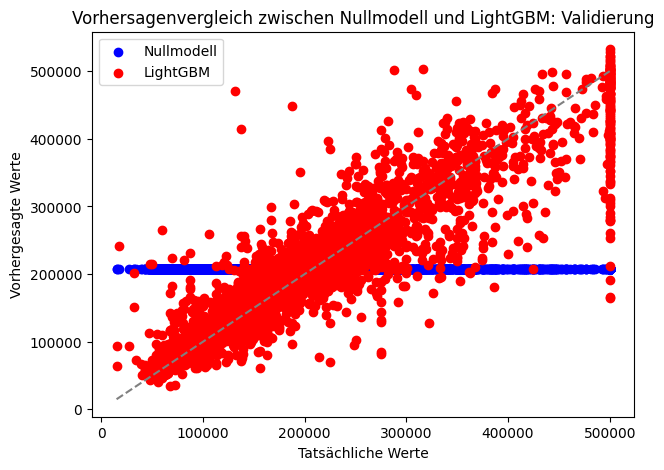

In [276]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)
vergleich_modell(y_pred, y_pred_null, y_val, 'LightGBM: Validierung', 'LightGBM')

In [277]:
model_name.append(f'LightGBM_{gpu_name}')
model_rmse.append(rmse_lgb)
model_laufzeit.append(training_time)

Die Feature Importance kann nach Training des Modells auf verschiedene Weisen ausgegeben werden. LightGBM bietet 2 Arten von Feature Importance "gain" und "split". Die "split" Importance gibt an, wie oft ein Feature als Entscheidungskriterium in den Bäumen verwendet wurde. Die "gain Importance" gibt den Gewinn, den ein Feature erbracht hat, an. Typischerweise wird split genutzt. Unten werden beide Varianten einmal geplottet. 

Quelle:  https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.plot_importance.html, Stand 29.4.24

         Feature Name  Importance
1           longitude        5291
0            latitude        5269
4       median_income        4769
3          population        4418
7     rooms_per_house        4293
2  housing_median_age        3212
6         county_name        1545
5     ocean_proximity         203


<Figure size 1000x600 with 0 Axes>

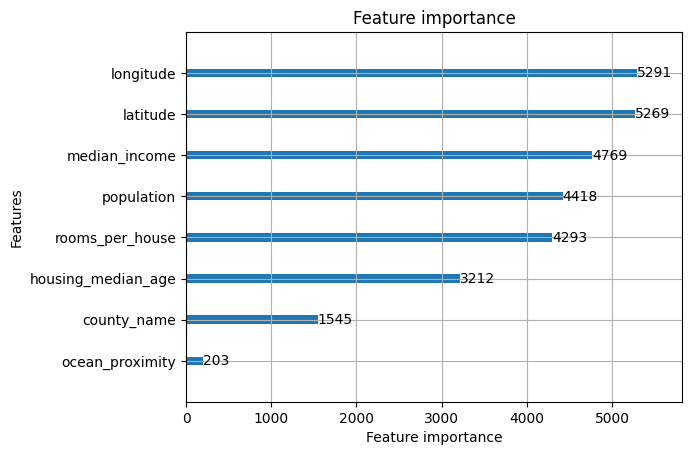

In [278]:
# Feature-Importance ausgeben
feature_importances = best_lgb_model.feature_importances_
feature_names = best_lgb_model.booster_.feature_name()

importance_df = pd.DataFrame({
    'Feature Name': feature_names,
    'Importance': feature_importances
})

# Sortieren nach Wichtigkeit
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print(importance_df)

# Visualisierung der Feature-Importance
plt.figure(figsize=(10, 6))
lgb.plot_importance(best_lgb_model, importance_type='split', max_num_features=None)
plt.show()

<Figure size 1000x600 with 0 Axes>

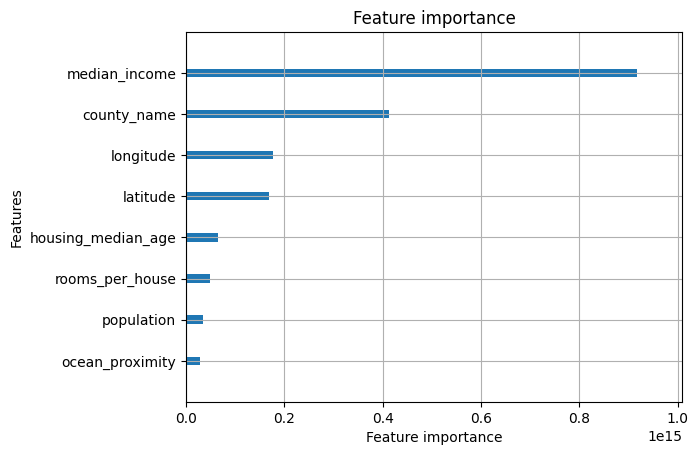

In [279]:
# Visualisierung der Feature-Importance
plt.figure(figsize=(10, 6))
ax = lgb.plot_importance(best_lgb_model, importance_type='gain', max_num_features=None)

for text in ax.texts:
    text.set_visible(False)
plt.show()

Als wichtigsten Merkmal bezüglich des Splits werden *longitude* und *latitude* identifiziert. Ebenso weisen *median_income* und *population* hohe Werte auf. Die geringste Wichtigkeit haben *county_name* und *ocean_proximity*.

Betrachtet man nun die Feature Importance basierend auf dem gain, so ergibt sich ein anderes Bild. Hier ist das wichtigste Merkmal der *median_income* und auf Platz 2 folgt bereits *county_name*. Das heißt, dass das Merkmal zwar selten als Splitkriterium genutzt wird, aber für eine starke Verbesserung sorgt. Folglich wird es eher in den oberen Blattknoten verwendet. Am wenigsten gain Gewinn liefert *ocean_proximity*. 

In [280]:
best_lgb_model.booster_.save_model(os.path.join(models_path, f'lightgbm_model_{gpu_name}.json')) #Speichere Modell

In [281]:
del best_lgb_model, lgb_model, grid_search
gc.collect()

86595

Man kann kategorische Variablen als solche kennzeichnen, indem die entsprechenden Spalten in den Daten als kategorisch deklariert werden. LightGBM kann dann die kategorischen Variablen intern optimieren.

Nachfolgend wurde nochmal das lightgbm Paket mit den skalierten und OneHot kodierten variablen getestet. Hierdurch erhöht sich die Anzahl der Spalten im Datensatz massiv. 

In [282]:
x_train_trans = df_trans[df_trans['sample']=='A'].drop(['median_house_value','sample'], axis=1)
y_train_trans = df_trans[df_trans['sample']=='A']['median_house_value']
x_val_trans = df_trans[df_trans['sample']=='B'].drop(['median_house_value','sample'], axis=1)
y_val_trans = df_trans[df_trans['sample']=='B']['median_house_value']

In [283]:
lgb_model_oh = lgb.LGBMRegressor(objective='regression', metric='rmse',n_estimators=n_est, verbose=-1, device=device_LGB)  #objective='regression' ist bereits Default Wert, verbose=-1 unterdrückt Ausgabe
kf = KFold(n_splits=4, shuffle=True, random_state=42)

start_time = time.time()
grid_search = GridSearchCV(lgb_model_oh, param_grid, cv=kf, scoring='neg_mean_squared_error', verbose=0)
grid_search.fit(x_train_trans, y_train_trans)
end_time = time.time()
fitting_time = end_time - start_time
print(f"Laufzeit von RandomSearch und CV: {fitting_time:.4f} Sekunden")

# Anzeige und Diskussion der besten Parametersätze
results = grid_search.cv_results_
top_params = zip(results['params'], -results['mean_test_score']) # Scores sind negativ
top_params = sorted(top_params, key=lambda x: x[1], reverse=True)[:5]

print("Die besten fünf Parametersätze sind:")
for params, score in top_params:
    print(params, "mit einem Score von", score)

Laufzeit von RandomSearch und CV: 256.4469 Sekunden
Die besten fünf Parametersätze sind:
{'learning_rate': 0.5, 'num_leaves': 40} mit einem Score von 2794881030.6035285
{'learning_rate': 0.01, 'num_leaves': 10} mit einem Score von 2776307365.9174066
{'learning_rate': 0.5, 'num_leaves': 50} mit einem Score von 2770896217.7381783
{'learning_rate': 0.5, 'num_leaves': 30} mit einem Score von 2698260101.188483
{'learning_rate': 0.5, 'num_leaves': 20} mit einem Score von 2624528767.571801


Beim Lightgbm Modell mit OneHot Encoding und Skalierung sind die Ergebnisse ähnlich wie zuvor. Der einzige Unterschied ist, dass die 5 Parametersätze in einer anderen Reihenfolge vorkommen. Der erste Parametersatz ist der, mit der hächsten Lernrate, aber nur noch den zweithöchsten Anzahl an num_leaves. An Platz zwei folgt bereits Der Parametersatz mit der geringsten Lernrate und der geringsten Anzahl an num_leaves. 

In [284]:
best_lgb_model_oh = lgb.LGBMRegressor(objective='regression', metric='rmse',n_estimators=1000, learning_rate=grid_search.best_params_['learning_rate'], num_leaves=grid_search.best_params_['num_leaves'],device=device_LGB)
start_time = time.time()
best_lgb_model_oh.fit(x_train_trans, y_train_trans)
end_time = time.time()
training_time = end_time - start_time

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1427
[LightGBM] [Info] Number of data points in the train set: 14421, number of used features: 56
[LightGBM] [Info] Using GPU Device: Tesla P100-PCIE-16GB, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 8 dense feature groups (0.11 MB) transferred to GPU in 0.000670 secs. 0 sparse feature groups
[LightGBM] [Info] Start training from score 206956.332640


Es werden nachfolgend nur die ersten 20 Feature der Featur Importance ausgegeben, dies wird mittels des Parameters *max_num_features* eingestellt. 

<Figure size 1000x1200 with 0 Axes>

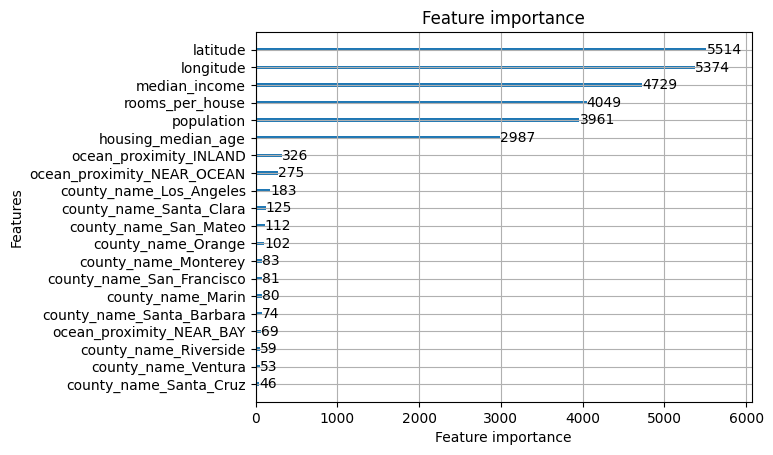

In [285]:
# Visualisierung der Feature-Importance
plt.figure(figsize=(10, 12))
lgb.plot_importance(best_lgb_model_oh, importance_type='split', max_num_features=20)
plt.show()

Die Feature importance wählt als wichtigste Merkmale die numerischen Variablen aus. Hier sind longitude und latitude am wichtigsten. 

In [286]:
y_pred = best_lgb_model_oh.predict(x_val_trans)
rmse_lgb = berechne_rmse(y_val_trans, y_pred)
print(f"lightgbm oneHot  RMSE: {rmse_lgb:.2f}")
print(f"Laufzeit: {training_time:.4f} Sekunden")

lightgbm oneHot  RMSE: 46919.81
Laufzeit: 2.4138 Sekunden


In [287]:
best_lgb_model_oh.booster_.save_model(os.path.join(models_path, f'lightgbm_model_OneHot_{gpu_name}.json')) #Speichere Modell

In [288]:
del best_lgb_model_oh, lgb_model_oh, grid_search
gc.collect()

7320

Man erkennt, dass die skalierten Variablen mit OneHot Encoding zu einem noch besseren RMSE auf den Validierungsdaten führen. Aus der Aufgabenstellung geht nicht genau hervor, welche Daten genutzt werden sollen. 

##### b) Analog ist ein XGBoost-Modell inkl. Hypertuning mit mehrdimensionalem Random Search und vierfacher Kreuzvalidierung zu erstellen. Dabei sind die Parameter depth, learning_rate, subsample und colsample_bytree zu optimieren. Dabei ist die gleiche Anzahl Iterationen wie bei CatBoost und lightGBM zu verwenden. Die mit dem Randomized Search ermittelten besten fünf Parameterkombinationen sind anzuzeigen und zu diskutieren. Im Anschluss ist ein Modell mit den besten Parametern auf allen Folds zu fitten, der Fehler auf den Validierungsdaten zu berechnen und die Ergebnisse dem Modellvergleich hinzuzufügen.

<u>Lösungsansatz:</u>

LightGBM verwendet ein sehr effizientes histogrammbasiertes Entscheidungsverfahren, das auch mit XGBoost aktiviert werden kann, mittels des Parameters "tree_method". Soll ein monotones Wachstum in einem Parameter gegeben sein, so kann dies mittels des Parameters "monotonic_constraint" bestimmt werden. In LightGBM heißt dieser Parameter "monotone_constraint". 

Zur Berücksichtigung der kategoriellen Variablen wird der Parameter "enable_categorical"=True gesetzt. 
Quelle: https://xgboost.readthedocs.io/en/stable/tutorials/categorical.html, Stand 29.4.24

Die Anzahl der Iterationen bei RandomSearch ist ebenfalls ein Hyperparameter. Sie ist Defaultmäßig bei 10. Kann aber zulasten der Trainingszeit auch nach oben gesetzt werden. Sie wird für die Aufgabe beim Parameter 10 belassen, was unter Umständen zu schlechteren Ergebnissen führen kann.  

Folgende 4 Parameter sollen im Modell optimiert werden:
1. *max_depth*: Dieser Parameter definiert die maximale Tiefe der Bäume im XGBoost-Modell. Eine größere Tiefe kann zu komplexeren Bäumen führen, die möglicherweise zu Overfitting neigen, während eine kleinere Tiefe zu Unteranpassung führen kann.
2. *learning_rate*: Dies ist die Lernrate, die angibt, wie stark die Modellgewichte bei jedem Schritt aktualisiert werden. Eine niedrigere Lernrate kann zu einer genaueren Modellanpassung führen, erfordert jedoch mehr Iterationen, während eine höhere Lernrate zu schnelleren Konvergenz, aber möglicherweise zu weniger präzisen Modellen führen kann. 
3. *subsample*: Dieser Parameter gibt den Anteil der Trainingsdaten an, der zufällig für den Bau jedes Baumes ausgewählt wird. Ein Wert kleiner als 1.0 führt zu Stichprobenverfahren, was Overfitting reduzieren kann.
4. *colsample_bytree*: Dieser Parameter gibt den Anteil der Features an, der für den Bau jedes Baumes ausgewählt wird. Ein Wert kleiner als 1.0 führt zu Stichprobenverfahren, was Overfitting reduzieren kann.

In [289]:
# Randomized Search für Hyperparameter-Optimierung
param_grid_XGB = {
    'max_depth': [3, 4, 5, 6], 
    'learning_rate': uniform(0.01, 0.5), #[0.01, 0.1, 0.5],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]
}

In [290]:
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=n_est, verbosity=0, tree_method = 'hist',enable_categorical=True, device=device_XGB) # gleiche Anzahl Iterationen wie bei CatBoost und lightGBM
kf = KFold(n_splits=4, shuffle=True, random_state=42)

start_time = time.time()
random_search = RandomizedSearchCV(xgb_model, param_distributions=param_grid_XGB, cv=kf, random_state=seed, scoring='neg_mean_squared_error', verbose=0)
random_search.fit(x_train, y_train)
end_time = time.time()
fitting_time = end_time - start_time
print(f"Laufzeit von RandomSearch und CV: {fitting_time:.4f} Sekunden")

# Anzeige und Diskussion der besten Parametersätze
results = random_search.cv_results_
top_params = zip(results['params'], -results['mean_test_score'])  # Scores sind negativ
top_params = sorted(top_params, key=lambda x: x[1], reverse=True)[:5]

print("Die besten fünf Parametersätze sind:")
for params, score in top_params:
    print(params, "mit einem Score von", score)

Laufzeit von RandomSearch und CV: 144.9871 Sekunden
Die besten fünf Parametersätze sind:
{'colsample_bytree': 0.9, 'learning_rate': 0.40827149343011643, 'max_depth': 5, 'subsample': 0.9} mit einem Score von 2655892401.5069084
{'colsample_bytree': 1.0, 'learning_rate': 0.3093292420985183, 'max_depth': 5, 'subsample': 0.8} mit einem Score von 2560049877.5343986
{'colsample_bytree': 0.7, 'learning_rate': 0.3187407548138583, 'max_depth': 4, 'subsample': 0.8} mit einem Score von 2516415271.00963
{'colsample_bytree': 0.7, 'learning_rate': 0.3105575058716044, 'max_depth': 6, 'subsample': 0.9} mit einem Score von 2453052417.1758714
{'colsample_bytree': 0.7, 'learning_rate': 0.2259725093210579, 'max_depth': 3, 'subsample': 0.9} mit einem Score von 2401932962.8532376


Der erste Parametersatz hat eine moderate Lernrate, eine mittlere maximale Baumtiefe und eine hohe Probenunterstichprobe. Der erzielte Score ist höher als bei den anderen Parametersätzen, was darauf hindeutet, dass dieser Satz eine gute Leistung auf den Validierungsdaten erzielt hat.

Der zweite Satz hat eine ähnliche maximale Baumtiefe wie der erste Satz, aber eine etwas niedrigere Lernrate und eine niedrigere Probenunterstichprobe. Der erzielte Score ist immer noch hoch, was auf eine gute Modellleistung hinweist.

Beim dritten Satz sieht man eine geringere Baumtiefe und eine moderate Lernrate, aber eine niedrigere Probenunterstichprobe. Der erzielte Score ist etwas niedriger als bei den ersten beiden Sätzen, was auf eine etwas geringere Leistung hinweist.

Der vierte Satz hat eine höhere Baumtiefe und eine moderate Lernrate sowie eine hohe Probenunterstichprobe. Der erzielte Score ist niedriger als bei den ersten beiden Sätzen, aber höher als beim dritten Satz, was auf eine solide Modellleistung hinweist.

Der fünfte Satz hat eine niedrigere Lernrate und eine geringere Baumtiefe, aber eine höhere Probenunterstichprobe. Der erzielte Score ist niedriger als bei den anderen Sätzen, was auf eine etwas schlechtere Modellleistung hinweist.

Insgesamt zeigen die besten Parametersätze eine Vielfalt von Hyperparameterkombinationen, die zu unterschiedlichen Modellleistungen führen.

Alle Sätze zeigen jedoch ein Subsample von entweder 0,8 oder 0,9 und eine maximale Baumtiefe zwischen 4 und 6. Die Lernrate ist bei den Parametersätzen 2-4 ähnlich, nur für den ersten und fünften Satz ist sie höher beziehungsweise niedriger. Der Anteil der ausgewählten Features schwankt zwischen 0,7 und 1,0 (minimaler und maximaler vorgegebener Wert).

In [291]:
best_xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=n_est,
    learning_rate=random_search.best_params_['learning_rate'],
    max_depth=random_search.best_params_['max_depth'],
    subsample=random_search.best_params_['subsample'],
    colsample_bytree=random_search.best_params_['colsample_bytree'],
    verbosity=0,tree_method = 'hist', enable_categorical=True, device=device_XGB
)

# Trainieren des besten Modells mit den Trainingsdaten
start_time = time.time()
best_xgb_model.fit(x_train, y_train)
end_time = time.time()
training_time = end_time - start_time

In [292]:
y_pred = best_xgb_model.predict(x_val)
rmse_xgb = berechne_rmse(y_val, y_pred)
print(f"xgboost  RMSE: {rmse_xgb:.2f}")
print(f"Laufzeit: {training_time:.4f} Sekunden")

xgboost  RMSE: 47140.81
Laufzeit: 4.4298 Sekunden


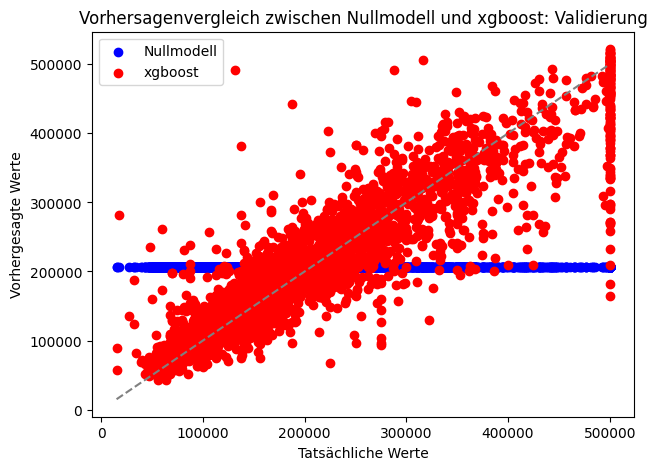

In [293]:
mean_y = np.mean(y_val)  # Mittelwert des Zielmerkmals berechnen
y_pred_null = np.full_like(y_val, mean_y)
vergleich_modell(y_pred, y_pred_null, y_val, 'xgboost: Validierung', 'xgboost')

In [294]:
model_name.append(f'xgboost_{gpu_name}')
model_rmse.append(rmse_xgb)
model_laufzeit.append(training_time)

<Figure size 1000x800 with 0 Axes>

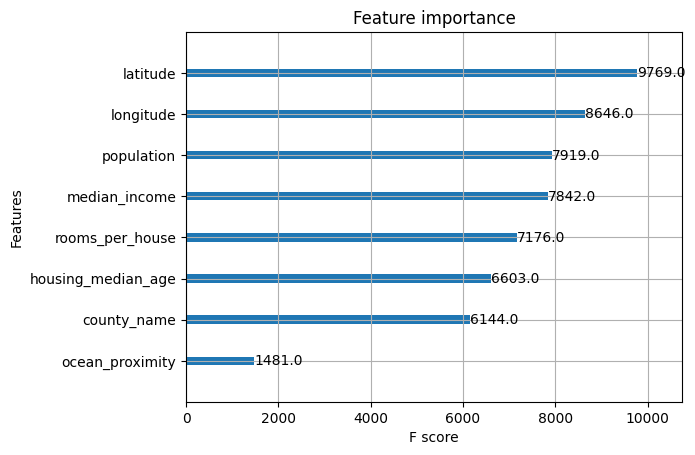

In [295]:
# Plot der Feature-Importance
plt.figure(figsize=(10, 8))
plot_importance(best_xgb_model, max_num_features=None)
plt.show()

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

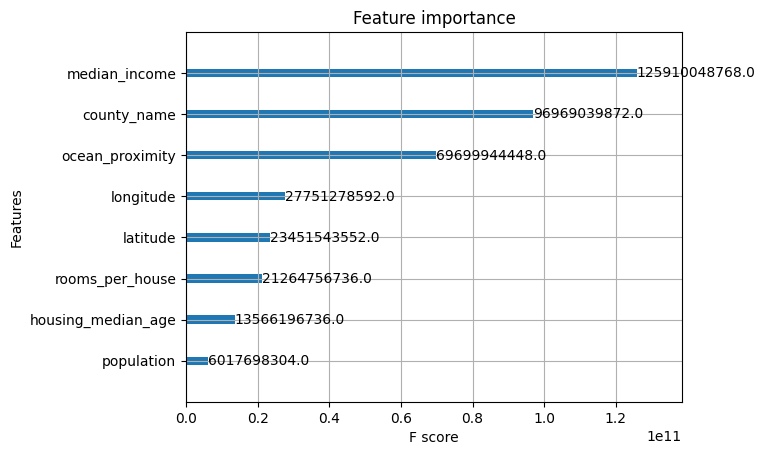

In [296]:
plot_importance(best_xgb_model, importance_type='gain')

Als wichtigsten Merkmal bezüglich des splits werden *longitude* und *latitude* identifiziert. Ebenso *population* weist einen hohen Wert auf. Die geringst eWichtigkeit hat *ocean_proximity*.

Betrachtet man nun die Feature Importance basierend auf dem gain, so ergibt sich ein anderes Bild. Hier ist das wichtigste Merkmal der *median_income* und auf Platz 2 folgt bereits *ocean_proximity*. Am wenigsten gain gewinn, obwohl noch häufig in den Split verwendet, liefert *population*. Das heißt, dass das Merkmal zwar oft als Splitkriterium genutzt wird, aber nicht mehr für eine starke Verbesserung sorgt, folglich wird es eher in den unteren Blattknoten verwendet. 

In [297]:
best_xgb_model.save_model(os.path.join(models_path, f'xgboost_model_{gpu_name}.json'))

In [298]:
del best_xgb_model, xgb_model, random_search
gc.collect()

4467

Xgboost lässt mittlerweile auch die interne Verarbeitung der kategorischen Variablen zu, wenn diese mit dem Datentyp "category" gekennzeichnet werden und enable_categorical=True gesetzt wurde. 

Unten wurde nochmal das xgboost Paket mit den skalierten und OneHot kodierten variablen getestet. Hierdurch erhöht sich die Anzahl der Spalten im Datensatz massiv. 

In [299]:
xgb_model_oh = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=n_est, verbosity=0, tree_method = 'hist', device=device_XGB) # gleiche Anzahl Iterationen wie bei CatBoost und lightGBM
kf = KFold(n_splits=4, shuffle=True, random_state=42)

start_time = time.time()
random_search = RandomizedSearchCV(xgb_model_oh, param_distributions=param_grid_XGB, cv=kf, random_state=42, scoring='neg_mean_squared_error', verbose=0)
random_search.fit(x_train_trans, y_train_trans)
end_time = time.time()
fitting_time = end_time - start_time
print(f"Laufzeit von RandomSearch und CV: {fitting_time:.4f} Sekunden")

# Anzeige und Diskussion der besten Parametersätze
results = random_search.cv_results_
top_params = zip(results['params'], -results['mean_test_score'])  # Scores sind negativ
top_params = sorted(top_params, key=lambda x: x[1], reverse=True)[:5]

print("Die besten fünf Parametersätze sind:")
for params, score in top_params:
    print(params, "mit einem Score von", score)

Laufzeit von RandomSearch und CV: 79.9915 Sekunden
Die besten fünf Parametersätze sind:
{'colsample_bytree': 0.9, 'learning_rate': 0.40827149343011643, 'max_depth': 5, 'subsample': 0.9} mit einem Score von 2511833410.092563
{'colsample_bytree': 0.7, 'learning_rate': 0.3105575058716044, 'max_depth': 6, 'subsample': 0.9} mit einem Score von 2455184036.7045493
{'colsample_bytree': 1.0, 'learning_rate': 0.3093292420985183, 'max_depth': 5, 'subsample': 0.8} mit einem Score von 2449726320.007847
{'colsample_bytree': 0.7, 'learning_rate': 0.3187407548138583, 'max_depth': 4, 'subsample': 0.8} mit einem Score von 2399404667.1187334
{'colsample_bytree': 0.7, 'learning_rate': 0.2259725093210579, 'max_depth': 3, 'subsample': 0.9} mit einem Score von 2349389783.0678883


Beim xgBoost Modell mit OneHot Encoding und Skalierung sind die Ergebnisse ähnlich wie zuvor. 

Die ersten vier Parametersätze sind identisch. Lediglich der fünft unterscheidet sich. Hier ist der Anteil der ausgewählten Features 0,7 statt wie zuvor 1,0. Ebenso ist die Lernrate leicht höher und die maximale Tiefe 3 anstelle von 4. Die Probenunterstichprobe beträgt 0,9 anstelle 0,8. Dies führt zu einem niedrigeren Score als zuvor, wobei alle Scores niedriger ausfallen. 

In [300]:
best_xgb_model_oh = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=n_est,
    learning_rate=random_search.best_params_['learning_rate'],
    max_depth=random_search.best_params_['max_depth'],
    subsample=random_search.best_params_['subsample'],
    colsample_bytree=random_search.best_params_['colsample_bytree'],
    verbosity=0,tree_method = 'hist', device=device_XGB
)

# Trainieren des besten Modells mit den Trainingsdaten
start_time = time.time()
best_xgb_model_oh.fit(x_train_trans, y_train_trans)
end_time = time.time()
training_time = end_time - start_time

In [301]:
y_pred = best_xgb_model_oh.predict(x_val_trans)
rmse_xgb = berechne_rmse(y_val_trans, y_pred)
print(f"xgboost  RMSE: {rmse_xgb:.2f}")
print(f"Laufzeit: {training_time:.4f} Sekunden")

xgboost  RMSE: 48021.44
Laufzeit: 2.3776 Sekunden


<Figure size 1000x1200 with 0 Axes>

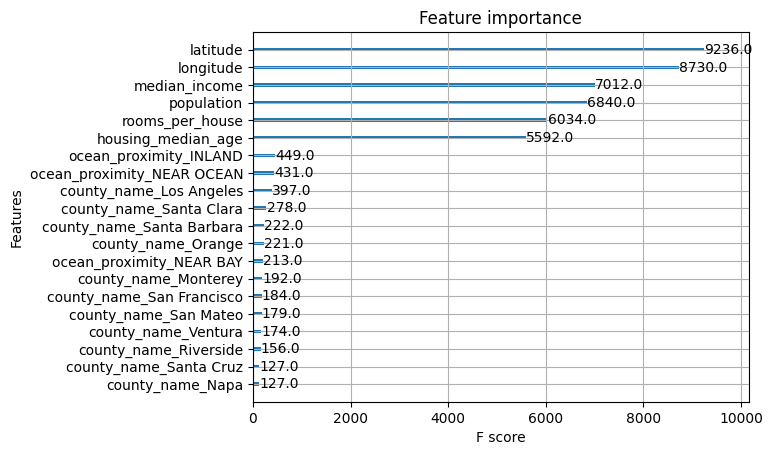

In [302]:
# Plot der Feature-Importance
plt.figure(figsize=(10, 12))
plot_importance(best_xgb_model_oh, max_num_features=20)
plt.show()

Die Feature importance wählt als wichtigste Merkmale die numerischen Variablen aus. Hier sind *longitude* und *latitude* am Wichtigsten. 

In [303]:
best_xgb_model_oh.save_model(os.path.join(models_path, f'xgboost_model_OneHot_{gpu_name}.json'))

In [304]:
del best_xgb_model_oh, xgb_model_oh, random_search
gc.collect()

7170

##### c) Abschließend ist der Aufwand und der Nutzen der hier optimierten Modelle gegenüber dem CatBoost-Modell aus Aufgabe A-7 b) zu bewerten.

<u>Lösungsansatz:</u>

In [305]:
desired_models = [f'CatBoost_{gpu_name}', f'LightGBM_{gpu_name}', f'xgboost_{gpu_name}']
filtered_data = {key: [value for idx, value in enumerate(dict[key]) if dict['Model name'][idx] in desired_models] for key in dict}

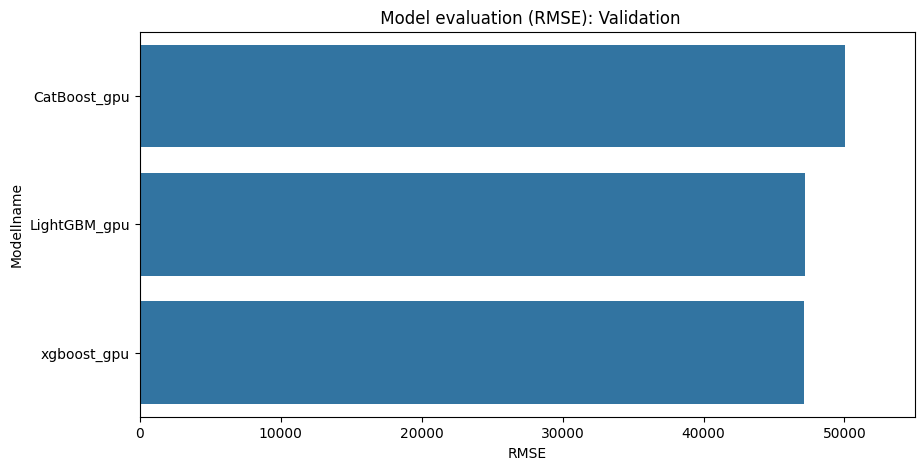

In [306]:
plot_rmse(filtered_data,0,55000, "Validation")

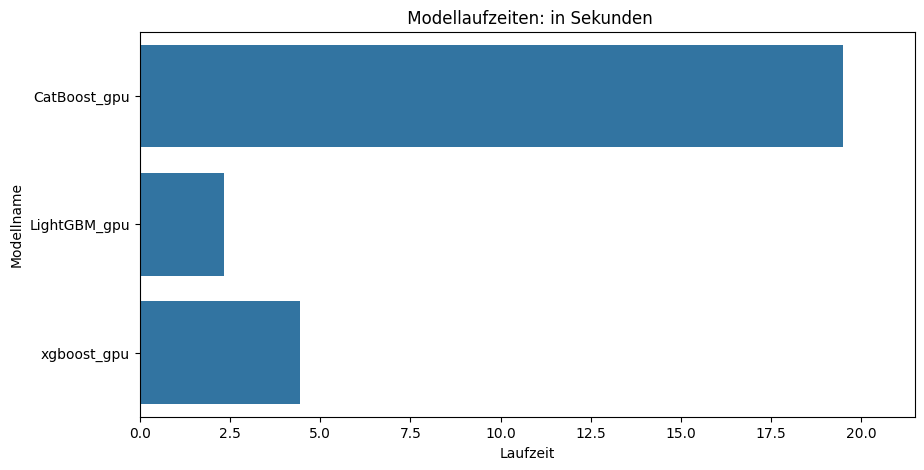

In [307]:
plot_laufzeit(filtered_data,0,max(filtered_data['Laufzeit'])+2, "in Sekunden")

Zusammenfassend lässt sich sagen, dass die drei betrachteten Gradient-Boosting-Tools CatBoost, LightGBM und XGBoost aufgrund ihrer effizienten Parallelisierung sehr schnell sind. Sie unterscheiden sich in ihrer Vorgehensweise beim schrittweisen Aufbau der Bäume: CatBoost verwendet eine stufenweise Methode, XGBoost eine stufenweise und LightGBM eine blattweise. LightGBM nutzt standardmäßig einen effizienten histogrammbasierten Entscheidungsprozess, der auch bei XGBoost aktiviert werden kann. CatBoost ist besonders gut für die effiziente Verarbeitung kategorialer Merkmale geeignet und liefert oft bereits mit Standardeinstellungen schnelle und hochwertige Ergebnisse.

Bei der Kreuzvalidierung werden die Daten in mehrere "Folds" aufgeteilt, um mehrere Modelle zu trainieren und zu validieren, wodurch die Prognosen gemittelt und das Ergebnis repräsentativer wird.

Bei der "Grid Search" werden verschiedene Werte für mehrere Hyperparameter vorgegeben und alle Parameterkombinationen gefittet, während bei der "Randomized Search" nur eine vorgegebene Anzahl zufällig ausgewählter Kombinationen durchgeführt wird. Die Randomized Search eignet sich besonders für höherdimensionale Suchräume. Das Hyperparameter-Tuning könnte noch weiter optimiert werden, indem andere Algorithmen wie die Bayes-Optimierung oder Optuna getestet werden.

Zusätzlich sollte beachtet werden, dass der Vergleich hinsichtlich der Laufzeit nicht nur das Fitting der Modelle, sondern auch die Laufzeit der Optimierung berücksichtigen sollte. Diese ist stark abhängig von der Anzahl der Parameter im Gitter oder der Anzahl an Iterationen bei Random Search. Ebenso wurde nicht mit Early Stopping experimentiert.

### Aufgabe B-5: Finale Modellbewertung an Testdaten [Lernziele 4.1 & 6; 4 Punkte] <a class="anchor" id="unterabschnitt-2-5"></a>
##### a) Das CatBoost-Modell aus Aufgabe A-7 sowie alle im Teil B des Notebooks enthaltenen Modelle sind abschließend mit den Testdaten (sample = C) zu bewerten und die Ergebnisse in den Testdaten abzulegen.

<u>Lösungsansatz:</u>

Zur Bewertung aller Modelle auf den Testdaten sind zunächst einmal die passenden Testdaten für jedes Modell zurate zu ziehen. 

Wir haben 3 unterschieldiche Datensätze: 
* Datensatz ohne Skalierung: Hier werden das CatBoost Modell aus A7, das lightGBM Modell und xgboost ausgewertet.
* Datensatz mit Skalierung und OneHot Encoding: Dieser Datensatz wird für das CatBoost Modell aus B1 und das Neuronale Netz aus B2 genutzt
* Datensatz mit Skalierung und Label Encoding: Das ist der Datensatz für die Neuronalen Netze aus B3 mit Embedding. 

Nachfolgend werden die Datensätze aufgeteilt und die Modelle, welche zwischengespeichert wurden, eingelesen. 

In [308]:
dict['Model name']

['Linear_Regression',
 'CatBoost_gpu',
 'CatBoost_B1_gpu',
 'NN_B2_gpu',
 'NN_B3_Embedding_gpu',
 'NN_B3_Embedding_cloned_gpu',
 'LightGBM_gpu',
 'xgboost_gpu']

In [309]:
# Teilen des DataFrames in Trainings- und Validierungsdaten anhand der Spalte 'sample':
test_data = df[df['sample'] == 'C']
x_test = df[df['sample']=='C'].drop(['median_house_value','sample'], axis=1)
y_test = df[df['sample']=='C']['median_house_value']

x_test_trans = df_trans[df_trans['sample']=='C'].drop(['median_house_value','sample'], axis=1)
y_test_trans = df_trans[df_trans['sample']=='C']['median_house_value']

x_test_trans2 = df_trans2[df_trans2['sample']=='C'].drop(['median_house_value','sample'], axis=1)
y_test_trans2 = df_trans2[df_trans2['sample']=='C']['median_house_value']

In [310]:
cat_model_A7 = CatBoostRegressor(task_type = device_CatBoost).load_model(os.path.join(models_path, f'catboost_model_{gpu_name}.cbm'))
test_data[f'cat_model_A7_{gpu_name}'] = cat_model_A7.predict(x_test)

In [311]:
xgb_B4 = xgb.XGBRegressor(device=device_XGB)
xgb_B4.load_model(os.path.join(models_path, f'xgboost_model_{gpu_name}.json'))
test_data[f'xgb_B4_{gpu_name}'] = xgb_B4.predict(x_test)

In [312]:
xgb_B4 = xgb.XGBRegressor(device=device_XGB)
xgb_B4.load_model(os.path.join(models_path, f'xgboost_model_OneHot_{gpu_name}.json'))
test_data[f'xgb_B4_oh_{gpu_name}'] = xgb_B4.predict(x_test_trans)

In [313]:
lgb_B4 = lgb.Booster(model_file=os.path.join(models_path, f'lightgbm_model_{gpu_name}.json'))
test_data[f'lgb_B4_{gpu_name}'] = lgb_B4.predict(x_test)

In [314]:
lgb_B4 = lgb.Booster(model_file=os.path.join(models_path, f'lightgbm_model_OneHot_{gpu_name}.json'))
test_data[f'lgb_B4_oh_{gpu_name}'] = lgb_B4.predict(x_test_trans)

In [315]:
cat_model_B1 = CatBoostRegressor(task_type = device_CatBoost).load_model(os.path.join(models_path, f'catboost_model_B1_{gpu_name}.cbm'))
test_data[f'cat_model_B1_{gpu_name}'] = cat_model_B1.predict(x_test_trans)

In [316]:
NN_B2 = load_model(os.path.join(models_path, f'NN_Gesamtdaten_summe_{gpu_name}.h5'))
NN_B2.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
test_data[f'NN_B2_{gpu_name}'] = NN_B2.predict(x_test_trans)

98/98 [==============================] - 0s 1ms/step


In [317]:
features = ['latitude', 'longitude', 'housing_median_age', 'population','median_income', 'rooms_per_house']

In [318]:
NN_B3 = load_model(os.path.join(models_path, f'NN_B3_Embedding_{gpu_name}.h5'))
NN_B3.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
test_data[f'NN_B3_{gpu_name}'] = NN_B3.predict([x_test_trans2[features], x_test_trans2.ocean_proximityX, x_test_trans2.county_nameX])

98/98 [==============================] - 0s 1ms/step


In [319]:
NN_B3_cloned = load_model(os.path.join(models_path, f'cloned_NN_B3_Embedding_{gpu_name}.h5'))
NN_B3_cloned.compile(optimizer=Nadam(), loss='mean_squared_error', metrics=[metrics.RootMeanSquaredError()])
test_data[f'NN_B3_cloned_{gpu_name}'] = NN_B3_cloned.predict([x_test_trans2[features], x_test_trans2.ocean_proximityX, x_test_trans2.county_nameX])

98/98 [==============================] - 0s 2ms/step


In [320]:
test_data.head()

,latitude,longitude,housing_median_age,population,median_income,median_house_value,ocean_proximity,county_name,sample,rooms_per_house,cat_model_A7_gpu,xgb_B4_gpu,xgb_B4_oh_gpu,lgb_B4_gpu,lgb_B4_oh_gpu,cat_model_B1_gpu,NN_B2_gpu,NN_B3_gpu,NN_B3_cloned_gpu
0,32.54,-117.04,7,1187,1.2667,67500,NEAR OCEAN,San Diego,C,3.326241,115961.150445,155594.593750,157679.421875,134684.006480,136433.966025,119413.584391,134497.187500,158280.406250,129502.289062
1,32.55,-117.09,8,4797,3.9583,144400,NEAR OCEAN,San Diego,C,5.550552,147793.775111,149624.906250,144015.953125,139525.956270,128454.891247,152822.569181,189374.906250,193673.718750,194366.812500
10,32.56,-117.05,22,2049,2.0159,139300,NEAR OCEAN,San Diego,C,4.145038,113518.735997,118249.734375,120745.921875,118011.353613,117083.803100,117418.376819,124920.039062,141021.000000,116959.648438
12,32.56,-117.05,17,811,2.8750,134500,NEAR OCEAN,San Diego,C,4.417040,136439.471181,133853.500000,134296.359375,135864.458907,129808.928522,133585.486440,167732.078125,191981.265625,168440.296875
35,32.58,-117.13,27,814,2.3603,195300,NEAR OCEAN,San Diego,C,4.071839,144495.560537,139667.921875,130522.062500,144516.555389,159610.066274,145642.643118,157687.031250,184115.765625,169880.796875


In [321]:
# Speichere Testdatensatz als csv
test_data.to_csv(os.path.join(files_path, f'Testdaten.csv'), index=False)

##### b) Die Modellgüte der Modelle ist grafisch aufzubereiten. Welche Modelle haben die beste Prognosegüte? Gibt es im Hinblick auf Prognosegüte, Optimierungsaufwand und Laufzeit ein besonders geeignetes und empfehlenswertes Modell?

<u>Lösungsansatz:</u>

Zunächst vergleichen wir die Modelle unter Nutzung des anfangs gespeicherten dictionary dict. Es wird hinsichtlich des RMSE auf Validierungsdaten und der Laufzeit auf den Trainingsdaten verglichen. 

Im Anschluss werden die Modelle hinsichtlich des RMSE auch auf den Testdaten miteinander verglichen und ein Plot erzeugt, der für eine gebandete Zielvariable angibt, wie weit die Modelle jeweils vom beobachteten Hauswert entfernt sind. 

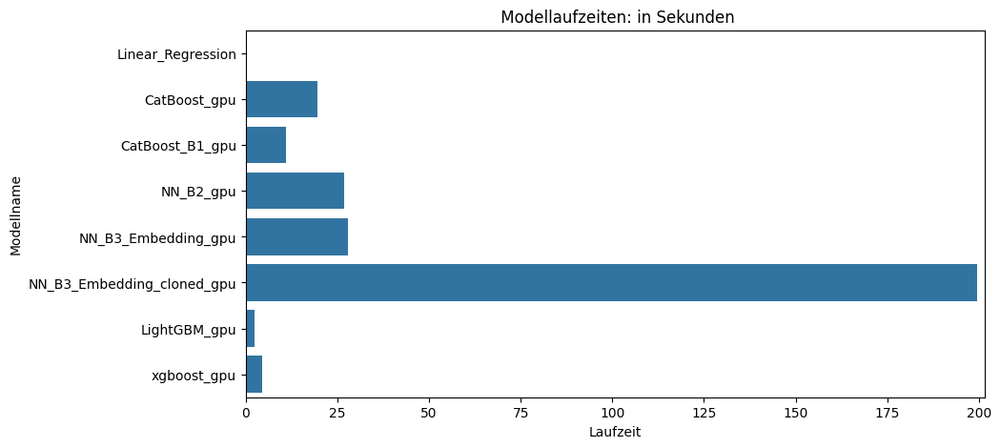

In [322]:
plot_laufzeit(dict,0,max(dict['Laufzeit'])+2,"in Sekunden")

Bezüglich der Laufzeit zeigt sich, dass lightGBM, xgbBoost und die lineare Regression am schnellsten trainiert werden können. Auch Catboost basierend auf OneHot kodierten und skalierten Variablen (B1) liefert gut Laufzeitergebnisse. 

Das CatBoost Modell aus A7 ist langsamer, da die Verarbeitung der kategoriellen Merkmale und die unterschiedliche Skalierung in den numerischen Merkmalen mehr Zeit in Anspruch nimmt. Hiermit können lightgbm und xgboost besser umgehen. 

Die neuronalen Netze brauchen länger für das fitten. Inbesondere das geklonte Modell ist sehr langsam. 

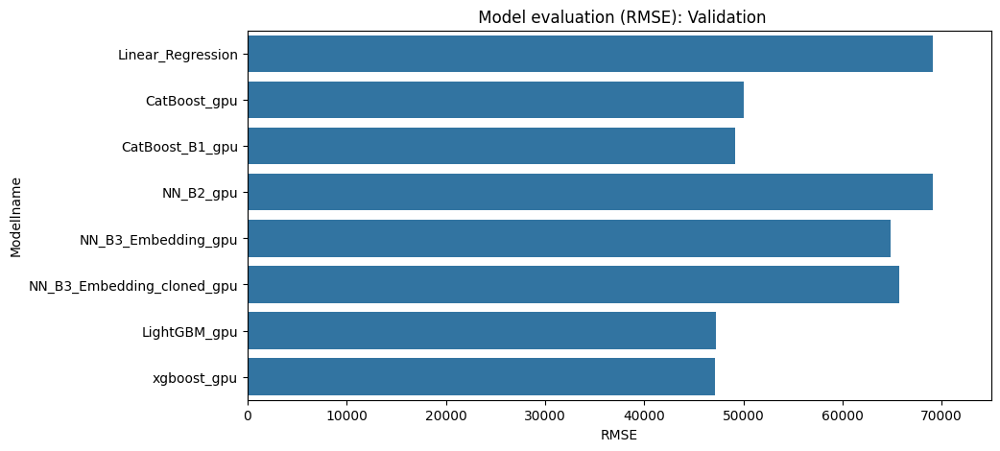

In [323]:
plot_rmse(dict,0,75000, "Validation")

Bezüglich der Laufzeit zeigt sich, dass xgboost, lightGBM und das lineare Modell am schnellsten gefittet werden können. Auch CatBoost basierend auf OneHot kodierten und skalierten Daten (B1) liefert sehr gute Ergebnisse. 

Das CatBoost Modell aus A7 ist langsamer, da die Verarbeitung der kategoriellen Merkmale und die unterschiedliche Skalierung in den numerischen Merkmalen mehr Zeit in anspruch nimmt. Hiermit können lightgbm und xgboost besser umgehen. 

Die neuronalen Netze brauchen länger für das fitten. Inbesondere das geklonte Modell ist sehr langsam. 

Vergleicht man die RMSE Wete auf den Validierungsdaten sieht man, dass die GradientBoosting Machines die besten Ergebnisse erzielen. Sie liegen alle unter 50000. Die Neuronalen Netze und das lineare Modell weisen alle höhere RMSE Werte zwischen 64000 und 70000 auf. 

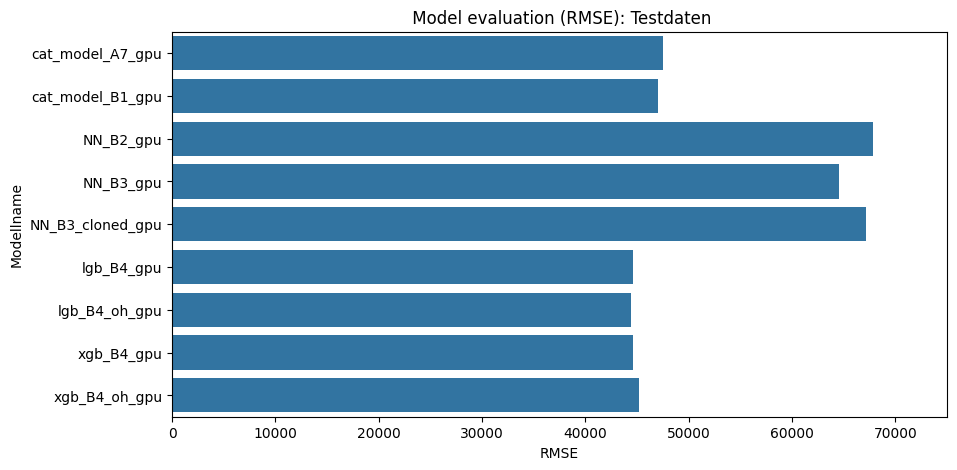

In [324]:
mname = []
test_rmse = []
dict_test = {'Model name': mname, 'RMSE': test_rmse}

for i in [f'cat_model_A7_{gpu_name}',f'cat_model_B1_{gpu_name}',f'NN_B2_{gpu_name}',f'NN_B3_{gpu_name}', f'NN_B3_cloned_{gpu_name}',f'lgb_B4_{gpu_name}',f'lgb_B4_oh_{gpu_name}',f'xgb_B4_{gpu_name}',f'xgb_B4_oh_{gpu_name}']:
    mname.append(i)
    test_rmse.append(berechne_rmse(test_data['median_house_value'],test_data[i]))
plot_rmse(dict_test,0,75000,"Testdaten")

In [325]:
pd.DataFrame(dict_test)

,Model name,RMSE
0,cat_model_A7_gpu,47530.316828
1,cat_model_B1_gpu,47011.062613
2,NN_B2_gpu,67800.268043
3,NN_B3_gpu,64559.741193
4,NN_B3_cloned_gpu,67193.982989
5,lgb_B4_gpu,44588.313934
6,lgb_B4_oh_gpu,44387.940733
7,xgb_B4_gpu,44582.483899
8,xgb_B4_oh_gpu,45147.080698


Auf den Testdaten wurde das Lineare Modell aus A7 nicht betrachtet. Hier liefert sich für den RMSE ein ähnliches Bild wie auf den Validierungsdaten. Die GradientBoosting Methoden zeigen die besten Ergebnisse. Von den neuronalen Netzen ist das neuronale Netz mit Embeddings (nicht geklont) zu bevorzugen. 

Als letzte Aufbereitungsmethode wird wieder der Hauspreis in bins eingeteilt. Dann wird für jeden bin der mittlere Hauspreis, das Exposure und die mittleren Vorhersagen der Modelle berechnet. Die Beobachteten Werte auf den Testdaten und die Vorhersagen werden als Linien geplottet. Das Exposure wird auf der Sekundärachse abgetragen und als Balken visualisiert. 

In [326]:
ddf = test_data[['median_house_value', f'cat_model_A7_{gpu_name}',f'cat_model_B1_{gpu_name}',f'NN_B2_{gpu_name}',f'NN_B3_{gpu_name}', f'NN_B3_cloned_{gpu_name}',f'lgb_B4_{gpu_name}',f'lgb_B4_oh_{gpu_name}',f'xgb_B4_{gpu_name}',f'xgb_B4_oh_{gpu_name}']]

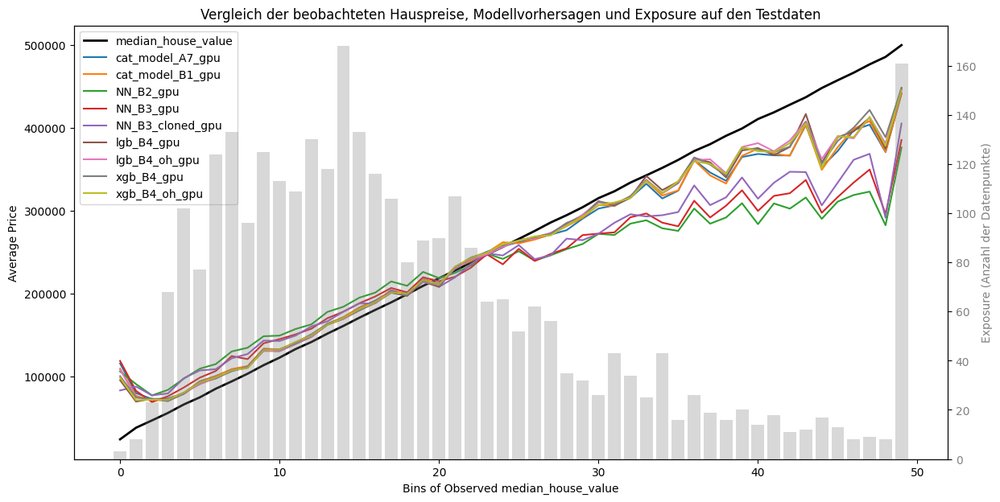

In [327]:
# Einteilung der beobachteten Werte in Bins
bin_count = 50  # Anzahl der Bins
ddf['bin'] = pd.cut(ddf['median_house_value'], bins=bin_count, labels=np.arange(bin_count))

# Berechnung der Durchschnittswerte für jedes Bin
bin_means = ddf.groupby('bin').mean()
bin_counts = ddf.groupby('bin').size()

# Erstellen des Plots
fig, ax1 = plt.subplots(figsize=(14, 7))

# Linien für beobachtete Werte und Vorhersagen der Modelle
ax1.plot(bin_means['median_house_value'], label='median_house_value', linewidth=2, color='black')

for model_name in [f'cat_model_A7_{gpu_name}',f'cat_model_B1_{gpu_name}',f'NN_B2_{gpu_name}',f'NN_B3_{gpu_name}', f'NN_B3_cloned_{gpu_name}',f'lgb_B4_{gpu_name}',f'lgb_B4_oh_{gpu_name}',f'xgb_B4_{gpu_name}',f'xgb_B4_oh_{gpu_name}']:
    ax1.plot(bin_means[model_name], label=model_name)

ax1.set_title('Vergleich der beobachteten Hauspreise, Modellvorhersagen und Exposure auf den Testdaten')
ax1.set_xlabel('Bins of Observed median_house_value')
ax1.set_ylabel('Average Price')
ax1.legend(loc='upper left')

# Zweite Y-Achse für die Anzahl der Datenpunkte (Exposure)
ax2 = ax1.twinx()
ax2.bar(bin_means.index, bin_counts, alpha=0.3, color='grey')
ax2.set_ylabel('Exposure (Anzahl der Datenpunkte)', color='grey')
ax2.tick_params(axis='y', labelcolor='grey')

plt.show()

Der Plot zeigt als schwarze Linie den mittleren Hauswert pro Bin (Beobachtung). Die Gradient Boosting Modelle XGBoost, LightGBM und die zwei CatBoost-Modelle sind für alle Bins am nächsten zur Beobachtung. Die neuronalen Netze sind weiter entfernt und somit schlechter. Hier zeigt das Modell aus B2 den schlechtesten Fit.

Die neuronalen Netze (NN) zeigen die schlechteste Prognosegüte, hier wurde aber auch kein Hyperparameter-Tuning betrieben. Es dauerte dennoch lange, um auf ein geeignetes Modell zu kommen. Hier würde sich ebenfalls die Strategie der Hyperparametersuche anbieten. Dies kann in Python mittels KerasTuner durchgeführt werden. Allerdings benötigen neuronale Netze relativ lange zum Fitten der Modelle auf den Trainingsdaten. Deswegen fällt jedes NN als bestes Modell raus.

Die Standardeinstellungen von XGBoost, LightGBM und CatBoost sind schon sehr gut. Es handelt sich um sehr effiziente Pakete mit den besten Laufzeiten auf den Trainingsdaten. Somit ist der Optimierungsaufwand im Verhältnis zu den neuronalen Netzen relativ gering. Auch bezüglich des RMSE zeigen sie sowohl auf den Validierungsdaten als auch auf den Testdaten bessere Ergebnisse als die trainierten neuronalen Netze.

Bei CatBoost wurde jedoch kein Hyperparameter-Tuning durchgeführt. Bei LightGBM lediglich eine Gittersuche und bei XGBoost eine Randomized Search. Grid Search führt eine systematische und umfassende Suche im gesamten Hyperparameter-Raum durch, indem vordefinierte Hyperparameter-Kombinationen auf einem Gitter ausprobiert werden. Diese Methode ist einfach zu implementieren und effektiv bei einem kleinen Suchraum, kann jedoch bei einem großen Suchraum sehr rechenintensiv werden, da alle Kombinationen ausprobiert werden. Im Gegensatz dazu wählt Randomized Search zufällige Werte für die Hyperparameter aus einem vordefinierten Verteilungsbereich und testet nur eine bestimmte Anzahl von zufälligen Kombinationen. Diese Methode ist weniger rechenintensiv und konzentriert sich auf vielversprechende Bereiche des Hyperparameter-Raums, was besonders nützlich sein kann, wenn man unsicher ist, welche Hyperparameter wichtig sind und in welchem Bereich sie optimiert werden sollten. Alle drei Ansätze könnten verbessert werden.

Mit Early Stopping könnten die Laufzeiten des Trainierens der Gradient Boosting Modelle nochmals verbessert werden. Zudem wurden nur ein paar Parameter trainiert und Gitter- bzw. Randomized Search angewandt. Mit der Bayes-Optimierung oder Optuna stehen mächtigere Tools in Python zur Verfügung. Die Herausforderung bei der Gittersuche ist es, ein geeignetes Gitter vorzugeben, bei der Zufallssuche wird das durch das Vorgeben eines Suchraumes vereinfacht. Je nach Größe des Gitters oder Anzahl der Iterationen bei der Zufallssuche erhöht sich die Laufzeit zum Finden der besten Parameter.

Dennoch sind die beiden Modelle unter Anwendung der obigen Strategien die Modelle, die es zu empfehlen gilt. Der Datensatz hat lediglich zwei kategoriale Variablen, wodurch CatBoost seinen Vorteil nicht ausspielen kann. LightGBM hat sicherlich durch den histogrammbasierten Aufbau des Baumes Vorteile gegenüber XGBoost, dieser Parameter kann aber in den neueren Versionen genauso wie der Umgang mit kategorialen Variablen eingestellt werden.

Des Weiteren lässt sich festhalten, dass die Modelle nicht per se miteinander vergleichbar sind, da bei CatBoost wie oben erwähnt keine Hyperparameter-Optimierung durchgeführt wurde, bei LightGBM wurden vier Hyperparameter optimiert und bei XGBoost lediglich zwei. Ebenso wurden unterschiedliche Strategien angewandt. Bei den neuronalen Netzen fand ebenso kein Hyperparameter-Tuning mittels eines Pakets statt, sondern ein Trial-and-Error-Ansatz, um zu einem besseren Modell zu kommen. Es wird vorgeschlagen, diese Strategien eventuell zur Vorauswahl der Methoden heranzuziehen, allerdings für eine finale Modellentscheidung sich ein bis zwei Modelle herauszusuchen und nochmal intensiver zu optimieren.

Ein weiterer erwähnenswerter Punkt ist, dass die Skalierung auf dem 100%-Datensatz angewandt wurde. Hier ist eine Empfehlung, dies nur auf den Trainingsdaten zu tun und dann eine Pipeline anzuwenden, um die gleichen Faktoren, z.B. bei factorize und OneHot, auch auf den Testdaten anzuwenden. Dies muss eigentlich auch bei der Kreuzvalidierung berücksichtigt werden.

Es lässt sich abschließend auf den vorliegenden Ergebnissen nicht beurteilen, ob LightGBM oder XGBoost zu bevorzugen ist. Beide Methoden liefern gute Ergebnisse. LightGBM hat die Nase bezüglich des RMSE und der Laufzeit leicht vorn (sowohl mit als auch ohne Berücksichtigung von skalierten Daten). Deswegen wird sich für diese Methode als Sieger entschieden.

In [328]:
laufzeiten['Teil B'] = time.time() - start_time_B

In [331]:
del ddf, df_trans, df_trans2, cat_model_A7, xgb_B4, lgb_B4, cat_model_B1, NN_B2

In [332]:
gc.collect()

10539

[Zurück zum Inhaltsverzeichnis](#abschnitt-0)

## Teil C: Clustering unter Verwendung von Feuergefährdungszonen [25 Punkte] <a class="anchor" id="abschnitt-3"></a>
### Aufgabe C-1: Erweiterung des Hauptdatensatzes um Feuergefährdungszonen [Lernziele 3.3/3.4, 5.2 & 6; 12 Punkte] <a class="anchor" id="unterabschnitt-3-1"></a>

Der Datensatz california_fire_zones.shp (zusammen mit vier dazugehörigen Hilfs-dateien unterschiedlicher Dateiendungen) beinhaltet geografische Informationen zu Feuergefährdungszonen in Kalifornien. Konkret enthält jede Zeile dieses Datensatzes ein Polygon (gespeichert im Feature geometry), dem eine Feuergefährdungszone (gespeichert im Feature FHSZ mit Interpretation 1 ≙ moderate Gefährdung, 2 ≙ hohe Gefährdung und 3 ≙ sehr hohe Gefährdung) sowie Fläche (gespeichert im Feature Shape_Area) und Länge (gespeichert im Feature Shape_Leng) zugeordnet sind. [Datenquelle: https://gis.data.ca.gov/maps/CALFIRE-Forestry::california-fire-ha-zard-severity-zones-fhsz/about (geringfügig modifiziert)]

##### a) Der Datensatz california_fire_zones.shp ist einzulesen (siehe Anhang 1), im Anschluss sind 10 zufällige Zeilen davon auszugeben. Die absolute Häufigkeitsverteilung der Werte des Merkmals FHSZ ist zu erstellen. Weiter ist eine Funktion zu schreiben, welche für ein gegebenes Polygon die Anzahl an Eckpunkten zurückgibt. Unter Verwendung dieser Funktion ist ein Histogramm zur Anzahl an Eckpunkten der Polygone des eingelesenen Datensatzes zu erstellen, bei welchem die x-Achse logarithmiert dargestellt wird, und zu kommentieren. Schließlich ist ein Plot der Feuergefährdungszonen zu erzeugen und mit einer Karte von Kalifornien zu hinterlegen.

<u>Lösungsansatz</u>

Gegeben ist ein Shapefile der Feuerzonen in Kalifornien. Ein Shapefile ist ein Objekt, das den Begriff der räumlichen Kontiguität zwischen all den verschiedenen Regionen einbettet. Aber was ist ein Shapefile im Detail?

Ein [Shapefile](https://en.wikipedia.org/wiki/Shapefile) ist ein digitales Vektorspeicherformat, das für jedes Gebiet die entsprechende geometrische Darstellung in einem geeigneten Koordinatensystem enthält.  In unserem Fall wird eine 2D-Darstellung verwendet, bei der jeder Punkt durch ein Koordinatenpaar, d.h. die geografischen Koordinaten, ausgedrückt durch Breiten- und Längengrad, vollständig spezifiziert ist. 

Als Industriestandard sind Shapefiles das am weitesten verbreitete Vektordatenformat. Sie speichern Daten als Punkte, Linien oder Polygone. Diese drei Merkmalstypen bilden die Grundlage für die Analyse von Geodaten in Vektoren. Punkte können verwendet werden, um Adressen, Points of Interest und Parzellen- oder Postleitzahlenschwerpunkte darzustellen. Linien werden häufig zur Darstellung von Straßennetzen oder Wasserwegen verwendet. Polygonale Daten können alles darstellen, was eine Grenze hat, z. B. eine Nachbarschaft, einen Zählungsblock oder einen Geofence.

GeoPandas liest (räumliche) Eingabedaten und konvertiert sie in den sogenannten GeoDataFrame. Das Neue an GeoDataFrame ist, dass es Geometriespalten (auch bekannt als GeoSeries) speichern und räumliche Operationen durchführen kann. Die Geometriespalte kann jede Art von Vektordaten enthalten, z. B. Punkte, Linien und Polygone. Außerdem ist zu beachten, dass ein GeoDataFrame zwar mehrere GeoSeries enthalten kann, aber nur eine Spalte als aktive Geometrie betrachtet wird, was bedeutet, dass alle räumlichen Operationen auf dieser Spalte basieren.

Grundsätzlich gibt es zwei Haupttypen von Geodaten: Vektordaten und Rasterdaten.
Vektordaten beschreiben die Merkmale von geografischen Orten auf der Erde durch die Verwendung diskreter Geometrien, nämlich:
* Punkt. Einzelne Orte, wie ein Gebäude oder ein Auto, mit X- und Y-Koordinaten.
* Linie.  Eine Reihe von miteinander verbundenen Punkten, die Dinge wie Straßen oder Flüsse beschreiben.
* Polygon. Wird durch eine geschlossene Linie gebildet, die ein Gebiet umschließt, z. B. die Grenzen eines Landes. Wenn ein Merkmal aus mehreren Geometrien besteht, nennen wir es MultiPolygon.
GeoPandas ist für die Arbeit mit Vektordaten konzipiert

Shapefiles können in Python mit Hilfe von Geopandas geladen werden: Das Ergebnis ist ein DataFrame mit einer speziellen Spalte namens Geometrie, in der die Polygoninformationen gespeichert sind:

In [333]:
start_time_C = time.time() 

In [ ]:
### Einlesen der Geodaten
gdf = gpd.read_file("../input/input-cads/california_fire_zones.shp", encoding="utf8")

Das Koordinatenreferenzsystem (CRS) ist wichtig, weil die geometrischen Formen in einem GeoSeries- oder GeoDataFrame-Objekt einfach eine Sammlung von Koordinaten in einem beliebigen Raum sind. Ein CRS sagt Python, wie sich diese Koordinaten zu Orten auf der Erde verhalten.

Auf ein und denselben CRS kann oft auf verschiedene Weise Bezug genommen werden. Eines der am häufigsten verwendeten CRS ist zum Beispiel die WGS84-Breiten-Längen-Projektion. Diese kann mit dem Autoritätscode "EPSG:4326" referenziert werden. (siehe: https://geopandas.org/en/stable/docs/user_guide/projections.html)

In [19]:
# gebe aktuelles crs aus
print(gdf.crs)

EPSG:3857


In [20]:
# ändern auf WGS84 -> zur Darstellung später auf der Karte
gdf_wgs84 = gdf.to_crs(epsg=4326)

In [337]:
# Gebe 10 zufällige Zeilen aus
random_rows = gdf.sample(n=10, random_state = seed)
display(random_rows)

,FHSZ,FHSZ_Descr,Shape_Leng,Shape_Area,geometry
578,2,High,28147.525549,3.858141e+06,"POLYGON ((-13641693.978 4565309.622, -13641693..."
1146,3,Very High,60180.000000,2.027520e+07,"POLYGON ((-13708251.101 4659163.548, -13708249..."
382,2,High,27540.000000,6.157800e+06,"POLYGON ((-12989204.952 4004394.388, -12989206..."
583,2,High,14468.592234,7.746145e+06,"POLYGON ((-13211874.030 4570742.499, -13212894..."
966,3,Very High,36821.003487,3.742586e+06,"POLYGON ((-13316312.231 4102844.184, -13316368..."
1173,3,Very High,8882.258838,3.578957e+06,"POLYGON ((-13431549.946 4712012.063, -13431902..."
175,1,Moderate,21335.830783,5.316342e+06,"POLYGON ((-13557269.860 4470062.437, -13557269..."
1084,3,Very High,44952.777143,6.655360e+06,"POLYGON ((-13610301.263 4450027.013, -13610315..."
705,2,High,344578.402118,1.514149e+08,"POLYGON ((-13548917.261 4825948.407, -13548763..."
1102,3,Very High,44365.597648,9.595129e+06,"POLYGON ((-13204493.754 4520276.454, -13204494..."


Nachfolgend wird einmal tabellarisch und einmal grafisch die absolute Häufigkeitsverteilung des Merkmals FHSZ dargestellt:

In [338]:
frequency = gdf['FHSZ'].value_counts()
display(frequency)

FHSZ
3    627
2    519
1    361
Name: count, dtype: int64

In [339]:
#(gespeichert im Feature FHSZ mit Interpretation 1 ≙ moderate Gefährdung, 2 ≙ hohe Gefährdung und 3 ≙ sehr hohe Gefährdung)
gefahr = {1: 'moderate Gefährdung',
         2: 'hohe Gefährdung',
         3: 'sehr hohe Gefährdung'}

gefahr_code = gdf.FHSZ.map(gefahr)

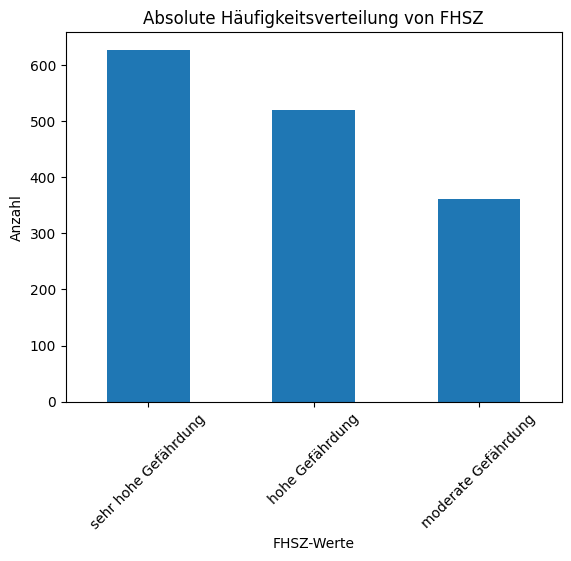

In [340]:
ax = gefahr_code.value_counts().plot(kind='bar')
plt.title('Absolute Häufigkeitsverteilung von FHSZ')
plt.xlabel('FHSZ-Werte')
plt.ylabel('Anzahl')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45) 
plt.show()

In [341]:
# Funktion zur Berechnung der Anzahl der Eckpunkte
def count_vertices(polygon):
    """
    Zählt die Anzahl der Eckpunkte eines gegebenen Polygons.

    Parameters:
    polygon: Das Polygon, dessen Eckpunkte gezählt werden sollen.

    Returns:
    int: Die Anzahl der Eckpunkte des Polygons
    """
    return len(polygon.exterior.coords)

Die folgende Funktion gibt für ein gegebenes Polynom die Anzahl an Eckpunkten zurück. Sie wird genutzt, um die Anzahl der Eckpunkte als Histogramm darzustellen. Hier wird die x-Achse zunächst logarithmiert. 

In [342]:
# Anzahl der Eckpunkte für jedes Polygon berechnen
gdf['vertex_count'] = gdf['geometry'].apply(count_vertices)

In [343]:
gdf_vertex_count = np.round(np.log(gdf['vertex_count']), 0)
gdf_vertex_count.describe()

count    1507.000000
mean        6.402123
std         1.470451
min         2.000000
25%         6.000000
50%         6.000000
75%         7.000000
max        12.000000
Name: vertex_count, dtype: float64

In [344]:
gdf_vertex_count.value_counts().sort_index()

vertex_count
2.0       6
3.0      32
4.0     109
5.0     203
6.0     446
7.0     435
8.0     169
9.0      68
10.0     27
11.0     10
12.0      2
Name: count, dtype: int64

In [345]:
gdf['vertex_count'].value_counts().sort_index()

vertex_count
7         1
10        1
11        1
12        3
14        1
         ..
57488     1
72473     1
87850     1
102429    1
107983    1
Name: count, Length: 1081, dtype: int64

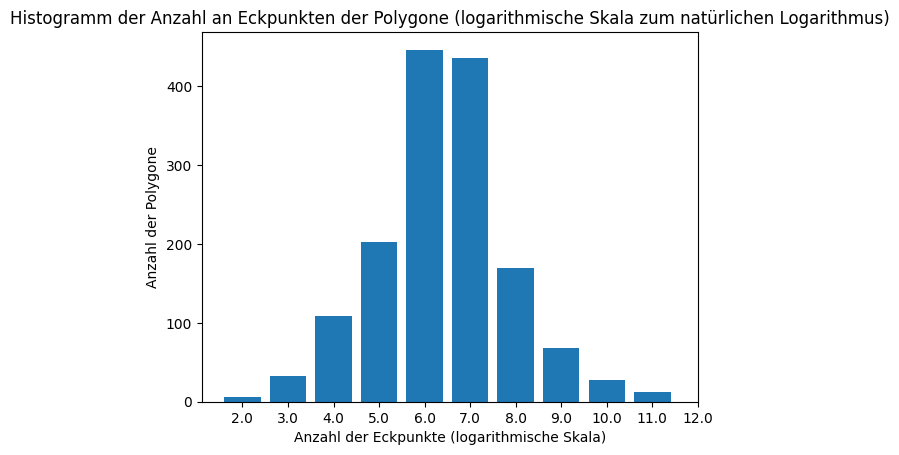

In [346]:
# Histogramm der Anzahl an Eckpunkten mit logarithmischer x-Achse
n, bins, patches = plt.hist(gdf_vertex_count, bins=int(gdf_vertex_count.max()-gdf_vertex_count.min()), rwidth=0.8)
plt.xlabel('Anzahl der Eckpunkte (logarithmische Skala)')
plt.ylabel('Anzahl der Polygone')
plt.title('Histogramm der Anzahl an Eckpunkten der Polygone (logarithmische Skala zum natürlichen Logarithmus)')

# Anpassen der x-Achsen-Markierungen
plt.xticks(np.arange(min(bins) + 0.5, max(bins)+1, 1), np.arange(min(bins), max(bins)+1, 1))

plt.show()

Die Nutzung der logarithmierten x-Achse hilft, die große Anzahl an unterschiedlichen Eckpunktzahlen auf einige Wenige zu reduzieren. Die Zahl wurde zudem auf die nächst höhere aufgerundet. Dadurch ergeben sich nur 11 verschiedene Werte für die Zahl der Eckpunkte. Von 2-12. Wohingegen in der unlogarithmierten Darstellung es 1081 verschiedene Werte gibt. Die werte von 2-12 bedeuten, dass es sich hierbei um $e^2$ bis $e^{12}$ beim natürlichen Logarithmus handelt. Auf einer logarithmischen Skala wird ein breiter Bereich von Datenpunkten komprimiert, sodass der Wertebereich schrumpft. 

Die Anzahl der Polygone mit nur 2,3 oder mehr als 9 Eckpunkten (log Darstellung) ist relativ gering. Dies könnte darauf hindeuten, dass sehr einfache oder sehr komplexe Formen in der geografischen Struktur Kaliforniens weniger häufig vorkommen. Solche Formen könnten spezielle geographische Merkmale wie schmale Landstreifen oder komplexe Küstenlinien darstellen.

Die realen Anzahl der Eckpunkte variiert mehr. Das liegt an der Natur der abgebildeten Sache von Feuergefahrenzonen. Diese Feuer lassen sich nicht einfach auf Polygone mit 4,6 oder 8 Ecken herunterbrechen. Im logarithmischen Sinne befinden sich aber zwischen 4 und 8 Ecken die Masse der Polygone. Ohne Logarithmierung variiert die Anzahl der Ecken zwischen 7 un 107983. Die Logarithmierung hilft diese großen Diskrepanzen vergleichbar zu machen. 

Zur Visualisierung der Feuergefährdungszonen auf einer Karte wurde die Karte Kaliforniens aus obiger Aufgabe genutzt. Hier wird die Darstellung in EPSG 4326 genommen, um die Grafik auf der Karte von Kalifornien zu nutzen. 

In [347]:
cmap = ListedColormap(['green', 'orange', 'red'])

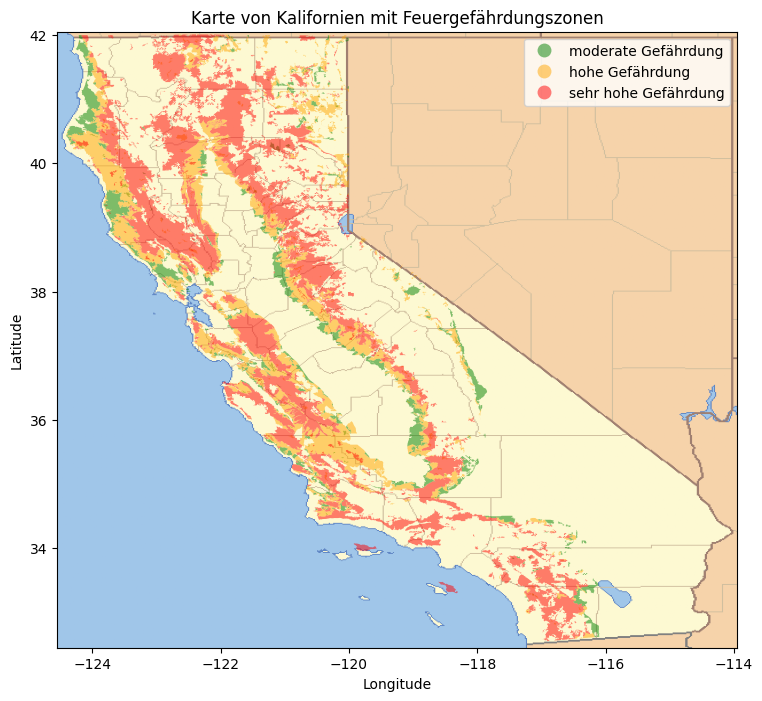

In [348]:
# Plot der Feuergefährdungszonen mit Karte von Kalifornien
fig, ax = plt.subplots(figsize=(10,8))

gdf_wgs84.plot(ax=ax, alpha=0.5, column='FHSZ', legend=True,cmap=cmap, categorical=True)
california_img = plt.imread(filename)
axis = -124.55, -113.95, 32.45, 42.05
plt.axis(axis)
plt.imshow(california_img, extent=axis)

# Legende
leg = ax.get_legend()
for text, label in zip(leg.get_texts(), gefahr.values()):
    text.set_text(label)
    
# Beschriftung
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Karte von Kalifornien mit Feuergefährdungszonen')
plt.show()

Die roten Flecken auf der Karte deuten auf eine sehr hohe Feuergefährdung hin. In den grünen Zonen ist die Gefahr moderat und in den orangenen Zonen hoch. 

Die Zonen mit hoher Gefahr stimmen mit den Waldbränden seit 2000 überein: [Feuer in Kalifornien: Drei Gründe, warum Waldbrände dort so häufig sind - DER SPIEGEL](https://www.spiegel.de/wissenschaft/natur/feuer-in-kalifornien-drei-gruende-warum-waldbraende-dort-so-haeufig-sind-a-1238116.html), Stand 1.5.24

Im oben genannten Artikel sind zugleich die Grüne erklärt wie der Santa-Ana Wind. Die Trockenheit, die diese Winde verursacht gepaart mit der dichten Besiedlung und grünen Vegetation in den Regionen führt vermehrt zu Bränden. 

In [349]:
gdf_vertex_count10 = np.round(np.log10(gdf['vertex_count']), 0)
gdf_vertex_count10.describe()

count    1507.000000
mean        2.803583
std         0.669909
min         1.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         5.000000
Name: vertex_count, dtype: float64

Da aus der Aufgabenstellung nicht ersichtlich ist, welcher Log-Scale angewandt werden soll, wird nachfolgend nochmals die Grafik zum Logarithmus 10 dargestellt. Auch hier ist die Interpretation ähnlich. Man erkennt, dass die Polynome viele Ecken haben. Die x-Achse geht bis $10^5$. 

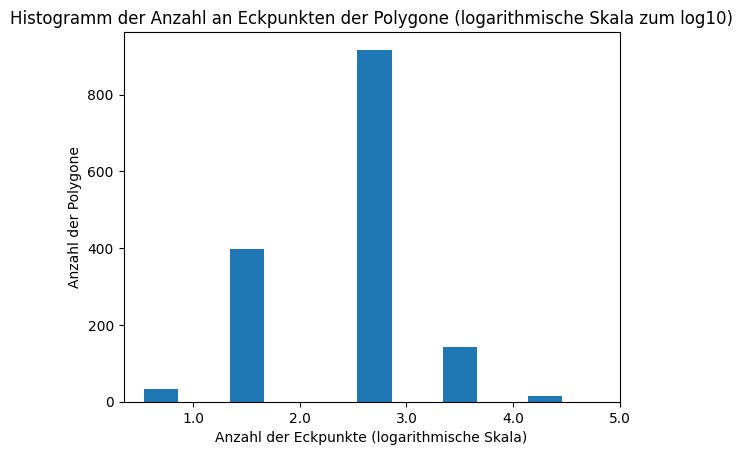

In [350]:
# Histogramm der Anzahl an Eckpunkten mit logarithmischer x-Achse
n, bins, patches = plt.hist(gdf_vertex_count10, bins=int(gdf_vertex_count.max()-gdf_vertex_count.min()), rwidth=0.8)
plt.xlabel('Anzahl der Eckpunkte (logarithmische Skala)')
plt.ylabel('Anzahl der Polygone')
plt.title('Histogramm der Anzahl an Eckpunkten der Polygone (logarithmische Skala zum log10)')

# Anpassen der x-Achsen-Markierungen
plt.xticks(np.arange(min(bins) + 0.5, max(bins)+1, 1), np.arange(min(bins), max(bins)+1, 1))

plt.show()

In [351]:
gc.collect()

11471

##### b) Der Hauptdatensatz, der nach der Bearbeitung von Teil A vorliegt, ist um die in Teilaufgabe a) eingelesenen Feuergefährdungszonen zu erweitern. Zu diesem Zweck soll festgestellt werden, ob und ggf. in welcher Feuergefährdungszone die Longitude-Latitude-Paare der einzelnen Zeilen liegen. Das Resultat ist in der neuen Spalte fire_zone abzuspeichern. Liegt ein Longitude-Latitude-Paar in keiner Feuergefährdungszone, so ist als Wert 0 einzutragen. Liegt ein Longitude-Latitude-Paar in mehr als einer Feuergefährdungszone, so ist eine aktuariell angemessene Lösungsstrategie zu diesem Problem durchzuführen. Schließlich soll das Ergebnis überprüft werden, indem ein geeigneter Scatter-Plot der Daten erzeugt wird.

*Hinweis: Gegebenenfalls sind die Referenzkoordinatensysteme der Polygone und der Longitude-Latitude-Paare zu synchronisieren. Mögliche Code-Schnipsel hierzu sind für Python und R in Anhang 1 angegeben.*

<u>Lösungsansatz</u>

In [352]:
df.head()

,latitude,longitude,housing_median_age,population,median_income,median_house_value,ocean_proximity,county_name,sample,rooms_per_house
0,32.54,-117.04,7,1187,1.2667,67500,NEAR OCEAN,San Diego,C,3.326241
1,32.55,-117.09,8,4797,3.9583,144400,NEAR OCEAN,San Diego,C,5.550552
2,32.55,-117.06,5,3284,1.4384,108800,NEAR OCEAN,San Diego,A,3.774005
3,32.55,-117.04,15,2511,1.6348,93200,NEAR OCEAN,San Diego,A,3.404321
4,32.56,-117.12,20,1819,2.9286,257700,NEAR OCEAN,San Diego,A,4.507143


In [353]:
df.shape

(20640, 10)

In unten stehendem Code konvertieren wir zunächst den DataFrame df in einen GeoDataFrame gdf_points, indem wir Punktgeometrien aus den Spalten Längen- und Breitengrad erstellen. Dann wird als CRS das CRS des Shapefiles angewandt. Zum Joinen müssen beide Files das gleiche CRS hinterlegt haben. Im Normalfall gleicht man immer an das Referenzsystem des Shapefiles an. Anschließend führen wir einen räumlichen Join zwischen gdf_points und gdf mit der Funktion sjoin durch. Nach der räumlichen Verknüpfung behandeln wir den Fall, dass ein Punkt in mehreren Polygonen liegt, indem wir nur die erste Übereinstimmung beibehalten. Schließlich wird das Ergebnis der räumlichen Verknüpfung auf der Grundlage des Indexes wieder mit dem ursprünglichen DataFrame df zusammengeführt und die nicht benötigten Spalten werden gelöscht. Dadurch erhalten wir den um die Spalte "fire_zone" angereicherten Datensatz df, der nun den Namen joined_gdf trägt.

In [354]:
df_converted = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude))
df_converted.set_crs(epsg=4326, inplace=True)
# wechsle das Referenzkoordinatensystem 
df_converted = df_converted.to_crs(epsg=3857)

In [355]:
df_converted.head()

,latitude,longitude,housing_median_age,population,median_income,median_house_value,ocean_proximity,county_name,sample,rooms_per_house,geometry
0,32.54,-117.04,7,1187,1.2667,67500,NEAR OCEAN,San Diego,C,3.326241,POINT (-13028833.202 3834404.624)
1,32.55,-117.09,8,4797,3.9583,144400,NEAR OCEAN,San Diego,C,5.550552,POINT (-13034399.177 3835725.188)
2,32.55,-117.06,5,3284,1.4384,108800,NEAR OCEAN,San Diego,A,3.774005,POINT (-13031059.592 3835725.188)
3,32.55,-117.04,15,2511,1.6348,93200,NEAR OCEAN,San Diego,A,3.404321,POINT (-13028833.202 3835725.188)
4,32.56,-117.12,20,1819,2.9286,257700,NEAR OCEAN,San Diego,A,4.507143,POINT (-13037738.762 3837045.899)


In [356]:
# Spatial join
joined_gdf = gpd.sjoin(df_converted, gdf, how='left', predicate='within')

# Erstelle'fire_zone' Spalte
joined_gdf['fire_zone'] = joined_gdf['FHSZ'].fillna(0)

# Check für mehr als ein Polygon
counts = joined_gdf.groupby(joined_gdf.index).size()
multiple_polygons = counts[counts > 1].index

# Ausgabe, der markierten Zeilen
for point_idx in multiple_polygons:
    poly_idxs = joined_gdf.loc[point_idx, 'index_right']
    print(f"Point at index {point_idx} is in multiple polygons: {list(poly_idxs)}")
    #joined_gdf.drop(joined_gdf.loc[joined_gdf.index == point_idx].index[1:], inplace=True)
    
print(f"Es gibt {len(multiple_polygons)} Konflikte")

Point at index 1165 is in multiple polygons: [364.0, 912.0]
Point at index 1337 is in multiple polygons: [365.0, 889.0]
Point at index 1680 is in multiple polygons: [4.0, 370.0, 912.0]
Point at index 1725 is in multiple polygons: [375.0, 912.0]
Point at index 11712 is in multiple polygons: [98.0, 459.0]
Point at index 12141 is in multiple polygons: [119.0, 495.0]
Point at index 13136 is in multiple polygons: [166.0, 555.0]
Point at index 13161 is in multiple polygons: [169.0, 555.0]
Point at index 14294 is in multiple polygons: [556.0, 1105.0]
Point at index 16783 is in multiple polygons: [574.0, 1125.0]
Point at index 17339 is in multiple polygons: [584.0, 1125.0]
Point at index 17340 is in multiple polygons: [584.0, 1125.0]
Point at index 18001 is in multiple polygons: [638.0, 1132.0]
Point at index 18169 is in multiple polygons: [610.0, 1139.0]
Point at index 18209 is in multiple polygons: [609.0, 1174.0]
Point at index 18354 is in multiple polygons: [617.0, 1174.0]
Point at index 1

In [357]:
multiple_polygons

Index([ 1165,  1337,  1680,  1725, 11712, 12141, 13136, 13161, 14294, 16783,
       17339, 17340, 18001, 18169, 18209, 18354, 18579, 18845, 19329, 19445,
       19478, 19487, 19523, 19606, 19886, 19896, 19907, 19921, 20077, 20286,
       20539],
      dtype='int64')

In [358]:
del df_converted

Für alle Zeilen mit mehr als einem Polygon (sie sind in multiple_polygon gespeichert), muss nun eine Strategie erstellt werden.

Im Folgenden wird sich dazu entschieden, diesen Zeilen stets den höchsten bei ihnen vorkommenden FHSZ Wert zu geben, liegt eine Zeile also beispielsweise in 2 Polygonen, einmal mit FHSZ 1 und einmal 2, so erhält sie den Wert 2. Diese Strategie wird angewandt, um vom worst case auszugehen. 

Um dies erfolgreich umzusetzen, wird der Datensatz anhand der FHSZ sortiert, dann wird nur der erste index im Falle von Duplikaten behalten. Die fehlenden FHSZ werden mit 0 aufgefüllt und nur die ursprünglichen Spalten + die neu kreierte fire_zone behalten.

In [359]:
joined_gdf.sort_values(by='FHSZ', ascending=False, inplace=True)

# drop doppelten index -> behalte den höheren FHSZ
joined_gdf = joined_gdf[~joined_gdf.index.duplicated(keep='first')]

joined_gdf['fire_zone'] = joined_gdf['FHSZ'].fillna(0)
columns_to_keep = ['fire_zone'] + list(df.columns)

# Behalte nur die ursprünglichen Spalten + fire_zone
joined_gdf = joined_gdf[columns_to_keep]
joined_gdf.sort_index(inplace=True)

In [360]:
joined_gdf.shape # Die Anzahl an Zeilen stimmt mit der vorherigen Anzahl überein

(20640, 11)

In [361]:
joined_gdf.head()

,fire_zone,latitude,longitude,housing_median_age,population,median_income,median_house_value,ocean_proximity,county_name,sample,rooms_per_house
0,0.0,32.54,-117.04,7,1187,1.2667,67500,NEAR OCEAN,San Diego,C,3.326241
1,0.0,32.55,-117.09,8,4797,3.9583,144400,NEAR OCEAN,San Diego,C,5.550552
2,0.0,32.55,-117.06,5,3284,1.4384,108800,NEAR OCEAN,San Diego,A,3.774005
3,0.0,32.55,-117.04,15,2511,1.6348,93200,NEAR OCEAN,San Diego,A,3.404321
4,0.0,32.56,-117.12,20,1819,2.9286,257700,NEAR OCEAN,San Diego,A,4.507143


In [362]:
# Sichere den updated dataframe mit 'fire_zone' Spalte
joined_gdf.to_csv(os.path.join(models_path, f'updated_data.csv'), index=False)

In [363]:
gefahr2 = {0: 'keine Gefährdung',
    1: 'moderate Gefährdung',
         2: 'hohe Gefährdung',
         3: 'sehr hohe Gefährdung'}

In [364]:
cmap2 = ListedColormap(['green', 'yellow', 'orange', 'red'])

Zur Darstellung als Scatterplot auf der Karte wird erneut das Referenzsystem EPSG 4326 genutzt:

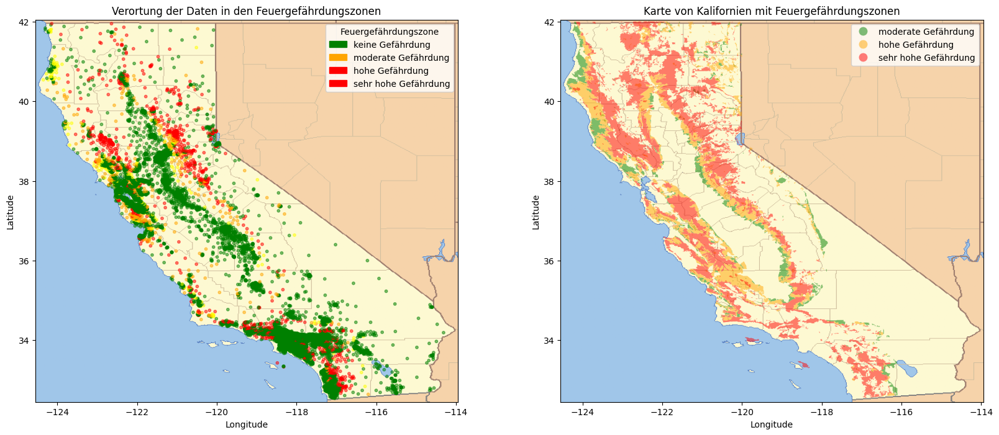

In [365]:
# Plot der Feuergefährdungszonen mit Karte von Kalifornien
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))  

gdf_wgs84.plot(ax=ax2, alpha=0.5, column='FHSZ', legend=True, cmap=cmap, categorical=True)
california_img = plt.imread(filename)
axis = (-124.55, -113.95, 32.45, 42.05)
ax2.imshow(california_img, extent=axis)

# Scatterplot hinzufügen
scatter = ax1.scatter(df['longitude'], df['latitude'], c=joined_gdf['fire_zone'],cmap=cmap2, alpha=0.5, s=10)

# Legende
leg = ax2.get_legend()
for text, label in zip(leg.get_texts(), gefahr.values()):
    text.set_text(label)
    
patches = [mpatches.Patch(color=cmap(i), label=gefahr2[i]) for i in range(len(gefahr2))]
# Hinzufügen der benutzerdefinierten Legende zum Plot
ax1.legend(handles=patches, title='Feuergefährdungszone', loc='upper right', frameon=True)

# california_img = plt.imread(filename)
# axis = (-124.55, -113.95, 32.45, 42.05)
ax1.imshow(california_img, extent=axis)

# Beschriftung
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_title('Karte von Kalifornien mit Feuergefährdungszonen')
ax1.set_xlabel('Longitude')  
ax1.set_ylabel('Latitude')  
ax1.set_title('Verortung der Daten in den Feuergefährdungszonen')  
plt.show()

Zum Vergleich wurden zwei Graphen geplottet: links der Scatterplot mit den Punkten aus dem Datensatz, eingeteilt in die Feuergefährdungszonen bzw. "keine Gefährdung", wenn der Punkt als Zone eine 0 hat; und rechts der Feuergefährdungsgraph von oben. Die Null im Datensatz indiziert, dass hier keine Zeile im Shapefile als Gegenpart gefunden wurde; sie wurde im linken Graph der Kategorie "keine Gefährdung" zugeordnet.

Der linke Graph zeigt insgesamt einige grüne Punkte, die in Zonen mit "keiner Gefährdung" liegen. Gelbe, orange und rote Punkte markieren Datenpunkte, zu denen die Feuergefahrenzone aus dem Shapefile gejoint werden konnte. Im Vergleich zum Plot der Feuergefährdungszonen auf der rechten Seite, der eine Kopie des obigen Plots darstellt, zeigt sich, dass die Zuordnung analog ist. Die Zonen mit grünen Punkten blieben oben frei, da hier keine Punkte im Shapefile gefunden wurden.

In Bereichen mit moderater oder hoher Gefährdung (gelbe und orange Punkte) sind nur wenige Datenpunkte. Der Datensatz zeigt einige Punkte in Gebieten mit einer sehr hohen Gefährdung, wie beispielsweise im Westen oder im Landesinneren.

### Aufgabe C-2: Einsatz von Clustering bei der Tarifierung von Feuerversicherung [Lernziele 4.2, 5.2 & 6; 13 Punkte] <a class="anchor" id="unterabschnitt-3-2"></a>
##### a) Um den aus Aufgabe C-1 erhaltenen Datensatz zu clustern, ist der k-Means-Algorithmus anzuwenden. In das Clustering sollen lediglich die Merkmale latitude, longitude, median_house_value und fire_zone einfließen. Die Wahl der Cluster-Anzahl ist (etwa durch eine geeignete Heuristik) zu begründen. Ein Scatter-Plot zur Visualisierung der Cluster ist zu erzeugen.

<u>Lösungsansatz</u>

Das **K-Means-Clustering** ist eine Methode zum Auffinden von Clustern und Clusterzentren in einem
Satz nicht gelabelter Daten. Man wählt die gewünschte Anzahl von Clusterzentren, z.B. 3, und das K-means-Verfahren verschiebt die Zentren iterativ, um die Gesamtvarianz innerhalb des Clusters zu minimieren.
Bei einem anfänglichen Satz von Zentren führt der Kmeans Algorithmus abwechselnd die beiden Schritte:
* Für jedes Zentrum wird die Teilmenge der Trainingspunkte (sein Cluster) identifiziert die näher an ihm liegt als jedes andere Zentrum;
* Die Mittelwerte der einzelnen Merkmale für die Datenpunkte in jedem Cluster werden berechnet, und dieser Mittelwertvektor wird zum neuen Zentrum für diesen Cluster.

Diese beiden Schritte werden bis zur Konvergenz iteriert. Typischerweise sind die anfänglichen Zentren 3 zufällig ausgewählte Beobachtungen aus den Trainingsdaten. 

Quelle: T. Hastie, R.Tibshirani, J. Friedman "The Elements of Statistical Learning: Data Mining, Inference and Prediction", In: Springer Science+Business, 2nd Edition (2017), S.460


In [22]:
# read data
joined_gdf = pd.read_csv(os.path.join(models_path, f'updated_data.csv'))
joined_gdf.head()

,fire_zone,latitude,longitude,housing_median_age,population,median_income,median_house_value,ocean_proximity,county_name,sample,rooms_per_house
0,0.0,32.54,-117.04,7,1187,1.2667,67500,NEAR OCEAN,San Diego,C,3.326241
1,0.0,32.55,-117.09,8,4797,3.9583,144400,NEAR OCEAN,San Diego,C,5.550552
2,0.0,32.55,-117.06,5,3284,1.4384,108800,NEAR OCEAN,San Diego,A,3.774005
3,0.0,32.55,-117.04,15,2511,1.6348,93200,NEAR OCEAN,San Diego,A,3.404321
4,0.0,32.56,-117.12,20,1819,2.9286,257700,NEAR OCEAN,San Diego,A,4.507143


In [23]:
# Auswahl der relevanten Merkmale
data = joined_gdf[['latitude', 'longitude', 'median_house_value', 'fire_zone']]
kmeans = []
elbow = []
silhouettes = []
number_clusters = []
for i in range(10):
    temp1, temp2 = get_kmeans(data, i+2)
    kmeans.append(data.merge(temp1['cluster']))
    elbow.append(temp2)
    silhouettes.append(silhouette_score(data, data['cluster']))
    number_clusters.append(i+2)

##### Silhouetten-Methode

Die Silhouettenmethode ist ein Ansatz zur Beurteilung der Qualität der Clusterbildung, insbesondere um die optimale Anzahl von Clustern in einem Datensatz zu ermitteln. Sie wird oft in Verbindung mit Clustering-Algorithmen wie K-Means verwendet. Die Silhouettenanalyse misst, wie ähnlich ein Objekt zu seinem eigenen Cluster (Kohäsion) im Vergleich zu anderen Clustern (Separation) ist.

Für jeden Datenpunkt wird der Silhouettenkoeffizient berechnet, der auf zwei Distanzmaßen basiert:

* Die durchschnittliche Distanz eines Datenpunktes zu allen anderen Punkten im gleichen Cluster (a). Man berechnet für jede Beobachtung $i$ den Ausdruck

$$a(i) = \frac{1}{|C_k-1|}\sum_{j\in C_k, i\neq j}d(i,j),$$

* Die durchschnittliche Distanz eines Datenpunktes zu allen Punkten im nächsten Cluster, zu dem der Punkt nicht gehört (b).  Es wird die sog. _mittlere Unterschiedlichkeit_ definiert, die die _kleinste mittlere Distanz zu anderen Clustern_ bezeichnet:

$$b(i) = \text{min}_{l\neq k}\frac{1}{|C_l|}\sum_{j\in C_l}d(i,j).$$


Damit und der Definition, dass gelten möge $|C_k|=1\Rightarrow s(i)=0$, erhalten wir

$$s(i) = \frac{b(i)-a(i)}{\text{max}\{a(i),b(i)\}}, \quad \text{wenn} |C_k|>1,$$

dies ist der _Silhouetten-Wert_.

Das Kriterium lautet dann formal $\text{SC} = \max_k \hat{s}(k)$, wobei $\hat{s}(k) = \frac{1}{N}\sum_i s(i)$ gerade den Mittelwert der $s(i)$ für eine gegebene Anzahl Cluster $k$ bezeichnet.

Der Wert von $s$ liegt zwischen -1 und 1, wobei:

* Ein Wert nahe +1 bedeutet, dass der Datenpunkt gut zu seinem Cluster passt und weit von anderen Clustern entfernt ist.
* Ein Wert von 0 bedeutet, dass der Datenpunkt auf der Grenze zwischen zwei Clustern liegt.
* Ein Wert nahe -1 bedeutet, dass der Datenpunkt möglicherweise dem falschen Cluster zugewiesen wurde.
Um die optimale Clusteranzahl zu bestimmen, führt man den K-Means-Algorithmus (oder einen anderen Clustering-Algorithmus) für verschiedene Clusteranzahlen durch und berechnet den durchschnittlichen Silhouettenkoeffizienten für alle Datenpunkte bei jeder Clusteranzahl. Die Anzahl der Cluster, die den höchsten durchschnittlichen Silhouettenkoeffizienten ergibt, wird als die optimale Clusteranzahl angesehen.

Die Silhouettenmethode ist besonders nützlich, weil sie eine visuelle Darstellung der Konsistenz innerhalb der Cluster bietet und dabei hilft, eine fundierte Entscheidung über die Anzahl der zu bildenden Cluster zu treffen. Sie kann auch dazu verwendet werden, die Stärken und Schwächen verschiedener Clustering-Algorithmen zu vergleichen.

Quellen:
* https://en.wikipedia.org/wiki/Silhouette_(clustering), Stand 2.5.24
* Skript: ADS Immersion, s. 690 f. 

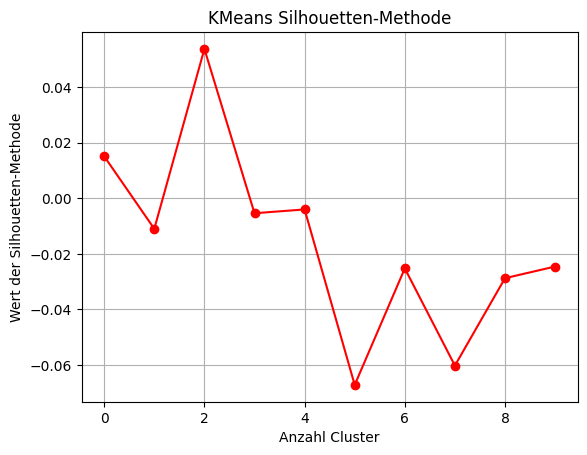

In [24]:
# Ausgabe des Plots der Silhoutten-Scores
plt.plot(silhouettes,'ro-', label="Silhouette")
plt.grid(True)
plt.title("KMeans Silhouetten-Methode")
plt.xlabel('Anzahl Cluster')
plt.ylabel('Wert der Silhouetten-Methode')
plt.show()

Die Silhouettenmethode schlägt folglich 2 Cluster vor. 

##### Elbow-Methode

Die Elbow-Methode ist eine Heuristik zur Bestimmung der optimalen Anzahl von Clustern in einem Datensatz. Sie basiert auf der Beobachtung der kumulierten Varianz, die durch die Clusterzugehörigkeit erklärt wird, und sucht den Punkt, an dem die Zunahme der erklärten Varianz bei Hinzufügung weiterer Cluster deutlich abnimmt – der Punkt, an dem die Kurve einen "Ellenbogen" bildet. Dieses Vorgehen ähnelt der Hauptkomponentenanalyse, wobei das Verhältnis von intra- zu extra-Cluster-Varianz betrachtet wird.

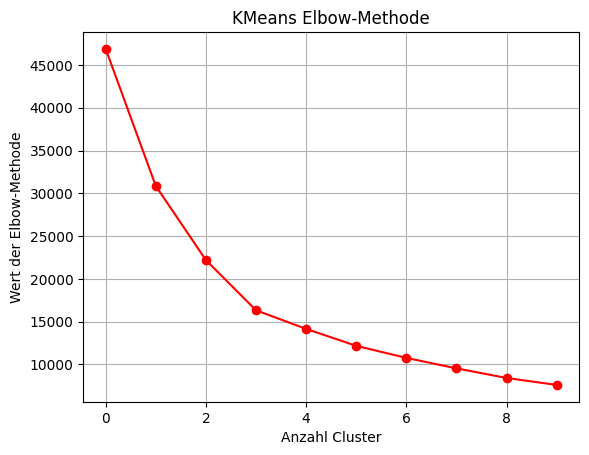

In [25]:
#Ellbow:
plt.plot(elbow,'ro-', label="Elbow")
plt.grid(True)
plt.title("KMeans Elbow-Methode")
plt.xlabel('Anzahl Cluster')
plt.ylabel('Wert der Elbow-Methode')
plt.show()

Die Ellbow Methode liefert als Ergebnis 2 oder 3 Cluster als optimalen Wert zu nutzen. 

##### Die GAP-Statistik
Die Gap-Statistik ist eine Methode zur Bestimmung der optimalen Clusteranzahl in einem Datensatz. Sie basiert auf dem Vergleich der inneren Clusterstreuung (logWK) mit der Streuung, die bei gleichmäßig verteilten Daten erwartet würde. Die optimale Clusteranzahl wird dort angenommen, wo die Differenz (der "Gap") zwischen den beiden Kurven am größten ist. Diese Methode ist auch in der Lage, effektiv zu erkennen, wenn die Daten am besten durch einen einzelnen Cluster repräsentiert werden, was eine Herausforderung für viele andere Methoden darstellt. Die Gap-Statistik verwendet eine formale Regel, die unter Berücksichtigung der Standardabweichung der Simulationen die Stelle identifiziert, an der die Gap-Kurve maximiert wird, um die optimale Anzahl von Clustern zu schätzen.

Quelle: T. Hastie, R.Tibshirani, J. Friedman "The Elements of Statistical Learning: Data Mining, Inference and Prediction", In: Springer Science+Business, 2nd Edition (2017), S.519 f.

In [26]:
# Auswahl der relevanten Merkmale
features = joined_gdf[['latitude', 'longitude', 'median_house_value', 'fire_zone']]

Optimale Clusterzahl laut Gap-Statistik:  10


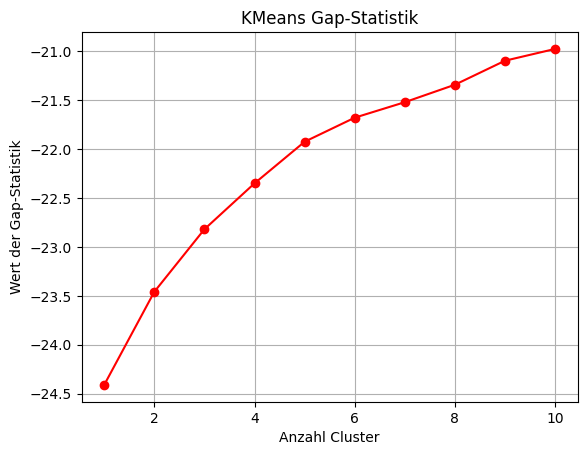

In [27]:
k, gapdf = optimalK(features, nrefs=3, maxClusters=11)
print("Optimale Clusterzahl laut Gap-Statistik: ", k)

plt.plot(gapdf.clusterCount, gapdf.gap,'ro-')
plt.grid(True)
plt.title("KMeans Gap-Statistik")
plt.xlabel('Anzahl Cluster')
plt.ylabel('Wert der Gap-Statistik')
plt.show()

Die GAP-Statistik liefert keine sinnvollen ergebnisse, das kann mehrere Gründe haben: 
* Wenn die Cluster im Datensatz stark unterschiedliche Varianzen aufweisen, kann K-Means Schwierigkeiten haben, diese korrekt zu identifizieren, da es die Varianz innerhalb der Cluster minimiert. Dies kann dazu führen, dass die Gap-Statistik weiterhin eine Erhöhung der Clusteranzahl vorschlägt, um die Varianz zu reduzieren.
* Ähnlich wie bei unterschiedlicher Varianz kann K-Means und damit die Gap-Statistik Probleme haben, wenn Cluster unterschiedlich dicht sind.

Quelle: https://towardsdatascience.com/k-means-clustering-and-the-gap-statistics-4c5d414acd29, Stand 2.5.24

Folglich werdne grafisch also die 2 Cluster aus der Silhouetten methode und die 3 Cluster aus der Elbow-Methode getestet. 

##### Visualisierung von k=2

In [28]:
# Normalisierung der Merkmale
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Anwendung des k-Means-Algorithmus mit der gewählten Anzahl von Clustern
kmeans = KMeans(n_clusters=2, init="k-means++", n_init=10, max_iter=300, random_state=seed)
start_time_KMeans = time.time() 
clusters = kmeans.fit_predict(scaled_features)
laufzeit_KMeans = time.time() - start_time_KMeans

# Hinzufügen der Cluster-Informationen zum ursprünglichen DataFrame
joined_gdf['cluster'] = clusters

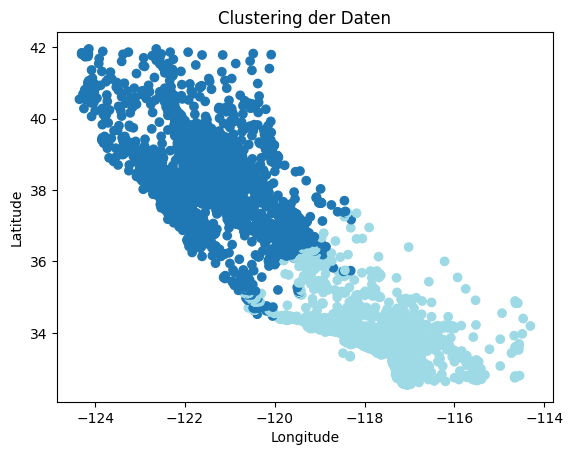

In [29]:
# Scatter-Plot zur Visualisierung der Cluster
plt.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster'], cmap='tab20')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clustering der Daten')
plt.show()

##### Visualisierung von k=3

In [30]:
# Anwendung des k-Means-Algorithmus mit der gewählten Anzahl von Clustern
kmeans = KMeans(n_clusters=3, init="k-means++", n_init=10, max_iter=300, random_state=seed)
clusters = kmeans.fit_predict(scaled_features)

# Hinzufügen der Cluster-Informationen zum ursprünglichen DataFrame
joined_gdf['cluster'] = clusters

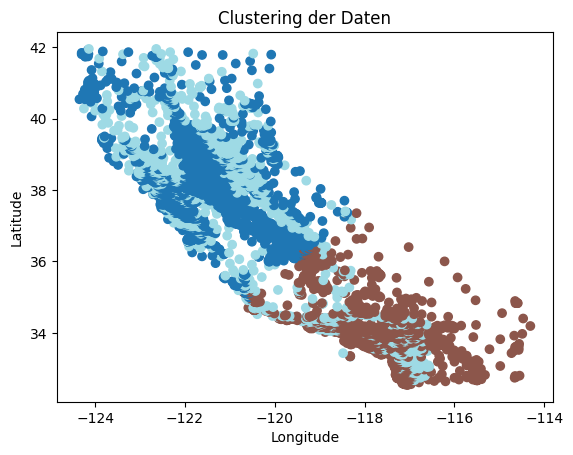

In [31]:
# Scatter-Plot zur Visualisierung der Cluster
plt.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster'], cmap='tab20')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clustering der Daten')
plt.show()

Bei drei Clustern sieht man eine deutliche Überlappung der Cluster und sie sind nicht wirklich getrennt. Beim Algorithmus mit $n=2$ Cluster hingegen können diese klar voneinander getrennt werden, in "Süd" und "Nord". Diese zwei Cluster können als Proxy für die Hauspreisunterschiede stehen. Das dritte Cluster allerdings arbeitet die Feuergefährdungszonen heraus. Vergleicht man die hellblauen Punkte mit obiger Grafik sieht man eine Übelappung. Folglich wird sich für den Clusteralgorithmus mit 3 Clustern entschieden. 

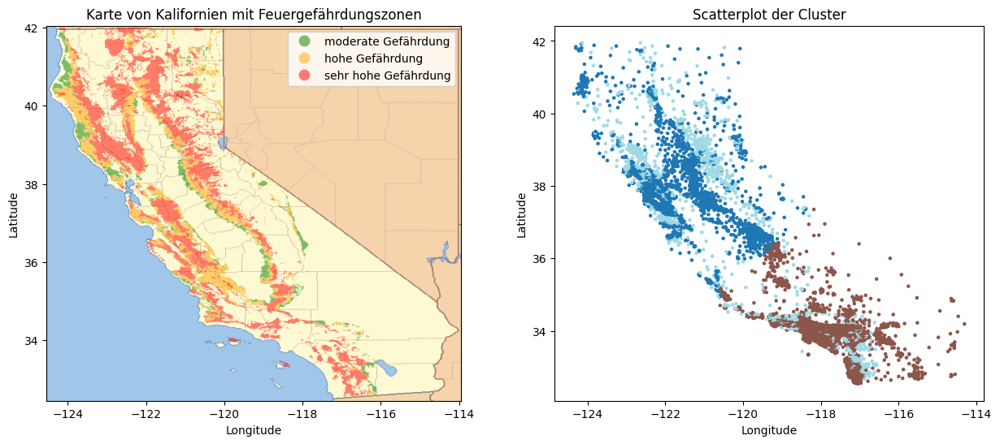

In [36]:
# Plot der Feuergefährdungszonen mit Karte von Kalifornien
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))  

gdf_wgs84.plot(ax=ax1, alpha=0.5, column='FHSZ', legend=True, cmap=cmap, categorical=True)
california_img = plt.imread(filename)
axis = (-124.55, -113.95, 32.45, 42.05)
ax1.imshow(california_img, extent=axis)

# Scatterplot hinzufügen
scatter = ax2.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster'], cmap='tab20', alpha=1., s=5)

# Legende
leg = ax1.get_legend()
for text, label in zip(leg.get_texts(), gefahr.values()):
    text.set_text(label)

# Beschriftung
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Karte von Kalifornien mit Feuergefährdungszonen')
ax2.set_xlabel('Longitude')  
ax2.set_ylabel('Latitude')  
ax2.set_title('Scatterplot der Cluster')  
plt.show()

##### b) Um den aus Aufgabe C-1 erhaltenen Datensatz zu clustern, ist das Verfahren Agglomerative Hierarchical Clustering anzuwenden. In das Clustering sollen lediglich die Merkmale latitude, longitude, median_house_value und fire_zone einfließen. Die Wahl der Cluster-Anzahl ist (etwa durch eine geeignete Heuristik) zu begründen. Ein Scatter-Plot zur Visualisierung der Cluster ist zu erzeugen.

<u>Lösungsansatz</u>

Agglomerative Clustering-Algorithmen sind eine Methode des maschinellen Lernens, die zur Gruppierung von Datenpunkten in einem Datensatz verwendet wird, ohne dass dabei vorausgesetzt wird, wie viele Cluster gebildet werden sollen. Dieser Ansatz gehört zur Familie der hierarchischen Clustering-Methoden und funktioniert nach einem Bottom-up-Prinzip, bei dem jedes Datenobjekt zunächst als eigenständiger Cluster betrachtet wird. Im Laufe des Verfahrens werden die Cluster schrittweise zusammengeführt, bis alle Datenpunkte in einem einzigen Cluster vereinigt sind oder ein bestimmtes Abbruchkriterium erreicht ist.

Die Agglomerativen Algorithmen beginnen damit, dass jede Beobachtung einen einzelnen Cluster repräsentiert. In jedem der $N-1$ Schritte werden die beiden am wenigsten unähnlichen Cluster zu einem einzigen Cluster zusammengeführt, wodurch es auf der nächsten höheren Ebene einen Cluster weniger gibt. Daher muss ein Maß für die Unähnlichkeit zwischen zwei Clustern (Gruppen von Beobachtungen) definiert werden.
Wenn $G$ und $H$ zwei solche Gruppen repräsentieren, wird die Unähnlichkeit $d(G,H)$ zwischen $G$ und $H$ aus der Menge der paarweisen Beobachtungsunähnlichkeiten $d_{ii'}$ berechnet, wobei ein Mitglied des Paares $i$ in $G$ und das andere $i'$ in $H$ ist.

Das Single Linkage (SL) agglomerative Clustering nimmt die Zwischengruppenunähnlichkeit als die des nächsten (am wenigsten unähnlichen) Paares an: $d_{SL}(G,H) = min_{i∈G, i'∈H} d_{ii'}$. Dies wird auch oft als die nearest-neighbor-Technik bezeichnet.

Das Complete Linkage (CL) agglomerative Clustering (furthest-neighbor-Technik) nimmt die Zwischengruppenunähnlichkeit als die des entferntesten (am meisten unähnlichen) Paares an: $d_{CL}(G,H) = max_{i∈G, i'∈H} d_{ii'}$.

Die Group Average (GA) Clustering verwendet die durchschnittliche Unähnlichkeit zwischen den Gruppen: $d_{GA}(G,H) = (\frac{1}{N_GN_H}) \sum_{i∈G} \sum_{i'∈H} d_{ii'}$, wobei $N_G$ und $N_H$ die jeweilige Anzahl von Beobachtungen in jeder Gruppe sind.

Im Kontext des agglomerativen Clusterings sind die oben genannten drei Clustering die am häufigsten verwendeten, zusätzlich wurde im Kurs CADS Basic noch die centroid Methode vorgestellt. Wenn die Datenunähnlichkeiten $d_{ii'}$ eine starke Tendenz zum Clustering aufweisen, wobei jeder der Cluster kompakt und gut von anderen getrennt ist, produzieren alle drei Methoden ähnliche Ergebnisse.

**Quelle:** T. Hastie, R.Tibshirani, J. Friedman "The Elements of Statistical Learning: Data Mining, Inference and Prediction", In: Springer Science+Business, 2nd Edition (2017), S.523

Der nachfolgende Code wurde hier entnommen: [sklearn.cluster.AgglomerativeClustering — scikit-learn 1.4.2 documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html), Stand 2.5.24

Nachfolgend wurde sich als Kinkage Methode für "Ward" entschieden. Die "ward" Linkage-Methode minimiert die Varianz der Cluster. Dies bedeutet, dass sie versucht, Cluster zu bilden, die eine minimale Streuung oder Varianz innerhalb der Cluster aufweisen. Dies kann dazu beitragen, kompakte und homogene Cluster zu bilden. Die "ward" Linkage-Methode ist besonders nützlich, wenn die Daten unterschiedliche Varianzen in den verschiedenen Dimensionen aufweisen. Die Methode ist auch gut geeignet, wenn die Anzahl der Cluster nicht im Voraus bekannt ist, da sie dazu neigt, Cluster mit ähnlicher Varianz zu bilden.

Um Agglomerative Hierarchical Clustering auf den Datensatz anzuwenden, der die Merkmale latitude, longitude, median_house_value und fire_zone enthält, können wir die Anzahl der Cluster mithilfe des Dendrogramms, bestimmen. Das Dendrogramm zeigt die Hierarchie der Cluster und kann dabei helfen, eine angemessene Anzahl von Clustern auszuwählen.

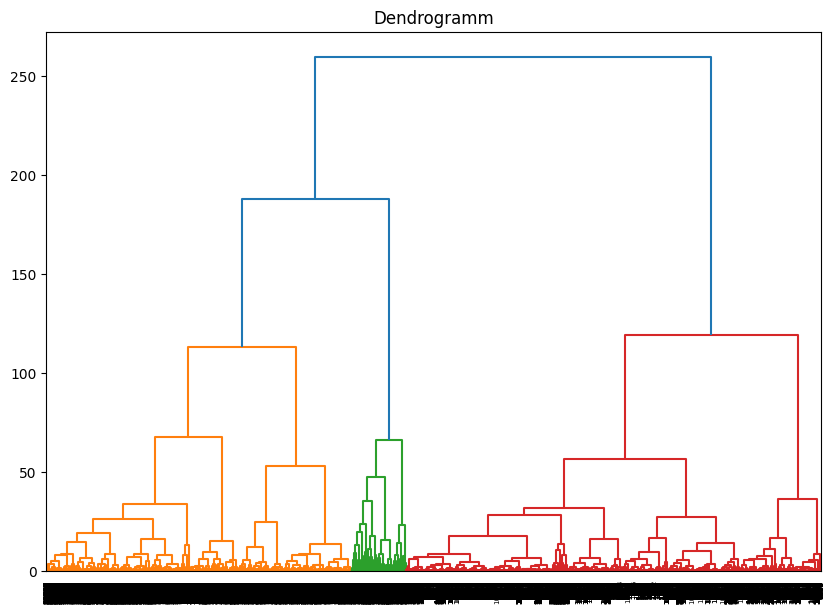

In [37]:
# Visualisierung des Dendrogramms zur Bestimmung der optimalen Clusteranzahl
linked = linkage(scaled_features, 'ward')
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogramm')
plt.show()

Mit einem in Python erstellten Dendrogramm werden die Farben dazu verwendet, die auf der letzten Ebene der hierarchischen Clusterbildung entstandenen Cluster zu repräsentieren. Diese Farben helfen dabei, die Cluster visuell zu unterscheiden. Farbwechsel im Dendrogramm signalisieren demnach die Zusammenführung von zwei oder mehreren zuvor separaten Clustern zu einem neuen Cluster. Diese Änderungen sind an den Punkten im Dendrogramm zu beobachten, an denen die Fusionen auf der Distanzachse bei bestimmten Werten erfolgen.

Demzufolge schlägt das Dendrogramm drei Cluster vor. Es könnten aber auch fünf Cluster modelliert werden. Wie oben erwähnt, muss im agglomerativen Clustering nicht unbedingt eine Anzahl an Clustern wie bei K-Means vorgegeben werden. Man kann diesen Parameter auch auf "None" setzen und stattdessen den Parameter "distance_threshold" entsprechend wählen. Hier ist ein geeigneter Wert zu finden allerdings ohne Wissen über die Daten und ihr Verhalten auch schwierig.

Nachfolgend wurde der Wert auf 150 gesetzt. Das Resultat sind erneut drei Cluster.

In [38]:
# Agglomerative Hierarchical Clustering mit distance_threshold
clustering = AgglomerativeClustering(distance_threshold=150, n_clusters=None, linkage='ward')
clusters = clustering.fit_predict(scaled_features)
len(np.unique(clusters))

3

Als letzte Methode, um die optimale Anzahl an Cluster zu bestimmen wurde die Silhouetten Methode genutzt. Auch sie liefert als Ergebnis 3 Cluster: 

In [39]:
# Bestimmung der optimalen Anzahl von Clustern mit dem Silhouettenkoeffizienten
silhouettes = {}
best_score = -1
best_n_clusters = 0
for n_clusters in range(2,11):
    clustering = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    clusters = clustering.fit_predict(scaled_features)
    silhouette_avg = silhouette_score(scaled_features, clusters)
    silhouettes[n_clusters] = silhouette_avg
    if silhouette_avg > best_score:
        best_score = silhouette_avg
        best_n_clusters = n_clusters

print("Optimale Anzahl von Clustern basierend auf dem Silhouettenkoeffizienten:", best_n_clusters)

Optimale Anzahl von Clustern basierend auf dem Silhouettenkoeffizienten: 3


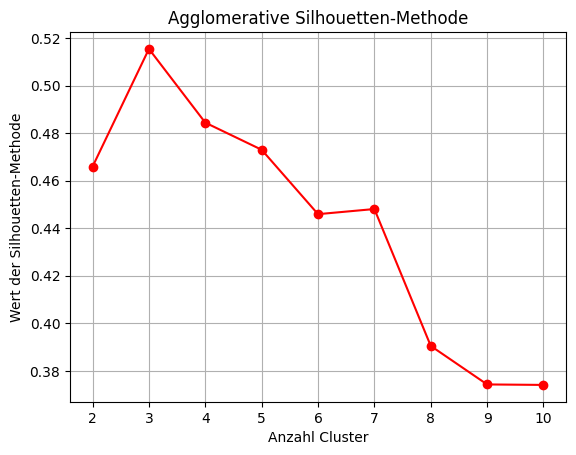

In [40]:
# Ausgabe des Plots der Silhoutten-Scores
x = list(silhouettes.keys())
y= list(silhouettes.values())
plt.plot(x, y,'ro-', label="Silhouette")
plt.grid(True)
plt.title("Agglomerative Silhouetten-Methode")
plt.xlabel('Anzahl Cluster')
plt.ylabel('Wert der Silhouetten-Methode')
plt.show()

Die Silhouettenmethode empfiehlt ebenso 3 Cluster

In [41]:
# Agglomerative Hierarchical Clustering
clustering = AgglomerativeClustering(n_clusters=3, metric='euclidean', memory=None, connectivity=None, compute_full_tree='auto', linkage='ward', distance_threshold=None, compute_distances=False)
start_time_aggCluster = time.time() 
clusters = clustering.fit_predict(scaled_features)
laufzeit_aggCluster = time.time()-start_time_aggCluster
# Hinzufügen der Cluster-Informationen zum ursprünglichen DataFrame
joined_gdf['cluster_agg'] = clusters

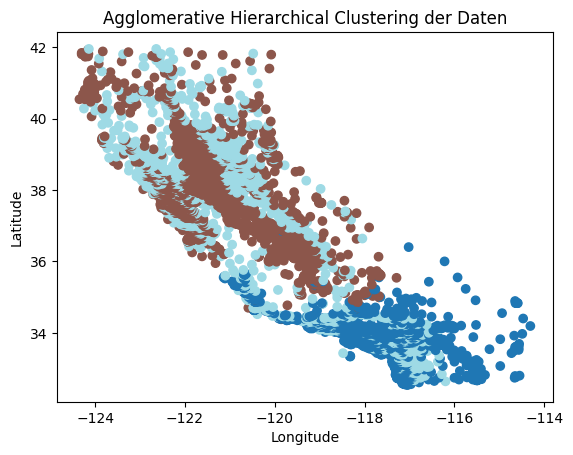

In [42]:
# Scatter-Plot zur Visualisierung der Cluster
plt.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster_agg'] , cmap='tab20')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Agglomerative Hierarchical Clustering der Daten')
plt.show()

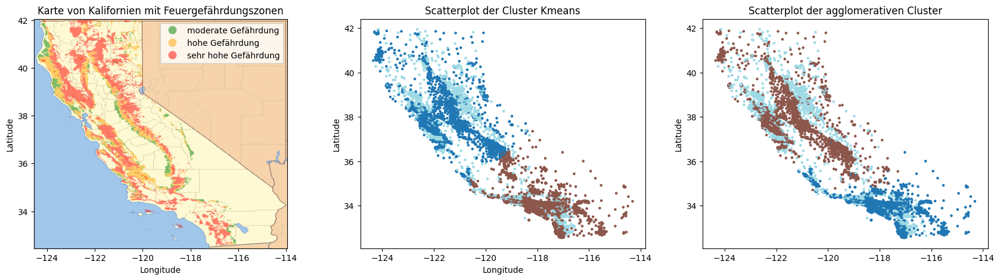

In [43]:
# Plot der Feuergefährdungszonen mit Karte von Kalifornien
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(21, 5)) 

gdf_wgs84.plot(ax=ax1, alpha=0.5, column='FHSZ', legend=True, cmap=cmap, categorical=True)
california_img = plt.imread(filename)
axis = (-124.55, -113.95, 32.45, 42.05)
ax1.imshow(california_img, extent=axis)

# Scatterplot hinzufügen
scatter = ax2.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster'], cmap='tab20', alpha=1., s=5)
scatter = ax3.scatter(joined_gdf['longitude'], joined_gdf['latitude'], c=joined_gdf['cluster_agg'], cmap='tab20', alpha=1., s=5)

# Legende
leg = ax1.get_legend()
for text, label in zip(leg.get_texts(), gefahr.values()):
    text.set_text(label)

# Beschriftung
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.set_title('Karte von Kalifornien mit Feuergefährdungszonen')
ax2.set_xlabel('Longitude')  
ax2.set_ylabel('Latitude')  
ax2.set_title('Scatterplot der Cluster Kmeans')  
ax2.set_xlabel('Longitude')  
ax3.set_ylabel('Latitude') 
ax3.set_title('Scatterplot der agglomerativen Cluster')  
plt.show()

In [ ]:
# Sichere Datensatz
joined_gdf.to_csv(os.path.join(models_path, f'final_data.csv'), index=False)

##### c) Die Clusterings der beiden vorherigen Teilaufgaben sind zu vergleichen, indem auf drei Gemeinsamkeiten oder Unterschiede eingegangen wird.

<u>Lösungsansatz</u>

In [46]:
print(f"Die Laufzeit von KMeans beträgt: {laufzeit_KMeans:.4f} Sekunden")
print(f"Die Laufzeit von agglomerativem Clustern beträgt: {laufzeit_aggCluster:.4f} Sekunden")

Die Laufzeit von KMeans beträgt: 0.0413 Sekunden
Die Laufzeit von agglomerativem Clustern beträgt: 7.7570 Sekunden


Gemeinsamkeiten:
* Beide Methoden sind Verfahren des unüberwachten maschinellen Lernens. Das bedeutet, sie versuchen, Strukturen oder Muster in den Daten zu finden, ohne auf vorher definierte Labels oder Ergebnisse angewiesen zu sein.
* Sowohl K-Means als auch agglomeratives Clustering zielen darauf ab, die Datenpunkte in Gruppen zu segmentieren, sodass die Punkte innerhalb eines Clusters einander ähnlicher sind als Punkte in verschiedenen Clustern.
* Clustern die daten in 3 beziehungsweise eventuell 2 Cluster. Die Cluster sind sehr ähnlich

Unterschiede:
* Die Punkte an den Clusterübergängen werden unterschiedlichen Clustern zugeordnet. Agglomeratives Clustering ist flexibler in Bezug auf die Cluster-Formen, da es verschiedene Distanzmetriken und Linkage-Kriterien verwenden kann, um vielfältige Cluster-Strukturen zu identifizieren. K-Means hingegen neigt dazu, sphärische Cluster zu bilden und funktioniert am besten, wenn die Cluster in etwa gleich groß sind. In Bezug auf die Berechnungskomplexität ist agglomeratives Clustering in der Regel rechenintensiver als K-Means, dies zeigt sich auch an der längerne Laufzeit oben.
* K-Means ist ein zentroid-basiertes Clustering-Verfahren, das bedeutet, es optimiert die Position von Clustermittelpunkten, um die Varianz innerhalb der Cluster zu minimieren. Agglomeratives Clustering hingegen ist ein hierarchisches Clustering-Verfahren, das Cluster schrittweise durch das Zusammenführen von Datenpunkten oder Gruppen von Datenpunkten auf der Grundlage ihrer Distanz bildet.
* Bei K-Means muss die Anzahl der Cluster im Voraus festgelegt werden. Im Gegensatz dazu baut agglomeratives Clustering eine Hierarchie von Clustern auf und benötigt keine vorherige Festlegung der Clusteranzahl, allerdings ist oft ein Kriterium oder eine Heuristik notwendig, um die passende Anzahl von Clustern aus dem Dendrogramm zu bestimmen.



##### d) Ein Ansatz, wie die von einem der Clustering-Verfahren erzeugten Cluster bei der Tarifierung von Feuerversicherung in Kalifornien eingesetzt werden können, ist in zwei bis drei Sätzen zu erläutern.

<u>Lösungsansatz</u>

Durch die Anwendung von Clustering-Verfahren können identifizierte Cluster genutzt werden, um das Risiko von Feuerversicherungen in Kalifornien genauer zu bewerten. Dabei werden regionale Unterschiede in der Feuergefährdung, geografische Lage und Immobilienwerte berücksichtigt, um eine präzisere Kalkulation (z.B. ein Brand resultiert häufig in einem Total Loss) zu ermöglichen. Folglich zeigt die Zone bereits die Interaktion dieser beiden Merkmale. Diese differenzierte Herangehensweise ermöglicht es, Versicherungstarife entsprechend der spezifischen Gefahr und des durchschnittlichen Hauswertes in den zusammengefassten Gebieten anzupassen (Cluster können als Proxy für die Regionalisierung in den Tarif aufgenommen werden, wodurch die Spezifika berücksichtigt werden), was zu faireren Prämien für Versicherer und Versicherungsnehmer führen kann.

In [ ]:
laufzeiten['Teil C'] = time.time() - start_time_C

[Zurück zum Inhaltsverzeichnis](#abschnitt-0)

## Teil D: GPU-Ausführung und Vergleiche [25 Punkte] <a class="anchor" id="abschnitt-4"></a>
### Aufgabe D-1: Ergebnisse des CPU-Notebooks persistieren [Lernziele 3.3/3.4; 2 Punkte] <a class="anchor" id="unterabschnitt-4-1"></a>
Dieser Aufgabenteil ist nur im CPU-Notebook (siehe Hinweise) zu erledigen. Im GPU-Notebook sind die Programmzeilen (Code-Boxen) dieses Aufgabenteil zu entfernen oder auf andere Weise unwirksam zu stellen.

##### a) Die in Aufgabe A-0 genannten und im Laufe der Aufgabenlösung befüllten Datenstrukturen für Laufzeiten und Performance sind in csv-Dateien permanent zu sichern.

<u>Lösungsansatz</u>

In [ ]:
pd.DataFrame(dict).to_csv(os.path.join(files_path, f'model_Laufzeit_RMSE_{gpu_name}.csv'), index=False)
pd.DataFrame(laufzeiten.items(), columns=['Aufgabe', 'Laufzeit']).to_csv(os.path.join(files_path, f'Laufzeiten_{gpu_name}.csv'), index=False)

##### b) Die beiden in Aufgabe B-3 erstellten und gefitteten Neuronalen Netze mit Em-beddings sind im HDF5-Datenformat zu sichern. 

Gegebenenfalls ist bereits bei der Wahl des Sicherungsortes dafür Sorge zu tragen, dass die gesicherten Dateien im GPU-Notebook wieder eingelesen werden können. 


<u>Lösungsansatz</u>

In [ ]:
# Speichere Modelle aus B3 als h5 -> schon bei Erstellung gemacht, aber auskommentiert
combined_model_B3.save(os.path.join(files_path, f'NN_B3_Embedding_{gpu_name}.h5'))
cloned_model_b3.save(os.path.join(files_path, f'cloned_NN_B3_Embedding_{gpu_name}.h5'))

### Aufgabe D-2: GPU-Notebook erstellen, ändern und ausführen [Lernziele 2.2 & 3.3/3.4; 8 Punkte] <a class="anchor" id="unterabschnitt-4-2"></a>

##### a) Nach Abschluss der Arbeiten am CPU-Notebook (Teile A, B, C und D-1) ist eine Kopie des CPU-Notebooks in einer geeigneten GPU-Umgebung zu erstellen und ggf. erforderliche Anpassungen sind durchzuführen. 

##### b) In Aufgabe A-0 ist die GPU-memory-allocation von TensorFlow anpassen und in den Aufgaben B-2, B-3 und B-4 ist die GPU-Ausführung geeignet zu aktivieren bzw. sicherzustellen. Optional kann auch CatBoost auf GPU ausgeführt werden, dann aber einheitlich bei allen Anwendungen. 

##### c) Die Modellnamen in den Aufgaben B-2 und B-3 sind zu ändern und das Notebook ist in der GPU-Umgebung gemäß Teilaufgabe a) unter Nutzung von CPU- und GPU-Ressourcen ausführen. Hinweis: Die Bearbeitung der oben genannten Aufgabenteile erfordert keine Kommentierung oder Programmierung an dieser Stelle, sondern Änderungen in den Teilen A und B im GPU-Notebook.

<u>Lösungsansatz</u>

siehe obige Codeänderungen

Bei kaggle mussten die Pakete mit der korrekten Version installiert werden, ebenso mussten Input- und OutputPfade in A0 angepasst werden. 
Durch den geringeren vorhandenen Memory mussten auch einige del Befehle eingefügt werden und der garbage collector ausgeführt werden. 

Für xgboost, lightgbm und catboost wurde explizit die GPU oder CPU Wahl in A0 definiert. 

Seit tensorflow 2.1 sind tensorflow und tensorflow-gpu im Paket tensorflow vereint. Dieses unterstütze die Ausführung auf GPU mittels Nvidia CUDA. 

Das neuronale Netz sucht automatisch, ob die Ausführung auf CPU oder GPU stattfinden soll. Ist eine GPU Umgebung vorhanden, wird das Netz dort ausgeführt. 
Man kann allerdings das Netz in tensorflow auch zur Ausführung auf CPU/GPU zwingen.
Dies geschieht mittels 
```python
with tensorflow.device('/cpu:0'): #analog: '/gpu:0'
    # Code für das neuronale Netz
```
Quelle: [tensorflow-gpu · PyPI](https://pypi.org/project/tensorflow-gpu/), Stand 5.5.24

### Aufgabe D-3: Vergleich der Ergebnisse und Erfahrungen [Lernziele 2.2, 3.3/3.4 & 6; 15 Punkte] <a class="anchor" id="unterabschnitt-4-3"></a>

##### a) Die zur Verfügung stehenden Ressourcen der CPU- und GPU-Umgebung sind zu nennen und zu vergleichen. Bei Nutzung einer öffentlich zugänglichen Cloud-Umgebung sind diese Angaben mit einer Quellenangabe zu versehen. 

<u>Lösungsansatz</u>

Für die Berechnung mit CPU und das Ausführen von Python Code steht in meinem Unternehmen die Cloud von Amazon Web Services zur Verfügung. Hier gibt es drei unterschiedliche Größen: small, medium und large. Die jeweilige Rechenleistung ist der nachstehenden Tabelle zu entnehmen:

|    size     |  vCPU (GB) | RAM (GB)   | Storage          |
|-------------|------------|------------|------------------|
|   small     |     8      |    32      | 1x300 SSD NVMe   |
|   medium    |    16      |    64      | 2x300 SSD NVMe   |
|   large     |    32      |   128      | 2x600 SSD NVMe   |

Das Notebook wurde auf der mittleren Maschine ausgeführt. Es wurde auch einmalig auf der großen Maschine getestet, was zu nochmal erheblich kürzeren Laufzeiten in den Modelltrainings führte. Allerdings wurde sich aufgrund nur weniger vorhandener Lizenzen und der höheren Kosten dafür entschieden, die mittlere Maschine zur Bearbeitung der Klausur zu nutzen. 
Auf der AWS steht uns keine GPU zur Verfügung. Dies müsste separat hinzugebucht werden, was für die Kürze der Klausur und in Absprache mit der Technik nicht gemacht wurde.

Mehr Informationen unter: https://aws.amazon.com/de/?nc1=h_ls

Für die Ausführung auf einer GPU wurde [kaggle](https://www.kaggle.com/) herangezogen. Hierbei handelt es sich um eine Online-Plattform für Data Science und Machine Learning. Die Plattform bietet eine Vielzahl von Ressourcen und Tools unter anderem können Benutzer Notebooks erstellen und diese eben auf einer GPU ausführen. Hierfür bietet Kaggle kostenlosen Zugang zu einer NVIDIA TESLA P100 GPUs. Die Nutzung ist auf 30h/Woche pro Nutzer begrenzt.
Im Dropdown "Accelerator kann man zwischen 2 GPUs auswählen. Einmal der oben erwähnten GPU P100 und einmal die GPU T4 x2. Letztere wurde insbesondere für neuronale Netze designt. Es wurde sich für die P100 zur Ausführung entschieden. Kaggle stellt den Nutzern etwa 16 GB RAM zur Verfügung, wenn man mit GPU-Unterstützung arbeitet.

Im nachfolgenden Link findet man nützliche Tipps: https://www.kaggle.com/docs/efficient-gpu-usage

Vergleich:

* Leistung: AWS bietet eine breite Palette von Instanzen für verschiedene Anforderungen und Workloads. Die Medium-Instanz ist eher für allgemeine Zwecke gedacht und nicht speziell für GPU-intensive Aufgaben, insbesondere, da in meinem Unternehmen keine GPU hinzugebucht wurde. Kaggle hingegen stellt eine Umgebung zur Verfügung, die speziell für maschinelles Lernen und datenintensive Aufgaben mit GPU-Unterstützung konzipiert ist.
* Flexibilität: AWS bietet eine hohe Flexibilität und Skalierbarkeit. Man kann die Instanzen je nach Bedarf auf- und abskalieren. Kaggle hingegen hat feste Ressourcen und Laufzeitbeschränkungen.
* Kosten: AWS-Instanzen sind kostenpflichtig und die Preise variieren je nach Instanztyp, Region und reservierten Optionen und verhandelten Konditionen der Unternehmen. Kaggle bietet seine GPU-Ressourcen kostenlos an, aber mit zeitlichen und quantitativen Beschränkungen, hier müsste man für eine breitere Nutzung als Unternehmen auch auf eine Bezhalvariante umsteigen.
* Zugänglichkeit: AWS erfordert einen Bezahlaccount, während Kaggle für die Nutzung der GPU-Ressourcen nur eine Registrierung erfordert.

##### b) Die in Aufgabe D-1 gespeicherten Ergebnisse (Performance, Laufzeiten) und Modelle des CPU-Notebooks sind einzulesen (ggf. müssen diese Daten zuvor für das GPU-Notebook verfügbar gemacht werden). 

<u>Lösungsansatz</u>

Die Ergebnisse wurden im Input-Ordner in kaggle bereitgestellt.

Nachfolgend werden 2 Vergleiche gemacht. Einmal der CPU vs GPU Vergleich, wie ich ihn für meine Arbeit vorfinden würde, d.h. mithilfe der AWS Medium Machine und kaggle.

Als weiterer Vergleich wurde das Notebook auf CPU in kaggle ausgeführt, um einen "faireren" Vergleich von GPU und CPU zuzulassen. 

Alle Kommentare im CPU Notebook beziehen sich allerdings auf die Ausführung auf der AWS Medium Machine. 

In [ ]:
# CPU
dict_cpu = pd.read_csv(os.path.join(input_path, f'cpu-input/model_Laufzeit_RMSE_cpu.csv'))
model_name_cpu =  dict_cpu['Model name']
model_rmse_cpu =  dict_cpu['RMSE']
model_laufzeit_cpu = dict_cpu['Laufzeit']
laufzeiten_cpu = pd.read_csv(os.path.join(input_path, f'cpu-input/Laufzeiten_cpu.csv'))
NN_B3_cpu = load_model(os.path.join(input_path, f'cpu-input/NN_B3_Embedding_cpu.h5'))
NN_B3_cloned_cpu = load_model(os.path.join(input_path, f'cpu-input/cloned_NN_B3_Embedding_cpu.h5'))

# CPU Kaggle
dict_cpu_kaggle = pd.read_csv(os.path.join(input_path, f'cpu-input/model_Laufzeit_RMSE_cpu_kaggle.csv'))
model_name_cpu_kaggle =  dict_cpu_kaggle['Model name']
model_rmse_cpu_kaggle =  dict_cpu_kaggle['RMSE']
model_laufzeit_cpu_kaggle = dict_cpu_kaggle['Laufzeit']
laufzeiten_cpu_kaggle = pd.read_csv(os.path.join(input_path, f'cpu-input/Laufzeiten_cpu_kaggle.csv'))
# NN_B3_cpu = load_model(os.path.join(input_path, f'cpu-input/NN_B3_Embedding_cpu_kaggle.h5'))
# NN_B3_cloned_cpu = load_model(os.path.join(input_path, f'cpu-input/cloned_NN_B3_Embedding_cpu_kaggle.h5'))

##### c) Die vier CPU-Embeddings sind zu extrahieren und zusammen mit den vier GPU-Embeddings anzeigen (je ein „Kleeblatt“ für county_name und ocean_proximity), analysieren und die Ursachen beobachteter Unterschiede sind zu beleuchten. 

<u>Lösungsansatz</u>

Zunächst werden nochmal die obigen GPU Ergebnisse eingelesen:

In [48]:
# GPU
NN_B3_gpu = load_model(os.path.join(files_path, f'NN_B3_Embedding_gpu.h5'))
NN_B3_cloned_gpu = load_model(os.path.join(files_path, f'cloned_NN_B3_Embedding_gpu.h5'))

Die Darstellung als Kleeblatt bedeutet, dass in eine 2x2 plot alle 4 Grpahen der 4 Modelle zum Merkmal *ocean_proximity* und in einem weiteren 2x2 plot alle 4 Graphen zu *county_name* dargestellt werden.

In [50]:
x_train = df_trans2[df_trans2['sample']=='A'].drop(['median_house_value','sample'], axis=1)
y_train = df_trans2[df_trans2['sample']=='A']['median_house_value']

Grafische Darstellung der Embeddings: 

In [51]:
# get weights for ocean_proximity:
emb_O_cpu = NN_B3_cpu.layers[2] 
emb_O_cpu = pd.DataFrame(emb_O_cpu.get_weights()[0], columns=["dim_0", "dim_1"])
emb_O_cpu["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_O_cpu = emb_O_cpu.set_index("ocean_proximity")

emb_O_clo = NN_B3_cloned_cpu.layers[2] 
emb_O_clo = pd.DataFrame(emb_O_clo.get_weights()[0], columns=["dim_0", "dim_1"])
emb_O_clo["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_O_clo = emb_O_clo.set_index("ocean_proximity")

# get weights for ocean_proximity:
emb_O_gpu = NN_B3_gpu.layers[2] 
emb_O_gpu = pd.DataFrame(emb_O_gpu.get_weights()[0], columns=["dim_0", "dim_1"])
emb_O_gpu["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_O_gpu = emb_O_gpu.set_index("ocean_proximity")

# get weights for ocean_proximity:
emb_O_gpu_clo = NN_B3_cloned_gpu.layers[2] 
emb_O_gpu_clo = pd.DataFrame(emb_O_gpu_clo.get_weights()[0], columns=["dim_0", "dim_1"])
emb_O_gpu_clo["ocean_proximity"] = x_train.groupby("ocean_proximityX").ocean_proximity.last()
emb_O_gpu_clo = emb_O_gpu_clo.set_index("ocean_proximity")

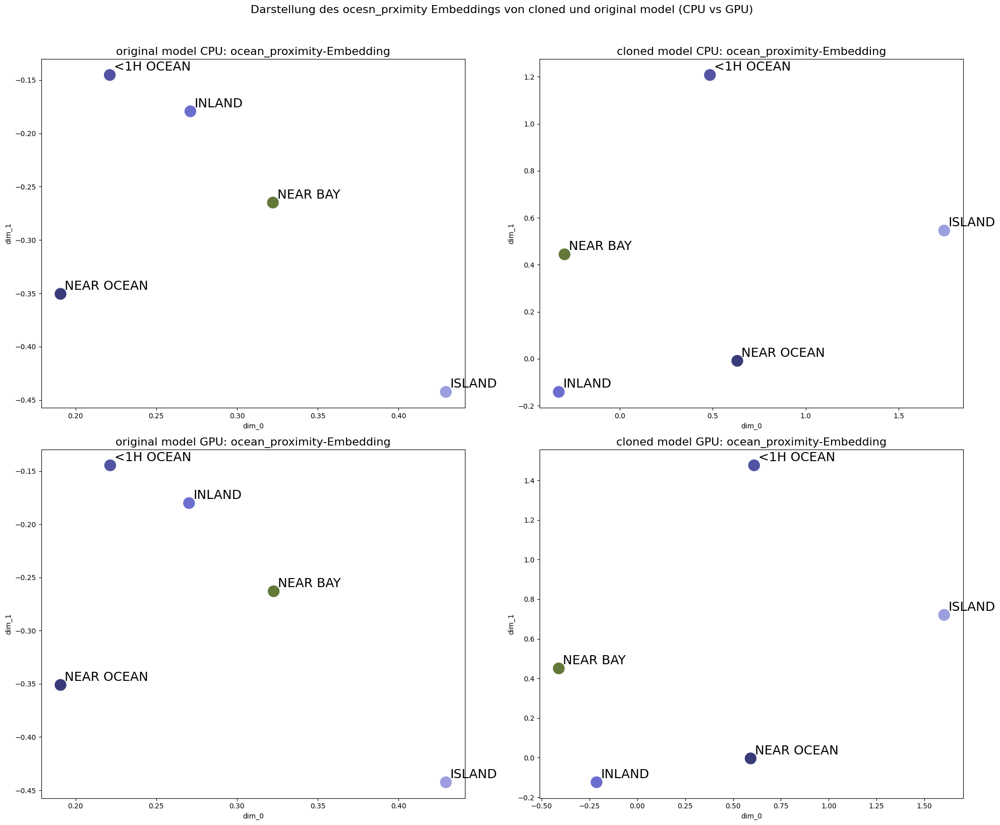

In [71]:
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
ax1 = axs[0, 0]
ax2 = axs[0, 1]
ax3 = axs[1, 0]
ax4 = axs[1, 1]
emb_O_cpu.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_O_cpu)], s=250, ax=ax1)
emb_O_clo.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_O_clo)], s=250, ax=ax2)
emb_O_gpu.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_O_gpu)], s=250, ax=ax3)
emb_O_gpu_clo.plot(kind="scatter", x="dim_0", y="dim_1", c=plt.get_cmap("tab20b").colors[:len(emb_O_gpu_clo)], s=250, ax=ax4)

def annotate(row, ax=ax1, xytext = (6,6), size= 18):
    ax.annotate(row.name, row.values[:2],
                xytext=xytext,
                textcoords="offset points",
                size=size,
               )
    
emb_O_cpu.apply(lambda row: annotate(row,ax=ax1), axis="columns")
emb_O_clo.apply(lambda row: annotate(row,ax=ax2), axis="columns")
emb_O_gpu.apply(lambda row: annotate(row,ax=ax3), axis="columns")
emb_O_gpu_clo.apply(lambda row: annotate(row,ax=ax4), axis="columns")


# patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=(3*plt.get_cmap("tab20b").colors)[i])[0] for i, key in enumerate(emb_C.index)]
# ax2.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_C.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
# ax4.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_N.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
# plt.subplots_adjust(right=0.65)
ax1.set_title("original model CPU: ocean_proximity-Embedding", fontdict={"fontsize": 16})
ax2.set_title("cloned model CPU: ocean_proximity-Embedding", fontdict={"fontsize": 16})
ax3.set_title("original model GPU: ocean_proximity-Embedding", fontdict={"fontsize": 16})
ax4.set_title("cloned model GPU: ocean_proximity-Embedding", fontdict={"fontsize": 16})

fig.suptitle('Darstellung des ocesn_prximity Embeddings von cloned und original model (CPU vs GPU)', fontsize=16, y=1.02)
plt.tight_layout() 
plt.show()

Die original neuronalen Netze von Aufgabe B3 liefern das gleiche Ergebnis hinsichtlich der Embeddings von *ocean_proximity*. Lediglich beim geklonten Modell liegen die Level (deutlich erkennbar an INLAND und <1H OCEAN) etwas versetzt und zeigen nicht das gleiche Bild bei CPU und GPU. 

In [53]:
# get weights for county_name:
emb_C_cpu = NN_B3_cpu.layers[3] 
emb_C_cpu = pd.DataFrame(emb_C_cpu.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C_cpu["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C_cpu = emb_C_cpu.set_index("county_name")
emb_C_cpu = emb_C_cpu.sort_index()

emb_C_clo = NN_B3_cloned_cpu.layers[3] 
emb_C_clo = pd.DataFrame(emb_C_clo.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C_clo["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C_clo = emb_C_clo.set_index("county_name")
emb_C_clo = emb_C_clo.sort_index()

emb_C_gpu = NN_B3_gpu.layers[3] 
emb_C_gpu = pd.DataFrame(emb_C_gpu.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C_gpu["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C_gpu = emb_C_gpu.set_index("county_name")
emb_C_gpu = emb_C_gpu.sort_index()

emb_C_gpu_clo = NN_B3_cloned_gpu.layers[3] 
emb_C_gpu_clo = pd.DataFrame(emb_C_gpu_clo.get_weights()[0], columns=["dim_0", "dim_1"])
emb_C_gpu_clo["county_name"] = x_train.groupby("county_nameX").county_nameX.last()
emb_C_gpu_clo = emb_C_gpu_clo.set_index("county_name")
emb_C_gpu_clo = emb_C_gpu_clo.sort_index()

county_info = x_train.groupby("county_nameX").county_name.last().to_dict()

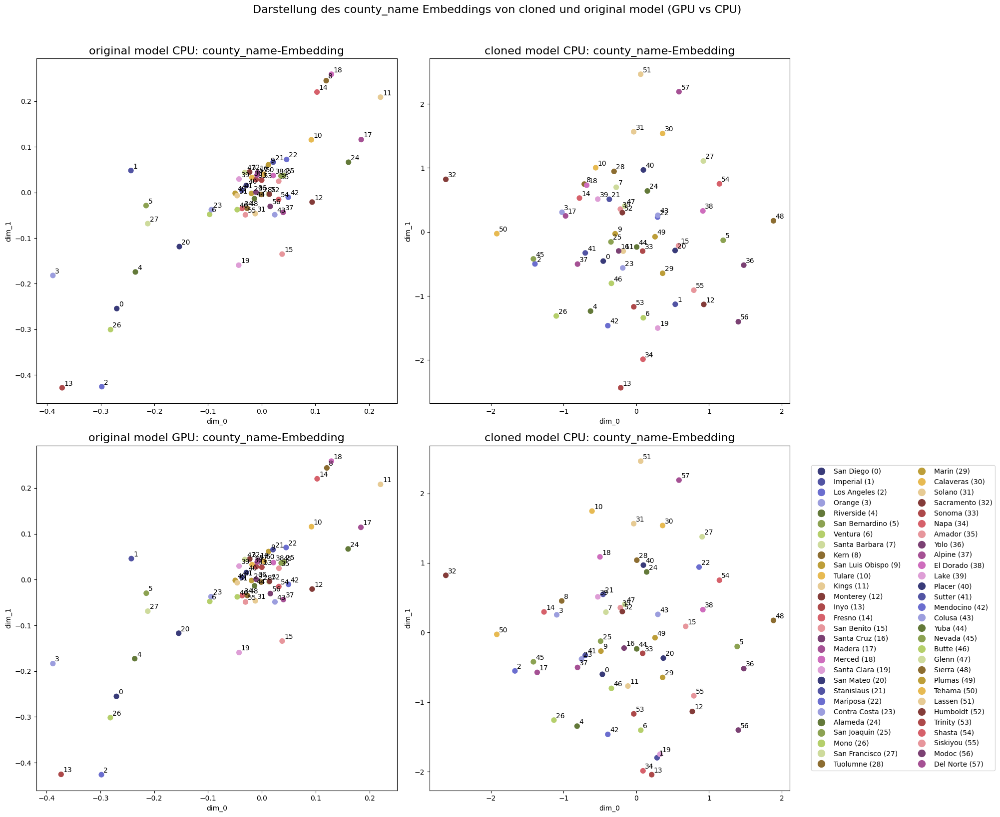

In [54]:
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
ax1 = axs[0, 0]
ax2 = axs[0, 1]
ax3 = axs[1, 0]
ax4 = axs[1, 1]
emb_C_cpu.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C_cpu)], s=50, ax=ax1)
emb_C_clo.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C_clo)], s=50, ax=ax2)
emb_C_gpu.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C_gpu)], s=50, ax=ax3)
emb_C_gpu_clo.plot(kind="scatter", x="dim_0", y="dim_1", c=(3*plt.get_cmap("tab20b").colors)[:len(emb_C_gpu_clo)], s=50, ax=ax4)

def annotate(row, ax=ax1, xytext = (6,6), size= 18):
    ax.annotate(row.name, row.values[:2],
                xytext=xytext,
                textcoords="offset points",
                size=size,
               )
    
emb_C_cpu.apply(lambda row: annotate(row, ax=ax1, xytext = (3,3), size= 10), axis="columns")
emb_C_clo.apply(lambda row: annotate(row, ax=ax2, xytext = (3,3), size= 10), axis="columns")
emb_C_gpu.apply(lambda row: annotate(row, ax=ax3, xytext = (3,3), size= 10), axis="columns")
emb_C_gpu_clo.apply(lambda row: annotate(row, ax=ax4, xytext = (3,3), size= 10), axis="columns")


patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=(3*plt.get_cmap("tab20b").colors)[i])[0] for i, key in enumerate(emb_C_clo.index)]
plt.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_C_clo.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
#ax4.legend(handles=patches, labels=[f"{county_info[key]} ({key})" for key in emb_N.index], bbox_to_anchor=(1.05, 0.5), loc='center left', ncol=2)
plt.subplots_adjust(right=0.65)
ax1.set_title("original model CPU: county_name-Embedding", fontdict={"fontsize": 16})
ax2.set_title("cloned model CPU: county_name-Embedding", fontdict={"fontsize": 16})
ax3.set_title("original model GPU: county_name-Embedding", fontdict={"fontsize": 16})
ax4.set_title("cloned model CPU: county_name-Embedding", fontdict={"fontsize": 16})

fig.suptitle('Darstellung des county_name Embeddings von cloned und original model (GPU vs CPU)', fontsize=16, y=1.02)
plt.tight_layout() 
plt.show()

Auch hier liefern die original neuronalen Netze von Aufgabe B3 das gleiche Ergebnis hinsichtlich der Embeddings von *county_name*. Lediglich beim geklonten Modell liegen die Level etwas versetzt und zeigen nicht das gleiche Bild bei CPU und GPU. Die Ergebnisse sind dennoch sehr ähnlich. 

Unterschiede zwischen CPU- und GPU-Embeddings könnten auf verschiedene Faktoren zurückzuführen sein, wie etwa unterschiedliche Initialisierungen der Modellgewichte oder Präzisionsunterschiede zwischen CPU- und GPU-Berechnungen. CPUs und GPUs verarbeiten Berechnungen auf unterschiedliche Weise, und bestimmte Operationen können auf einer GPU schneller oder genauer ausgeführt werden als auf einer CPU.
Neuronale Netze können unterschiedliche Ergebnisse liefern, wenn sie mit unterschiedlichen Zufallszahlen initialisiert werden oder wenn die Daten in unterschiedlicher Reihenfolge verarbeitet werden.

##### d) Die Laufzeiten und Performance der CPU- und GPU-Ausführung sind anschaulich zu vergleichen und die Unterschiede sind zu interpretieren. 

<u>Lösungsansatz</u>

Zunächst einmal werden die Laufzeiten von CPU AWS und GPU auf kaggle miteinander verglichen. Hierbei werden nur die Modelle berücksichtigt, die auch tatsächlich geändert wurden, also die Gradient Boosting Modelle und die neuronalen Netze. 

In [55]:
dict_gpu = pd.read_csv(os.path.join(files_path, f'model_Laufzeit_RMSE_gpu.csv'))
model_name =  dict_gpu['Model name']
model_rmse =  dict_gpu['RMSE']
model_laufzeit = dict_gpu['Laufzeit']
laufzeiten_gpu = pd.read_csv(os.path.join(files_path, f'Laufzeiten_gpu.csv'))

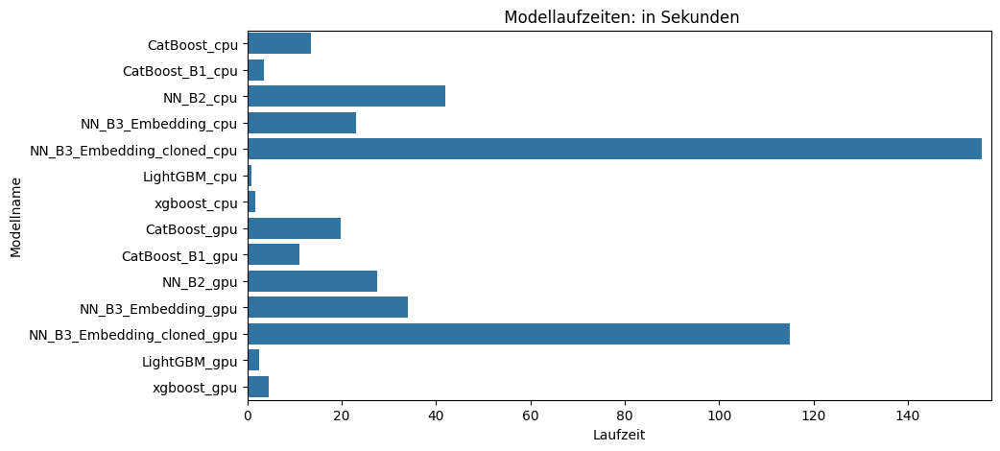

In [56]:
model_name_cpu.pop(0)
model_rmse_cpu.pop(0)
model_laufzeit_cpu.pop(0)
model_name.pop(0)
model_rmse.pop(0)
model_laufzeit.pop(0)
dict = {'Model name': list(model_name_cpu) + list(model_name),'RMSE': list(model_rmse_cpu) + list(model_rmse), 'Laufzeit': list(model_laufzeit_cpu) + list(model_laufzeit)}
plot_laufzeit(dict,0,max(model_laufzeit_cpu)+2, "in Sekunden")

Es lässt sich aus dieser Grafik keine eindeutige Aussage machen, ob die Laufzeit auf GPU das Projekt schneller gemacht haben. Beispielsweise benötigt CatBoost länger zum durchlaufen. Die neuronalen Netze wiederum laufen schneller durch. Hier ist zu beachten, dass das neuronale Netz basierend auf Embeddings nicht schneller ist, sondern mehr Zeit in Anspruch nimmt. 

LightGBM und xgboost sind ebenfalls auf der CPU von AWS schneller. Basierend aus dieser Grafik ist die CPU als Gewinner hervorzuheben. 

Dies ist nicht das zu erwartende Resultat, das GPUs für parallele Berechnungen optimiert sind und daher in der Regel viel schneller bei der Ausführung von Deep-Learning Modellen sind als CPUs. 

Dies könnte an der Besonderheit der AWS liegen. Deswegen wurde der Vergleich auch mit der CPU von kaggle gemacht. 

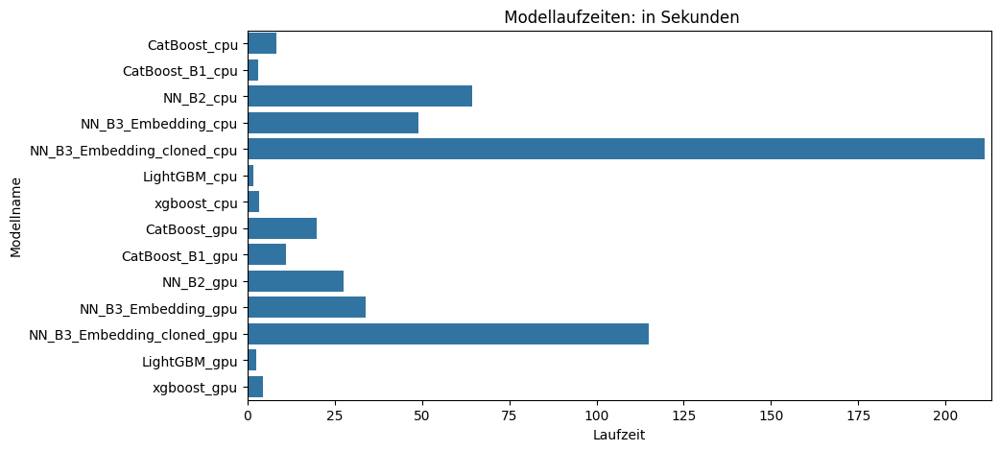

In [57]:
model_name_cpu_kaggle.pop(0)
model_rmse_cpu_kaggle.pop(0)
model_laufzeit_cpu_kaggle.pop(0)
dict_kaggle = {'Model name': list(model_name_cpu_kaggle) + list(model_name),'RMSE': list(model_rmse_cpu_kaggle) + list(model_rmse), 'Laufzeit': list(model_laufzeit_cpu_kaggle) + list(model_laufzeit)}
plot_laufzeit(dict_kaggle,0,max(model_laufzeit_cpu_kaggle)+2, "in Sekunden")


Doch auch hier zeichnet sich ein ähnliches Bild ab. Allerdings ist die GPU nun auf allen Neuronalen Netzen schneller. Für die Gradient Boosting Modelle ergibt sich jedoch eine langsamere Ausführung. 
Es ist zu beachten, dass GPUs in der Regel einen geringeren internen Speicher haben. Folglich mussten in diesem Code einige memory issues beim Lauf auf der GPU behoben werden und einige Zwischenschritte gellöscht werden beziehungsweise mit dem garbage collector gearbeitet werden. 
Des Weiteren gilt die Initialisierung der GPU zu prüfen, ob diese korrekt durchgeführt wurde. Hier wurde kein offensichtliches Problem festgestellt. Man könnte auch die 2. GPU von kaggle nutzen, aufgrund der fortgeschrittenen Zeit wurde hierauf allerdings in der Klausur verzichtet. 

Nachfolgend wurden auch Laufzeiten der Teile A und B der verschiedenen Resosurcen miteinander verglichen. Es wurde sich auf diese beiden Teile beschränkt, da nur hier die Methode von CPU auf GPU Berechnung geändert wurde. 

In [64]:
laufzeiten_gpu.iloc[0:2,]

,Aufgabe,Laufzeit
0,Teil A,184.045455
1,Teil B,2721.646316


In [63]:
laufzeiten_cpu_kaggle.iloc[0:2,]

,Aufgabe,Laufzeit
0,Teil A,129.094955
1,Teil B,3394.642239


In [65]:
laufzeiten_cpu.iloc[0:2,]

,Aufgabe,Laufzeit
0,Teil A,46.393362
1,Teil B,1647.720617


In [76]:
pname = ['CPU', 'CPU Kaggle', 'GPU']

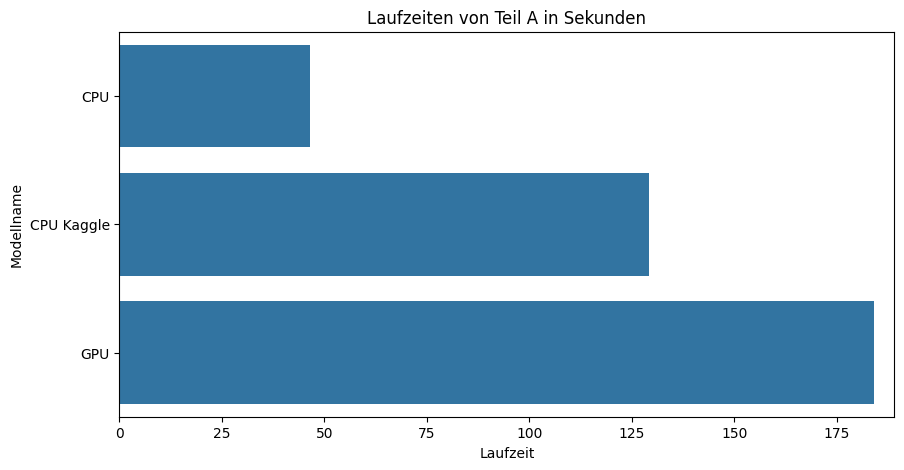

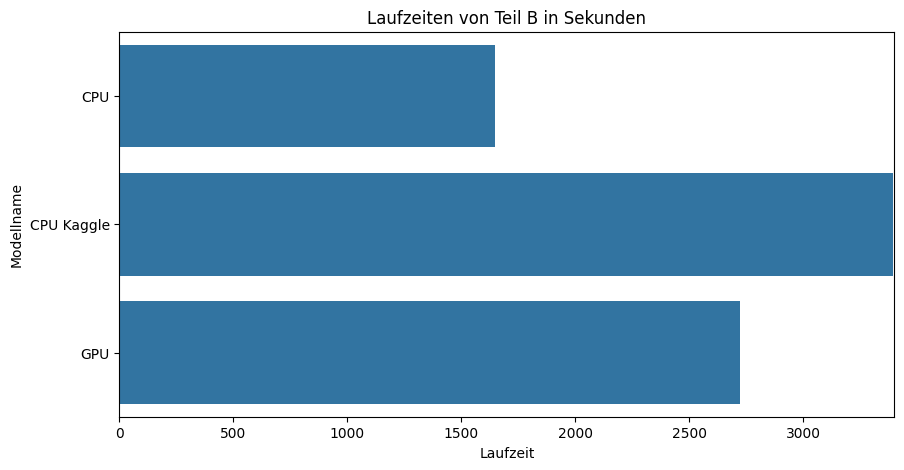

In [91]:
for i in ['Teil A', 'Teil B']:
    series = []
    laufzeit_dict = {'Prozessor': pname, 'Laufzeit': series}
    series.append(laufzeiten_cpu.loc[laufzeiten_cpu['Aufgabe'] == i, 'Laufzeit'].values[0])
    series.append(laufzeiten_cpu_kaggle.loc[laufzeiten_cpu_kaggle['Aufgabe'] == i, 'Laufzeit'].values[0])
    series.append(laufzeiten_gpu.loc[laufzeiten_gpu['Aufgabe'] == i, 'Laufzeit'].values[0])

    plt.figure(figsize=(10, 5))
    plt.title(f"Laufzeiten von {i} in Sekunden")
    sns.barplot(data = pd.DataFrame(laufzeit_dict), x = "Laufzeit", y = "Prozessor")
    plt.xlim(0,max(series)+5)
    plt.xlabel('Laufzeit')
    plt.ylabel('Modellname')
    plt.show()

Teil A wird bis auf die CatBoost Modelle in allen Teilen auf der CPU ausgeführt. Da die CPU der AWS mehr Power hat als die von kaggle ergibt sich hierfür die kürzeste Laufzeit. Es wurde bereits oben festgehalten, dass die Gradient Boosting Algorithmen auf der GPU eine längere Laufzeit aufweisen. Somit ergibt sich für die GPU bei Teil A die längste Laufzeit.

Teil B wiederum nutzt viele neuronale Netze. Hier hat die GPU im Vergleich zur CPU auf kaggle Vorteile, was sich auch in einer geringeren Laufzeit zeigt. 
Die CPU von der AWS schneidet allerdings besser ab und hat auch für Teil B die beste Laufzeit. 

##### e) Als Gesamtfazit sind Empfehlungen hinsichtlich der verwendeten Modelle, grafischen Darstellungen und Rechenumgebungen (CPU/GPU) abzuleiten.

<u>Lösungsansatz</u>

Den Code initial für Kaggle bereitzustellen, erforderte viel Zeit und war nicht straightforward aufgrund einiger kleinerer Probleme. Hier sind unter anderem zu nennen, dass die Pakete nicht in der richtigen Version vorlagen und zunächst installiert werden mussten. Ebenso konnte kein requirements.txt-File, welches mit Conda erstellt wurde, herangezogen werden. Es mussten Pakete sein, die auf PyPi zur Verfügung stehen.

Anschließend gab es das Problem, dass Kaggle auf meinem Arbeitslaptop nicht lief, da das alleinige Aufrufen der Webseite CPU, Memory und Disk überforderte. In meinem Unternehmen werden einfache Laptops mit minimalen Ressourcen genutzt, da diese nur benötigt werden, um sich mit der Cloud für Berechnungen zu verbinden.

Folglich musste ein "neuer" Computer her, um das Notebook auf Kaggle auch bearbeiten zu können. Hierfür wurde ein PC eines Freundes geliehen. Allein dieser Umstand zeigt für mich, dass Kaggle erstmal keine Alternative darstellt.

Wie oben erwähnt, mussten die Memory-Probleme auf Kaggle durch das Einfügen von Löschbefehlen und die Nutzung des Garbage Collectors gelöst werden. Dies sind grundsätzliche Pfeiler der effizienten Programmierung. Der Vorteil der großen AWS-Maschinen ist aber auch, dass man zunächst Code testen kann, ohne sich hierüber Gedanken machen zu müssen, und erst im Nachgang sich um die Optimierung kümmern muss. Da die Klausur auf einem relativ kleinen Datensatz ausgeführt wurde, wurde hier wenig auf effiziente Programmierung geachtet, was in Kaggle aber nötig wurde.

Die Laufzeitvergleiche von oben zeigen ebenso, dass die CPU der AWS schneller rechnet und somit als Gewinner hervorgeht.

Bezüglich der Modelle zeigen XGBoost und LightGBM zwar die besten Ergebnisse, doch auch hier ist die Vergleichbarkeit nicht unbedingt gegeben, da für die anderen Modelle keine Hyperparameteroptimierung durchgeführt wurde. Auch die beiden Strategien bei diesen Modellen sind nur bedingt vergleichbar. Ein Vergleich sollte entweder bezüglich der Strategie der Auswahl der Hyperparameter oder bezüglich unterschiedlicher Modelle stattfinden. In dieser Klausur wurde jedoch alles vermischt. Sich auf Basis dessen für ein Modell klar zu entscheiden, erachte ich als nicht korrekt. Meine Empfehlung wäre, sich die Gradient Boosting Modelle nochmals detaillierter anzuschauen.

Die grafische Darstellung der Gradient Boosting Modelle zeigt die Feature Importance. Zur besseren Beurteilung des Einflusses wären noch Partial Dependency Plots oder SHAP Values zu empfehlen. Diese bieten einen Einblick in die "Blackbox" der Modelle und dienen dazu, das Modell besser zu verstehen.

Beim neuronalen Netz habe ich zwar oben den Aufbau geplottet, dieser war allerdings nicht Teil der Klausur. Es ist dennoch empfehlenswert, sich die Architektur anzusehen. Ebenso wären auch hier Auswirkungen in ggf. univariaten Plots hilfreich. Die gezeigten Embeddings geben zwar eine Idee bezüglich kategorialer Variablen, allerdings ist die Reaktion oder Wichtigkeit der einzelnen numerischen Features unbekannt. Auch hier können SHAP und LIME Values unterstützen. LIME (Local Interpretable Model-Agnostic Explanations) dient der Erklärung von Modellen unabhängig von der Implementierung bzw. des spezifischen Problems (Klassifikations- und Regressionsprobleme). Die Grundidee besteht darin, das Modell lokal zu interpretieren. Dazu zieht LIME zufällig mehrere Datenpunkte mit den vom Modell erzielten Ergebnissen und gewichtet diese entsprechend ihrer Nähe zu dem Datenpunkt, dessen Ergebnis erklärt werden soll. Mit diesen Datenpunkten wird nun ein einfaches, interpretierbares Modell (z.B. eine lineare Regression/ein Regressionsbaum) trainiert.

Bei der linearen Regression erkennt man den Einfluss einer jeden Kovariablen bereits direkt in der Summary-Statistik. Hier lässt sich auch ablesen, ob die Variable signifikant ist. Eine grafische Ergänzung könnten hier noch univariate Plots mit der Prognose und Beobachtung sein.

[Zurück zum Inhaltsverzeichnis](#abschnitt-0)